# 8b Catalog scatter plots
Non-map catalog plots split from notebook 8. Plot code is unchanged; only notebook organization changed.


In [1]:
from pathlib import Path
import sys

_here = Path.cwd().resolve()
_candidates = (_here, *_here.parents)
REPO_ROOT = next((candidate for candidate in _candidates if (candidate / "m33_pipeline").is_dir()), None)
if REPO_ROOT is None:
    raise RuntimeError(f"Could not locate repo root from {Path.cwd()}")
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from m33_pipeline.notebook_setup import prepare_notebook

REPO_ROOT = prepare_notebook(REPO_ROOT)
print(f"Notebook working directory set to: {REPO_ROOT}")

Notebook working directory set to: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1


In [2]:
import numpy as np
import pandas as pd
from pathlib import Path
from astropy.io import fits
from astropy.wcs import WCS
import astropy.units as u
import astropy.constants as c
import pyneb as pn
import matplotlib.pyplot as plt
HAS_PYNEB=True
from astropy.coordinates import SkyCoord, SkyOffsetFrame
from astropy.visualization import AsinhStretch, PercentileInterval
from skimage.segmentation import find_boundaries
from matplotlib import cm, patches
from skimage.measure import find_contours
from matplotlib.patches import ConnectionPatch
from scipy.optimize import curve_fit
from types import SimpleNamespace
import os
import shutil
import re
import matplotlib as mpl
import matplotlib.colors as mcolors
import seaborn as sns

from m33_pipeline.reporting import (
    add_fit_values,
    add_duplicate_region_values,
    add_halpha_flux_partition_values,
    build_catalog_number_values,
    format_value,
    load_snr_catalog,
    load_wr_catalog,
    write_latex_commands,
)
from m33_pipeline.planetary_nebulae import crossmatch_pne_to_hii_boundaries

plt.rcParams.update({
    "font.family": "serif",
    "mathtext.fontset": "cm",
    "axes.linewidth": 1.5,
    "xtick.direction": "in",
    "ytick.direction": "in",
})

plt.rcParams["text.usetex"] = False

plt.rc('text', usetex=False)
plt.rc('font', family='serif', size=20)

plt.rc('xtick', direction='in', top=True)
plt.rc('ytick', direction='in', right=True)
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.visible'] = True

from m33_pipeline import paths


In [3]:
# Toggle this to also copy selected final figures into PAPER_PLOTS_DRAFT1.
SAVE_FOR_PAPER = True
PAPER_DRAFT_DIR = Path(globals().get('REPO_ROOT', globals().get('ROOT', Path.cwd()))) / 'PAPER_PLOTS_DRAFT1'
PAPER_FIGURE_EXPORTS = {'M33_HII_radial_gradients_multipanel_with_histograms.png': 'M33_radial_gradients_histogram.png', 'M33_allfields_BPT_SNR3_SF_black_gray_compact_objects.png': 'M33_BPT.png', 'M33_HII_Halpha_luminosity_function_correction_comparison_empirical_pdf.png': 'M33_LF_slopes.png', 'M33_HII_L_Ha_sum_dered_vs_areaeq.png': 'M33_L_R.png', 'M33_metallicity_calibrations_paper_multipanel.png': 'M33_metallicity_gradients_selected.png', 'M33_metallicity_vs_logU_pressure_grid.png': 'M33_metallicity_vs_logU_pressure_grid.png', 'M33_metallicity_calibrations_all_indicators_multipanel.png': 'M33_metallicity_calibrations_all_indicators_multipanel.png'}

def save_for_paper(source_path, draft_filename=None):
    if not SAVE_FOR_PAPER:
        return None
    source_path = Path(source_path)
    target_name = draft_filename or PAPER_FIGURE_EXPORTS.get(source_path.name)
    if target_name is None:
        return None
    import shutil
    PAPER_DRAFT_DIR.mkdir(parents=True, exist_ok=True)
    target_path = PAPER_DRAFT_DIR / target_name
    shutil.copyfile(source_path, target_path)
    print(f'Saved paper draft figure: {target_path}')
    return target_path


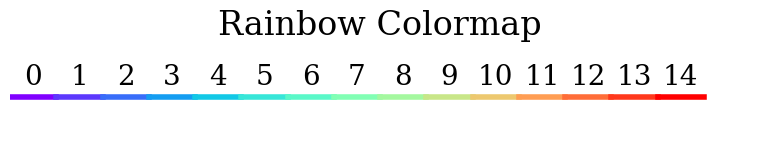

In [4]:
#make a list of 15 evenly spaced colours from the rainbow cmap to be used in all plots
cmap = plt.get_cmap('rainbow')
colors = [cmap(i) for i in np.linspace(0, 1, 15)]
#show the colours
plt.figure(figsize=(8, 2))
for i, color in enumerate(colors):
    plt.plot([i, i + 1], [0, 0], color=color, lw=4)
#label each colour with its index
for i in range(len(colors)):
    plt.text(i + 0.5, 0.1, str(i), ha='center', va='bottom')
plt.xlim(0, len(colors) + 1)
plt.ylim(-1, 1)
plt.axis('off')
plt.title('Rainbow Colormap')
plt.tight_layout()

# Shared plot colors. Non-metallicity catalog-property plots use the green-to-red
# part of rainbow; metallicity plots use a separate blue-purple rainbow slice.
property_cmap = plt.get_cmap('rainbow')
property_color_positions = {
    'sum_A_V': 0.38,
    'L_Ha_sum_dered': 0.52,
    'ne_SII_cm3': 0.66,
    'logU_KK04': 0.76,
    'log_P_thermal_SII_over_k': 0.86,
    'radius_areaeq_pc': 0.94,
}
color_dic = {key: property_cmap(pos) for key, pos in property_color_positions.items()}
lf_comparison_colors = {
    'pre_dig': property_cmap(0.48),
    'dig_corrected': color_dic['L_Ha_sum_dered'],
}



In [5]:
# load in the latest HII region catalog
catalog_method = 'summed_map'  # options: integrated_spectrum, summed_map
catalog_dig_mode = 'dig_subtracted'  # options: dig_subtracted, no_dig
catalog_variant = 'combined'  # options: combined, metallicity, ionization_parameter, density, other_derived, clustering
primary_only = True
field_catalog_pattern = f"flux_catalogs/{catalog_method}/{catalog_dig_mode}/flux_catalog_{{FIELD}}.csv"

plot_root = Path("PAPER_PLOTS") / catalog_method / catalog_dig_mode
plot_root.mkdir(parents=True, exist_ok=True)

def paper_plot_path(filename, subdir=None):
    outdir = plot_root if subdir is None else plot_root / subdir
    outdir.mkdir(parents=True, exist_ok=True)
    return outdir / filename

def resolve_catalog_path(method, dig_mode, variant):
    base_dir = Path("CATALOGS") / "flux_catalogs" / method / dig_mode
    if variant == "combined":
        if hasattr(paths, "combined_catalog_csv"):
            return paths.combined_catalog_csv(method=method, dig_mode=dig_mode)
        return base_dir / "total_flux_catalog_combined.csv"
    if variant == "clustering":
        if hasattr(paths, "derived_catalog_csv"):
            return paths.derived_catalog_csv("clustering", method=method, dig_mode=dig_mode)
        return base_dir / "derived" / "total_flux_catalog_clustering.csv"
    if hasattr(paths, "derived_catalog_csv"):
        return paths.derived_catalog_csv(variant, method=method, dig_mode=dig_mode)
    return base_dir / "derived" / f"total_flux_catalog_{variant}.csv"

def load_catalog_with_field_fallback(method, dig_mode, variant):
    """Load the requested total catalog, or concatenate the available field catalogs."""
    cat_path = resolve_catalog_path(method, dig_mode, variant)
    if cat_path.exists():
        return pd.read_csv(cat_path), str(cat_path)

    base_dir = Path("CATALOGS") / "flux_catalogs" / method / dig_mode
    field_paths = sorted(base_dir.glob("flux_catalog_*.csv"))
    if not field_paths:
        raise FileNotFoundError(
            f"Could not find {cat_path} or any field catalogs in {base_dir}"
        )

    field_catalogs = []
    for field_path in field_paths:
        field_cat = pd.read_csv(field_path)
        if "field" not in field_cat.columns:
            field_cat["field"] = field_path.stem.removeprefix("flux_catalog_")
        field_catalogs.append(field_cat)

    source = f"{len(field_paths)} available field catalog(s) from {base_dir}"
    return pd.concat(field_catalogs, ignore_index=True, sort=False), source



def _sync_overlap_duplicate_flags_from_reference(df, method, selected_dig_mode, reference_dig_mode='dig_subtracted'):
    """Use one overlap-duplicate solution for all flux-correction catalog variants."""
    duplicate_cols = [
        'duplicate_group_id',
        'duplicate_group_size',
        'is_duplicate_overlap',
        'duplicate_peak_overlap',
        'duplicate_boundary_overlap',
        'duplicated',
        'primary',
        'primary_rank',
        'primary_region_id',
        'duplicate_score_sum_snr',
        'duplicate_score_min_snr',
        'duplicate_score_median_snr',
        'duplicate_score_finite_nlines',
    ]
    boundary_count = int(df.get('duplicate_boundary_overlap', pd.Series(False, index=df.index)).fillna(False).astype(bool).sum())
    if boundary_count > 0:
        return df
    if selected_dig_mode == reference_dig_mode:
        return df

    ref_path = Path('CATALOGS') / 'flux_catalogs' / method / reference_dig_mode / 'total_flux_catalog_combined.csv'
    if not ref_path.exists():
        print(f'Overlap duplicate reference catalog not found: {ref_path}')
        return df
    ref = pd.read_csv(ref_path)
    key_cols = ['field', 'region_id']
    if not set(key_cols).issubset(df.columns) or not set(key_cols).issubset(ref.columns):
        print('Cannot sync overlap duplicate flags because field/region_id keys are missing.')
        return df
    available_cols = [col for col in duplicate_cols if col in ref.columns]
    if not available_cols:
        print(f'No overlap duplicate columns found in reference catalog: {ref_path}')
        return df

    out = df.drop(columns=[col for col in available_cols if col in df.columns], errors='ignore')
    out = out.merge(ref[key_cols + available_cols], on=key_cols, how='left', validate='one_to_one')
    if 'primary' in out.columns:
        out['primary'] = out['primary'].fillna(True).astype(bool)
    new_boundary_count = int(out.get('duplicate_boundary_overlap', pd.Series(False, index=out.index)).fillna(False).astype(bool).sum())
    new_non_primary = int((~out['primary'].fillna(True).astype(bool)).sum()) if 'primary' in out.columns else 0
    print(
        f'Synced overlap duplicate flags from {ref_path}: '
        f'{new_boundary_count} boundary-overlap rows, {new_non_primary} non-primary rows.'
    )
    return out

cat, cat_source = load_catalog_with_field_fallback(catalog_method, catalog_dig_mode, catalog_variant)
cat = _sync_overlap_duplicate_flags_from_reference(cat, catalog_method, catalog_dig_mode)
cat_before_primary_filter = cat.copy()
pn_catalog_path = Path('CATALOGS/planetary_nebulae/M33_PNe_combined_deduplicated.csv')
if pn_catalog_path.exists():
    pn_catalog = pd.read_csv(pn_catalog_path)
    pn_hii_matches, cat = crossmatch_pne_to_hii_boundaries(cat, pn_catalog)
    pn_match_path = Path('CATALOGS/planetary_nebulae/M33_PNe_HII_region_crossmatch.csv')
    pn_match_path.parent.mkdir(parents=True, exist_ok=True)
    pn_hii_matches.to_csv(pn_match_path, index=False)
    pn_derived_path = Path('CATALOGS/flux_catalogs') / catalog_method / catalog_dig_mode / 'derived' / 'total_flux_catalog_pn_crossmatch.csv'
    pn_derived_path.parent.mkdir(parents=True, exist_ok=True)
    cat.to_csv(pn_derived_path, index=False)
    print(f'PN boundary crossmatch: {cat["has_pn_in_boundary"].sum()} HII regions contain at least one PN.')
else:
    pn_catalog = pd.DataFrame()
    print(f'PN catalog not found: {pn_catalog_path}')
if primary_only and 'primary' in cat.columns:
    n_before = len(cat)
    n_non_primary = int((~cat['primary'].fillna(True)).sum())
    cat = cat.loc[cat['primary'].fillna(True)].copy().reset_index(drop=True)
    print(f"Primary-only filtering enabled: removed {n_non_primary} non-primary duplicate rows; {len(cat)} / {n_before} rows kept.")
elif primary_only:
    print("Primary-only filtering requested, but no 'primary' column exists in this catalog.")

def positive_halpha_snr_catalog(df, label='catalog', quiet=False):
    snr_col = next((col for col in [
        'SNR_Halpha_sum',
        'SNR_Halpha_sum_nodig',
        'Halpha_SNR',
        'Halpha_SNR_raw',
        'Halpha_SNR_obs',
    ] if col in df.columns), None)
    if snr_col is None:
        raise KeyError('Cannot apply Halpha S/N > 0 catalog cut: no Halpha S/N column found.')
    snr_values = pd.to_numeric(df[snr_col], errors='coerce')
    out = df.loc[snr_values > 0].copy().reset_index(drop=True)
    if not quiet:
        print(f'Halpha S/N > 0 filtering for {label} using {snr_col}: kept {len(out)} / {len(df)} rows.')
    return out

# Keep only regions with positive observed Halpha signal-to-noise.
cat = positive_halpha_snr_catalog(cat, label='notebook 8b plotting catalog')

print(f"Catalog loaded from {cat_source} with {len(cat.columns)} columns.")
print(f"Plots will be saved under {plot_root}")
for col in cat.columns:
    print(col)


PN boundary crossmatch: 85 HII regions contain at least one PN.
Primary-only filtering enabled: removed 521 non-primary duplicate rows; 5902 / 6423 rows kept.
Halpha S/N > 0 filtering for notebook 8b plotting catalog using SNR_Halpha_sum: kept 5893 / 5902 rows.
Catalog loaded from /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/CATALOGS/flux_catalogs/summed_map/dig_subtracted/total_flux_catalog_combined.csv with 493 columns.
Plots will be saved under PAPER_PLOTS/summed_map/dig_subtracted
region_id
npix_region
npix_dig_annulus
dig_annulus_inner_px
dig_annulus_width_px
dig_annulus_outer_px
dig_annulus_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_local_median
Halpha_dig_method
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
Halpha_dig_model_sum
Halpha_dig_subtracted_sum
Halpha_dig_fraction_raw
Halpha_dig_background_smooth_sigma_px
Halpha_dig_max_subtraction_fraction
F_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e

In [6]:
# Star-forming region definition used throughout this notebook.
# Change this one block, then rerun the notebook to switch the selection.
#
# Examples:
#   STAR_FORMING_DEFINITION = {"mode": "bpt"}
#   STAR_FORMING_DEFINITION = {"mode": "sii_ha", "sii_ha_max": 0.4}
#
# For sii_ha mode, sii_ha_max is the linear ratio
# ([SII]6716 + [SII]6731) / Halpha.
STAR_FORMING_DEFINITION = {
    "mode": "bpt",             # options: "bpt", "sii_ha"
    "sii_ha_max": 0.4,      # used only when mode == "sii_ha"
}
STAR_FORMING_SNR_CUT = 3.0


def _first_present_column(df, candidates):
    for col in candidates:
        if col in df.columns:
            return col
    return None


def _numeric_column(df, candidates):
    col = _first_present_column(df, candidates)
    if col is None:
        return np.full(len(df), np.nan, dtype=float), None
    return pd.to_numeric(df[col], errors="coerce").to_numpy(dtype=float), col


def _selected_sii_ha_ratio(df):
    ha, ha_col = _numeric_column(df, [
        "F_Halpha_sum_dered",
        "F_Halpha_sum_digsub",
        "F_Halpha_sum",
        "F_Halpha_sum_nodig",
    ])
    sii6716, sii6716_col = _numeric_column(df, [
        "F_[SII]6716_sum_dered",
        "F_[SII]6716_sum_digsub",
        "F_[SII]6716_sum",
        "F_[SII]6716_sum_nodig",
    ])
    sii6731, sii6731_col = _numeric_column(df, [
        "F_[SII]6731_sum_dered",
        "F_[SII]6731_sum_digsub",
        "F_[SII]6731_sum",
        "F_[SII]6731_sum_nodig",
    ])
    with np.errstate(divide="ignore", invalid="ignore"):
        ratio = (sii6716 + sii6731) / ha
    ratio = np.where(np.isfinite(ratio) & (ha > 0) & (sii6716 > 0) & (sii6731 > 0), ratio, np.nan)
    return ratio, {"Halpha": ha_col, "SII6716": sii6716_col, "SII6731": sii6731_col}


def selected_star_forming_mask(df, definition=None):
    definition = dict(STAR_FORMING_DEFINITION if definition is None else definition)
    mode = str(definition.get("mode", "bpt")).strip().lower()
    if mode == "bpt":
        if "BPT_class_sum_dered" not in df.columns:
            return np.zeros(len(df), dtype=bool)
        return df["BPT_class_sum_dered"].astype(str).str.strip().eq("Star-forming").to_numpy(dtype=bool)
    if mode == "sii_ha":
        ratio, _ = _selected_sii_ha_ratio(df)
        max_ratio = float(definition.get("sii_ha_max", 0.4))
        return np.isfinite(ratio) & (ratio < max_ratio)
    raise ValueError(f"Unknown STAR_FORMING_DEFINITION mode: {mode!r}")


def selected_star_forming_snr_mask(df, snr_cut=None, definition=None):
    snr_cut = STAR_FORMING_SNR_CUT if snr_cut is None else snr_cut
    if "all_lines_snr_mask" in globals():
        snr_mask = all_lines_snr_mask(df, snr_cut=snr_cut)
    elif "_all_bpt_lines_snr_mask_for_plotting" in globals():
        snr_mask = _all_bpt_lines_snr_mask_for_plotting(df, snr_cut=snr_cut)
    else:
        snr_cols = [
            "SNR_Halpha_sum",
            "SNR_Hbeta_sum",
            "SNR_[OIII]5007_sum",
            "SNR_[SII]6716_sum",
            "SNR_[NII]6583_sum",
        ]
        snr_mask = np.ones(len(df), dtype=bool)
        for col in snr_cols:
            if col not in df.columns:
                snr_mask &= False
            else:
                snr_mask &= pd.to_numeric(df[col], errors="coerce").to_numpy(dtype=float) > snr_cut
    primary = df["primary"].fillna(True).astype(bool).to_numpy() if "primary" in df.columns else np.ones(len(df), dtype=bool)
    return selected_star_forming_mask(df, definition=definition) & snr_mask & primary


def star_forming_definition_label(definition=None):
    definition = dict(STAR_FORMING_DEFINITION if definition is None else definition)
    mode = str(definition.get("mode", "bpt")).strip().lower()
    if mode == "bpt":
        return "BPT star-forming"
    if mode == "sii_ha":
        return rf"[SII]/H$\alpha$ < {float(definition.get('sii_ha_max', 0.4)):.2f}"
    return mode

cat["selected_star_forming"] = selected_star_forming_mask(cat)
cat["selected_star_forming_snr"] = selected_star_forming_snr_mask(cat, snr_cut=STAR_FORMING_SNR_CUT)
print(f"Star-forming definition: {star_forming_definition_label()}")
print(f"Selected star-forming regions: {int(cat['selected_star_forming'].sum())} / {len(cat)}")
print(f"Selected star-forming regions with all-line S/N > {STAR_FORMING_SNR_CUT:g}: {int(cat['selected_star_forming_snr'].sum())} / {len(cat)}")



Star-forming definition: BPT star-forming
Selected star-forming regions: 5134 / 5893
Selected star-forming regions with all-line S/N > 3: 4578 / 5893


In [7]:
# Derived BPT diagnostic columns for testing alternate star-forming definitions.
# The high-OIII population is defined as primary, high-S/N, above the Kauffmann+03 line,
# and not currently BPT-classified as star-forming.
BPT_DIAGNOSTIC_SNR_CUT = 3.0
BPT_DIAGNOSTIC_SNR_LINES = [
    'Halpha',
    'Hbeta',
    '[OIII]5007',
    '[NII]6583',
    '[SII]6716',
    '[SII]6731',
    '[OII]3727',
]


def _diag_first_present_column(df, candidates):
    for col in candidates:
        if col in df.columns:
            return col
    return None


def _diag_numeric_column(df, candidates):
    col = _diag_first_present_column(df, candidates)
    if col is None:
        return np.full(len(df), np.nan, dtype=float), None
    return pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float), col


def _diag_flux(df, line_name):
    return _diag_numeric_column(df, [
        f'F_{line_name}_sum_dered',
        f'F_{line_name}_sum_digsub',
        f'F_{line_name}_sum',
        f'F_{line_name}_sum_nodig',
    ])


def _diag_snr(df, line_name):
    return _diag_numeric_column(df, [
        f'SNR_{line_name}_sum',
        f'SNR_{line_name}_sum_nodig',
    ])


def _diag_log_ratio(num, den):
    num = np.asarray(num, dtype=float)
    den = np.asarray(den, dtype=float)
    with np.errstate(divide='ignore', invalid='ignore'):
        out = np.log10(num / den)
    return np.where(np.isfinite(out) & (num > 0) & (den > 0), out, np.nan)


def _diag_all_line_snr_mask(df, threshold, line_names=BPT_DIAGNOSTIC_SNR_LINES):
    masks = []
    snr_sources = {}
    for line_name in line_names:
        snr_values, snr_col = _diag_snr(df, line_name)
        snr_sources[line_name] = snr_col
        masks.append(np.isfinite(snr_values) & (snr_values > threshold))
    if not masks:
        return np.zeros(len(df), dtype=bool), snr_sources
    return np.logical_and.reduce(masks), snr_sources


def _category_counts(series):
    return series.value_counts(dropna=False).to_dict()


def add_bpt_diagnostic_columns(df, snr_cut=BPT_DIAGNOSTIC_SNR_CUT):
    out = df.copy()
    ha, _ = _diag_flux(out, 'Halpha')
    hb, _ = _diag_flux(out, 'Hbeta')
    oiii, _ = _diag_flux(out, '[OIII]5007')
    oii, _ = _diag_flux(out, '[OII]3727')
    nii, _ = _diag_flux(out, '[NII]6583')
    sii6716, _ = _diag_flux(out, '[SII]6716')
    sii6731, _ = _diag_flux(out, '[SII]6731')
    sii = sii6716 + sii6731

    out['sii_halpha_ratio'] = np.where(np.isfinite(sii / ha) & (sii > 0) & (ha > 0), sii / ha, np.nan)
    out['log_SII_Halpha'] = _diag_log_ratio(sii, ha)
    out['log_NII_Halpha'] = _diag_log_ratio(nii, ha)
    out['log_OIII_OII'] = _diag_log_ratio(oiii, oii)
    out['log_OIII_Halpha'] = _diag_log_ratio(oiii, ha)
    out['log_OIII_Hbeta'] = _diag_log_ratio(oiii, hb)

    with np.errstate(divide='ignore', invalid='ignore'):
        kauffmann_y = 0.61 / (out['log_NII_Halpha'].to_numpy(dtype=float) - 0.05) + 1.3
    x_nii = out['log_NII_Halpha'].to_numpy(dtype=float)
    y_oiii = out['log_OIII_Hbeta'].to_numpy(dtype=float)
    above_kauffmann = np.isfinite(x_nii) & np.isfinite(y_oiii) & ((x_nii >= 0.05) | (y_oiii > kauffmann_y))
    out['above_kauffmann_nii_bpt'] = above_kauffmann

    snr3_all, snr_sources = _diag_all_line_snr_mask(out, snr_cut)
    snr30_all, _ = _diag_all_line_snr_mask(out, 30.0)
    snr50_all, _ = _diag_all_line_snr_mask(out, 50.0)
    out['snr3_all_lines'] = snr3_all
    out['snr30_all_lines'] = snr30_all
    out['snr50_all_lines'] = snr50_all
    out['high_snr_nii_bpt'] = snr3_all

    primary = out['primary'].fillna(True).astype(bool).to_numpy() if 'primary' in out.columns else np.ones(len(out), dtype=bool)
    bpt_sf = out['BPT_class_sum_dered'].astype(str).str.strip().eq('Star-forming').to_numpy() if 'BPT_class_sum_dered' in out.columns else np.zeros(len(out), dtype=bool)
    out['bpt_sf_snr3_all_lines'] = primary & snr3_all & bpt_sf
    out['snr3_non_bpt_sf'] = primary & snr3_all & ~bpt_sf
    out['snr50_non_bpt_sf'] = primary & snr50_all & ~bpt_sf
    out['high_snr_above_kauffmann_non_sf'] = primary & snr3_all & above_kauffmann & ~bpt_sf

    recovered_siiha = primary & snr30_all & ~bpt_sf & np.isfinite(out['sii_halpha_ratio']) & (out['sii_halpha_ratio'] < 0.6)
    out['custom_sf_bpt_or_siiha'] = out['bpt_sf_snr3_all_lines'] | recovered_siiha
    out['custom_sf_recovered_siiha'] = recovered_siiha

    out['class_snr3_only'] = np.where(primary & snr3_all, 'snr3_all_lines', 'low_snr')
    out['class_bpt_snr3_nonbpt'] = np.select(
        [out['bpt_sf_snr3_all_lines'], out['snr3_non_bpt_sf']],
        ['bpt_sf_snr3', 'snr3_non_bpt_sf'],
        default='low_snr',
    )
    out['class_bpt_snr3_nonbpt_snr50'] = np.select(
        [out['bpt_sf_snr3_all_lines'], out['snr50_non_bpt_sf'], out['snr3_non_bpt_sf']],
        ['bpt_sf_snr3', 'snr50_non_bpt_sf', 'snr3_non_bpt_sf'],
        default='low_snr',
    )
    out['class_custom_sf'] = np.select(
        [out['bpt_sf_snr3_all_lines'], out['custom_sf_recovered_siiha'], primary & snr3_all],
        ['bpt_sf_snr3', 'recovered_siiha_sf', 'snr3_non_custom_sf'],
        default='low_snr',
    )

    out.attrs['bpt_diagnostic_snr_sources'] = snr_sources
    return out


cat = add_bpt_diagnostic_columns(cat, snr_cut=BPT_DIAGNOSTIC_SNR_CUT)
print(f"S/N>3 all-line regions: {int(cat['snr3_all_lines'].sum())}")
print(f"BPT SF with S/N>3 all lines: {int(cat['bpt_sf_snr3_all_lines'].sum())}")
print(f"S/N>3 all lines but not BPT SF: {int(cat['snr3_non_bpt_sf'].sum())}")
print(f"S/N>50 all lines and not BPT SF: {int(cat['snr50_non_bpt_sf'].sum())}")
print(f"Recovered SII/Halpha SF candidates: {int(cat['custom_sf_recovered_siiha'].sum())}")
print(f"High-S/N, above-Kauffmann, non-SF regions: {int(cat['high_snr_above_kauffmann_non_sf'].sum())}")
print('S/N columns used:', cat.attrs.get('bpt_diagnostic_snr_sources', {}))



S/N>3 all-line regions: 4417
BPT SF with S/N>3 all lines: 4030
S/N>3 all lines but not BPT SF: 387
S/N>50 all lines and not BPT SF: 53
Recovered SII/Halpha SF candidates: 76
High-S/N, above-Kauffmann, non-SF regions: 387
S/N columns used: {'Halpha': 'SNR_Halpha_sum', 'Hbeta': 'SNR_Hbeta_sum', '[OIII]5007': 'SNR_[OIII]5007_sum', '[NII]6583': 'SNR_[NII]6583_sum', '[SII]6716': 'SNR_[SII]6716_sum', '[SII]6731': 'SNR_[SII]6731_sum', '[OII]3727': 'SNR_[OII]3727_sum'}


In [8]:
# save the catalog to a latex table

In [9]:
# load in the WR and SNR catalogs
wr_catalog = load_wr_catalog()
snr_catalog = load_snr_catalog()


In [10]:
# Initialize values that will be extended with fit results later in the notebook.
values, formats = build_catalog_number_values(cat, snr_cut=3)
duplicate_numbers_cat = positive_halpha_snr_catalog(
    cat_before_primary_filter,
    label='catalog_numbers duplicate-region catalog',
    quiet=True,
)
add_duplicate_region_values(values, duplicate_numbers_cat)


def write_number_command_files(values, formats, message=None):
    """Write the current paper number commands to both supported filenames."""
    catalog_numbers_path = paper_plot_path('catalog_numbers.tex')
    paper_numbers_path = paper_plot_path('paper_numbers.tex')
    write_latex_commands(catalog_numbers_path, values, formats)
    write_latex_commands(paper_numbers_path, values, formats)
    if message is None:
        message = f'Wrote {len(values)} auto-generated commands'
    print(f'{message}: {catalog_numbers_path}')
    print(f'{message}: {paper_numbers_path}')
    return catalog_numbers_path, paper_numbers_path
if {'has_snr_in_boundary', 'has_wr_in_boundary'}.issubset(cat.columns):
    snr_hosts = cat['has_snr_in_boundary'].fillna(False).astype(bool)
    wr_hosts = cat['has_wr_in_boundary'].fillna(False).astype(bool)
    values['nRegionsContainingSNR'] = int(snr_hosts.sum())
    values['nRegionsContainingWR'] = int(wr_hosts.sum())
    values['nRegionsContainingSNRAndWR'] = int((snr_hosts & wr_hosts).sum())
    values['nRegionsContainingSNROrWR'] = int((snr_hosts | wr_hosts).sum())
if 'n_pn_in_boundary' in cat.columns:
    values['nCrossMatchedPN'] = int(pd.to_numeric(cat['n_pn_in_boundary'], errors='coerce').fillna(0).sum())
radial_gradient_fit_results = {}

print("\nCatalog and peak-removal commands initialized:")
for k in values:
    print(f"\\{k} = {format_value(values[k], formats.get(k))}")



Catalog and peak-removal commands initialized:
\nregions = 5893
\nstarforming = 5134
\ncomposite = 288
\nagn = 248
\nUnclassified = 223
\nregionssnrthree = 5017
\nStarformingSNRThree = 4578
\nCompositeSNRThree = 252
\nAgnSNRThree = 187
\nregionsdensity = 3227
\nLogUQuality = 3462
\nLogUFinite = 5609
\nDensityQuality = 1171
\nDensityFinite = 3227
\nDensityUpperLimits = 3559
\nPressureQuality = 1171
\nPressureFinite = 3227
\nPressureUpperLimits = 3559
\nRegionsContainingSNR = 49
\nRegionsContainingWR = 24
\nRegionsContainingSNRAndWR = 3
\nRegionsContainingSNROrWR = 70
\nRegionsContainingPN = 81
\nCrossMatchedPN = 83
\nlogLHa = 5807
\medianlogLHa = 35.70
\pfivelogLHa = 34.85
\psixteenlogLHa = 35.18
\ptwentyfivelogLHa = 35.34
\pseventyfivelogLHa = 36.13
\peightyfourlogLHa = 36.38
\pninetyfivelogLHa = 36.96
\minlogLHa = 32.53
\maxlogLHa = 40.43
\nradiuspfifty = 5893
\medianradiuspfifty = 10.73
\pfiveradiuspfifty = 5.27
\psixteenradiuspfifty = 7.66
\ptwentyfiveradiuspfifty = 8.23
\pseventyf

In [11]:
def plot_bpt(df,
             class_col='BPT_class_sum_dered',
             snr_cut=3.0,
             figsize=None,
             savepath=None,
             color_col=None,
             marker_size=30,
             cmap='viridis',
             vmin=None, vmax=None,
             colorbar=True,
             colorbar_label=None,
             colorbar_log=False,
             missing_color='lightgray',
             ratio_pairs=None,
             highlight_wr_snr=False,
             wr_flag_col='has_wr_in_boundary',
             snr_flag_col='has_snr_in_boundary',
             pn_flag_col='has_pn_in_boundary',
             unflagged_color='lightgray',
             wr_color='darkviolet',
             snr_color='yellow',
             pn_color='royalblue',
             both_color='crimson',
             flagged_size_factor=2.4,
             sf_black_gray=False,
             highlight_mask_col=None,
             highlight_edgecolor='dodgerblue',
             highlight_marker_size_factor=2.6,
             highlight_linewidth=1.2,
             highlight_label='Extra SF candidates'):
    """Plot selected BPT / ratio-ratio panels from flux columns.
    Supported ratio names: 'NII_Ha', 'SII_Ha', 'OIII_Hb', 'OII_Hb'.
    ratio_pairs should be a list of tuples like [('NII_Ha', 'OIII_Hb'), ...].
    Panels are arranged in 2 columns and as many rows as needed.
    """

    df = df.copy()
    if ratio_pairs is None:
        ratio_pairs = [
            ('NII_Ha', 'OIII_Hb'),
            ('SII_Ha', 'OIII_Hb'),
            ('OII_Hb', 'OIII_Hb'),
            ('SII_Ha', 'OII_Hb'),
            ('NII_Ha', 'OII_Hb'),
        ]

    def _first_present(candidates):
        for col in candidates:
            if col in df.columns:
                return col
        raise KeyError(f'Missing required columns. Tried: {candidates}')

    def _get_flux_and_err(base_name):
        flux_col = _first_present([
            f'F_{base_name}_sum_dered',
            f'F_{base_name}_int_dered',
            f'F_{base_name}_sum',
            f'F_{base_name}_int',
        ])
        err_col = _first_present([
            f'F_{base_name}_e_sum_dered',
            f'F_{base_name}_e_int_dered',
            f'F_{base_name}_e_sum',
            f'F_{base_name}_e_int',
        ])
        return df[flux_col].to_numpy(dtype=float), df[err_col].to_numpy(dtype=float)

    def _log_ratio(num, num_err, den, den_err):
        num = np.asarray(num, dtype=float)
        den = np.asarray(den, dtype=float)
        num_err = np.asarray(num_err, dtype=float)
        den_err = np.asarray(den_err, dtype=float)
        with np.errstate(divide='ignore', invalid='ignore'):
            ratio = num / den
            log_ratio = np.log10(ratio)
            rel_err = np.sqrt((num_err / num) ** 2 + (den_err / den) ** 2)
            log_err = rel_err / np.log(10.0)
        good = np.isfinite(log_ratio) & np.isfinite(log_err) & (num > 0) & (den > 0)
        return np.where(good, log_ratio, np.nan), np.where(good, log_err, np.nan)

    def _flag_mask(series):
        if series.dtype == bool:
            return series.fillna(False).to_numpy(dtype=bool)
        return series.fillna(False).astype(str).str.strip().str.lower().isin({'true', '1', 'yes'}).to_numpy()

    highlight_mask = np.zeros(len(df), dtype=bool)

    def _plot_extra_highlight(ax, x, y, valid):
        select = valid & highlight_mask
        if np.any(select):
            ax.scatter(
                x[select], y[select],
                facecolors='none', edgecolors=highlight_edgecolor,
                marker='o', s=marker_size * highlight_marker_size_factor,
                linewidths=highlight_linewidth, label=highlight_label, zorder=5,
            )

    def _plot_panel(ax, x, xerr, y, yerr, xlabel, ylabel, draw=None):
        if highlight_wr_snr:
            valid = np.isfinite(x) & np.isfinite(y)
            wr_flag = _flag_mask(df[wr_flag_col])
            snr_flag = _flag_mask(df[snr_flag_col])
            pn_flag = _flag_mask(df[pn_flag_col]) if pn_flag_col in df.columns else np.zeros(len(df), dtype=bool)

            ax.errorbar(
                x[valid], y[valid], xerr=xerr[valid], yerr=yerr[valid],
                fmt='none', ecolor='lightgray', elinewidth=0.7,
                capsize=1.5, zorder=1,
            )
            base_select = valid & ~wr_flag & ~snr_flag & ~pn_flag
            if use_third_color:
                cvals = df[color_col].to_numpy(dtype=float)
                ok = base_select & np.isfinite(cvals)
                missing = base_select & ~np.isfinite(cvals)
                if np.any(ok):
                    ax.scatter(
                        x[ok], y[ok], c=cvals[ok], cmap=sm.cmap, norm=sm.norm,
                        marker='o', s=marker_size, edgecolors='none',
                        label='_nolegend_', zorder=2,
                    )
                if np.any(missing):
                    ax.scatter(
                        x[missing], y[missing], c=missing_color, marker='o',
                        s=marker_size, edgecolors='none', label='_nolegend_', zorder=2,
                    )
            elif sf_black_gray:
                sf_flag = selected_star_forming_mask(df)
                base_groups = [
                    (base_select & ~sf_flag, '0.70', 'o', marker_size, 'Non-SF'),
                    (base_select & sf_flag, 'black', 'o', marker_size, 'SF'),
                ]
                for select, color, marker, size, label in base_groups:
                    if np.any(select):
                        ax.scatter(
                            x[select], y[select], c=color, marker=marker, s=size,
                            edgecolors='none', linewidths=0.7, label=label, zorder=2,
                        )
            else:
                if np.any(base_select):
                    ax.scatter(
                        x[base_select], y[base_select], c=unflagged_color, marker='o',
                        s=marker_size, edgecolors='none', linewidths=0.7,
                        label='Other regions', zorder=2,
                    )

            groups = [
                (valid & snr_flag & ~wr_flag, snr_color, 's', marker_size * flagged_size_factor, 'SNR'),
                (valid & wr_flag & ~snr_flag, wr_color, '*', marker_size * flagged_size_factor * 2, 'WR star'),
                (valid & wr_flag & snr_flag, both_color, 'D', marker_size * flagged_size_factor, 'SNR & WR star'),
                (valid & pn_flag, pn_color, 'P', marker_size * flagged_size_factor * 1.3, 'PN'),
            ]
            for select, color, marker, size, label in groups:
                if np.any(select):
                    ax.scatter(
                        x[select], y[select], c=color, marker=marker, s=size,
                        edgecolors='black', linewidths=0.7, label=label,
                        zorder=4,
                    )
            _plot_extra_highlight(ax, x, y, valid)
            if draw is not None:
                draw(ax)
            ax.set_xlabel(xlabel)
            ax.set_ylabel(ylabel)
            ax.minorticks_on()
            ax.tick_params(direction='in', which='both')
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_linewidth(2.0)
                spine.set_edgecolor('black')
            return

        for cls in shapes.keys():
            subset = df[df[class_col] == cls]
            if len(subset) == 0:
                continue
            idx = subset.index.to_numpy()
            x_sub = x[idx]
            y_sub = y[idx]
            xerr_sub = xerr[idx]
            yerr_sub = yerr[idx]
            valid = np.isfinite(x_sub) & np.isfinite(y_sub)
            if not np.any(valid):
                continue
            ax.errorbar(x_sub[valid], y_sub[valid],
                        xerr=xerr_sub[valid], yerr=yerr_sub[valid],
                        fmt='none', ecolor='lightgray', elinewidth=0.8,
                        capsize=1.5, zorder=1)
            if use_third_color:
                cvals = subset.loc[valid, color_col].to_numpy(dtype=float)
                ok = np.isfinite(cvals)
                if np.any(ok):
                    ax.scatter(x_sub[valid][ok], y_sub[valid][ok], c=cvals[ok],
                               cmap=sm.cmap, norm=sm.norm, marker=shapes[cls],
                               s=marker_size, edgecolors='none', zorder=2)
                if np.any(~ok):
                    ax.scatter(x_sub[valid][~ok], y_sub[valid][~ok], c=missing_color,
                               marker=shapes[cls], s=marker_size, edgecolors='none', zorder=2)
            else:
                ax.scatter(x_sub[valid], y_sub[valid], c=class_colors.get(cls, 'k'),
                           marker=shapes[cls], s=marker_size, edgecolors='none', zorder=2)
        _plot_extra_highlight(ax, x, y, np.isfinite(x) & np.isfinite(y))
        if draw is not None:
            draw(ax)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.minorticks_on()
        ax.tick_params(direction='in', which='both')
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_linewidth(2.0)
            spine.set_edgecolor('black')

    snr_lines = ['Halpha', 'Hbeta', '[NII]6583', '[OIII]5007', '[SII]6716', '[SII]6731', '[OII]3727']
    snr_cols = [f'SNR_{line}_sum' for line in snr_lines if f'SNR_{line}_sum' in df.columns]
    if snr_cols:
        mask = np.ones(len(df), dtype=bool)
        for col in snr_cols:
            mask &= df[col] >= snr_cut
        df = df.loc[mask].reset_index(drop=True).copy()
    else:
        print('Warning: SNR columns not found; skipping SNR cut.')

    highlight_mask = np.zeros(len(df), dtype=bool)
    if highlight_mask_col is not None:
        if highlight_mask_col not in df.columns:
            raise KeyError(f'Missing highlight mask column: {highlight_mask_col}')
        highlight_mask = _flag_mask(df[highlight_mask_col])

    if highlight_wr_snr:
        missing_flags = [col for col in (wr_flag_col, snr_flag_col) if col not in df.columns]
        if missing_flags:
            raise KeyError(f'Missing WR/SNR region flag columns: {missing_flags}')
        if pn_flag_col not in df.columns:
            print(f'Warning: {pn_flag_col} not found; PN regions will not be highlighted.')

    class_colors = {
        'Star-forming': 'k',
        'Composite': colors[3],
        'AGN/Shock': colors[14],
    }
    shapes = {
        'Star-forming': 'o',
        'Composite': '^',
        'AGN/Shock': 's',
    }

    use_third_color = (color_col is not None) and (color_col in df.columns)
    print(f'Using third color: {use_third_color}')
    norm = None
    sm = None
    if use_third_color:
        cvals_all = df[color_col].to_numpy(dtype=float)
        finite = np.isfinite(cvals_all)
        if vmin is None:
            vmin = np.nanmin(cvals_all[finite]) if np.any(finite) else 0.0
        if vmax is None:
            vmax = np.nanmax(cvals_all[finite]) if np.any(finite) else 1.0
        if colorbar_log:
            good = cvals_all[finite]
            good = good[good > 0]
            if good.size == 0:
                raise ValueError(f'colorbar_log=True but {color_col} has no positive finite values.')
            if vmin <= 0:
                vmin = np.nanmin(good)
            norm = mpl.colors.LogNorm(vmin=vmin, vmax=vmax)
        else:
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
        cmap_obj = mpl.colormaps.get_cmap(cmap) if isinstance(cmap, str) else cmap
        sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap_obj)

    ha, ha_err = _get_flux_and_err('Halpha')
    hb, hb_err = _get_flux_and_err('Hbeta')
    nii, nii_err = _get_flux_and_err('[NII]6583')
    oiii, oiii_err = _get_flux_and_err('[OIII]5007')
    oii, oii_err = _get_flux_and_err('[OII]3727')
    sii6716, sii6716_err = _get_flux_and_err('[SII]6716')
    sii6731, sii6731_err = _get_flux_and_err('[SII]6731')
    sii = sii6716 + sii6731
    sii_err = np.sqrt(np.square(sii6716_err) + np.square(sii6731_err))

    ratio_data = {
        'NII_Ha': _log_ratio(nii, nii_err, ha, ha_err),
        'SII_Ha': _log_ratio(sii, sii_err, ha, ha_err),
        'OIII_Hb': _log_ratio(oiii, oiii_err, hb, hb_err),
        'OII_Hb': _log_ratio(oii, oii_err, hb, hb_err),
    }
    ratio_labels = {
        'NII_Ha': r'$\log([\mathrm{N\,II}]/\mathrm{H}\alpha)$',
        'SII_Ha': r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$',
        'OIII_Hb': r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$',
        'OII_Hb': r'$\log([\mathrm{O\,II}]/\mathrm{H}\beta)$',
    }

    def _draw_nii_bpt(ax):
        x_vals = np.linspace(-2, 1.0, 400)
        kewley_y = 0.61 / (x_vals - 0.47) + 1.19
        kauff_y = 0.61 / (x_vals - 0.05) + 1.3
        ax.plot(x_vals, kauff_y, 'g--', lw=2.5, label='Kauffmann+03')
        ax.plot(x_vals, kewley_y, 'g-', lw=2.5, label='Kewley+01')
        ax.set_xlim(-1.75, 0)
        ax.set_ylim(-1.5, 1.5)

    def _draw_sii_bpt(ax):
        x_vals = np.linspace(-2, 0.5, 400)
        kewley_y = 0.72 / (x_vals - 0.32) + 1.30
        ax.plot(x_vals, kewley_y, 'g-', lw=2.5, label='Kewley+01')
        ax.set_xlim(-1.75, 0.2)
        ax.set_ylim(-1.5, 1.5)

    panel_drawers = {
        ('NII_Ha', 'OIII_Hb'): _draw_nii_bpt,
        ('SII_Ha', 'OIII_Hb'): _draw_sii_bpt,
    }

    n_panels = len(ratio_pairs)
    ncols = min(2, max(1, n_panels))
    nrows = int(np.ceil(n_panels / ncols))
    if figsize is None:
        figsize = (9 * ncols, 7 * nrows)
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = np.atleast_1d(axes).ravel()

    for ax, pair in zip(axes, ratio_pairs):
        x_name, y_name = pair
        if x_name not in ratio_data or y_name not in ratio_data:
            raise ValueError(f'Unsupported ratio pair {pair}. Supported ratio names: {list(ratio_data.keys())}')
        x, xerr = ratio_data[x_name]
        y, yerr = ratio_data[y_name]
        _plot_panel(ax, x, xerr, y, yerr, ratio_labels[x_name], ratio_labels[y_name], draw=panel_drawers.get(pair))
        if pair in panel_drawers or highlight_wr_snr:
            ax.legend(frameon=False, loc='lower left', fontsize=14)

    for ax in axes[n_panels:]:
        ax.axis('off')

    if use_third_color and colorbar and sm is not None:
        cax = fig.add_axes([0.92, 0.12, 0.015, 0.76])
        cbar = fig.colorbar(sm, cax=cax)
        if colorbar_label is None:
            colorbar_label = color_col
        cbar.set_label(colorbar_label)
        fig.tight_layout(rect=[0, 0, 0.9, 1])
    else:
        fig.tight_layout()

    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')

    plt.show()
    return fig, axes[:n_panels]


In [12]:
# Map/mosaic helper functions copied from notebook 8a so this diagnostic can run from 8b.

# Functions to plot each map with boundaries colored by BPT class, and WR/SNR locations overlaid.

def field_to_fieldnum(field_label: str) -> str:
    """
    Map your plot field labels to WR catalog Field codes.
    Input examples: 'NE','NW','SE','SW','F5'...'F9'
    Output: 'F1'...'F9'
    """
    mapping = {"NE": "F1", "NW": "F2", "SE": "F3", "SW": "F4"}
    return mapping.get(field_label, field_label)  # F5->F5 etc.


def parse_name_to_coords(name: str) -> SkyCoord:
    # Example: 'J013307.80+302951.1'
    ra_h = name[1:3]
    ra_m = name[3:5]
    ra_s = name[5:10]
    dec_sign = name[10]
    dec_d = name[11:13]
    dec_m = name[13:15]
    dec_s = name[15:]
    ra_str = f"{ra_h}h{ra_m}m{ra_s}s"
    dec_str = f"{dec_sign}{dec_d}d{dec_m}m{dec_s}s"
    return SkyCoord(ra_str, dec_str, frame="icrs")

# ha_fits_path = "M33_Halpha.fits"
def load_halpha_log_and_wcs(wcs: str):
    with fits.open(wcs) as hdul:
        data = hdul[0].data
        hdr = hdul[0].header

    data = np.where(np.isfinite(data), data, np.nan)

    with np.errstate(divide="ignore", invalid="ignore"):
        ha_log = np.log10(data)
    ha_log = np.where(np.isfinite(ha_log), ha_log, np.nan)

    wcs = WCS(hdr)
    return ha_log, wcs


def try_load_boundary_map(field_label: str, boundary_dir="boundary_map"):
    """
    Tries boundary_map/Boundary_map_{FIELD}.fits where FIELD is e.g. NE, NW, SE, SW, F5...
    Returns array or None if missing/unreadable.
    """
    path = os.path.join(boundary_dir, f"Boundary_map_{field_label}.fits")
    if not os.path.exists(path):
        return None
    try:
        return fits.getdata(path)
    except Exception:
        return None


def get_wr_pixels_for_field(wr_catalog: pd.DataFrame, field_num: str, wcs: WCS):
    wr_field = wr_catalog[wr_catalog["Field"] == field_num]
    if len(wr_field) == 0:
        return np.array([]), np.array([])

    coords = [parse_name_to_coords(n) for n in wr_field["Name (star)"]]
    sky = SkyCoord(coords)
    x_wr, y_wr = wcs.world_to_pixel(sky)
    return np.array(x_wr), np.array(y_wr)


def get_snr_pixels_for_field(snr_catalog: pd.DataFrame, wcs: WCS, xlim=(50, 2000), ylim=(50, 2000)):
    """
    Your snr_table.csv loaded with pd.read_csv.
    This assumes columns named exactly 'RA' and 'Dec' OR 'Dec'/'DEC' variants.
    """
    # Be forgiving about Dec column name
    if "Dec" in snr_catalog.columns:
        dec_col = "Dec"
    elif "DEC" in snr_catalog.columns:
        dec_col = "DEC"
    elif "dec" in snr_catalog.columns:
        dec_col = "dec"
    else:
        raise KeyError("SNR catalog must have a Dec/DEC column (plus RA).")

    if "RA" not in snr_catalog.columns:
        raise KeyError("SNR catalog must have an 'RA' column.")

    coords = SkyCoord(snr_catalog["RA"].astype(str),
                      snr_catalog[dec_col].astype(str),
                      unit=(u.hourangle, u.deg))

    x_snr, y_snr = wcs.world_to_pixel(coords)
    x_snr = np.array(x_snr)
    y_snr = np.array(y_snr)

    in_field = (x_snr > xlim[0]) & (x_snr < xlim[1]) & (y_snr > ylim[0]) & (y_snr < ylim[1])
    return x_snr[in_field], y_snr[in_field]


def get_pn_pixels_for_field(pn_catalog: pd.DataFrame, wcs: WCS, xlim=(50, 2000), ylim=(50, 2000)):
    """Return all catalogued PN positions that fall inside the field image limits."""
    if pn_catalog is None or len(pn_catalog) == 0:
        return np.array([]), np.array([])
    if {"RA_deg", "Dec_deg"}.issubset(pn_catalog.columns):
        coords = SkyCoord(
            pn_catalog["RA_deg"].to_numpy(dtype=float) * u.deg,
            pn_catalog["Dec_deg"].to_numpy(dtype=float) * u.deg,
            frame="icrs",
        )
    elif {"RA", "Dec"}.issubset(pn_catalog.columns):
        coords = SkyCoord(pn_catalog["RA"].astype(str), pn_catalog["Dec"].astype(str), unit=(u.hourangle, u.deg))
    else:
        raise KeyError("PN catalog must have RA_deg/Dec_deg or RA/Dec columns.")

    x_pn, y_pn = wcs.world_to_pixel(coords)
    x_pn = np.array(x_pn)
    y_pn = np.array(y_pn)
    in_field = (x_pn > xlim[0]) & (x_pn < xlim[1]) & (y_pn > ylim[0]) & (y_pn < ylim[1])
    return x_pn[in_field], y_pn[in_field]


def _first_existing_path(paths):
    for p in paths:
        if p and os.path.exists(p):
            return p
    return None


def _clean_bpt_class(val):
    if pd.isna(val):
        return "Unclassified"
    val = str(val).strip()
    if val == "" or val.lower() == "nan":
        return "Unclassified"
    return val


def _load_image_and_wcs_separately(image_path, wcs_path=None):
    """
    Load image data from image_path and WCS from wcs_path.
    If wcs_path is None, use the image header for WCS too.
    """
    image_data = np.squeeze(fits.getdata(image_path)).astype(float)

    if wcs_path is None:
        wcs_header = fits.getheader(image_path)
    else:
        wcs_header = fits.getheader(wcs_path)

    wcs = WCS(wcs_header)
    return image_data, wcs


def _safe_log10_image(data):
    """
    Take log10 safely: non-positive values become NaN.
    """
    out = np.full_like(data, np.nan, dtype=float)
    good = np.isfinite(data) & (data > 0)
    out[good] = np.log10(data[good])
    return out


def _finite_sum_mosaic(*arrays):
    """Sum mosaics while preserving pixels that are finite in at least one input."""
    arrays = [np.asarray(arr, dtype=float) for arr in arrays if arr is not None]
    if not arrays:
        return None
    finite_any = np.zeros(arrays[0].shape, dtype=bool)
    summed = np.zeros(arrays[0].shape, dtype=float)
    for arr in arrays:
        finite = np.isfinite(arr)
        finite_any |= finite
        summed += np.where(finite, arr, 0.0)
    summed[~finite_any] = np.nan
    return summed


def _plot_bpt_boundaries_fast(
    ax,
    label_map,
    catalog,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    lw=0.5,
    alpha=0.9,
    zorder=3,
    valid_mask=None,
):
    """
    Faster boundary plotting:
    group region IDs by BPT class, then contour once per class.
    """
    if class_colors is None:
        class_colors = {
            "Star-forming": "blue",
            "Composite": "green",
            "AGN/Shock": "red",
            "Unclassified": "gray",
        }

    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)

    if catalog is None:
        ax.contour(
            (label_int > 0).astype(float),
            levels=[0.5],
            colors="k",
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )
        return

    if region_id_col not in catalog.columns:
        raise ValueError(f"'{region_id_col}' not found in catalog columns")
    if bpt_col not in catalog.columns:
        raise ValueError(f"'{bpt_col}' not found in catalog columns")

    cat = catalog.copy()
    cat[region_id_col] = pd.to_numeric(cat[region_id_col], errors="coerce")
    cat = cat.dropna(subset=[region_id_col])
    cat[region_id_col] = cat[region_id_col].astype(int)
    cat[bpt_col] = cat[bpt_col].apply(_clean_bpt_class)

    present_ids = set(np.unique(label_int))

    class_to_region_ids = {}
    for _, row in cat.iterrows():
        rid = row[region_id_col]
        if rid not in present_ids:
            continue
        bpt_class = row[bpt_col]
        class_to_region_ids.setdefault(bpt_class, []).append(rid)

    for bpt_class, region_ids in class_to_region_ids.items():
        if not region_ids:
            continue

        mask = np.isin(label_int, region_ids)
        if not np.any(mask):
            continue

        color = class_colors.get(bpt_class, class_colors["Unclassified"])
        #if BPT class is not star forming, make lw=1.0 and alpha=1.0 for better visibility
        if bpt_class != "Star-forming":
            lw = 1.0
            alpha = 1.0
            
        ax.contour(
            mask.astype(float),
            levels=[0.5],
            colors=[color],
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )


def _plot_wr_snr_region_boundaries_fast(
    ax,
    label_map,
    catalog,
    region_id_col='region_id',
    wr_flag_col='has_wr_in_boundary',
    snr_flag_col='has_snr_in_boundary',
    pn_flag_col='has_pn_in_boundary',
    other_color='0.65',
    wr_color='darkviolet',
    snr_color='darkorange',
    both_color='crimson',
    pn_color='royalblue',
    lw=0.45,
    alpha=0.9,
    zorder=3,
):
    """Color region boundaries by whether they contain SNRs or WR stars."""
    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)
    required = {region_id_col, wr_flag_col, snr_flag_col}
    missing = sorted(required.difference(catalog.columns))
    if missing:
        raise KeyError(f'Missing WR/SNR boundary columns: {missing}')

    cat = catalog.copy()
    cat[region_id_col] = pd.to_numeric(cat[region_id_col], errors='coerce')
    cat = cat.dropna(subset=[region_id_col])
    cat[region_id_col] = cat[region_id_col].astype(int)
    wr = cat[wr_flag_col].fillna(False).astype(bool)
    snr = cat[snr_flag_col].fillna(False).astype(bool)
    groups = [
        (~wr & ~snr, other_color, lw, 'Other region'),
        (snr & ~wr, snr_color, 1.6, 'Contains SNR'),
        (wr & ~snr, wr_color, 1.8, 'Contains WR star'),
        (wr & snr, both_color, 2.2, 'Contains SNR and WR star'),
    ]
    for select, color, group_lw, _ in groups:
        region_ids = cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        mask = np.isin(label_int, region_ids)
        if np.any(mask):
            ax.contour(
                mask.astype(float), levels=[0.5], colors=[color],
                linewidths=group_lw, alpha=alpha, origin='lower',
                zorder=zorder + (1 if group_lw > lw else 0),
            )
    if pn_flag_col in cat.columns:
        pn = cat[pn_flag_col].fillna(False).astype(bool)
        pn_region_ids = cat.loc[pn, region_id_col].to_numpy(dtype=int)
        pn_mask = np.isin(label_int, pn_region_ids)
        if np.any(pn_mask):
            ax.contour(
                pn_mask.astype(float), levels=[0.5], colors=[pn_color],
                linewidths=0.6, alpha=1.0, origin='lower', zorder=zorder + 3,
            )


def plot_m33_field_bpt(
    fld,
    ha_dir,
    ha_filename_pattern,
    catalog_dir,
    catalog_pattern,
    boundary_dir,
    boundary_pattern,
    wcs_pattern=None,
    xlim=(50, 2000),
    ylim=(50, 2000),
    savepath=None,
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18.5,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    boundary_lw=0.4,
    boundary_alpha=0.9,
    field_label_fontsize=20,
    field_label_box_fc="grey",
    field_label_box_alpha=0.8,
    plot_wr=True,
    plot_snr=True,
    plot_pn=False,
    wr_color="lime",
    snr_color="orange",
    pn_color="royalblue",
    figsize=(8, 8),
    show_legend=True,
    boundary_color_mode='bpt',
    wr_region_color='darkviolet',
    snr_region_color='darkorange',
    both_region_color='crimson',
    other_region_color='0.65',
    pn_region_color='royalblue',
    pn_catalog=None,
    combined_catalog=None,
):
    """
    Plot a single field and save it, explicitly using:
      - Ha+OIII file for the image
      - Halpha/WCS file for the WCS
    """
    if class_colors is None:
        class_colors = {
            "Star-forming": "blue",
            "Composite": "green",
            "AGN/Shock": "red",
            "Unclassified": "gray",
        }

    fld_numeric = fld[1:] if fld.startswith("F") else None

    ha_candidates = [
        os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld)),
        os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    ha_path = _first_existing_path(ha_candidates)
    if ha_path is None:
        raise FileNotFoundError(f"Could not find Ha+OIII map for field {fld}")

    if wcs_pattern is None:
        wcs_path = ha_path
    else:
        wcs_candidates = [
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        wcs_path = _first_existing_path(wcs_candidates)
        if wcs_path is None:
            raise FileNotFoundError(f"Could not find WCS file for field {fld}")

    cat_candidates = [
        os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld)),
        os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    cat_path = _first_existing_path(cat_candidates)
    if cat_path is None:
        raise FileNotFoundError(f"Could not find catalog for field {fld}")

    bnd_candidates = [
        os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld)),
        os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    bnd_path = _first_existing_path(bnd_candidates)
    if bnd_path is None:
        raise FileNotFoundError(f"Could not find boundary map for field {fld}")

    # --------------------------------------------------
    # CORRECTED PART:
    # image comes from Ha+OIII file
    # WCS comes from WCS file
    # --------------------------------------------------
    haoiii_data, wcs = _load_image_and_wcs_separately(ha_path, wcs_path)
    ha_log = _safe_log10_image(haoiii_data)

    catalog_processed = pd.read_csv(cat_path)
    if boundary_color_mode == 'wr_snr' and combined_catalog is not None:
        catalog_processed = combined_catalog.loc[combined_catalog['field'] == fld].copy()
    bnd_map = fits.getdata(bnd_path)

    fig, ax = plt.subplots(1, 1, figsize=figsize)

    cmap = cmap.copy()
    cmap.set_bad(color="white")

    im = ax.imshow(
        ha_log,
        origin="lower",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        aspect="equal",
    )

    if boundary_color_mode == 'wr_snr':
        _plot_wr_snr_region_boundaries_fast(
            ax=ax, label_map=bnd_map, catalog=catalog_processed,
            region_id_col=region_id_col, other_color=other_region_color,
            wr_color=wr_region_color, snr_color=snr_region_color,
            both_color=both_region_color, lw=boundary_lw,
            pn_color=pn_region_color,
            alpha=boundary_alpha, zorder=3,
        )
    else:
        _plot_bpt_boundaries_fast(
            ax=ax,
            label_map=bnd_map,
            catalog=catalog_processed,
            region_id_col=region_id_col,
            bpt_col=bpt_col,
            class_colors=class_colors,
            lw=boundary_lw,
            alpha=boundary_alpha,
            zorder=3,
        )

    if plot_wr:
        field_num = field_to_fieldnum(fld)
        x_wr, y_wr = get_wr_pixels_for_field(wr_catalog, field_num, wcs)
        if x_wr.size:
            ax.scatter(
                x_wr, y_wr,
                marker="*",
                s=50,
                color=wr_color,
                edgecolor="black",
                linewidth=0.8,
                zorder=5,
            )

    if plot_snr:
        x_snr, y_snr = get_snr_pixels_for_field(snr_catalog, wcs, xlim=xlim, ylim=ylim)
        if x_snr.size:
            ax.scatter(
                x_snr, y_snr,
                marker="o",
                s=10,
                facecolors=snr_color,
                edgecolor="black",
                zorder=5,
            )

    if plot_pn:
        x_pn, y_pn = get_pn_pixels_for_field(pn_catalog, wcs, xlim=xlim, ylim=ylim)
        if x_pn.size:
            ax.scatter(
                x_pn, y_pn,
                marker="P",
                s=28,
                facecolors=pn_color,
                edgecolor="black",
                linewidth=0.7,
                zorder=6,
            )

    ax.text(
        0.03, 0.97, fld,
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=field_label_fontsize,
        color="k",
        bbox=dict(
            facecolor=field_label_box_fc,
            alpha=field_label_box_alpha,
            edgecolor="none",
            pad=3,
        ),
    )

    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2.0)
        spine.set_edgecolor("black")

    cbar = fig.colorbar(im, ax=ax, orientation="horizontal", fraction=0.05, pad=0.04)
    cbar.set_label(r"$\log_{10}$(H$\alpha$ + [OIII] amplitude)", fontsize=14)

    if show_legend:
        if boundary_color_mode == 'wr_snr':
            legend_handles = [
                plt.Line2D([0], [0], color=other_region_color, lw=2, label='Other region'),
                plt.Line2D([0], [0], color=snr_region_color, lw=2, label='Region contains SNR'),
                plt.Line2D([0], [0], color=wr_region_color, lw=2, label='Region contains WR star'),
                plt.Line2D([0], [0], color=both_region_color, lw=2, label='Region contains both'),
                plt.Line2D([0], [0], color=pn_region_color, lw=2.6, label='Region contains PN'),
            ]
        else:
            legend_handles = [
                plt.Line2D([0], [0], color=class_colors["Star-forming"], lw=2, label="Star-forming"),
                plt.Line2D([0], [0], color=class_colors["Composite"], lw=2, label="Composite"),
                plt.Line2D([0], [0], color=class_colors["AGN/Shock"], lw=2, label="AGN/Shock"),
                plt.Line2D([0], [0], color=class_colors["Unclassified"], lw=2, label="Unclassified"),
            ]

        if plot_wr:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    marker="*",
                    linestyle="None",
                    markerfacecolor=wr_color,
                    markeredgecolor="black",
                    markersize=8,
                    label="WR Stars",
                )
            )

        if plot_snr:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    marker="o",
                    linestyle="None",
                    markerfacecolor=snr_color,
                    markeredgecolor="black",
                    markersize=6,
                    label="SNRs",
                )
            )

        if plot_pn:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    marker="P",
                    linestyle="None",
                    markerfacecolor=pn_color,
                    markeredgecolor="black",
                    markersize=7,
                    label="PNe",
                )
            )

        ax.legend(handles=legend_handles, loc="lower right", frameon=True, fontsize=10)

    if savepath is not None:
        save_dir = os.path.dirname(savepath)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        fig.savefig(savepath, dpi=300, facecolor="white", bbox_inches="tight")

    plt.close()


def plot_all_m33_fields_separately(
    field_order,
    output_dir,
    ha_dir,
    ha_filename_pattern,
    catalog_dir,
    catalog_pattern,
    boundary_dir,
    boundary_pattern,
    wcs_pattern=None,
    xlim=(50, 2000),
    ylim=(50, 2000),
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18.5,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    boundary_lw=0.4,
    boundary_alpha=0.9,
    plot_wr=True,
    plot_snr=True,
    plot_pn=False,
    wr_color="lime",
    snr_color="orange",
    pn_color="royalblue",
    figsize=(8, 8),
    filetype="pdf",
    skip_missing=True,
    boundary_color_mode='bpt',
    wr_region_color='darkviolet',
    snr_region_color='darkorange',
    both_region_color='crimson',
    other_region_color='0.65',
    pn_region_color='royalblue',
    filename_suffix='BPT_overlay',
    pn_catalog=None,
    combined_catalog=None,
):
    os.makedirs(output_dir, exist_ok=True)

    plotted_fields = []
    skipped_fields = {}
    for fld in field_order:
        print(f"Plotting {fld}...")
        savepath = os.path.join(output_dir, f"M33_{fld}_{filename_suffix}.{filetype}")

        try:
            plot_m33_field_bpt(
                fld=fld,
                ha_dir=ha_dir,
                ha_filename_pattern=ha_filename_pattern,
                catalog_dir=catalog_dir,
                catalog_pattern=catalog_pattern,
                boundary_dir=boundary_dir,
                boundary_pattern=boundary_pattern,
                wcs_pattern=wcs_pattern,
                xlim=xlim,
                ylim=ylim,
                savepath=savepath,
                cmap=cmap,
                vmin=vmin,
                vmax=vmax,
                region_id_col=region_id_col,
                bpt_col=bpt_col,
                class_colors=class_colors,
                boundary_lw=boundary_lw,
                boundary_alpha=boundary_alpha,
                plot_wr=plot_wr,
                plot_snr=plot_snr,
                plot_pn=plot_pn,
                wr_color=wr_color,
                snr_color=snr_color,
                pn_color=pn_color,
                figsize=figsize,
                show_legend=True,
                boundary_color_mode=boundary_color_mode,
                wr_region_color=wr_region_color,
                snr_region_color=snr_region_color,
                both_region_color=both_region_color,
                other_region_color=other_region_color,
                pn_region_color=pn_region_color,
                pn_catalog=pn_catalog,
                combined_catalog=combined_catalog,
            )
        except FileNotFoundError as exc:
            if not skip_missing:
                raise
            skipped_fields[fld] = str(exc)
            print(f"Skipping {fld}: {exc}")
            continue
        plotted_fields.append(fld)

    print(f"Plotted {len(plotted_fields)} available field(s): {plotted_fields}")
    if skipped_fields:
        print(f"Skipped {len(skipped_fields)} unavailable field(s): {list(skipped_fields)}")
    return plotted_fields, skipped_fields


def _plot_mask_contours_in_mosaic(
    ax,
    mask,
    field_wcs,
    mosaic_wcs,
    color='k',
    lw=0.35,
    alpha=0.85,
    zorder=3,
):
    """Find contours in a field image and plot them in mosaic pixel coordinates."""
    for contour in find_contours(mask.astype(float), 0.5):
        if len(contour) < 3:
            continue
        y_field = contour[:, 0]
        x_field = contour[:, 1]
        sky = field_wcs.pixel_to_world(x_field, y_field)
        x_mosaic, y_mosaic = mosaic_wcs.world_to_pixel(sky)
        good = np.isfinite(x_mosaic) & np.isfinite(y_mosaic)
        if np.sum(good) < 3:
            continue
        ax.plot(
            x_mosaic[good],
            y_mosaic[good],
            color=color,
            lw=lw,
            alpha=alpha,
            zorder=zorder,
        )


def _catalog_field_subset(catalog, field):
    if catalog is None or 'field' not in catalog.columns:
        return pd.DataFrame()
    return catalog.loc[catalog['field'].astype(str) == str(field)].copy()


def _field_valid_pixel_mask(shape, field_valid_bounds=(50, 2000, 50, 2000), field_edge_margin=None):
    ny, nx = shape
    if field_valid_bounds is not None:
        x0, x1, y0, y1 = field_valid_bounds
    else:
        margin = 50 if field_edge_margin is None else field_edge_margin
        x0, x1, y0, y1 = margin, nx - margin, margin, ny - margin
    x0 = max(0, int(np.floor(x0)))
    x1 = min(nx, int(np.ceil(x1)))
    y0 = max(0, int(np.floor(y0)))
    y1 = min(ny, int(np.ceil(y1)))
    mask = np.zeros((ny, nx), dtype=bool)
    if x1 > x0 and y1 > y0:
        mask[y0:y1, x0:x1] = True
    return mask, (x0, x1, y0, y1)


def _add_field_inner_footprint_to_mosaic_mask(mosaic_mask, field_wcs, mosaic_wcs, valid_bounds):
    from skimage.draw import polygon

    x0, x1, y0, y1 = valid_bounds
    corners = np.array([[x0, y0], [x1, y0], [x1, y1], [x0, y1]], dtype=float)
    sky_corners = field_wcs.pixel_to_world(corners[:, 0], corners[:, 1])
    xm, ym = mosaic_wcs.world_to_pixel(sky_corners)
    good = np.isfinite(xm) & np.isfinite(ym)
    if np.sum(good) < 3:
        return None
    rr, cc = polygon(ym[good], xm[good], shape=mosaic_mask.shape)
    mosaic_mask[rr, cc] = True
    return (np.nanmin(xm[good]), np.nanmax(xm[good]), np.nanmin(ym[good]), np.nanmax(ym[good]))


def _fill_mosaic_gaps_from_field_maps(
    mosaic_data,
    mosaic_wcs,
    field_order,
    ha_dir,
    wcs_pattern,
    oiii_pattern='M33-{FIELD}/M33{FIELD}-OIII5007flux.fits',
    halpha_only_fields=(),
    field_valid_bounds=None,
    field_edge_margin=0,
):
    filled_total = 0
    halpha_only_set = {str(fld).upper() for fld in halpha_only_fields}
    for fld in field_order:
        fld_numeric = fld[1:] if str(fld).startswith('F') else None
        ha_path = _first_existing_path([
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ])
        if ha_path is None:
            continue
        field_ha = np.squeeze(fits.getdata(ha_path)).astype(float)
        field_wcs = WCS(fits.getheader(ha_path))
        field_data = field_ha
        if str(fld).upper() not in halpha_only_set:
            oiii_path = _first_existing_path([
                os.path.join(ha_dir, oiii_pattern.format(FIELD=fld)),
                os.path.join(ha_dir, oiii_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
            ])
            if oiii_path is not None:
                field_oiii = np.squeeze(fits.getdata(oiii_path)).astype(float)
                field_data = _finite_sum_mosaic(field_ha, field_oiii)

        _, valid_bounds = _field_valid_pixel_mask(
            field_data.shape,
            field_valid_bounds=field_valid_bounds,
            field_edge_margin=field_edge_margin,
        )
        field_footprint = np.zeros(mosaic_data.shape, dtype=bool)
        _add_field_inner_footprint_to_mosaic_mask(field_footprint, field_wcs, mosaic_wcs, valid_bounds)
        missing = field_footprint & (~np.isfinite(mosaic_data) | (mosaic_data <= 0))
        if not np.any(missing):
            continue
        y_mosaic, x_mosaic = np.nonzero(missing)
        sky = mosaic_wcs.pixel_to_world(x_mosaic, y_mosaic)
        x_field, y_field = field_wcs.world_to_pixel(sky)
        xi = np.rint(x_field).astype(int)
        yi = np.rint(y_field).astype(int)
        x0, x1, y0, y1 = valid_bounds
        in_field = (
            np.isfinite(x_field) & np.isfinite(y_field)
            & (xi >= x0) & (xi < x1)
            & (yi >= y0) & (yi < y1)
            & (xi >= 0) & (xi < field_data.shape[1])
            & (yi >= 0) & (yi < field_data.shape[0])
        )
        if not np.any(in_field):
            continue
        values = field_data[yi[in_field], xi[in_field]]
        good_values = np.isfinite(values) & (values > 0)
        if not np.any(good_values):
            continue
        y_fill = y_mosaic[in_field][good_values]
        x_fill = x_mosaic[in_field][good_values]
        mosaic_data[y_fill, x_fill] = values[good_values]
        filled_total += int(np.sum(good_values))
    return filled_total


def _add_field_label_to_mosaic(
    ax,
    field_label,
    field_wcs,
    mosaic_wcs,
    valid_bounds,
    mosaic_shape,
    corner='upper left',
    pad_pixels=70,
    fontsize=11,
    color='white',
):
    import matplotlib.patheffects as path_effects

    x0, x1, y0, y1 = valid_bounds
    x_left = x0 + pad_pixels
    x_right = x1 - pad_pixels
    y_bottom = y0 + pad_pixels
    y_top = y1 - pad_pixels
    corner_key = str(corner).lower().replace('_', ' ')
    x_field = x_right if 'right' in corner_key else x_left
    y_field = y_bottom if 'lower' in corner_key or 'bottom' in corner_key else y_top
    ha = 'right' if 'right' in corner_key else 'left'
    va = 'bottom' if 'lower' in corner_key or 'bottom' in corner_key else 'top'
    sky = field_wcs.pixel_to_world(x_field, y_field)
    x_mosaic, y_mosaic = mosaic_wcs.world_to_pixel(sky)
    if not (np.isfinite(x_mosaic) and np.isfinite(y_mosaic)):
        return None
    if x_mosaic < 0 or x_mosaic >= mosaic_shape[1] or y_mosaic < 0 or y_mosaic >= mosaic_shape[0]:
        return None
    text = ax.text(
        x_mosaic,
        y_mosaic,
        str(field_label),
        color=color,
        fontsize=fontsize,
        fontweight='bold',
        ha=ha,
        va=va,
        zorder=12,
    )
    text.set_path_effects([path_effects.withStroke(linewidth=2.8, foreground='black')])
    return text


def _apply_mosaic_display_mask(im, mosaic_log, valid_mask, percentile_vmin=1, percentile_vmax=99.7):
    display_log = np.where(valid_mask, mosaic_log, np.nan)
    finite = np.isfinite(display_log)
    if np.any(finite):
        im.set_data(display_log)
        im.set_clim(
            np.nanpercentile(display_log[finite], percentile_vmin),
            np.nanpercentile(display_log[finite], percentile_vmax),
        )
    else:
        im.set_data(display_log)
    return display_log


def _format_mosaic_wcs_axes(ax, axis_label_fontsize=10, tick_label_fontsize=8):
    ax.coords[0].set_axislabel('RA (J2000)', fontsize=axis_label_fontsize)
    ax.coords[1].set_axislabel('Dec (J2000)', fontsize=axis_label_fontsize)
    ax.coords[0].set_major_formatter('hh:mm:ss')
    ax.coords[1].set_major_formatter('dd:mm')
    ax.coords[0].set_ticks(spacing=5 * u.arcmin)
    ax.coords[1].set_ticks(spacing=5 * u.arcmin)
    ax.coords[0].set_ticklabel(size=tick_label_fontsize)
    ax.coords[1].set_ticklabel(size=tick_label_fontsize)
    ax.coords[0].display_minor_ticks(True)
    ax.coords[1].display_minor_ticks(True)


def _add_full_width_mosaic_colorbar(fig, ax, im, label, label_fontsize=10, tick_labelsize=8):
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes

    cax = inset_axes(
        ax, width='100%', height='2.5%', loc='lower center',
        bbox_to_anchor=(0, -0.085, 1, 1), bbox_transform=ax.transAxes,
        borderpad=0,
    )
    cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
    cbar.set_label(label, fontsize=label_fontsize)
    cbar.ax.tick_params(labelsize=tick_labelsize)
    return cbar


def _plot_bpt_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    region_id_col='region_id',
    bpt_col='BPT_class_sum_dered',
    class_colors=None,
    lw=0.35,
    alpha=0.85,
    zorder=3,
    valid_mask=None,
):
    if class_colors is None:
        class_colors = {
            'Star-forming': 'navy',
            'Composite': 'darkgreen',
            'AGN/Shock': 'maroon',
            'Unclassified': 'gray',
        }
    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if field_cat.empty or region_id_col not in field_cat.columns:
        mask = label_int > 0
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color='navy', lw=lw, alpha=alpha, zorder=zorder)
        return

    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    if bpt_col in field_cat.columns:
        field_cat[bpt_col] = field_cat[bpt_col].apply(_clean_bpt_class)
    else:
        field_cat[bpt_col] = 'Unclassified'

    present_ids = set(np.unique(label_int))
    for bpt_class, group in field_cat.groupby(bpt_col):
        region_ids = [rid for rid in group[region_id_col].to_numpy(dtype=int) if rid in present_ids]
        if not region_ids:
            continue
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        color = class_colors.get(bpt_class, class_colors.get('Unclassified', 'gray'))
        class_lw = lw * (2.0 if bpt_class != 'Star-forming' else 1.0)
        class_alpha = 1.0 if bpt_class != 'Star-forming' else alpha
        _plot_mask_contours_in_mosaic(
            ax, mask, field_wcs, mosaic_wcs,
            color=color, lw=class_lw, alpha=class_alpha, zorder=zorder,
        )



def _plot_wr_snr_pn_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    region_id_col='region_id',
    wr_flag_col='has_wr_in_boundary',
    snr_flag_col='has_snr_in_boundary',
    pn_flag_col='has_pn_in_boundary',
    other_color='0.55',
    wr_color='darkviolet',
    snr_color='darkorange',
    both_color='crimson',
    pn_color='royalblue',
    lw=0.35,
    alpha=0.9,
    zorder=4,
    valid_mask=None,
):
    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if field_cat.empty or region_id_col not in field_cat.columns:
        mask = label_int > 0
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=other_color, lw=lw, alpha=alpha, zorder=zorder)
        return

    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    present_ids = set(np.unique(label_int))
    field_cat = field_cat[field_cat[region_id_col].isin(present_ids)]
    if field_cat.empty:
        return

    def _flag(col):
        if col not in field_cat.columns:
            return pd.Series(False, index=field_cat.index)
        return field_cat[col].fillna(False).astype(bool)

    wr = _flag(wr_flag_col)
    snr = _flag(snr_flag_col)
    pn = _flag(pn_flag_col)
    groups = [
        (~wr & ~snr & ~pn, other_color, lw, 'Other region'),
        (snr & ~wr, snr_color, lw * 2.2, 'Contains SNR'),
        (wr & ~snr, wr_color, lw * 2.4, 'Contains WR star'),
        (wr & snr, both_color, lw * 2.7, 'Contains SNR and WR star'),
        (pn, pn_color, lw * 2.4, 'Contains PN'),
    ]
    for select, color, group_lw, _ in groups:
        region_ids = field_cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(
            ax, mask, field_wcs, mosaic_wcs,
            color=color, lw=group_lw, alpha=1.0 if group_lw > lw else alpha,
            zorder=zorder + (2 if group_lw > lw else 0),
        )



def _all_bpt_lines_snr_mask_for_plotting(df, snr_cut=3.0):
    snr_cols = [
        'SNR_Halpha_sum',
        'SNR_Hbeta_sum',
        'SNR_[OIII]5007_sum',
        'SNR_[SII]6716_sum',
        'SNR_[NII]6583_sum',
    ]
    mask = np.ones(len(df), dtype=bool)
    for col in snr_cols:
        if col not in df.columns:
            return np.zeros(len(df), dtype=bool)
        mask &= pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float) > snr_cut
    return mask


def _plot_sf_snr3_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    region_id_col='region_id',
    bpt_col='BPT_class_sum_dered',
    sf_color='black',
    other_color='0.65',
    lw=0.35,
    alpha=0.85,
    zorder=4,
    valid_mask=None,
):
    label_int = np.asarray(label_map, dtype=np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if field_cat.empty or region_id_col not in field_cat.columns:
        mask = label_int > 0
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=other_color, lw=lw, alpha=alpha, zorder=zorder)
        return

    field_cat = field_cat.copy()
    if 'primary' in field_cat.columns:
        field_cat = field_cat.loc[field_cat['primary'].fillna(True).astype(bool)].copy()
        if field_cat.empty:
            return
    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    present_ids = set(np.unique(label_int[label_int > 0]))
    field_cat = field_cat[field_cat[region_id_col].isin(present_ids)]
    if field_cat.empty:
        return

    primary = field_cat['primary'].fillna(True).astype(bool) if 'primary' in field_cat.columns else pd.Series(True, index=field_cat.index)
    sf_snr3 = selected_star_forming_snr_mask(field_cat, snr_cut=3.0)
    groups = [
        (~sf_snr3, other_color, lw, alpha, zorder),
        (sf_snr3, sf_color, lw * 1.8, 1.0, zorder + 2),
    ]
    for select, color, group_lw, group_alpha, group_zorder in groups:
        region_ids = field_cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=color, lw=group_lw, alpha=group_alpha, zorder=group_zorder)


def _first_present_column(df, candidates):
    for col in candidates:
        if col in df.columns:
            return col
    return None


def _halpha_snr_values_for_plotting(df):
    col = _first_present_column(df, ['SNR_Halpha_sum', 'SNR_Halpha_sum_nodig', 'SNR_Halpha_peak'])
    if col is None:
        return np.full(len(df), np.nan, dtype=float), None
    return pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float), col


def _high_halpha_snr_non_sf_mask_for_plotting(df, snr_threshold=30.0, bpt_col='BPT_class_sum_dered'):
    if bpt_col not in df.columns:
        return np.zeros(len(df), dtype=bool)
    primary = df['primary'].fillna(True).astype(bool).to_numpy() if 'primary' in df.columns else np.ones(len(df), dtype=bool)
    halpha_snr, _ = _halpha_snr_values_for_plotting(df)
    bpt_class = df[bpt_col].astype(str).str.strip().to_numpy()
    return primary & ~selected_star_forming_mask(df) & np.isfinite(halpha_snr) & (halpha_snr > snr_threshold)



def _high_oiii_non_sf_mask_for_plotting(df, snr_threshold=3.0, bpt_col='BPT_class_sum_dered'):
    if 'high_snr_above_kauffmann_non_sf' in df.columns:
        primary = df['primary'].fillna(True).astype(bool).to_numpy() if 'primary' in df.columns else np.ones(len(df), dtype=bool)
        return primary & df['high_snr_above_kauffmann_non_sf'].fillna(False).astype(bool).to_numpy()

    required = {'log_NII_Halpha', 'log_OIII_Hbeta'}
    if not required.issubset(df.columns) or bpt_col not in df.columns:
        return np.zeros(len(df), dtype=bool)

    primary = df['primary'].fillna(True).astype(bool).to_numpy() if 'primary' in df.columns else np.ones(len(df), dtype=bool)
    x_nii = pd.to_numeric(df['log_NII_Halpha'], errors='coerce').to_numpy(dtype=float)
    y_oiii = pd.to_numeric(df['log_OIII_Hbeta'], errors='coerce').to_numpy(dtype=float)
    with np.errstate(divide='ignore', invalid='ignore'):
        kauffmann_y = 0.61 / (x_nii - 0.05) + 1.3
    above_kauffmann = np.isfinite(x_nii) & np.isfinite(y_oiii) & ((x_nii >= 0.05) | (y_oiii > kauffmann_y))

    snr_cols = ['SNR_Halpha_sum', 'SNR_Hbeta_sum', 'SNR_[OIII]5007_sum', 'SNR_[NII]6583_sum']
    high_snr = np.ones(len(df), dtype=bool)
    for col in snr_cols:
        if col not in df.columns:
            high_snr &= False
        else:
            values = pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float)
            high_snr &= np.isfinite(values) & (values > snr_threshold)

    bpt_sf = df[bpt_col].astype(str).str.strip().eq('Star-forming').to_numpy()
    return primary & high_snr & above_kauffmann & ~bpt_sf


def _plot_sf_snr3_high_oiii_non_sf_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    region_id_col='region_id',
    bpt_col='BPT_class_sum_dered',
    sf_color='black',
    other_color='0.65',
    highlight_color='dodgerblue',
    high_snr_threshold=3.0,
    lw=0.35,
    alpha=0.85,
    zorder=4,
    valid_mask=None,
):
    label_int = np.asarray(label_map, dtype=np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if field_cat.empty or region_id_col not in field_cat.columns:
        mask = label_int > 0
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=other_color, lw=lw, alpha=alpha, zorder=zorder)
        return

    field_cat = field_cat.copy()
    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    present_ids = set(np.unique(label_int[label_int > 0]))
    field_cat = field_cat[field_cat[region_id_col].isin(present_ids)]
    if field_cat.empty:
        return

    sf_snr3 = selected_star_forming_snr_mask(field_cat, snr_cut=3.0)
    high_oiii_non_sf = _high_oiii_non_sf_mask_for_plotting(field_cat, snr_threshold=high_snr_threshold, bpt_col=bpt_col)
    groups = [
        (~sf_snr3, other_color, lw, alpha, zorder),
        (sf_snr3, sf_color, lw * 1.8, 1.0, zorder + 2),
        (high_oiii_non_sf, highlight_color, lw * 3.0, 1.0, zorder + 6),
    ]
    for select, color, group_lw, group_alpha, group_zorder in groups:
        region_ids = field_cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=color, lw=group_lw, alpha=group_alpha, zorder=group_zorder)


def _plot_sf_snr3_high_halpha_snr_non_sf_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    region_id_col='region_id',
    bpt_col='BPT_class_sum_dered',
    sf_color='black',
    other_color='0.65',
    highlight_color='dodgerblue',
    high_snr_threshold=30.0,
    lw=0.35,
    alpha=0.85,
    zorder=4,
    valid_mask=None,
):
    label_int = np.asarray(label_map, dtype=np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if field_cat.empty or region_id_col not in field_cat.columns:
        mask = label_int > 0
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=other_color, lw=lw, alpha=alpha, zorder=zorder)
        return

    field_cat = field_cat.copy()
    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    present_ids = set(np.unique(label_int[label_int > 0]))
    field_cat = field_cat[field_cat[region_id_col].isin(present_ids)]
    if field_cat.empty:
        return

    primary = field_cat['primary'].fillna(True).astype(bool) if 'primary' in field_cat.columns else pd.Series(True, index=field_cat.index)
    sf_snr3 = selected_star_forming_snr_mask(field_cat, snr_cut=3.0)
    high_snr_non_sf = _high_halpha_snr_non_sf_mask_for_plotting(field_cat, snr_threshold=high_snr_threshold, bpt_col=bpt_col)
    groups = [
        (~sf_snr3, other_color, lw, alpha, zorder),
        (sf_snr3, sf_color, lw * 1.8, 1.0, zorder + 2),
        (high_snr_non_sf, highlight_color, lw * 2.5, 1.0, zorder + 5),
    ]
    for select, color, group_lw, group_alpha, group_zorder in groups:
        region_ids = field_cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=color, lw=group_lw, alpha=group_alpha, zorder=group_zorder)



def _plot_catalog_category_boundaries_in_mosaic(
    ax,
    label_map,
    field_wcs,
    mosaic_wcs,
    catalog,
    field,
    category_col,
    category_styles,
    region_id_col='region_id',
    default_color='0.65',
    default_lw=0.35,
    default_alpha=0.85,
    zorder=4,
    valid_mask=None,
):
    label_int = np.asarray(label_map, dtype=np.int32)
    field_cat = _catalog_field_subset(catalog, field)
    if not field_cat.empty and 'primary' in field_cat.columns:
        field_cat = field_cat.loc[field_cat['primary'].fillna(True).astype(bool)].copy()
        if field_cat.empty:
            return
    if field_cat.empty or region_id_col not in field_cat.columns or category_col not in field_cat.columns:
        mask = label_int > 0
        if not field_cat.empty and region_id_col in field_cat.columns:
            primary_ids = pd.to_numeric(field_cat[region_id_col], errors='coerce').dropna().astype(int).to_numpy()
            mask &= np.isin(label_int, primary_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=default_color, lw=default_lw, alpha=default_alpha, zorder=zorder)
        return

    field_cat = field_cat.copy()
    field_cat[region_id_col] = pd.to_numeric(field_cat[region_id_col], errors='coerce')
    field_cat = field_cat.dropna(subset=[region_id_col])
    field_cat[region_id_col] = field_cat[region_id_col].astype(int)
    present_ids = set(np.unique(label_int[label_int > 0]))
    field_cat = field_cat[field_cat[region_id_col].isin(present_ids)]
    if field_cat.empty:
        return

    plotted_ids = set()
    for category, style in category_styles.items():
        select = field_cat[category_col].astype(str).eq(str(category))
        region_ids = field_cat.loc[select, region_id_col].to_numpy(dtype=int)
        if region_ids.size == 0:
            continue
        plotted_ids.update(region_ids.tolist())
        mask = np.isin(label_int, region_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(
            ax, mask, field_wcs, mosaic_wcs,
            color=style.get('color', default_color),
            lw=style.get('lw', default_lw),
            alpha=style.get('alpha', default_alpha),
            zorder=style.get('zorder', zorder),
        )

    missing_ids = [rid for rid in present_ids if rid not in plotted_ids]
    if missing_ids:
        mask = np.isin(label_int, missing_ids)
        if valid_mask is not None:
            mask &= valid_mask
        _plot_mask_contours_in_mosaic(ax, mask, field_wcs, mosaic_wcs, color=default_color, lw=default_lw, alpha=default_alpha, zorder=zorder)



def _skycoord_from_wr_catalog(wr_catalog):
    if wr_catalog is None or len(wr_catalog) == 0:
        return None
    return SkyCoord([parse_name_to_coords(n) for n in wr_catalog['Name (star)']])


def _skycoord_from_snr_catalog(snr_catalog):
    if snr_catalog is None or len(snr_catalog) == 0:
        return None
    if 'Dec' in snr_catalog.columns:
        dec_col = 'Dec'
    elif 'DEC' in snr_catalog.columns:
        dec_col = 'DEC'
    elif 'dec' in snr_catalog.columns:
        dec_col = 'dec'
    else:
        raise KeyError('SNR catalog must have a Dec/DEC/dec column.')
    return SkyCoord(snr_catalog['RA'].astype(str), snr_catalog[dec_col].astype(str), unit=(u.hourangle, u.deg))


def _skycoord_from_pn_catalog(pn_catalog):
    if pn_catalog is None or len(pn_catalog) == 0:
        return None
    if {'RA_deg', 'Dec_deg'}.issubset(pn_catalog.columns):
        return SkyCoord(
            pn_catalog['RA_deg'].to_numpy(dtype=float) * u.deg,
            pn_catalog['Dec_deg'].to_numpy(dtype=float) * u.deg,
            frame='icrs',
        )
    if {'RA', 'Dec'}.issubset(pn_catalog.columns):
        return SkyCoord(pn_catalog['RA'].astype(str), pn_catalog['Dec'].astype(str), unit=(u.hourangle, u.deg))
    raise KeyError('PN catalog must have RA_deg/Dec_deg or RA/Dec columns.')


def _scatter_skycoord_on_mosaic(
    ax,
    coords,
    mosaic_wcs,
    shape,
    marker='o',
    color='k',
    size=20,
    label=None,
    zorder=8,
    valid_mask=None,
):
    if coords is None:
        return 0
    x, y = mosaic_wcs.world_to_pixel(coords)
    x = np.asarray(x)
    y = np.asarray(y)
    in_frame = np.isfinite(x) & np.isfinite(y) & (x >= 0) & (x < shape[1]) & (y >= 0) & (y < shape[0])
    if valid_mask is not None and np.any(in_frame):
        idx = np.where(in_frame)[0]
        xi = x[idx].astype(int)
        yi = y[idx].astype(int)
        in_frame[idx] &= valid_mask[yi, xi]
    if not np.any(in_frame):
        return 0
    ax.scatter(
        x[in_frame], y[in_frame], marker=marker, s=size,
        facecolors=color, edgecolors='black', linewidths=0.7,
        label=label, zorder=zorder,
    )
    return int(np.sum(in_frame))


def plot_m33_boundary_mosaic(
    field_order=('NE', 'NW', 'F5', 'SE', 'SW', 'F7', 'F6', 'F8', 'F9'),
    ha_mosaic_path='../Final-Region-Identification/Mosaics/M33-Haflux-Mosaic-WCS-aligned.fits',
    oiii_mosaic_path='../Final-Region-Identification/Mosaics/M33-OIII5007flux-Mosaic-WCS-aligned.fits',
    halpha_only_fields=(),
    ha_dir='../M33-Maps',
    wcs_pattern='M33-{FIELD}/M33{FIELD}-Haflux.fits',
    oiii_pattern='M33-{FIELD}/M33{FIELD}-OIII5007flux.fits',
    boundary_dir='Boundary_maps/Boundary_map_100pc',
    boundary_pattern='Boundary_map_{FIELD}.fits',
    combined_catalog=None,
    pn_catalog=None,
    class_colors=None,
    boundary_color_mode='bpt',
    boundary_color='black',
    xlim=None,
    ylim=None,
    figsize=(12, 16),
    cmap='gray_r',
    percentile_vmin=1,
    percentile_vmax=99.7,
    field_valid_bounds=(50, 2000, 50, 2000),
    field_edge_margin=None,
    display_field_valid_bounds=(50, 2000, 50, 2000),
    display_field_edge_margin=None,
    fill_mosaic_gaps_from_field_maps=False,
    show_field_labels=False,
    field_label_corner='upper left',
    field_label_pad_pixels=75,
    field_label_fontsize=11,
    field_label_color='white',
    boundary_lw=0.35,
    boundary_alpha=0.85,
    wr_color='darkviolet',
    snr_color='darkorange',
    pn_color='royalblue',
    other_region_color='0.55',
    both_region_color='crimson',
    wr_marker_size=50,
    snr_marker_size=14,
    pn_marker_size=24,
    savepath=None,
    save_dpi=600,
    axis_label_fontsize=10,
    tick_label_fontsize=8,
    colorbar_fontsize=10,
    colorbar_tick_labelsize=8,
    boundary_category_col=None,
    boundary_category_styles=None,
    title=None,
    title_fontsize=16,
):
    """Plot all field boundaries and compact-object catalogs in the global mosaic WCS."""
    ha_data = np.squeeze(fits.getdata(ha_mosaic_path)).astype(float)
    mosaic_header = fits.getheader(ha_mosaic_path)
    if oiii_mosaic_path is not None and os.path.exists(oiii_mosaic_path):
        oiii_data = np.squeeze(fits.getdata(oiii_mosaic_path)).astype(float)
        mosaic_data = _finite_sum_mosaic(ha_data, oiii_data)
    else:
        mosaic_data = ha_data
    mosaic_wcs = WCS(mosaic_header)
    if halpha_only_fields and oiii_mosaic_path is not None and os.path.exists(oiii_mosaic_path):
        halpha_only_set = {str(fld).upper() for fld in halpha_only_fields}
        halpha_only_mask = np.zeros(ha_data.shape, dtype=bool)
        for fld in field_order:
            if str(fld).upper() not in halpha_only_set:
                continue
            fld_numeric = fld[1:] if str(fld).startswith('F') else None
            wcs_path = _first_existing_path([
                os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
                os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
            ])
            if wcs_path is None:
                print(f'Skipping Halpha-only replacement for {fld}: missing WCS map')
                continue
            field_wcs = WCS(fits.getheader(wcs_path))
            field_shape = np.squeeze(fits.getdata(wcs_path)).shape[-2:]
            _, valid_bounds = _field_valid_pixel_mask(
                field_shape,
                field_valid_bounds=display_field_valid_bounds,
                field_edge_margin=display_field_edge_margin,
            )
            _add_field_inner_footprint_to_mosaic_mask(halpha_only_mask, field_wcs, mosaic_wcs, valid_bounds)
        if np.any(halpha_only_mask):
            mosaic_data = mosaic_data.copy()
            mosaic_data[halpha_only_mask] = ha_data[halpha_only_mask]
    if fill_mosaic_gaps_from_field_maps:
        mosaic_data = mosaic_data.copy()
        n_filled = _fill_mosaic_gaps_from_field_maps(
            mosaic_data,
            mosaic_wcs,
            field_order,
            ha_dir,
            wcs_pattern,
            oiii_pattern=oiii_pattern,
            halpha_only_fields=halpha_only_fields,
            field_valid_bounds=display_field_valid_bounds,
            field_edge_margin=display_field_edge_margin,
        )
        print(f'Filled {n_filled} missing mosaic pixels from individual field maps.')
    mosaic_log = _safe_log10_image(mosaic_data)
    finite = np.isfinite(mosaic_log)
    vmin = np.nanpercentile(mosaic_log[finite], percentile_vmin) if np.any(finite) else None
    vmax = np.nanpercentile(mosaic_log[finite], percentile_vmax) if np.any(finite) else None

    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': mosaic_wcs})
    im = ax.imshow(mosaic_log, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')

    mosaic_valid_mask = np.zeros(mosaic_log.shape, dtype=bool)
    field_extents = []
    for fld in field_order:
        fld_numeric = fld[1:] if str(fld).startswith('F') else None
        wcs_candidates = [
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        wcs_path = _first_existing_path(wcs_candidates)
        boundary_path = _first_existing_path([
            os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld)),
            os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ])
        if wcs_path is None or boundary_path is None:
            print(f'Skipping {fld}: missing WCS or boundary map')
            continue
        label_map = fits.getdata(boundary_path)
        field_wcs = WCS(fits.getheader(wcs_path))
        field_valid_mask, valid_bounds = _field_valid_pixel_mask(
            label_map.shape, field_valid_bounds=field_valid_bounds, field_edge_margin=field_edge_margin,
        )
        _, display_valid_bounds = _field_valid_pixel_mask(
            label_map.shape,
            field_valid_bounds=display_field_valid_bounds,
            field_edge_margin=display_field_edge_margin,
        )
        field_extent = _add_field_inner_footprint_to_mosaic_mask(mosaic_valid_mask, field_wcs, mosaic_wcs, display_valid_bounds)
        if field_extent is not None:
            field_extents.append(field_extent)
        if show_field_labels:
            _add_field_label_to_mosaic(
                ax, fld, field_wcs, mosaic_wcs, display_valid_bounds, mosaic_log.shape,
                corner=field_label_corner,
                pad_pixels=field_label_pad_pixels,
                fontsize=field_label_fontsize,
                color=field_label_color,
            )
        if boundary_color_mode == 'black':
            mask = (label_map > 0) & field_valid_mask
            _plot_mask_contours_in_mosaic(
                ax, mask, field_wcs, mosaic_wcs,
                color=boundary_color, lw=boundary_lw,
                alpha=boundary_alpha, zorder=4,
            )
        elif boundary_color_mode == 'sf_snr3':
            _plot_sf_snr3_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                sf_color=boundary_color, other_color=other_region_color,
                lw=boundary_lw, alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )
        elif boundary_color_mode == 'sf_snr3_high_halpha_snr_non_sf':
            _plot_sf_snr3_high_halpha_snr_non_sf_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                sf_color=boundary_color, other_color=other_region_color,
                highlight_color='dodgerblue', high_snr_threshold=30.0,
                lw=boundary_lw, alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )
        elif boundary_color_mode == 'sf_snr3_high_oiii_non_sf':
            _plot_sf_snr3_high_oiii_non_sf_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                sf_color=boundary_color, other_color=other_region_color,
                highlight_color='dodgerblue', high_snr_threshold=3.0,
                lw=boundary_lw, alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )
        elif boundary_color_mode == 'catalog_category':
            _plot_catalog_category_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                category_col=boundary_category_col,
                category_styles=boundary_category_styles or {},
                default_color=other_region_color, default_lw=boundary_lw,
                default_alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )
        elif boundary_color_mode == 'wr_snr_pn':
            _plot_wr_snr_pn_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                other_color=other_region_color, wr_color=wr_color,
                snr_color=snr_color, both_color=both_region_color,
                pn_color=pn_color, lw=boundary_lw,
                alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )
        else:
            _plot_bpt_boundaries_in_mosaic(
                ax, label_map, field_wcs, mosaic_wcs,
                catalog=combined_catalog, field=fld,
                class_colors=class_colors, lw=boundary_lw,
                alpha=boundary_alpha, zorder=4,
                valid_mask=field_valid_mask,
            )

    if np.any(mosaic_valid_mask):
        display_log = _apply_mosaic_display_mask(im, mosaic_log, mosaic_valid_mask, percentile_vmin, percentile_vmax)
    else:
        display_log = mosaic_log
        mosaic_valid_mask = np.isfinite(mosaic_log)

    n_wr = _scatter_skycoord_on_mosaic(
        ax, _skycoord_from_wr_catalog(wr_catalog), mosaic_wcs, mosaic_log.shape,
        marker='*', color=wr_color, size=wr_marker_size, label='WR stars', zorder=9,
        valid_mask=mosaic_valid_mask,
    )
    n_snr = _scatter_skycoord_on_mosaic(
        ax, _skycoord_from_snr_catalog(snr_catalog), mosaic_wcs, mosaic_log.shape,
        marker='s', color=snr_color, size=snr_marker_size, label='SNRs', zorder=9,
        valid_mask=mosaic_valid_mask,
    )
    n_pn = _scatter_skycoord_on_mosaic(
        ax, _skycoord_from_pn_catalog(pn_catalog), mosaic_wcs, mosaic_log.shape,
        marker='P', color=pn_color, size=pn_marker_size, label='PNe', zorder=10,
        valid_mask=mosaic_valid_mask,
    )

    if xlim is not None:
        ax.set_xlim(*xlim)
    elif field_extents:
        xmin = min(e[0] for e in field_extents)
        xmax = max(e[1] for e in field_extents)
        pad = 150
        ax.set_xlim(max(0, xmin - pad), min(mosaic_log.shape[1], xmax + pad))
    if ylim is not None:
        ax.set_ylim(*ylim)
    elif field_extents:
        ymin = min(e[2] for e in field_extents)
        ymax = max(e[3] for e in field_extents)
        pad = 150
        ax.set_ylim(max(0, ymin - pad), min(mosaic_log.shape[0], ymax + pad))

    _format_mosaic_wcs_axes(ax, axis_label_fontsize=axis_label_fontsize, tick_label_fontsize=tick_label_fontsize)
    ax.set_facecolor('white')
    _add_full_width_mosaic_colorbar(
        fig, ax, im, r'$\log_{10}$[H$\alpha$ + [OIII] flux (erg s$^{-1}$ cm$^{-2}$)]',
        label_fontsize=colorbar_fontsize, tick_labelsize=colorbar_tick_labelsize,
    )
    if title is not None:
        ax.set_title(title, fontsize=title_fontsize, pad=12)

    if boundary_color_mode == 'black':
        boundary_handles = [plt.Line2D([0], [0], color=boundary_color, lw=2, label='HII region boundary')]
    elif boundary_color_mode == 'sf_snr3':
        boundary_handles = [
            plt.Line2D([0], [0], color=boundary_color, lw=2.4, label='Selected SF, S/N>3 primary boundary'),
            plt.Line2D([0], [0], color=other_region_color, lw=1.6, label='Other primary boundary'),
        ]
    elif boundary_color_mode == 'sf_snr3_high_halpha_snr_non_sf':
        boundary_handles = [
            plt.Line2D([0], [0], color=boundary_color, lw=2.4, label='Selected SF, S/N>3 primary boundary'),
            plt.Line2D([0], [0], color=other_region_color, lw=1.6, label='Other primary boundary'),
            plt.Line2D([0], [0], color='dodgerblue', lw=4.0, label=f'Non-SF, S/N $>$ {high_halpha_snr_threshold:.0f}'),
        ]
    elif boundary_color_mode == 'sf_snr3_high_oiii_non_sf':
        boundary_handles = [
            plt.Line2D([0], [0], color=boundary_color, lw=2.4, label='BPT SF, S/N>3 primary boundary'),
            plt.Line2D([0], [0], color=other_region_color, lw=1.6, label='Other primary boundary'),
            plt.Line2D([0], [0], color='dodgerblue', lw=4.0, label='High S/N, above Kauffmann, non-SF'),
        ]
    elif boundary_color_mode == 'catalog_category':
        boundary_handles = [
            plt.Line2D([0], [0], color=style.get('color', other_region_color), lw=style.get('lw', boundary_lw) * 2.4, label=style.get('label', str(category)))
            for category, style in (boundary_category_styles or {}).items()
        ]
    elif boundary_color_mode == 'wr_snr_pn':
        boundary_handles = [
            plt.Line2D([0], [0], color=other_region_color, lw=2, label='Other region'),
            plt.Line2D([0], [0], color=snr_color, lw=2, label='Region contains SNR'),
            plt.Line2D([0], [0], color=wr_color, lw=2, label='Region contains WR star'),
            plt.Line2D([0], [0], color=both_region_color, lw=2, label='Region contains SNR and WR'),
            plt.Line2D([0], [0], color=pn_color, lw=2.4, label='Region contains PN'),
        ]
    else:
        boundary_handles = [
            plt.Line2D([0], [0], color=(class_colors or {}).get('Star-forming', 'navy'), lw=2, label='Star-forming boundary'),
            plt.Line2D([0], [0], color=(class_colors or {}).get('Composite', 'darkgreen'), lw=2, label='Composite boundary'),
            plt.Line2D([0], [0], color=(class_colors or {}).get('AGN/Shock', 'maroon'), lw=2, label='AGN/Shock boundary'),
        ]
    legend_handles = boundary_handles + [
        plt.Line2D([0], [0], marker='*', linestyle='None', markerfacecolor=wr_color, markeredgecolor='black', markersize=7, label='WR stars'),
        plt.Line2D([0], [0], marker='s', linestyle='None', markerfacecolor=snr_color, markeredgecolor='black', markersize=5, label='SNRs'),
        plt.Line2D([0], [0], marker='P', linestyle='None', markerfacecolor=pn_color, markeredgecolor='black', markersize=6, label='PNe'),
    ]
    ax.legend(handles=legend_handles, loc='lower right', frameon=True, fontsize=12)
    fig.subplots_adjust(left=0.09, right=0.98, top=0.98, bottom=0.12)
    if savepath is not None:
        save_dir = os.path.dirname(savepath)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        fig.savefig(savepath, dpi=save_dpi, bbox_inches='tight', facecolor='white')
    plt.close(fig)
    print(f'Mosaic plotted with {n_wr} WR stars, {n_snr} SNRs, and {n_pn} PNe inside the valid field footprints.')
    return fig, ax


def plot_m33_peak_mosaic(
    field_order=('NE', 'NW', 'F5', 'SE', 'SW', 'F7', 'F6', 'F8', 'F9'),
    ha_mosaic_path='../Final-Region-Identification/Mosaics/M33-Haflux-Mosaic-WCS-aligned.fits',
    oiii_mosaic_path='../Final-Region-Identification/Mosaics/M33-OIII5007flux-Mosaic-WCS-aligned.fits',
    ha_dir='../M33-Maps',
    wcs_pattern='M33-{FIELD}/M33{FIELD}-Haflux.fits',
    peak_dir='CATALOGS',
    peak_pattern='final_peaks_{FIELD}.csv',
    xlim=None,
    ylim=None,
    figsize=(12, 16),
    cmap='rainbow',
    percentile_vmin=1,
    percentile_vmax=99.7,
    field_valid_bounds=(50, 2000, 50, 2000),
    field_edge_margin=None,
    peak_color='black',
    peak_size=1.2,
    savepath=None,
    save_dpi=600,
):
    """Plot all emission peak locations in the global mosaic WCS."""
    ha_data = np.squeeze(fits.getdata(ha_mosaic_path)).astype(float)
    mosaic_header = fits.getheader(ha_mosaic_path)
    if oiii_mosaic_path is not None and os.path.exists(oiii_mosaic_path):
        oiii_data = np.squeeze(fits.getdata(oiii_mosaic_path)).astype(float)
        mosaic_data = ha_data + oiii_data
    else:
        mosaic_data = ha_data
    mosaic_wcs = WCS(mosaic_header)
    mosaic_log = _safe_log10_image(mosaic_data)
    finite = np.isfinite(mosaic_log)
    vmin = np.nanpercentile(mosaic_log[finite], percentile_vmin) if np.any(finite) else None
    vmax = np.nanpercentile(mosaic_log[finite], percentile_vmax) if np.any(finite) else None

    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': mosaic_wcs})
    im = ax.imshow(mosaic_log, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')

    mosaic_valid_mask = np.zeros(mosaic_log.shape, dtype=bool)
    field_extents = []
    total_peaks = 0
    for fld in field_order:
        fld_numeric = fld[1:] if str(fld).startswith('F') else None
        wcs_path = _first_existing_path([
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ])
        peak_path = _first_existing_path([
            os.path.join(peak_dir, peak_pattern.format(FIELD=fld)),
            os.path.join(peak_dir, peak_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ])
        if wcs_path is None or peak_path is None:
            print(f'Skipping {fld}: missing WCS or peak catalog')
            continue
        field_wcs = WCS(fits.getheader(wcs_path))
        peaks = pd.read_csv(peak_path)
        if not {'x', 'y'}.issubset(peaks.columns):
            print(f'Skipping {fld}: peak catalog lacks x/y columns')
            continue
        x_field = pd.to_numeric(peaks['x'], errors='coerce').to_numpy(dtype=float)
        y_field = pd.to_numeric(peaks['y'], errors='coerce').to_numpy(dtype=float)
        if len(x_field) == 0:
            continue
        peak_shape = (int(np.nanmax(y_field)) + 1 if np.any(np.isfinite(y_field)) else 0,
                      int(np.nanmax(x_field)) + 1 if np.any(np.isfinite(x_field)) else 0)
        if peak_shape[0] <= 0 or peak_shape[1] <= 0:
            continue
        # Use the field WCS footprint rather than the peak table extent for the background crop.
        field_header = fits.getheader(wcs_path)
        field_shape = (int(field_header['NAXIS2']), int(field_header['NAXIS1']))
        _, valid_bounds = _field_valid_pixel_mask(
            field_shape, field_valid_bounds=field_valid_bounds, field_edge_margin=field_edge_margin,
        )
        field_extent = _add_field_inner_footprint_to_mosaic_mask(mosaic_valid_mask, field_wcs, mosaic_wcs, valid_bounds)
        if field_extent is not None:
            field_extents.append(field_extent)
        x0, x1, y0, y1 = valid_bounds
        good = np.isfinite(x_field) & np.isfinite(y_field) & (x_field >= x0) & (x_field < x1) & (y_field >= y0) & (y_field < y1)
        if not np.any(good):
            continue
        sky = field_wcs.pixel_to_world(x_field[good], y_field[good])
        x_mosaic, y_mosaic = mosaic_wcs.world_to_pixel(sky)
        in_frame = np.isfinite(x_mosaic) & np.isfinite(y_mosaic) & (x_mosaic >= 0) & (x_mosaic < mosaic_log.shape[1]) & (y_mosaic >= 0) & (y_mosaic < mosaic_log.shape[0])
        if np.any(in_frame):
            xi = x_mosaic[in_frame].astype(int)
            yi = y_mosaic[in_frame].astype(int)
            in_valid = mosaic_valid_mask[yi, xi]
            x_plot = x_mosaic[in_frame][in_valid]
            y_plot = y_mosaic[in_frame][in_valid]
            if len(x_plot) == 0:
                continue
            ax.scatter(x_plot, y_plot, s=peak_size, c=peak_color, marker='o', linewidths=0, zorder=6)
            total_peaks += len(x_plot)
            field_extents.append((np.nanmin(x_plot), np.nanmax(x_plot), np.nanmin(y_plot), np.nanmax(y_plot)))

    if np.any(mosaic_valid_mask):
        display_log = _apply_mosaic_display_mask(im, mosaic_log, mosaic_valid_mask, percentile_vmin, percentile_vmax)
    else:
        display_log = mosaic_log

    if xlim is not None:
        ax.set_xlim(*xlim)
    elif field_extents:
        xmin = min(e[0] for e in field_extents)
        xmax = max(e[1] for e in field_extents)
        pad = 150
        ax.set_xlim(max(0, xmin - pad), min(mosaic_log.shape[1], xmax + pad))
    if ylim is not None:
        ax.set_ylim(*ylim)
    elif field_extents:
        ymin = min(e[2] for e in field_extents)
        ymax = max(e[3] for e in field_extents)
        pad = 150
        ax.set_ylim(max(0, ymin - pad), min(mosaic_log.shape[0], ymax + pad))

    _format_mosaic_wcs_axes(ax)
    _add_full_width_mosaic_colorbar(fig, ax, im, r'$\log_{10}$(H$\alpha$ + [OIII])')
    ax.legend(
        handles=[plt.Line2D([0], [0], marker='o', linestyle='None', markerfacecolor=peak_color, markeredgecolor='none', markersize=4, label='Emission peaks')],
        loc='lower right', frameon=True, fontsize=15,
    )
    fig.subplots_adjust(left=0.09, right=0.98, top=0.98, bottom=0.12)
    if savepath is not None:
        save_dir = os.path.dirname(savepath)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        fig.savefig(savepath, dpi=save_dpi, bbox_inches='tight', facecolor='white')
    plt.close(fig)
    print(f'Peak mosaic plotted with {total_peaks} emission peaks inside the valid field footprints.')
    return fig, ax






/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/2812892214.py:332: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/2812892214.py:605: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),


In [13]:
# High-S/N above-Kauffmann regions with compact-object hosts removed.
# Used for the paper mosaic blue contours, BPT outlines, and S/N diagnostic scatter plots.
HIGH_BPT_HALPHA_SNR_CUT = 60.0
EXTRA_SF_COMPACT_DISTANCE_CUT_PIX = 40.0
EXTRA_SF_SIZE_PERCENTILE = 5.0
EXTRA_SF_SIGMA_PERCENTILE = 95.0
EXTRA_SF_COUNT_COMMAND = 'nExtraSFHighBPTClean'
EXTRA_SF_FINAL_COUNT_COMMAND = 'nSFFinal'
EXTRA_SF_CUTFLOW_COMMANDS = {
    'above_kauffmann': 'nExtraSFAboveKauffmann',
    'removed_low_halpha_snr': 'nExtraSFRemovedLowHalphaSNR',
    'removed_bpt_sf': 'nExtraSFRemovedBPTSF',
    'removed_boundary_compact': 'nExtraSFRemovedBoundaryCompact',
    'removed_near_compact_boundary': 'nExtraSFRemovedNearCompactBoundary',
    'removed_small_size': 'nExtraSFRemovedSmallSize',
    'removed_high_sigma': 'nExtraSFRemovedHighSigma',
}
HIGH_BPT_MAP_SCATTER_OUTPUT_DIR = Path('bpt_comparison') / 'high_bpt_regions'
HIGH_BPT_MAP_SCATTER_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
HIGH_BPT_BLUE = 'dodgerblue'
M33_DISTANCE_PC = 840_000.0


def _high_bpt_bool_flag(df, col):
    if col not in df.columns:
        return np.zeros(len(df), dtype=bool)
    series = df[col]
    if series.dtype == bool:
        return series.fillna(False).to_numpy(dtype=bool)
    return series.fillna(False).astype(str).str.strip().str.lower().isin({'true', '1', 'yes', 'y'}).to_numpy(dtype=bool)


def _high_bpt_first_present_column(df, candidates):
    for col in candidates:
        if col in df.columns:
            return col
    return None


def _high_bpt_numeric(df, col):
    if col is None or col not in df.columns:
        return np.full(len(df), np.nan, dtype=float)
    return pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float)


def _extra_sf_wr_coord_from_name(name):
    match = re.match(
        r'J(?P<rah>\d{2})(?P<ram>\d{2})(?P<ras>\d{2}(?:\.\d+)?)(?P<sign>[+-])(?P<decd>\d{2})(?P<decm>\d{2})(?P<decs>\d{2}(?:\.\d+)?)',
        str(name).strip(),
    )
    if match is None:
        return None
    ra = f"{match.group('rah')}h{match.group('ram')}m{match.group('ras')}s"
    dec = f"{match.group('sign')}{match.group('decd')}d{match.group('decm')}m{match.group('decs')}s"
    return SkyCoord(ra, dec, frame='icrs')


def _extra_sf_compact_coords(catalog, kind):
    if catalog is None or len(catalog) == 0:
        return None
    if kind == 'pn' and {'RA_deg', 'Dec_deg'}.issubset(catalog.columns):
        return SkyCoord(
            pd.to_numeric(catalog['RA_deg'], errors='coerce').to_numpy(dtype=float) * u.deg,
            pd.to_numeric(catalog['Dec_deg'], errors='coerce').to_numpy(dtype=float) * u.deg,
            frame='icrs',
        )
    if kind == 'snr' and {'RA', 'Dec'}.issubset(catalog.columns):
        valid = catalog['RA'].notna() & catalog['Dec'].notna()
        if not valid.any():
            return None
        return SkyCoord(
            catalog.loc[valid, 'RA'].astype(str).to_numpy(),
            catalog.loc[valid, 'Dec'].astype(str).to_numpy(),
            unit=(u.hourangle, u.deg),
            frame='icrs',
        )
    if kind == 'wr' and 'Name (star)' in catalog.columns:
        coords = [_extra_sf_wr_coord_from_name(name) for name in catalog['Name (star)']]
        coords = [coord for coord in coords if coord is not None]
        if not coords:
            return None
        return SkyCoord(coords)
    return None


def _extra_sf_min_projected_distance_pc(region_coords, compact_coords):
    if compact_coords is None or len(compact_coords) == 0:
        return np.full(len(region_coords), np.nan, dtype=float)
    _, sep2d, _ = region_coords.match_to_catalog_sky(compact_coords)
    return sep2d.radian * M33_DISTANCE_PC



def _extra_sf_boundary_compact_distance_pix(
    df,
    wr_catalog_for_distance=None,
    snr_catalog_for_distance=None,
    pn_catalog_for_distance=None,
    boundary_dir='Boundary_maps/Boundary_map_100pc',
    boundary_pattern='Boundary_map_{FIELD}.fits',
    wcs_dir='../M33-Maps',
    wcs_pattern='M33-{FIELD}/M33{FIELD}-Haflux.fits',
):
    """Minimum pixel distance from any compact object to each region footprint.

    This uses the same per-field boundary label maps that are drawn on the mosaic.
    A compact object inside the region has distance 0; an object just outside the
    contour is measured to the nearest region pixel, which approximates distance
    to the plotted boundary in field pixels.
    """
    from scipy.spatial import cKDTree
    distances = np.full(len(df), np.nan, dtype=float)
    if len(df) == 0 or not {'field', 'region_id'}.issubset(df.columns):
        return distances

    coord_arrays = []
    for coords in [
        _extra_sf_compact_coords(wr_catalog_for_distance, 'wr'),
        _extra_sf_compact_coords(snr_catalog_for_distance, 'snr'),
        _extra_sf_compact_coords(pn_catalog_for_distance, 'pn'),
    ]:
        if coords is not None and len(coords) > 0:
            coord_arrays.extend(list(coords))
    if not coord_arrays:
        return distances
    compact_coords = SkyCoord(coord_arrays)

    for field in pd.Series(df['field']).dropna().astype(str).unique():
        field_rows = df.index[df['field'].astype(str) == field].to_numpy()
        if field_rows.size == 0:
            continue
        field_numeric = field[1:] if field.startswith('F') else field
        boundary_candidates = [
            Path(boundary_dir) / boundary_pattern.format(FIELD=field),
            Path(boundary_dir) / boundary_pattern.format(FIELD=field_numeric),
        ]
        wcs_candidates = [
            Path(wcs_dir) / wcs_pattern.format(FIELD=field),
            Path(wcs_dir) / wcs_pattern.format(FIELD=field_numeric),
        ]
        boundary_path = next((path for path in boundary_candidates if path.exists()), None)
        wcs_path = next((path for path in wcs_candidates if path.exists()), None)
        if boundary_path is None or wcs_path is None:
            continue

        label_map = fits.getdata(boundary_path)
        wcs = WCS(fits.getheader(wcs_path)).celestial
        xpix, ypix = wcs.world_to_pixel(compact_coords)
        compact_xy = np.column_stack([ypix, xpix])
        finite_compact = np.isfinite(compact_xy).all(axis=1)
        if not np.any(finite_compact):
            continue
        compact_xy = compact_xy[finite_compact]

        for row_idx in field_rows:
            try:
                region_id = int(df.at[row_idx, 'region_id'])
            except Exception:
                continue
            mask = label_map == region_id
            if not np.any(mask):
                continue
            y_region, x_region = np.nonzero(mask)
            region_xy = np.column_stack([y_region, x_region])
            tree = cKDTree(region_xy)
            dist_pix, _ = tree.query(compact_xy, k=1)
            if dist_pix.size:
                distances[row_idx] = float(np.nanmin(dist_pix))

    return distances


def add_high_bpt_no_compact_columns(
    df,
    halpha_snr_cut=HIGH_BPT_HALPHA_SNR_CUT,
    compact_distance_cut_pix=EXTRA_SF_COMPACT_DISTANCE_CUT_PIX,
    size_percentile=EXTRA_SF_SIZE_PERCENTILE,
    sigma_percentile=EXTRA_SF_SIGMA_PERCENTILE,
    wr_catalog_for_distance=None,
    snr_catalog_for_distance=None,
    pn_catalog_for_distance=None,
):
    out = df.copy()
    halpha_snr_col = _high_bpt_first_present_column(out, ['SNR_Halpha_sum', 'SNR_Halpha_sum_nodig', 'Halpha_SNR'])
    if halpha_snr_col is None:
        raise KeyError('No Halpha S/N column found for high-BPT diagnostics.')
    halpha_snr = _high_bpt_numeric(out, halpha_snr_col)
    compact_host = (
        _high_bpt_bool_flag(out, 'has_wr_in_boundary') |
        _high_bpt_bool_flag(out, 'has_snr_in_boundary') |
        _high_bpt_bool_flag(out, 'has_pn_in_boundary')
    )
    primary = out['primary'].fillna(True).astype(bool).to_numpy() if 'primary' in out.columns else np.ones(len(out), dtype=bool)
    if 'above_kauffmann_nii_bpt' in out.columns:
        above_kauffmann = out['above_kauffmann_nii_bpt'].fillna(False).astype(bool).to_numpy()
    else:
        x = _high_bpt_numeric(out, 'log_NII_Halpha')
        y = _high_bpt_numeric(out, 'log_OIII_Hbeta')
        with np.errstate(divide='ignore', invalid='ignore'):
            kauffmann_y = 0.61 / (x - 0.05) + 1.3
        above_kauffmann = np.isfinite(x) & np.isfinite(y) & ((x >= 0.05) | (y > kauffmann_y))
    sf_mask = out['bpt_sf_snr3_all_lines'].fillna(False).astype(bool).to_numpy() if 'bpt_sf_snr3_all_lines' in out.columns else np.zeros(len(out), dtype=bool)
    high_mask = primary & (~compact_host) & (~sf_mask) & above_kauffmann & np.isfinite(halpha_snr) & (halpha_snr > halpha_snr_cut)

    if wr_catalog_for_distance is None:
        wr_catalog_for_distance = globals().get('wr_catalog', None)
        if wr_catalog_for_distance is None:
            try:
                wr_catalog_for_distance = load_wr_catalog()
            except Exception:
                wr_catalog_for_distance = pd.DataFrame()
    if snr_catalog_for_distance is None:
        snr_catalog_for_distance = globals().get('snr_catalog', None)
        if snr_catalog_for_distance is None:
            try:
                snr_catalog_for_distance = load_snr_catalog()
            except Exception:
                snr_catalog_for_distance = pd.DataFrame()
    if pn_catalog_for_distance is None:
        pn_catalog_for_distance = globals().get('pn_catalog', pd.DataFrame())

    if {'RA_deg', 'Dec_deg'}.issubset(out.columns):
        region_coords = SkyCoord(
            pd.to_numeric(out['RA_deg'], errors='coerce').to_numpy(dtype=float) * u.deg,
            pd.to_numeric(out['Dec_deg'], errors='coerce').to_numpy(dtype=float) * u.deg,
            frame='icrs',
        )
        wr_dist = _extra_sf_min_projected_distance_pc(region_coords, _extra_sf_compact_coords(wr_catalog_for_distance, 'wr'))
        snr_dist = _extra_sf_min_projected_distance_pc(region_coords, _extra_sf_compact_coords(snr_catalog_for_distance, 'snr'))
        pn_dist = _extra_sf_min_projected_distance_pc(region_coords, _extra_sf_compact_coords(pn_catalog_for_distance, 'pn'))
    else:
        wr_dist = snr_dist = pn_dist = np.full(len(out), np.nan, dtype=float)

    dist_stack = np.vstack([
        np.where(np.isfinite(wr_dist), wr_dist, np.inf),
        np.where(np.isfinite(snr_dist), snr_dist, np.inf),
        np.where(np.isfinite(pn_dist), pn_dist, np.inf),
    ])
    nearest_compact_pc = np.nanmin(dist_stack, axis=0)
    nearest_compact_pc = np.where(np.isfinite(nearest_compact_pc), nearest_compact_pc, np.nan)
    nearest_compact_boundary_pix = _extra_sf_boundary_compact_distance_pix(
        out,
        wr_catalog_for_distance=wr_catalog_for_distance,
        snr_catalog_for_distance=snr_catalog_for_distance,
        pn_catalog_for_distance=pn_catalog_for_distance,
    )
    far_from_compact = (~np.isfinite(nearest_compact_boundary_pix)) | (nearest_compact_boundary_pix >= compact_distance_cut_pix)

    size_col = _high_bpt_first_present_column(out, ['radius_areaeq_pc', 'Rc_pc', 'region_radius_pc', 'radius_pc'])
    sigma_col = _high_bpt_first_present_column(out, ['sigma_mean_kms', 'velocity_dispersion_kms', 'sigma_kms'])
    size = _high_bpt_numeric(out, size_col)
    sigma = _high_bpt_numeric(out, sigma_col)
    size_finite = np.isfinite(size)
    sigma_finite = np.isfinite(sigma)
    size_cut = np.nanpercentile(size[size_finite], size_percentile) if np.any(size_finite) else np.nan
    sigma_cut = np.nanpercentile(sigma[sigma_finite], sigma_percentile) if np.any(sigma_finite) else np.nan
    not_small = np.isfinite(size) & ((~np.isfinite(size_cut)) | (size >= size_cut))
    not_high_sigma = np.isfinite(sigma) & ((~np.isfinite(sigma_cut)) | (sigma <= sigma_cut))

    above_kauffmann_base = primary & above_kauffmann
    high_halpha_snr = np.isfinite(halpha_snr) & (halpha_snr > halpha_snr_cut)
    step_after_snr = above_kauffmann_base & high_halpha_snr
    step_after_not_bpt_sf = step_after_snr & (~sf_mask)
    step_after_boundary_compact = step_after_not_bpt_sf & (~compact_host)
    step_after_boundary_distance = step_after_boundary_compact & far_from_compact
    step_after_size = step_after_boundary_distance & not_small
    clean_high_mask = step_after_size & not_high_sigma
    high_mask = step_after_boundary_compact
    cutflow = {
        'above_kauffmann': int(above_kauffmann_base.sum()),
        'removed_low_halpha_snr': int((above_kauffmann_base & ~high_halpha_snr).sum()),
        'removed_bpt_sf': int((step_after_snr & sf_mask).sum()),
        'removed_boundary_compact': int((step_after_not_bpt_sf & compact_host).sum()),
        'removed_near_compact_boundary': int((step_after_boundary_compact & ~far_from_compact).sum()),
        'removed_small_size': int((step_after_boundary_distance & ~not_small).sum()),
        'removed_high_sigma': int((step_after_size & ~not_high_sigma).sum()),
    }

    out['high_bpt_no_compact'] = high_mask
    out['nearest_wr_pc'] = wr_dist
    out['nearest_snr_pc'] = snr_dist
    out['nearest_pn_pc'] = pn_dist
    out['nearest_compact_pc'] = nearest_compact_pc
    out['nearest_compact_boundary_pix'] = nearest_compact_boundary_pix
    out['extra_sf_high_bpt_clean'] = clean_high_mask
    out['extra_sf_region_size_col'] = size_col
    out['extra_sf_sigma_col'] = sigma_col
    out['extra_sf_region_size_p05_pc'] = size_cut
    out['extra_sf_sigma_p95_kms'] = sigma_cut
    out.attrs['extra_sf_cutflow'] = cutflow
    out['high_bpt_halpha_snr_col'] = halpha_snr_col
    out['mosaic_sf_high_bpt_category'] = np.select(
        [clean_high_mask, sf_mask],
        ['extra_sf_high_bpt_clean', 'bpt_sf_snr3'],
        default='other',
    )
    return out, halpha_snr_col


cat, high_bpt_halpha_snr_col = add_high_bpt_no_compact_columns(cat)
high_bpt_base_count = int(cat['high_bpt_no_compact'].sum())
extra_sf_high_bpt_clean_count = int(cat['extra_sf_high_bpt_clean'].sum())
extra_sf_cutflow_values = dict(cat.attrs.get('extra_sf_cutflow', {}))
extra_sf_bpt_sf_snr3_count = int(cat['bpt_sf_snr3_all_lines'].fillna(False).astype(bool).sum()) if 'bpt_sf_snr3_all_lines' in cat.columns else 0
extra_sf_final_sf_count = extra_sf_bpt_sf_snr3_count + extra_sf_high_bpt_clean_count
if 'values' in globals() and 'nStarformingSNRThree' in values:
    extra_sf_final_sf_count = int(values['nStarformingSNRThree']) + extra_sf_high_bpt_clean_count
extra_sf_size_cut_pc = float(cat['extra_sf_region_size_p05_pc'].iloc[0]) if len(cat) else np.nan
extra_sf_sigma_cut_kms = float(cat['extra_sf_sigma_p95_kms'].iloc[0]) if len(cat) else np.nan
print(
    f"High-S/N above-Kauffmann no-boundary-WR/SNR/PN regions: "
    f"{high_bpt_base_count} using {high_bpt_halpha_snr_col} > {HIGH_BPT_HALPHA_SNR_CUT:.0f}."
)
print(
    f"Clean extra-SF high-BPT subset: {extra_sf_high_bpt_clean_count} regions "
    f"after nearest compact object to region footprint >= {EXTRA_SF_COMPACT_DISTANCE_CUT_PIX:.0f} pixels, "
    f"size >= P{EXTRA_SF_SIZE_PERCENTILE:.0f} ({extra_sf_size_cut_pc:.2f} pc), "
    f"and sigma <= P{EXTRA_SF_SIGMA_PERCENTILE:.0f} ({extra_sf_sigma_cut_kms:.2f} km/s)."
)
if 'values' in globals() and 'formats' in globals():
    values[EXTRA_SF_COUNT_COMMAND] = extra_sf_high_bpt_clean_count
    formats[EXTRA_SF_COUNT_COMMAND] = 'd'
    extra_sf_final_sf_count = int(values.get('nStarformingSNRThree', extra_sf_bpt_sf_snr3_count)) + extra_sf_high_bpt_clean_count
    values[EXTRA_SF_FINAL_COUNT_COMMAND] = extra_sf_final_sf_count
    formats[EXTRA_SF_FINAL_COUNT_COMMAND] = 'd'
    for cut_name, command_name in EXTRA_SF_CUTFLOW_COMMANDS.items():
        values[command_name] = int(extra_sf_cutflow_values.get(cut_name, 0))
        formats[command_name] = 'd'
    write_number_command_files(values, formats, message='Updated clean extra-SF high-BPT count and cutflow')


High-S/N above-Kauffmann no-boundary-WR/SNR/PN regions: 193 using SNR_Halpha_sum > 60.
Clean extra-SF high-BPT subset: 111 regions after nearest compact object to region footprint >= 40 pixels, size >= P5 (6.04 pc), and sigma <= P95 (27.87 km/s).
Updated clean extra-SF high-BPT count and cutflow: PAPER_PLOTS/summed_map/dig_subtracted/catalog_numbers.tex
Updated clean extra-SF high-BPT count and cutflow: PAPER_PLOTS/summed_map/dig_subtracted/paper_numbers.tex


Using third color: True


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/636115799.py:342: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 1])


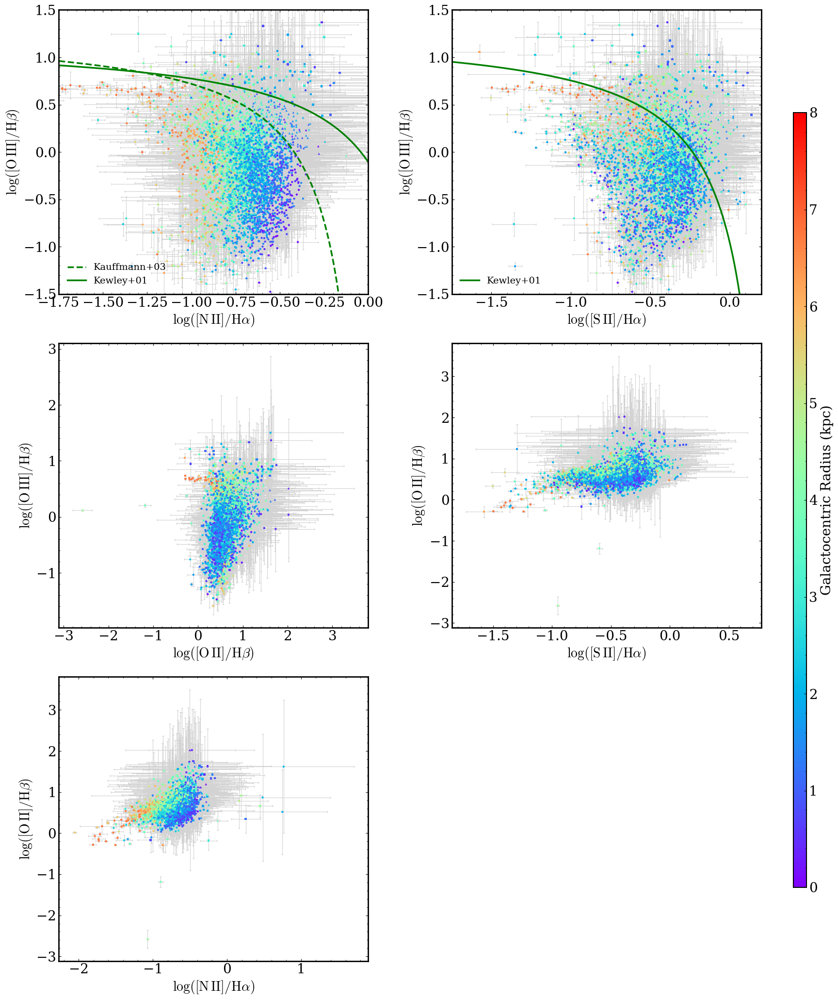

Using third color: False


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/636115799.py:199: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(x_sub[valid], y_sub[valid], c=class_colors.get(cls, 'k'),


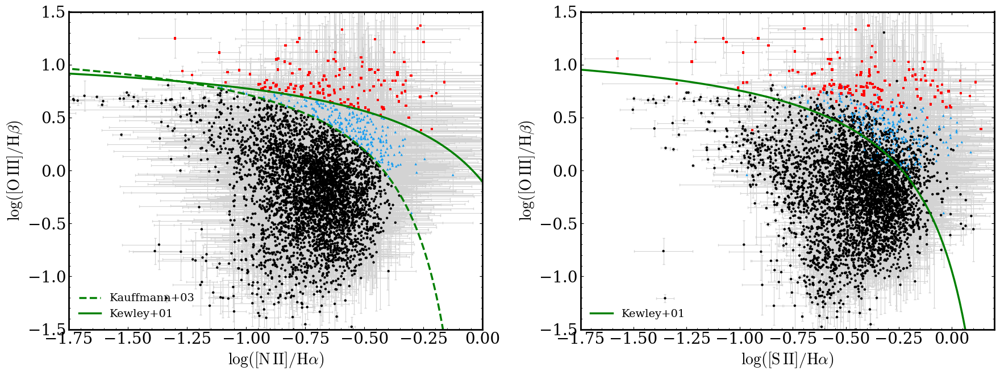

Using third color: False


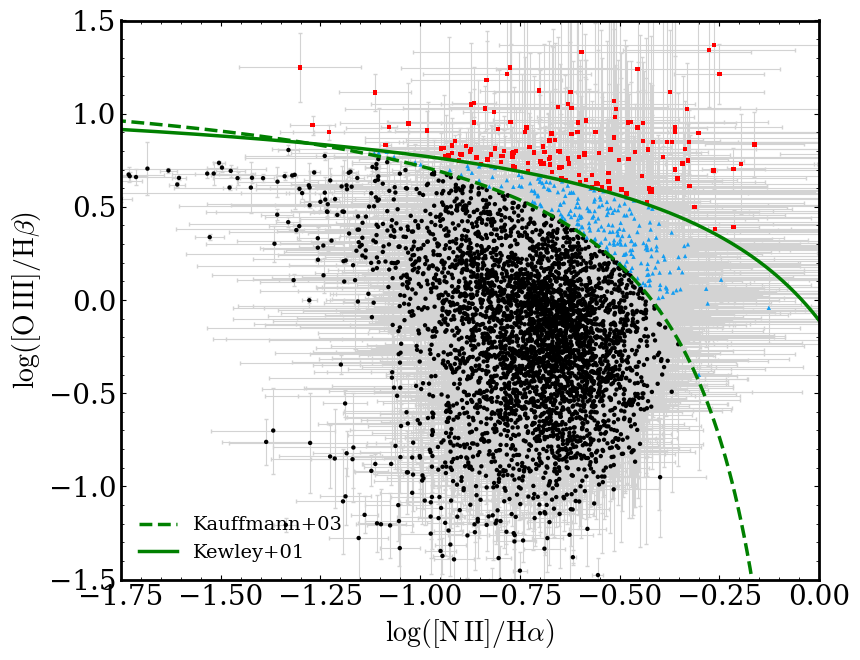

Using third color: False


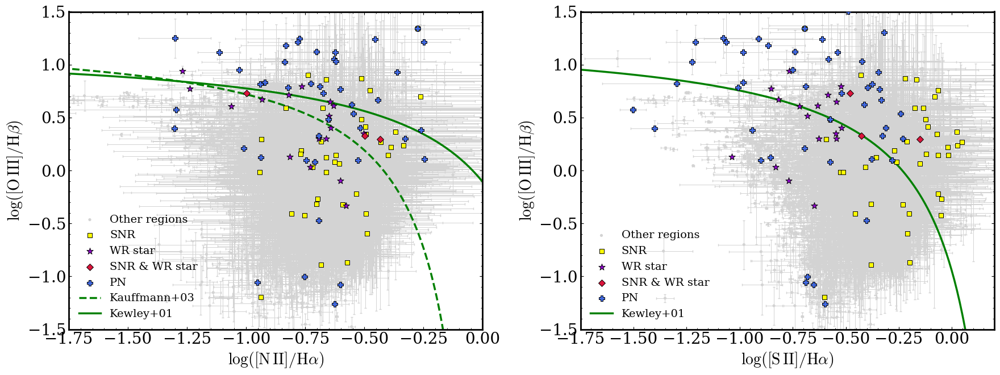

Using third color: False


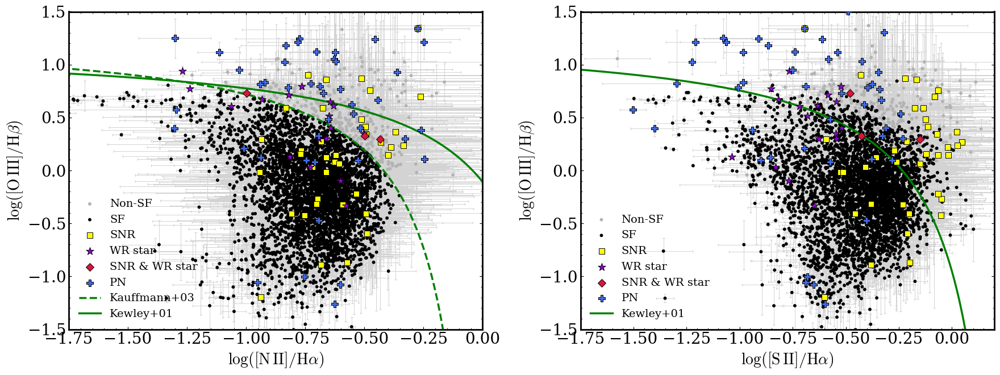

Saved paper draft figure: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/PAPER_PLOTS_DRAFT1/M33_BPT.png
Using third color: True


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/636115799.py:342: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 1])


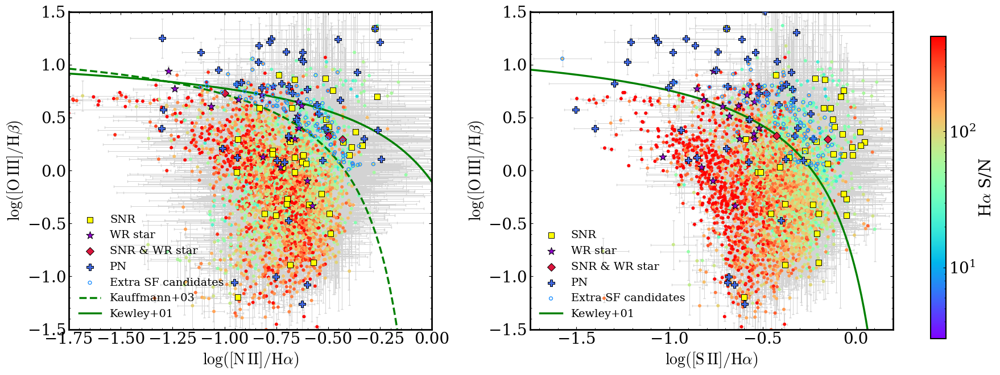

Saved paper draft figure: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/PAPER_PLOTS_DRAFT1/M33_BPT_SNR.png


PosixPath('/Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/PAPER_PLOTS_DRAFT1/M33_BPT_SNR.png')

In [14]:
snr_cut=3
plot_bpt(cat, snr_cut=snr_cut, marker_size = 10, color_col = 'R_gal_kpc', cmap='rainbow', vmin=0, vmax=8, 
         colorbar_label='Galactocentric Radius (kpc)',
         savepath = str(paper_plot_path(f'M33_allfields_BPT_SNR{snr_cut}_colored_by_radius.png', subdir='bpt')))


plot_bpt(cat, snr_cut=snr_cut, marker_size = 10, 
         savepath = str(paper_plot_path(f'M33_allfields_BPT_SNR{snr_cut}.png', subdir='bpt')), ratio_pairs = [
            ('NII_Ha', 'OIII_Hb'),
            ('SII_Ha', 'OIII_Hb')])

plot_bpt(cat, snr_cut=snr_cut, marker_size = 10, 
         savepath = str(paper_plot_path(f'M33_allfields_BPT_SNR{snr_cut}.png', subdir='bpt')), ratio_pairs = [
            ('NII_Ha', 'OIII_Hb')])


# Two-panel BPT diagram highlighting regions that contain catalogued SNRs or WR stars.
plot_bpt(
    cat,
    snr_cut=snr_cut,
    marker_size=14,
    highlight_wr_snr=True,
    flagged_size_factor=2.6,
    ratio_pairs=[
        ('NII_Ha', 'OIII_Hb'),
        ('SII_Ha', 'OIII_Hb'),
    ],
    savepath=str(paper_plot_path(
        f'M33_allfields_BPT_SNR{snr_cut}_WR_SNR_highlighted.png',
        subdir='bpt',
    )),
)


# Two-panel BPT diagram with star-forming regions in black, non-star-forming regions in grey,
# and PN/SNR/WR-hosting regions overplotted.
cat_bpt_sf_gray = cat.copy()
cat_bpt_sf_gray['bpt_sf_display'] = np.where(
    selected_star_forming_mask(cat_bpt_sf_gray),
    1.0,
    0.0,
)
plot_bpt(
    cat_bpt_sf_gray,
    snr_cut=snr_cut,
    marker_size=18,
    highlight_wr_snr=True,
    unflagged_color='lightgray',
    flagged_size_factor=2.8,
    sf_black_gray=True,
    ratio_pairs=[
        ('NII_Ha', 'OIII_Hb'),
        ('SII_Ha', 'OIII_Hb'),
    ],
    savepath=str(paper_plot_path(
        f'M33_allfields_BPT_SNR{snr_cut}_SF_black_gray_compact_objects.png',
        subdir='bpt',
    )),
)
save_for_paper(
    paper_plot_path(f'M33_allfields_BPT_SNR{snr_cut}_SF_black_gray_compact_objects.png', subdir='bpt'),
    'M33_BPT.png',
)

# Two-panel BPT diagram with all points colored by Halpha S/N,
# and PN/SNR/WR-hosting regions overplotted.
bpt_halpha_snr_path = paper_plot_path(
    f'M33_allfields_BPT_SNR{snr_cut}_colored_by_Halpha_SNR_compact_objects.png',
    subdir='bpt',
)
plot_bpt(
    cat,
    snr_cut=snr_cut,
    marker_size=18,
    color_col='SNR_Halpha_sum',
    cmap='rainbow',
    vmin=max(0.1, snr_cut),
    vmax=500,
    colorbar_log=True,
    colorbar_label=r'H$\alpha$ S/N',
    highlight_wr_snr=True,
    flagged_size_factor=2.8,
    highlight_mask_col='extra_sf_high_bpt_clean',
    highlight_edgecolor=HIGH_BPT_BLUE,
    highlight_marker_size_factor=1.0,
    highlight_linewidth=1.0,
    highlight_label='Extra SF candidates',
    
    ratio_pairs=[
        ('NII_Ha', 'OIII_Hb'),
        ('SII_Ha', 'OIII_Hb'),
    ],
    savepath=str(bpt_halpha_snr_path),
)
save_for_paper(
    bpt_halpha_snr_path,
    'M33_BPT_SNR.png',
)


In [15]:
# High-S/N, above-Kauffmann BPT regions with compact-object hosts removed.
# This block makes BPT/property/scatter/map diagnostics and saves them outside PAPER_PLOTS.

high_bpt_regions_output_dir = Path('bpt_comparison') / 'high_bpt_regions'
high_bpt_regions_output_dir.mkdir(parents=True, exist_ok=True)

HIGH_BPT_HALPHA_SNR_CUT = 60.0
HIGH_BPT_COUNT_COMMAND = 'nHighSNRAboveKauffmannNoCompact'


def _bool_flag(df, col):
    if col not in df.columns:
        return np.zeros(len(df), dtype=bool)
    series = df[col]
    if series.dtype == bool:
        return series.fillna(False).to_numpy(dtype=bool)
    return series.fillna(False).astype(str).str.strip().str.lower().isin({'true', '1', 'yes', 'y'}).to_numpy(dtype=bool)


def _first_available_column(df, candidates):
    for col in candidates:
        if col in df.columns:
            return col
    return None


def _numeric_values(df, col, default=np.nan):
    if col is None or col not in df.columns:
        return np.full(len(df), default, dtype=float)
    return pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float)


def _ensure_high_bpt_ratio_columns(df):
    out = df.copy()
    required = {'log_NII_Halpha', 'log_SII_Halpha', 'log_OIII_Hbeta'}
    if required.issubset(out.columns):
        return out

    def _flux(line):
        col = _first_available_column(out, [
            f'F_{line}_sum_dered',
            f'F_{line}_sum_dered_digsub',
            f'F_{line}_sum_digsub_dered',
            f'F_{line}_sum_digsub',
            f'F_{line}_sum',
            f'F_{line}_sum_nodig',
        ])
        if col is None:
            raise KeyError(f'No flux column found for {line}')
        return pd.to_numeric(out[col], errors='coerce').to_numpy(dtype=float)

    def _log_ratio(num, den):
        with np.errstate(divide='ignore', invalid='ignore'):
            ratio = np.asarray(num, dtype=float) / np.asarray(den, dtype=float)
            values = np.log10(ratio)
        return np.where(np.isfinite(values) & (np.asarray(num) > 0) & (np.asarray(den) > 0), values, np.nan)

    ha = _flux('Halpha')
    hb = _flux('Hbeta')
    nii = _flux('[NII]6583')
    oiii = _flux('[OIII]5007')
    sii = _flux('[SII]6716') + _flux('[SII]6731')
    out['log_NII_Halpha'] = _log_ratio(nii, ha)
    out['log_SII_Halpha'] = _log_ratio(sii, ha)
    out['log_OIII_Hbeta'] = _log_ratio(oiii, hb)
    return out


def _above_kauffmann_nii_bpt(df):
    x = _numeric_values(df, 'log_NII_Halpha')
    y = _numeric_values(df, 'log_OIII_Hbeta')
    with np.errstate(divide='ignore', invalid='ignore'):
        kauffmann_y = 0.61 / (x - 0.05) + 1.3
    return np.isfinite(x) & np.isfinite(y) & ((x >= 0.05) | (y > kauffmann_y))


def _high_bpt_region_mask(df, halpha_snr_cut=HIGH_BPT_HALPHA_SNR_CUT):
    halpha_snr_col = _first_available_column(df, ['SNR_Halpha_sum', 'SNR_Halpha_sum_nodig', 'Halpha_SNR'])
    halpha_snr = _numeric_values(df, halpha_snr_col)
    compact = (
        _bool_flag(df, 'has_wr_in_boundary') |
        _bool_flag(df, 'has_snr_in_boundary') |
        _bool_flag(df, 'has_pn_in_boundary')
    )
    return (~compact) & (halpha_snr > halpha_snr_cut) & _above_kauffmann_nii_bpt(df), halpha_snr_col


def _draw_nii_kauffmann_kewley(ax):
    x_vals = np.linspace(-2.0, 0.45, 500)
    kauff_mask = x_vals < 0.05
    kewley_mask = x_vals < 0.47
    ax.plot(x_vals[kauff_mask], 0.61 / (x_vals[kauff_mask] - 0.05) + 1.3, color='forestgreen', ls='--', lw=2.0, label='Kauffmann+03')
    ax.plot(x_vals[kewley_mask], 0.61 / (x_vals[kewley_mask] - 0.47) + 1.19, color='forestgreen', ls='-', lw=2.0, label='Kewley+01')
    ax.set_xlim(-1.75, 0.0)
    ax.set_ylim(-1.5, 1.5)


def _draw_sii_kewley(ax):
    x_vals = np.linspace(-2.0, 0.30, 500)
    kewley_mask = x_vals < 0.32
    ax.plot(x_vals[kewley_mask], 0.72 / (x_vals[kewley_mask] - 0.32) + 1.30, color='forestgreen', ls='-', lw=2.0, label='Kewley+01')
    ax.set_xlim(-1.75, 0.2)
    ax.set_ylim(-1.5, 1.5)


def plot_high_bpt_property_panels(df, color_col, colorbar_label, filename, *, colorbar_log=False, vmin=None, vmax=None):
    work = _ensure_high_bpt_ratio_columns(df)
    high_mask, halpha_snr_col = _high_bpt_region_mask(work)
    compact = (
        _bool_flag(work, 'has_wr_in_boundary') |
        _bool_flag(work, 'has_snr_in_boundary') |
        _bool_flag(work, 'has_pn_in_boundary')
    )
    plot_mask = ~compact

    x_nii = _numeric_values(work, 'log_NII_Halpha')
    x_sii = _numeric_values(work, 'log_SII_Halpha')
    y = _numeric_values(work, 'log_OIII_Hbeta')
    cvals = _numeric_values(work, color_col)

    finite_c = np.isfinite(cvals[plot_mask])
    if vmin is None:
        vmin = np.nanmin(cvals[plot_mask][finite_c]) if np.any(finite_c) else 0.0
    if vmax is None:
        vmax = np.nanmax(cvals[plot_mask][finite_c]) if np.any(finite_c) else 1.0
    if colorbar_log:
        positive = cvals[plot_mask][finite_c]
        positive = positive[positive > 0]
        if positive.size:
            vmin = max(vmin, np.nanmin(positive), 1.0e-6)
        norm = mpl.colors.LogNorm(vmin=vmin, vmax=vmax)
    else:
        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cmap_obj = mpl.colormaps.get_cmap('rainbow')

    panel_specs = [
        (x_nii, y, r'$\log([\mathrm{N\,II}]/\mathrm{H}\alpha)$', r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$', _draw_nii_kauffmann_kewley),
        (x_sii, y, r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$', r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$', _draw_sii_kewley),
    ]

    fig, axes = plt.subplots(1, 2, figsize=(14.5, 6.3), sharey=True)
    last_scatter = None
    for ax, (x, yvals, xlabel, ylabel, draw_lines) in zip(axes, panel_specs):
        valid = plot_mask & np.isfinite(x) & np.isfinite(yvals)
        ok_color = valid & np.isfinite(cvals)
        missing_color = valid & ~np.isfinite(cvals)
        if np.any(ok_color):
            last_scatter = ax.scatter(
                x[ok_color], yvals[ok_color], c=cvals[ok_color], cmap=cmap_obj, norm=norm,
                s=18, edgecolors='none', alpha=0.88, zorder=2,
            )
        if np.any(missing_color):
            ax.scatter(x[missing_color], yvals[missing_color], c='0.78', s=18, edgecolors='none', alpha=0.65, zorder=1)
        high_valid = high_mask & np.isfinite(x) & np.isfinite(yvals)
        if np.any(high_valid):
            ax.scatter(
                x[high_valid], yvals[high_valid], facecolors='none', edgecolors='black',
                s=82, linewidths=1.25, zorder=6,
                label=rf'Above Kauffmann, H$\alpha$ S/N $>$ {HIGH_BPT_HALPHA_SNR_CUT:.0f}, no WR/SNR/PN',
            )
        draw_lines(ax)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.minorticks_on()
        ax.tick_params(direction='in', which='both', top=True, right=True)
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)
    if last_scatter is not None:
        cbar = fig.colorbar(last_scatter, ax=axes, pad=0.02, fraction=0.035)
        cbar.set_label(colorbar_label)
    handles, labels = axes[0].get_legend_handles_labels()
    if handles:
        axes[0].legend(handles, labels, frameon=False, loc='lower left', fontsize=10)
    n_high = int(high_mask.sum())
    n_compact_removed = int(compact.sum())
    fig.suptitle(f'Compact-object hosts removed; highlighted N={n_high}; compact removed={n_compact_removed}', y=1.02)
    fig.tight_layout()
    outpath = high_bpt_regions_output_dir / filename
    fig.savefig(outpath, dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f'Wrote {outpath}')
    return outpath, high_mask


cat_high_bpt_work = _ensure_high_bpt_ratio_columns(cat)
high_bpt_region_mask, high_bpt_halpha_snr_col = _high_bpt_region_mask(cat_high_bpt_work)
cat_high_bpt_work['high_bpt_no_compact'] = high_bpt_region_mask
n_high_bpt_no_compact = int(high_bpt_region_mask.sum())
values[HIGH_BPT_COUNT_COMMAND] = n_high_bpt_no_compact
formats[HIGH_BPT_COUNT_COMMAND] = 'd'
print(
    f'High-S/N above-Kauffmann no-WR/SNR/PN regions: {n_high_bpt_no_compact} '
    f'using {high_bpt_halpha_snr_col} > {HIGH_BPT_HALPHA_SNR_CUT:.0f}.'
)

size_col = _first_available_column(cat_high_bpt_work, ['radius_areaeq_pc', 'R_c_pc', 'radius_p50_pc', 'npix_region', 'N_spaxels'])
sigma_col = _first_available_column(cat_high_bpt_work, ['sigma_mean_kms', 'sigma_kms', 'sigma_mean', 'veldisp_mean_kms'])
if size_col is None:
    raise KeyError('No region-size column found for high-BPT diagnostics.')
if sigma_col is None:
    raise KeyError('No velocity-dispersion column found for high-BPT diagnostics.')

plot_high_bpt_property_panels(
    cat_high_bpt_work,
    color_col=high_bpt_halpha_snr_col,
    colorbar_label=r'H$\alpha$ S/N',
    colorbar_log=True,
    vmin=max(0.1, HIGH_BPT_HALPHA_SNR_CUT),
    vmax=500,
    filename='BPT_highSNR_aboveKauffmann_no_compact_colored_by_HalphaSNR.png',
)
plot_high_bpt_property_panels(
    cat_high_bpt_work,
    color_col=size_col,
    colorbar_label='Region size (pc)' if 'pc' in size_col else size_col,
    colorbar_log=False,
    filename='BPT_highSNR_aboveKauffmann_no_compact_colored_by_region_size.png',
)
plot_high_bpt_property_panels(
    cat_high_bpt_work,
    color_col=sigma_col,
    colorbar_label=r'$\sigma$ (km s$^{-1}$)' if 'kms' in sigma_col else sigma_col,
    colorbar_log=False,
    filename='BPT_highSNR_aboveKauffmann_no_compact_colored_by_velocity_dispersion.png',
)

compact_mask = (
    _bool_flag(cat_high_bpt_work, 'has_wr_in_boundary') |
    _bool_flag(cat_high_bpt_work, 'has_snr_in_boundary') |
    _bool_flag(cat_high_bpt_work, 'has_pn_in_boundary')
)
scatter_mask = ~compact_mask
x_size = _numeric_values(cat_high_bpt_work, size_col)
y_sigma = _numeric_values(cat_high_bpt_work, sigma_col)
halpha_snr_values = _numeric_values(cat_high_bpt_work, high_bpt_halpha_snr_col)
valid_scatter = scatter_mask & np.isfinite(x_size) & np.isfinite(y_sigma) & np.isfinite(halpha_snr_values) & (halpha_snr_values > 0)
fig, ax = plt.subplots(figsize=(7.2, 6.2))
sc = ax.scatter(
    x_size[valid_scatter], y_sigma[valid_scatter], c=halpha_snr_values[valid_scatter],
    cmap='rainbow', norm=mpl.colors.LogNorm(vmin=max(0.1, np.nanmin(halpha_snr_values[valid_scatter])), vmax=np.nanmax(halpha_snr_values[valid_scatter])),
    s=22, edgecolors='none', alpha=0.82, zorder=2,
)
high_scatter = high_bpt_region_mask & np.isfinite(x_size) & np.isfinite(y_sigma)
ax.scatter(
    x_size[high_scatter], y_sigma[high_scatter], facecolors='none', edgecolors='black',
    s=92, linewidths=1.3, zorder=5,
    label=rf'Above Kauffmann, H$\alpha$ S/N $>$ {HIGH_BPT_HALPHA_SNR_CUT:.0f}, no WR/SNR/PN',
)
ax.set_xlabel('Region size (pc)' if 'pc' in size_col else size_col)
ax.set_ylabel(r'$\sigma$ (km s$^{-1}$)' if 'kms' in sigma_col else sigma_col)
ax.minorticks_on()
ax.tick_params(direction='in', which='both', top=True, right=True)
ax.legend(frameon=False, fontsize=10)
cbar = fig.colorbar(sc, ax=ax)
cbar.set_label(r'H$\alpha$ S/N')
fig.tight_layout()
scatter_path = high_bpt_regions_output_dir / 'size_vs_velocity_dispersion_highSNR_aboveKauffmann_no_compact_colored_by_HalphaSNR.png'
fig.savefig(scatter_path, dpi=300, bbox_inches='tight')
plt.close(fig)
print(f'Wrote {scatter_path}')

candidate_cols = [col for col in [
    'field', 'region_id', high_bpt_halpha_snr_col, size_col, sigma_col,
    'log_NII_Halpha', 'log_OIII_Hbeta', 'log_SII_Halpha',
    'has_wr_in_boundary', 'has_snr_in_boundary', 'has_pn_in_boundary',
] if col in cat_high_bpt_work.columns]
candidate_path = high_bpt_regions_output_dir / 'highSNR_aboveKauffmann_no_compact_regions.csv'
cat_high_bpt_work.loc[high_bpt_region_mask, candidate_cols].to_csv(candidate_path, index=False)
print(f'Wrote {candidate_path}')

# Boundary mosaic with the highlighted regions in thick black contours.
if 'plot_m33_boundary_mosaic' in globals():
    cat_high_bpt_map = cat_high_bpt_work.copy()
    cat_high_bpt_map['high_bpt_region_category'] = np.where(high_bpt_region_mask, 'high_bpt_no_compact', 'other')
    plot_m33_boundary_mosaic(
        field_order=('NE', 'NW', 'F5', 'SE', 'SW', 'F7', 'F6', 'F8', 'F9'),
        halpha_only_fields=('F9',),
        combined_catalog=cat_high_bpt_map,
        pn_catalog=pn_catalog,
        boundary_color_mode='catalog_category',
        boundary_category_col='high_bpt_region_category',
        boundary_category_styles={
            'other': {'color': '0.70', 'lw': 0.35, 'alpha': 0.55, 'zorder': 4, 'label': 'Other non-compact/compact-filtered regions'},
            'high_bpt_no_compact': {'color': 'black', 'lw': 1.75, 'alpha': 1.0, 'zorder': 8, 'label': rf'Above Kauffmann, H$\alpha$ S/N $>$ {HIGH_BPT_HALPHA_SNR_CUT:.0f}, no WR/SNR/PN'},
        },
        boundary_color='black',
        other_region_color='0.70',
        cmap='rainbow',
        boundary_lw=0.35,
        boundary_alpha=0.75,
        wr_color='darkviolet',
        snr_color='yellow',
        pn_color='royalblue',
        wr_marker_size=18,
        snr_marker_size=6,
        pn_marker_size=9,
        field_valid_bounds=(50, 2000, 50, 2000),
        display_field_valid_bounds=(50, 2000, 50, 2000),
        display_field_edge_margin=None,
        fill_mosaic_gaps_from_field_maps=True,
        show_field_labels=True,
        field_label_corner='upper left',
        field_label_pad_pixels=90,
        field_label_fontsize=15,
        axis_label_fontsize=15,
        tick_label_fontsize=15,
        colorbar_fontsize=15,
        colorbar_tick_labelsize=15,
        title=f'Above-Kauffmann high-S/N regions with WR/SNR/PN hosts removed (N={n_high_bpt_no_compact})',
        savepath=str(high_bpt_regions_output_dir / 'mosaic_highSNR_aboveKauffmann_no_compact_boundaries.png'),
        save_dpi=500,
    )
else:
    print('plot_m33_boundary_mosaic is not defined; run/copy the map-helper cell from notebook 8a before this cell to make the mosaic.')

if 'write_number_command_files' in globals():
    write_number_command_files(
        values,
        formats,
        message=f'Updated number commands with {HIGH_BPT_COUNT_COMMAND}={n_high_bpt_no_compact}',
    )
else:
    catalog_numbers_path = paper_plot_path('catalog_numbers.tex')
    write_latex_commands(catalog_numbers_path, values, formats)
    print(f'Updated {catalog_numbers_path} with {HIGH_BPT_COUNT_COMMAND}={n_high_bpt_no_compact}')


High-S/N above-Kauffmann no-WR/SNR/PN regions: 193 using SNR_Halpha_sum > 60.


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/992571400.py:177: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Wrote bpt_comparison/high_bpt_regions/BPT_highSNR_aboveKauffmann_no_compact_colored_by_HalphaSNR.png
Wrote bpt_comparison/high_bpt_regions/BPT_highSNR_aboveKauffmann_no_compact_colored_by_region_size.png
Wrote bpt_comparison/high_bpt_regions/BPT_highSNR_aboveKauffmann_no_compact_colored_by_velocity_dispersion.png
Wrote bpt_comparison/high_bpt_regions/size_vs_velocity_dispersion_highSNR_aboveKauffmann_no_compact_colored_by_HalphaSNR.png
Wrote bpt_comparison/high_bpt_regions/highSNR_aboveKauffmann_no_compact_regions.csv
Filled 1296524 missing mosaic pixels from individual field maps.
Mosaic plotted with 31 WR stars, 162 SNRs, and 125 PNe inside the valid field footprints.
Updated number commands with nHighSNRAboveKauffmannNoCompact=193: PAPER_PLOTS/summed_map/dig_subtracted/catalog_numbers.tex
Updated number commands with nHighSNRAboveKauffmannNoCompact=193: PAPER_PLOTS/summed_map/dig_subtracted/paper_numbers.tex


Using third color: True


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/636115799.py:342: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 1])


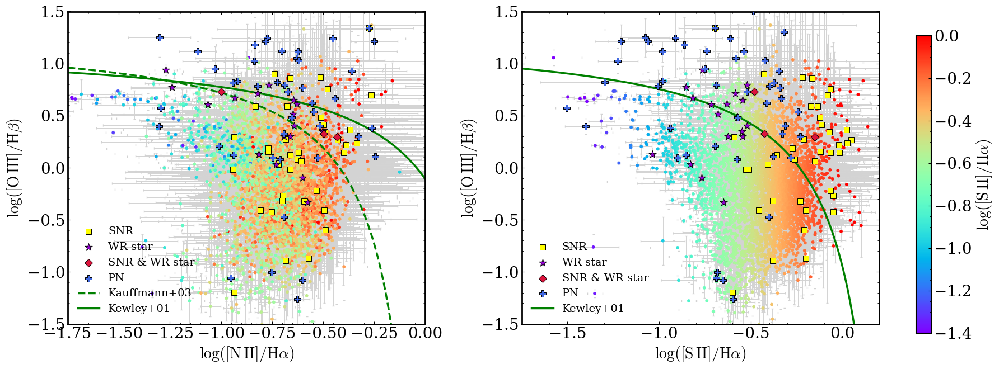

Using third color: True


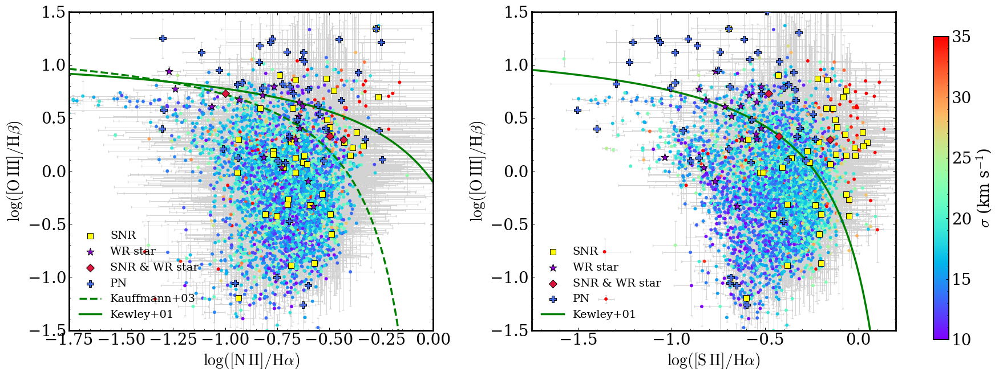

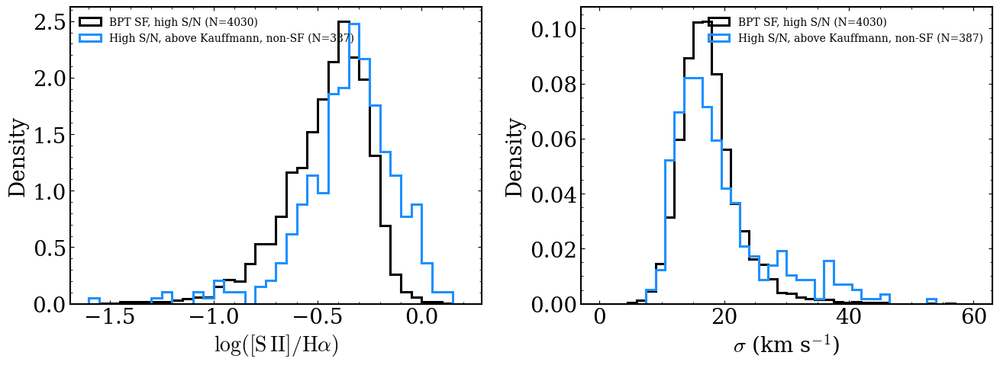

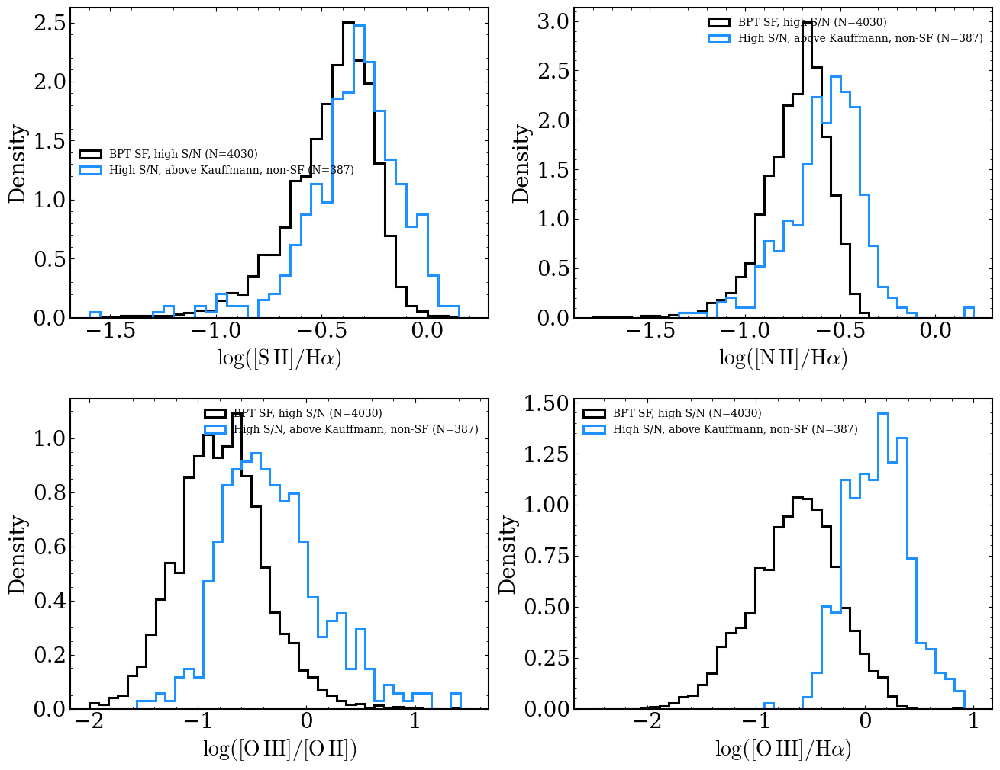

High-S/N, above-Kauffmann, non-SF candidates: 387
Wrote candidate table: PAPER_PLOTS/summed_map/dig_subtracted/bpt/M33_BPT_high_snr_above_kauffmann_non_SF_candidates.csv


In [16]:
# BPT diagnostic versions and distributions for testing SF-region selection cuts.
snr_cut = BPT_DIAGNOSTIC_SNR_CUT
cat = add_bpt_diagnostic_columns(cat, snr_cut=snr_cut)
cat_bpt_sf_gray = cat.copy()
cat_bpt_sf_gray['bpt_sf_display'] = np.where(selected_star_forming_mask(cat_bpt_sf_gray), 1.0, 0.0)

bpt_sii_ha_path = paper_plot_path(
    f'M33_allfields_BPT_SNR{snr_cut:g}_colored_by_SII_Halpha_ratio_compact_objects.png',
    subdir='bpt',
)
plot_bpt(
    cat_bpt_sf_gray,
    snr_cut=snr_cut,
    marker_size=18,
    color_col='log_SII_Halpha',
    cmap='rainbow',
    vmin=-1.4,
    vmax=0.0,
    colorbar_log=False,
    colorbar_label=r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$',
    highlight_wr_snr=True,
    flagged_size_factor=2.8,
    ratio_pairs=[
        ('NII_Ha', 'OIII_Hb'),
        ('SII_Ha', 'OIII_Hb'),
    ],
    savepath=str(bpt_sii_ha_path),
)

bpt_velocity_dispersion_path = paper_plot_path(
    f'M33_allfields_BPT_SNR{snr_cut:g}_colored_by_velocity_dispersion_compact_objects.png',
    subdir='bpt',
)
plot_bpt(
    cat_bpt_sf_gray,
    snr_cut=snr_cut,
    marker_size=18,
    color_col='sigma_mean_kms',
    cmap='rainbow',
    vmin=10,
    vmax=35,
    colorbar_log=False,
    colorbar_label=r'$\sigma$ (km s$^{-1}$)',
    highlight_wr_snr=True,
    flagged_size_factor=2.8,
    ratio_pairs=[
        ('NII_Ha', 'OIII_Hb'),
        ('SII_Ha', 'OIII_Hb'),
    ],
    savepath=str(bpt_velocity_dispersion_path),
)


def _finite_series_for_hist(df, column):
    values = pd.to_numeric(df[column], errors='coerce').to_numpy(dtype=float)
    return values[np.isfinite(values)]


def _hist_by_population(ax, df, column, bins, xlabel):
    bpt_sf = selected_star_forming_mask(df)
    blue = df['high_snr_above_kauffmann_non_sf'].fillna(False).astype(bool).to_numpy()
    high_snr = df['high_snr_nii_bpt'].fillna(False).astype(bool).to_numpy() if 'high_snr_nii_bpt' in df.columns else np.ones(len(df), dtype=bool)
    populations = [
        (bpt_sf & high_snr, 'black', 'BPT SF, high S/N'),
        (blue, 'dodgerblue', 'High S/N, above Kauffmann, non-SF'),
        ((~bpt_sf) & high_snr & ~blue, '0.60', 'Other non-SF, high S/N'),
    ]
    for mask, color, label in populations:
        values = pd.to_numeric(df.loc[mask, column], errors='coerce').to_numpy(dtype=float)
        values = values[np.isfinite(values)]
        if values.size == 0:
            continue
        ax.hist(values, bins=bins, histtype='step', linewidth=2.2, density=True, color=color, label=f'{label} (N={values.size})')
    ax.set_xlabel(xlabel)
    ax.set_ylabel('Density')
    ax.minorticks_on()
    ax.legend(frameon=False, fontsize=10)


fig, axes = plt.subplots(1, 2, figsize=(13.5, 5.2))
_hist_by_population(
    axes[0], cat, 'log_SII_Halpha',
    bins=np.linspace(-1.6, 0.2, 37),
    xlabel=r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$',
)
if 'sigma_mean_kms' in cat.columns:
    _hist_by_population(
        axes[1], cat, 'sigma_mean_kms',
        bins=np.linspace(0, 60, 41),
        xlabel=r'$\sigma$ (km s$^{-1}$)',
    )
else:
    axes[1].text(0.5, 0.5, 'sigma_mean_kms not available\nRun notebook 7 kinematic update first.', ha='center', va='center', transform=axes[1].transAxes)
    axes[1].set_axis_off()
fig.tight_layout()
fig.savefig(paper_plot_path('M33_BPT_candidate_SII_Halpha_sigma_histograms.png', subdir='bpt'), dpi=300, bbox_inches='tight')
plt.show()

ratio_distribution_specs = [
    ('log_SII_Halpha', r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$', np.linspace(-1.6, 0.2, 37)),
    ('log_NII_Halpha', r'$\log([\mathrm{N\,II}]/\mathrm{H}\alpha)$', np.linspace(-1.8, 0.2, 41)),
    ('log_OIII_OII', r'$\log([\mathrm{O\,III}]/[\mathrm{O\,II}])$', np.linspace(-2.0, 1.5, 41)),
    ('log_OIII_Halpha', r'$\log([\mathrm{O\,III}]/\mathrm{H}\alpha)$', np.linspace(-2.5, 1.0, 41)),
]
fig, axes = plt.subplots(2, 2, figsize=(13.5, 10.5))
for ax, (column, xlabel, bins) in zip(axes.ravel(), ratio_distribution_specs):
    _hist_by_population(ax, cat, column, bins=bins, xlabel=xlabel)
fig.tight_layout()
fig.savefig(paper_plot_path('M33_BPT_candidate_line_ratio_distributions.png', subdir='bpt'), dpi=300, bbox_inches='tight')
plt.show()

blue_candidates = cat.loc[cat['high_snr_above_kauffmann_non_sf'].fillna(False)].copy()
blue_candidates_path = paper_plot_path('M33_BPT_high_snr_above_kauffmann_non_SF_candidates.csv', subdir='bpt')
summary_cols = [
    'field', 'region_id', 'RA_deg', 'Dec_deg', 'BPT_class_sum_dered',
    'log_SII_Halpha', 'log_NII_Halpha', 'log_OIII_OII', 'log_OIII_Halpha',
    'log_OIII_Hbeta', 'sigma_mean_kms', 'SNR_Halpha_sum', 'SNR_[OIII]5007_sum',
]
summary_cols = [col for col in summary_cols if col in blue_candidates.columns]
blue_candidates[summary_cols].to_csv(blue_candidates_path, index=False)
print(f'High-S/N, above-Kauffmann, non-SF candidates: {len(blue_candidates)}')
print(f'Wrote candidate table: {blue_candidates_path}')



Plotting class_snr3_only: {'snr3_all_lines': 4417, 'low_snr': 1476}


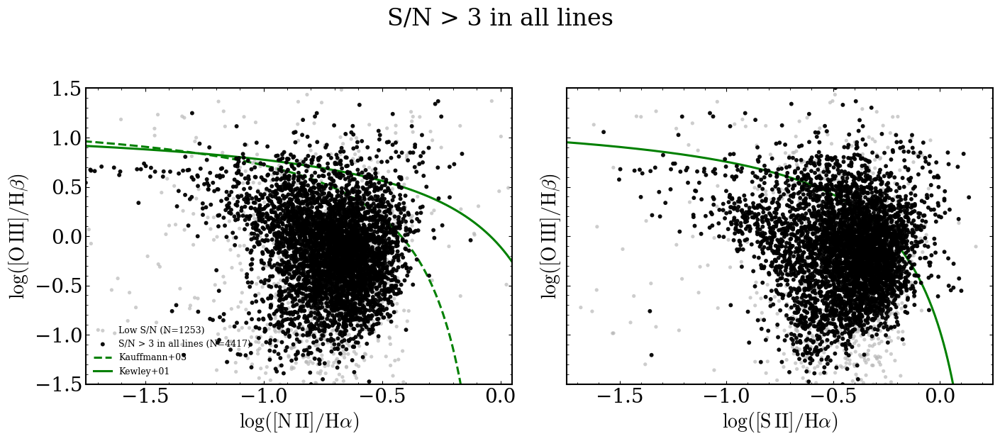

Plotting class_bpt_snr3_nonbpt: {'bpt_sf_snr3': 4030, 'low_snr': 1476, 'snr3_non_bpt_sf': 387}


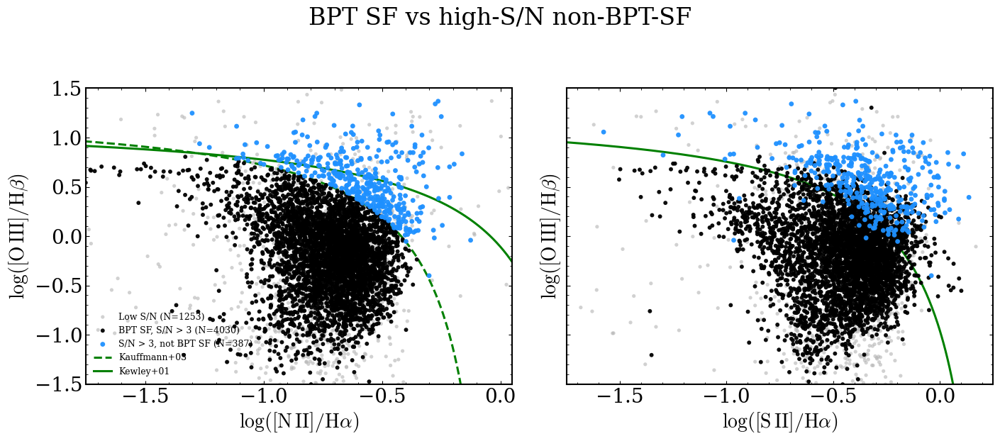

Plotting class_bpt_snr3_nonbpt_snr50: {'bpt_sf_snr3': 4030, 'low_snr': 1476, 'snr3_non_bpt_sf': 334, 'snr50_non_bpt_sf': 53}


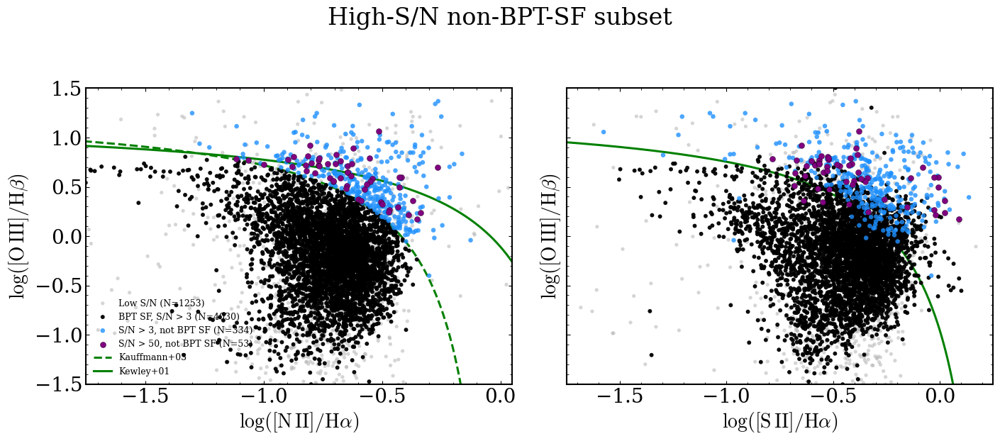

Plotting class_custom_sf: {'bpt_sf_snr3': 4030, 'low_snr': 1476, 'snr3_non_custom_sf': 311, 'recovered_siiha_sf': 76}


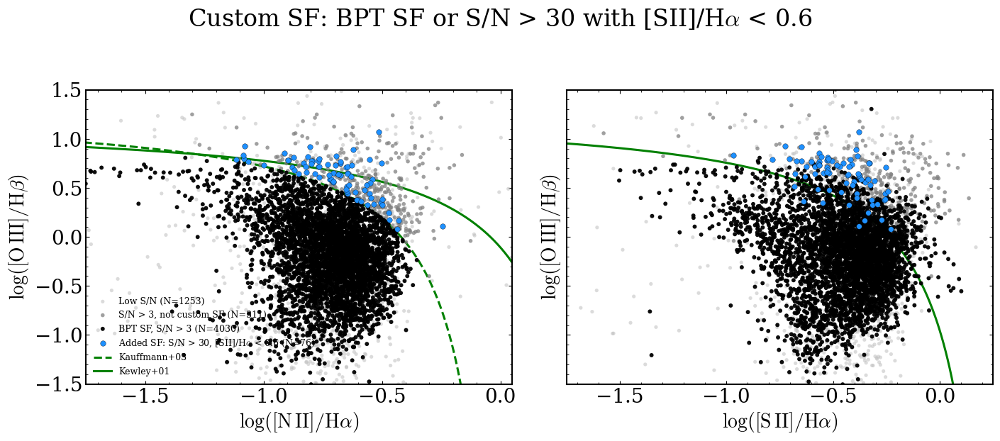

In [17]:
# Matching categorical BPT diagrams for the all-field map classification versions.
cat = add_bpt_diagnostic_columns(cat, snr_cut=BPT_DIAGNOSTIC_SNR_CUT)


def _draw_nii_bpt_demarcations(ax):
    x_vals = np.linspace(-2.0, 0.45, 500)
    kauff_mask = x_vals < 0.05
    kewley_mask = x_vals < 0.47
    ax.plot(x_vals[kauff_mask], 0.61 / (x_vals[kauff_mask] - 0.05) + 1.3, 'g--', lw=2.2, label='Kauffmann+03')
    ax.plot(x_vals[kewley_mask], 0.61 / (x_vals[kewley_mask] - 0.47) + 1.19, 'g-', lw=2.2, label='Kewley+01')
    ax.set_xlim(-1.75, 0.05)
    ax.set_ylim(-1.5, 1.5)


def _draw_sii_bpt_demarcations(ax):
    x_vals = np.linspace(-2.0, 0.3, 500)
    kewley_mask = x_vals < 0.32
    ax.plot(x_vals[kewley_mask], 0.72 / (x_vals[kewley_mask] - 0.32) + 1.30, 'g-', lw=2.2, label='Kewley+01')
    ax.set_xlim(-1.75, 0.25)
    ax.set_ylim(-1.5, 1.5)


def plot_categorical_bpt(df, category_col, category_styles, savepath=None, title=None):
    fig, axes = plt.subplots(1, 2, figsize=(14.5, 6.2), sharey=True)
    panel_specs = [
        (axes[0], 'log_NII_Halpha', 'log_OIII_Hbeta', r'$\log([\mathrm{N\,II}]/\mathrm{H}\alpha)$', r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$', _draw_nii_bpt_demarcations),
        (axes[1], 'log_SII_Halpha', 'log_OIII_Hbeta', r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$', r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$', _draw_sii_bpt_demarcations),
    ]
    for ax, x_col, y_col, xlabel, ylabel, draw_lines in panel_specs:
        x = pd.to_numeric(df[x_col], errors='coerce').to_numpy(dtype=float)
        y = pd.to_numeric(df[y_col], errors='coerce').to_numpy(dtype=float)
        valid = np.isfinite(x) & np.isfinite(y)
        for category, style in category_styles.items():
            select = valid & df[category_col].astype(str).eq(str(category)).to_numpy()
            if not np.any(select):
                continue
            ax.scatter(
                x[select], y[select],
                s=style.get('s', 18),
                c=style.get('color', '0.6'),
                marker=style.get('marker', 'o'),
                edgecolors=style.get('edgecolor', 'none'),
                linewidths=style.get('linewidth', 0.0),
                alpha=style.get('alpha', 0.9),
                label=f"{style.get('label', str(category))} (N={int(select.sum())})",
                zorder=style.get('zorder', 3),
            )
        draw_lines(ax)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.minorticks_on()
        ax.tick_params(direction='in', which='both', top=True, right=True)
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)
    handles, labels = axes[0].get_legend_handles_labels()
    unique = dict(zip(labels, handles))
    axes[0].legend(unique.values(), unique.keys(), frameon=False, loc='lower left', fontsize=9)
    if title:
        fig.suptitle(title, y=1.02)
    fig.tight_layout()
    if savepath is not None:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()
    return fig, axes

classification_bpt_specs = [
    dict(
        category_col='class_snr3_only',
        filename='M33_BPT_snr3_all_lines_black_low_snr_gray.png',
        title='S/N > 3 in all lines',
        styles={
            'low_snr': {'color': '0.70', 's': 14, 'alpha': 0.65, 'zorder': 2, 'label': 'Low S/N'},
            'snr3_all_lines': {'color': 'black', 's': 18, 'alpha': 0.95, 'zorder': 4, 'label': 'S/N > 3 in all lines'},
        },
    ),
    dict(
        category_col='class_bpt_snr3_nonbpt',
        filename='M33_BPT_bpt_sf_black_snr3_nonbpt_blue_low_snr_gray.png',
        title='BPT SF vs high-S/N non-BPT-SF',
        styles={
            'low_snr': {'color': '0.70', 's': 14, 'alpha': 0.60, 'zorder': 2, 'label': 'Low S/N'},
            'bpt_sf_snr3': {'color': 'black', 's': 18, 'alpha': 0.95, 'zorder': 4, 'label': 'BPT SF, S/N > 3'},
            'snr3_non_bpt_sf': {'color': 'dodgerblue', 's': 24, 'alpha': 0.95, 'zorder': 5, 'label': 'S/N > 3, not BPT SF'},
        },
    ),
    dict(
        category_col='class_bpt_snr3_nonbpt_snr50',
        filename='M33_BPT_bpt_sf_black_snr3_blue_snr50_purple_low_snr_gray.png',
        title='High-S/N non-BPT-SF subset',
        styles={
            'low_snr': {'color': '0.70', 's': 14, 'alpha': 0.55, 'zorder': 2, 'label': 'Low S/N'},
            'bpt_sf_snr3': {'color': 'black', 's': 18, 'alpha': 0.95, 'zorder': 4, 'label': 'BPT SF, S/N > 3'},
            'snr3_non_bpt_sf': {'color': 'dodgerblue', 's': 22, 'alpha': 0.80, 'zorder': 5, 'label': 'S/N > 3, not BPT SF'},
            'snr50_non_bpt_sf': {'color': 'purple', 's': 34, 'alpha': 1.0, 'edgecolor': 'black', 'linewidth': 0.25, 'zorder': 6, 'label': 'S/N > 50, not BPT SF'},
        },
    ),
    dict(
        category_col='class_custom_sf',
        filename='M33_BPT_custom_sf_bpt_or_siiha.png',
        title=r'Custom SF: BPT SF or S/N > 30 with [SII]/H$\alpha$ < 0.6',
        styles={
            'low_snr': {'color': '0.75', 's': 14, 'alpha': 0.55, 'zorder': 2, 'label': 'Low S/N'},
            'snr3_non_custom_sf': {'color': '0.50', 's': 16, 'alpha': 0.75, 'zorder': 3, 'label': 'S/N > 3, not custom SF'},
            'bpt_sf_snr3': {'color': 'black', 's': 18, 'alpha': 0.95, 'zorder': 5, 'label': 'BPT SF, S/N > 3'},
            'recovered_siiha_sf': {'color': 'dodgerblue', 's': 30, 'alpha': 1.0, 'edgecolor': 'black', 'linewidth': 0.25, 'zorder': 6, 'label': r'Added SF: S/N > 30, [SII]/H$\alpha$ < 0.6'},
        },
    ),
]

for spec in classification_bpt_specs:
    print(f"Plotting {spec['category_col']}:", cat[spec['category_col']].value_counts().to_dict())
    plot_categorical_bpt(
        cat,
        category_col=spec['category_col'],
        category_styles=spec['styles'],
        title=spec['title'],
        savepath=str(paper_plot_path(spec['filename'], subdir='bpt')),
    )



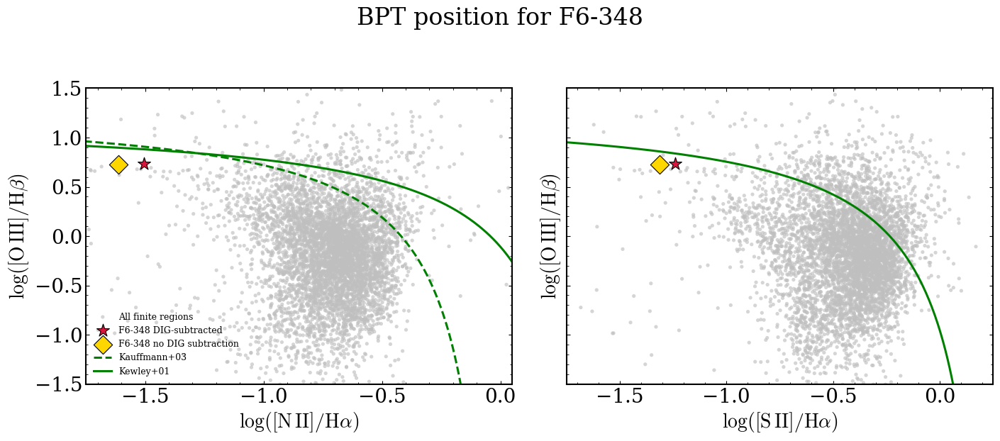

field                                 F6
region_id                            348
x                                   1137
y                                   1953
BPT_class_sum_dered         Star-forming
SNR_Halpha_sum               1476.880024
SNR_Hbeta_sum                 230.951113
SNR_[OIII]5007_sum            863.147237
SNR_[NII]6583_sum              56.405523
SNR_[SII]6716_sum              61.669847
SNR_[SII]6731_sum               40.55369
SNR_[OII]3727_sum             169.038479
SNR_Halpha_sum_nodig         1476.880024
SNR_Hbeta_sum_nodig           230.951113
SNR_[OIII]5007_sum_nodig      863.147237
SNR_[NII]6583_sum_nodig        56.405523
SNR_[SII]6716_sum_nodig        61.669847
SNR_[SII]6731_sum_nodig         40.55369
SNR_[OII]3727_sum_nodig       169.038479
DIG-subtracted BPT ratios: {'NII_Ha': -1.5043948834982854, 'SII_Ha': -1.2413778959583956, 'OIII_Hb': 0.7361124626670186, 'NII_flux': 1.133810552542366e-14, 'Halpha_flux': 3.621891016976437e-13}
No-DIG BPT ratios: {'NII_Ha

In [18]:
# Diagnostic BPT highlight for the bright F6 top-middle region with low all-line S/N.
# Region F6-348 is bright in Halpha and [OIII], but fails the all-line S/N cut because
# its DIG-subtracted [NII] flux is negative. This plot compares the active DIG-subtracted
# ratios to the no-DIG ratios for that region.
BPT_DIAGNOSTIC_REGION = {'field': 'F6', 'region_id': 348}


def _line_flux_for_suffix(df, line_name, suffix):
    candidates = [
        f'F_{line_name}_{suffix}',
        f'F_{line_name}_sum_{suffix}',
        f'F_{line_name}_sum',
    ]
    for col in candidates:
        if col in df.columns:
            return pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float), col
    return np.full(len(df), np.nan, dtype=float), None


def _single_log_ratio(row, num_col, den_col):
    num = pd.to_numeric(pd.Series([row.get(num_col, np.nan)]), errors='coerce').iloc[0]
    den = pd.to_numeric(pd.Series([row.get(den_col, np.nan)]), errors='coerce').iloc[0]
    if not np.isfinite(num) or not np.isfinite(den) or num <= 0 or den <= 0:
        return np.nan
    return float(np.log10(num / den))


def _ratio_columns_for_mode(line_name, mode):
    if mode == 'digsub':
        return f'F_{line_name}_sum_digsub'
    if mode == 'nodig':
        return f'F_{line_name}_sum_nodig'
    raise ValueError(mode)


def _region_bpt_point(row, mode='digsub'):
    ha = _ratio_columns_for_mode('Halpha', mode)
    hb = _ratio_columns_for_mode('Hbeta', mode)
    oiii = _ratio_columns_for_mode('[OIII]5007', mode)
    nii = _ratio_columns_for_mode('[NII]6583', mode)
    sii6716 = _ratio_columns_for_mode('[SII]6716', mode)
    sii6731 = _ratio_columns_for_mode('[SII]6731', mode)

    sii_sum = np.nan
    sii6716_val = pd.to_numeric(pd.Series([row.get(sii6716, np.nan)]), errors='coerce').iloc[0]
    sii6731_val = pd.to_numeric(pd.Series([row.get(sii6731, np.nan)]), errors='coerce').iloc[0]
    if np.isfinite(sii6716_val) and np.isfinite(sii6731_val):
        sii_sum = sii6716_val + sii6731_val
    ha_val = pd.to_numeric(pd.Series([row.get(ha, np.nan)]), errors='coerce').iloc[0]
    hb_val = pd.to_numeric(pd.Series([row.get(hb, np.nan)]), errors='coerce').iloc[0]
    oiii_val = pd.to_numeric(pd.Series([row.get(oiii, np.nan)]), errors='coerce').iloc[0]
    nii_val = pd.to_numeric(pd.Series([row.get(nii, np.nan)]), errors='coerce').iloc[0]

    def _log(num, den):
        if not np.isfinite(num) or not np.isfinite(den) or num <= 0 or den <= 0:
            return np.nan
        return float(np.log10(num / den))

    return {
        'NII_Ha': _log(nii_val, ha_val),
        'SII_Ha': _log(sii_sum, ha_val),
        'OIII_Hb': _log(oiii_val, hb_val),
        'NII_flux': nii_val,
        'Halpha_flux': ha_val,
    }


def plot_region_bpt_highlight(df, field='F6', region_id=348, savepath=None):
    work = add_bpt_diagnostic_columns(df, snr_cut=BPT_DIAGNOSTIC_SNR_CUT)
    region_mask = work['field'].astype(str).eq(str(field)) & (pd.to_numeric(work['region_id'], errors='coerce') == int(region_id))
    if not region_mask.any():
        raise ValueError(f'Region {field}-{region_id} not found in catalog.')
    row = work.loc[region_mask].iloc[0]
    active = _region_bpt_point(row, mode='digsub')
    nodig = _region_bpt_point(row, mode='nodig')

    fig, axes = plt.subplots(1, 2, figsize=(14.5, 6.2), sharey=True)
    panel_specs = [
        (axes[0], 'log_NII_Halpha', 'log_OIII_Hbeta', 'NII_Ha', r'$\log([\mathrm{N\,II}]/\mathrm{H}\alpha)$', r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$', _draw_nii_bpt_demarcations),
        (axes[1], 'log_SII_Halpha', 'log_OIII_Hbeta', 'SII_Ha', r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$', r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$', _draw_sii_bpt_demarcations),
    ]
    for ax, x_col, y_col, point_x_key, xlabel, ylabel, draw_lines in panel_specs:
        x = pd.to_numeric(work[x_col], errors='coerce').to_numpy(dtype=float)
        y = pd.to_numeric(work[y_col], errors='coerce').to_numpy(dtype=float)
        valid = np.isfinite(x) & np.isfinite(y)
        ax.scatter(x[valid], y[valid], s=14, c='0.75', edgecolors='none', alpha=0.65, label='All finite regions', zorder=2)
        for point, color, marker, label, zorder in [
            (active, 'crimson', '*', f'{field}-{region_id} DIG-subtracted', 6),
            (nodig, 'gold', 'D', f'{field}-{region_id} no DIG subtraction', 5),
        ]:
            px = point[point_x_key]
            py = point['OIII_Hb']
            if np.isfinite(px) and np.isfinite(py):
                ax.scatter([px], [py], s=180, c=color, marker=marker, edgecolors='black', linewidths=0.8, label=label, zorder=zorder)
            else:
                ax.text(0.03, 0.94 if label.endswith('DIG-subtracted') else 0.88,
                        f'{label}: not finite on this panel', transform=ax.transAxes, fontsize=10, color=color)
        draw_lines(ax)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.minorticks_on()
        ax.tick_params(direction='in', which='both', top=True, right=True)
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)
    handles, labels = axes[0].get_legend_handles_labels()
    handles2, labels2 = axes[1].get_legend_handles_labels()
    unique = dict(zip(labels + labels2, handles + handles2))
    axes[0].legend(unique.values(), unique.keys(), frameon=False, loc='lower left', fontsize=9)
    fig.suptitle(f'BPT position for {field}-{region_id}', y=1.02)
    fig.tight_layout()
    if savepath is not None:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()

    snr_cols = [
        'SNR_Halpha_sum', 'SNR_Hbeta_sum', 'SNR_[OIII]5007_sum',
        'SNR_[NII]6583_sum', 'SNR_[SII]6716_sum', 'SNR_[SII]6731_sum',
        'SNR_[OII]3727_sum',
        'SNR_Halpha_sum_nodig', 'SNR_Hbeta_sum_nodig', 'SNR_[OIII]5007_sum_nodig',
        'SNR_[NII]6583_sum_nodig', 'SNR_[SII]6716_sum_nodig', 'SNR_[SII]6731_sum_nodig',
        'SNR_[OII]3727_sum_nodig',
    ]
    print(row[['field', 'region_id', 'x', 'y', 'BPT_class_sum_dered'] + [c for c in snr_cols if c in row.index]].to_string())
    print('DIG-subtracted BPT ratios:', active)
    print('No-DIG BPT ratios:', nodig)
    return fig, axes, row


fig_f6_348_bpt, axes_f6_348_bpt, f6_348_row = plot_region_bpt_highlight(
    cat,
    field=BPT_DIAGNOSTIC_REGION['field'],
    region_id=BPT_DIAGNOSTIC_REGION['region_id'],
    savepath=str(paper_plot_path('M33_BPT_highlight_F6_348_bright_lowSNR_region.png', subdir='bpt')),
)



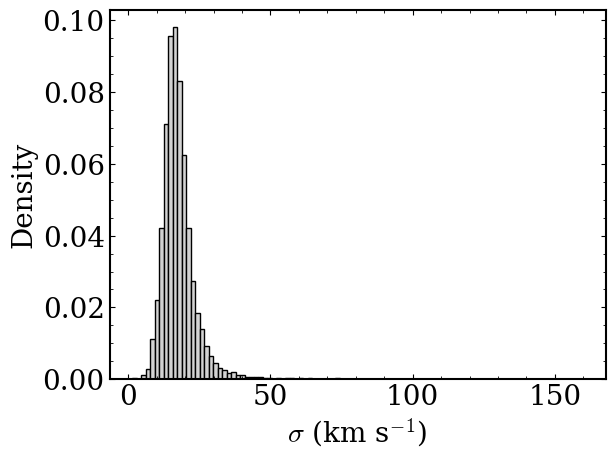

In [19]:
# Optional quick-look velocity-dispersion histogram.
if 'sigma_mean_kms' in cat.columns:
    sigma_values = pd.to_numeric(cat['sigma_mean_kms'], errors='coerce').to_numpy(dtype=float)
    sigma_values = sigma_values[np.isfinite(sigma_values)]
    plt.hist(sigma_values, bins=100, density=True, color='lightgray', edgecolor='black')
    plt.xlabel(r'$\sigma$ (km s$^{-1}$)')
    plt.ylabel('Density')
    plt.show()
else:
    print('sigma_mean_kms is not available yet. Run the final notebook 7 kinematic update cell first.')



In [20]:
cat.columns

Index(['region_id', 'npix_region', 'npix_dig_annulus', 'dig_annulus_inner_px',
       'dig_annulus_width_px', 'dig_annulus_outer_px', 'dig_annulus_source',
       'F_Halpha_sum_nodig', 'F_Halpha_e_sum_nodig', 'SNR_Halpha_sum_nodig',
       ...
       'nearest_pn_pc', 'nearest_compact_pc', 'nearest_compact_boundary_pix',
       'extra_sf_high_bpt_clean', 'extra_sf_region_size_col',
       'extra_sf_sigma_col', 'extra_sf_region_size_p05_pc',
       'extra_sf_sigma_p95_kms', 'high_bpt_halpha_snr_col',
       'mosaic_sf_high_bpt_category'],
      dtype='object', length=529)

In [21]:
for col in cat.columns:
    print(col)

region_id
npix_region
npix_dig_annulus
dig_annulus_inner_px
dig_annulus_width_px
dig_annulus_outer_px
dig_annulus_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_local_median
Halpha_dig_method
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
Halpha_dig_model_sum
Halpha_dig_subtracted_sum
Halpha_dig_fraction_raw
Halpha_dig_background_smooth_sigma_px
Halpha_dig_max_subtraction_fraction
F_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_local_median
Hbeta_dig_method
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
Hbeta_dig_model_sum
Hbeta_dig_subtracted_sum
Hbeta_dig_fraction_raw
Hbeta_dig_background_smooth_sigma_px
Hbeta_dig_max_subtraction_fraction
F_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_local_median
[OIII]5007_dig_method
[OIII]5007_dig_mad
[OIII]5007_

In [22]:
# number of selected star-forming regions
sf_count = int(selected_star_forming_mask(cat).sum())
print(f"Star-forming definition: {star_forming_definition_label()}")
print(f'Number of selected star-forming regions: {sf_count} out of {len(cat)}')

Star-forming definition: BPT star-forming
Number of selected star-forming regions: 5134 out of 5893


In [23]:
np.nanmin(cat['SNR_Halpha_sum'])

#how many regions have SNR_Halpha_sum <= 3.0?
low_snr_count = np.sum(cat['SNR_Halpha_sum'] <= 3.0)
print(f"Number of regions with SNR_Halpha_sum <= 3.0: {low_snr_count}")

Number of regions with SNR_Halpha_sum <= 3.0: 35


In [24]:
# min(cat['area_px_after_carve'])

#how many regions have area_px_after_carve <= 20 and low Halpha flux?
small_region_count = np.sum((cat['area_px_after_carve'] <= 20))
print(f"Number of regions with area_px_after_carve <= 20 and F_Halpha <= 10.0: {small_region_count}")
#which field are these regions in?
small_regions = cat[(cat['area_px_after_carve'] <= 20)]
print(small_regions[['field', 'area_px_after_carve', 'F_Halpha_sum_dered']])

Number of regions with area_px_after_carve <= 20 and F_Halpha <= 10.0: 0
Empty DataFrame
Columns: [field, area_px_after_carve, F_Halpha_sum_dered]
Index: []


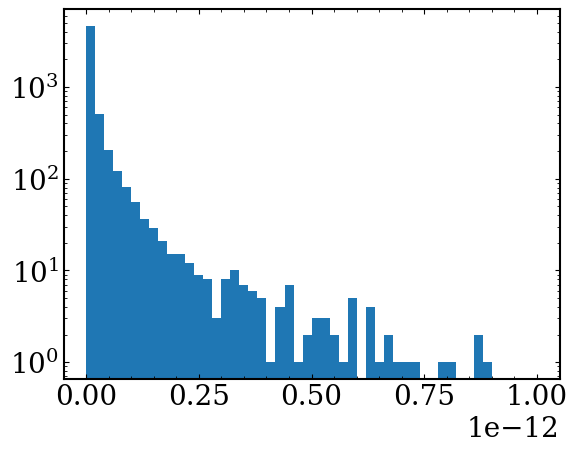

In [25]:
plt.hist(cat["F_Halpha_sum_dered"], bins=50, range=(1e-18, 1e-12), log=True)
# plt.xscale('log')
plt.show()

In [26]:
def load_available_flux_catalog(method, dig_mode, primary_only=True):
    base_dir = Path('CATALOGS') / 'flux_catalogs' / method / dig_mode
    preferred_paths = [
        base_dir / 'total_flux_catalog_combined.csv',
        base_dir / 'total_flux_catalog.csv',
    ]

    df = None
    source = None
    for path in preferred_paths:
        if path.exists():
            df = pd.read_csv(path)
            source = str(path)
            break

    if df is None:
        field_paths = sorted(base_dir.glob('flux_catalog_*.csv'))
        if not field_paths:
            raise FileNotFoundError(f'No available flux catalogs found in {base_dir}')
        df = pd.concat((pd.read_csv(path) for path in field_paths), ignore_index=True, sort=False)
        source = f'{len(field_paths)} field catalogs from {base_dir}'

    if primary_only and 'primary' in df.columns:
        df = df.loc[df['primary'].fillna(True)].copy().reset_index(drop=True)

    return df, source


cat_nodig, nodig_source = load_available_flux_catalog(catalog_method, 'no_dig', primary_only=primary_only)
cat_digsub, digsub_source = load_available_flux_catalog(catalog_method, 'dig_subtracted', primary_only=primary_only)

dig_before = cat_nodig['log_L_Ha_sum_dered'].to_numpy(dtype=float)
dig_after = cat_digsub['log_L_Ha_sum_dered'].to_numpy(dtype=float)

dig_before = dig_before[np.isfinite(dig_before)]
dig_after = dig_after[np.isfinite(dig_after)]


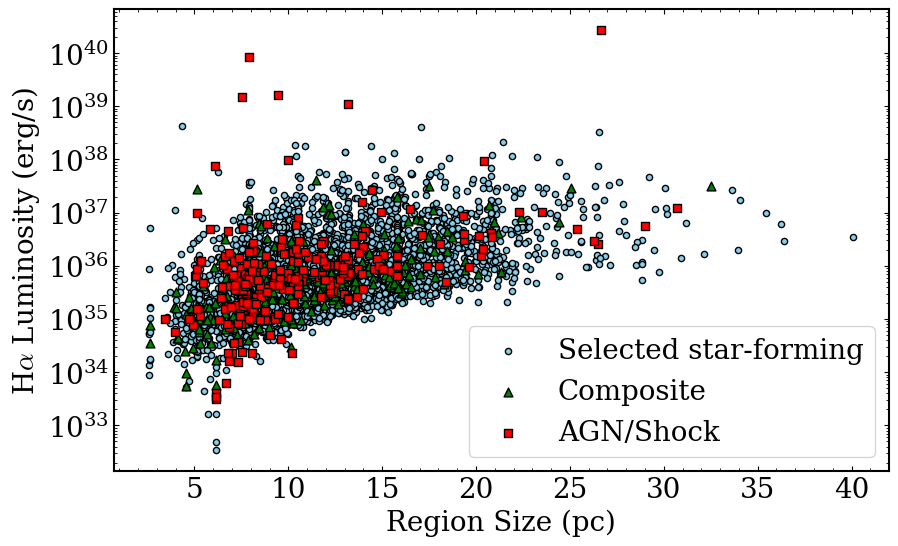

In [27]:
# plot radius vs luminosity
#don't include regions with tiny radius
mask = (cat['radius_p16_pc'] > 1) & (cat['radius_p50_pc'] > 1) & (cat['radius_p84_pc'] > 1)

plt.figure(figsize=(10, 6))
# plt.scatter(cat['radius_p84_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'purple', label = r'84\% radius')

selected_sf_radius_mask = selected_star_forming_mask(cat)
plt.scatter(cat['radius_p50_pc'][mask & selected_sf_radius_mask], 
            cat['L_Ha_sum_dered'][mask & selected_sf_radius_mask], 
            s=20, alpha=1, edgecolor='k', color = 'skyblue', marker='o', label='Selected star-forming')

plt.scatter(cat['radius_p50_pc'][mask & (cat['BPT_class_sum_dered'] == 'Composite')], 
            cat['L_Ha_sum_dered'][mask & (cat['BPT_class_sum_dered'] == 'Composite')], 
            s=40, alpha=1, edgecolor='k', color = 'green', marker='^', label='Composite')

plt.scatter(cat['radius_p50_pc'][mask & (cat['BPT_class_sum_dered'] == 'AGN/Shock')], 
            cat['L_Ha_sum_dered'][mask & (cat['BPT_class_sum_dered'] == 'AGN/Shock')], 
            s=40, alpha=1, edgecolor='k', color = 'red', marker='s', label='AGN/Shock')

# plt.scatter(cat['radius_p16_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'hotpink', label = r'16\% radius')
plt.yscale('log')
plt.xlabel('Region Size (pc)')
plt.ylabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.legend()
plt.savefig(paper_plot_path('M33_HII_luminosity_vs_radius_BPT.png', subdir='scaling_relations'), dpi=300, bbox_inches='tight')
plt.show()


In [28]:
# Shared color dictionaries are initialized near the top of the notebook so early plots can use them.
# Recompute here as a harmless refresh before the radial-gradient section.
property_cmap = plt.get_cmap('rainbow')
property_color_positions = {
    'sum_A_V': 0.38,
    'L_Ha_sum_dered': 0.52,
    'ne_SII_cm3': 0.66,
    'logU_KK04': 0.76,
    'log_P_thermal_SII_over_k': 0.86,
    'radius_areaeq_pc': 0.94,
}
color_dic = {key: property_cmap(pos) for key, pos in property_color_positions.items()}
lf_comparison_colors = {
    'pre_dig': property_cmap(0.48),
    'dig_corrected': color_dic['L_Ha_sum_dered'],
}


In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FuncFormatter, NullFormatter
from types import SimpleNamespace

def plot_radial_gradient(
    cat,
    xcol,
    ycol,
    mask=None,
    bins=None,
    color='C0',
    xlabel='Galactocentric Radius (kpc)',
    ylabel='Value',
    title=None,
    scatter_label=None,
    summary_label=r'Median $\pm 1\sigma$ in bins',
    xlim=None,
    ylim=None,
    yscale='linear',
    xscale='linear',
    x_major_ticks=None,
    x_tick_plain=False,
    savepath=None,
    show=True,
    figsize=(10, 6),
    scatter_kwargs=None,
    errorbar_kwargs=None,
    binned_kwargs=None,
    fit_points=True,
    fit_bins=True,
    fit_points_range=None,
    fit_bins_range=None,
    alpha=0.5,
    fit_logy_points=False,
    fit_logy_bins=False,
    fit_logx_points=False,
    fit_logx_bins=False,
    fit_equation_x='x',
    fit_equation_y='y',
    log_base=10,
    fit_name=None,
    err_col=None,
    err_from_fractional_cols=None,
    asymmetric_err_cols=None,
    fit_intrinsic_scatter=True,
):
    """
    Plot a radial gradient for ycol vs xcol, including scatter points, binned
    median with 16th/84th percentile error bars, and linear fits.

    Parameters
    ----------
    cat : dict-like, pandas DataFrame, astropy Table, or structured array
        Catalog containing xcol and ycol.
    xcol : str
        Name of the radius column (x-axis).
    ycol : str
        Name of the quantity column (y-axis).
    mask : array-like of bool, optional
        Boolean mask selecting rows to plot. If None, uses finite values only.
    bins : array-like, optional
        Bin edges. Default is np.arange(0, 20, 0.5).
    color : str, optional
        Main plot color for scatter and binned markers.
    xlabel, ylabel : str, optional
        Axis labels.
    title : str, optional
        Plot title.
    scatter_label : str, optional
        Label for scatter points.
    summary_label : str, optional
        Label for binned median/error bars.
    xlim, ylim : tuple, optional
        Axis limits.
    yscale : str, optional
        Y-axis scaling.
    xscale : str, optional
        X-axis scaling.
    savepath : str, optional
        If given, save figure to this path.
    show : bool, optional
        Whether to display the plot.
    figsize : tuple, optional
        Figure size.
    scatter_kwargs : dict, optional
        Extra kwargs for raw scatter points.
    errorbar_kwargs : dict, optional
        Extra kwargs for error bars.
    binned_kwargs : dict, optional
        Extra kwargs for binned markers.
    fit_points : bool, optional
        If True, fit all raw points with a straight line.
    fit_bins : bool, optional
        If True, fit binned medians with a straight line.
    fit_points_range : tuple, optional
        (xmin, xmax) range over which to fit raw points.
    fit_bins_range : tuple, optional
        (xmin, xmax) range over which to fit binned points.
    alpha : float, optional
        Alpha for raw scatter points.

    Returns
    -------
    results : dict
        Dictionary with bin_centers, medians, lower_errs, upper_errs, counts,
        point_fit, and binned_fit.
    """
    x = np.asarray(cat[xcol])
    y = np.asarray(cat[ycol])

    if mask is None:
        mask = np.isfinite(x) & np.isfinite(y)
    else:
        mask = np.asarray(mask) & np.isfinite(x) & np.isfinite(y)

    point_error_spec = dict(
        err_col=err_col,
        err_from_fractional_cols=err_from_fractional_cols,
        asymmetric_err_cols=asymmetric_err_cols,
    )
    yerr_points_full = _extract_y_error_array(cat, point_error_spec, y, fit_logy=fit_logy_points)

    if bins is None:
        bins = np.arange(0, 20, 0.5)

    scatter_defaults = dict(
        s=30,
        alpha=alpha,
        facecolors='none',
        edgecolors=color,
        linewidths=1.0,
        marker='o',
        label=scatter_label,
        zorder=1,
    )
    if scatter_kwargs is not None:
        scatter_defaults.update(scatter_kwargs)

    errorbar_defaults = dict(
        fmt='none',
        ecolor='k',
        elinewidth=1.5,
        capsize=4,      # caps added
        capthick=1.5,
        zorder=3,
    )
    if errorbar_kwargs is not None:
        errorbar_defaults.update(errorbar_kwargs)

    binned_defaults = dict(
        s=180,
        marker='h',
        facecolors=color,
        edgecolors='k',
        linewidths=1.5,
        zorder=4,
        label=summary_label,
    )
    if binned_kwargs is not None:
        binned_defaults.update(binned_kwargs)

    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    medians = []
    lower_errs = []
    upper_errs = []
    counts = []

    for i in range(len(bins) - 1):
        in_bin = (x >= bins[i]) & (x < bins[i + 1]) & mask
        counts.append(np.sum(in_bin))

        if np.sum(in_bin) > 0:
            y_bin = y[in_bin]
            medians.append(np.median(y_bin))
            lower_errs.append(np.percentile(y_bin, 16))
            upper_errs.append(np.percentile(y_bin, 84))
        else:
            medians.append(np.nan)
            lower_errs.append(np.nan)
            upper_errs.append(np.nan)

    medians = np.array(medians)
    lower_errs = np.array(lower_errs)
    upper_errs = np.array(upper_errs)
    counts = np.array(counts)

    valid_bins = np.isfinite(medians)

    fig, ax = plt.subplots(figsize=figsize)

    # Raw points
    ax.scatter(x[mask], y[mask], **scatter_defaults)

    # Error bars for binned points
    ax.errorbar(
        bin_centers[valid_bins],
        medians[valid_bins],
        yerr=[
            medians[valid_bins] - lower_errs[valid_bins],
            upper_errs[valid_bins] - medians[valid_bins]
        ],
        **errorbar_defaults
    )

    # Binned hexagon markers
    ax.scatter(
        bin_centers[valid_bins],
        medians[valid_bins],
        **binned_defaults
    )

    point_fit = None
    binned_fit = None
    point_fit_stats = None
    binned_fit_stats = None

    # Fit all points
    if fit_points:
        fit_mask_points = mask.copy()
        if fit_points_range is not None:
            xmin, xmax = fit_points_range
            fit_mask_points &= (x >= xmin) & (x <= xmax)

        if np.sum(fit_mask_points) >= 2:
            x_fit_data = x[fit_mask_points]
            y_fit_data = y[fit_mask_points]
            yerr_fit_data = yerr_points_full[fit_mask_points]

            # remove non-positive values if taking logs
            if fit_logx_points or fit_logy_points:
                positive = np.ones(len(y_fit_data), dtype=bool)
                if fit_logx_points:
                    positive &= x_fit_data > 0
                if fit_logy_points:
                    positive &= y_fit_data > 0
                x_fit_data = x_fit_data[positive]
                y_fit_data = y_fit_data[positive]
                yerr_fit_data = yerr_fit_data[positive]

            x_fit_raw = x_fit_data.copy()
            if fit_logx_points:
                x_fit_data = np.log10(x_fit_data) if log_base == 10 else np.log(x_fit_data)

            if fit_logy_points:
                if log_base == 10:
                    y_fit_data = np.log10(y_fit_data)
                else:
                    y_fit_data = np.log(y_fit_data)

            if len(y_fit_data) >= 2:
                point_regression = _fit_result_from_curve_fit(
                    x_fit_data,
                    y_fit_data,
                    yerr_fit_data,
                    include_intrinsic_scatter=fit_intrinsic_scatter,
                )
                if point_regression is None:
                    raise RuntimeError('curve_fit failed for point fit')
                m_pts, b_pts = point_regression.slope, point_regression.intercept
                point_fit = (m_pts, b_pts)
                point_fit_stats = {
                    'slope': m_pts,
                    'intercept': b_pts,
                    'slope_stderr': point_regression.stderr,
                    'intercept_stderr': point_regression.intercept_stderr,
                    'n_points': point_regression.n_points,
                    'weighted': point_regression.weighted,
                    'covariance': point_regression.covariance,
                    'intrinsic_scatter': point_regression.intrinsic_scatter,
                }

                if fit_logx_points:
                    if xlim is not None and xlim[0] > 0 and xlim[1] > xlim[0]:
                        xfit_pts = np.geomspace(xlim[0], xlim[1], 300)
                    else:
                        xfit_pts = np.geomspace(np.nanmin(x_fit_raw), np.nanmax(x_fit_raw), 300)
                elif xlim is not None:
                    xfit_pts = np.linspace(xlim[0], xlim[1], 300)
                else:
                    xfit_pts = np.linspace(np.nanmin(x_fit_data), np.nanmax(x_fit_data), 300)

                if fit_logy_points:
                    # convert back to linear space
                    if log_base == 10:
                        xfit_eval = np.log10(xfit_pts) if fit_logx_points else xfit_pts
                        yfit_pts = 10**(m_pts * xfit_eval + b_pts)
                        rhs_x = fr'\log({fit_equation_x})' if fit_logx_points else fit_equation_x
                        label = fr'$\log({fit_equation_y}) = ({m_pts:.3f}\pm{point_regression.stderr:.3f})\,{rhs_x} {b_pts:+.3f}\pm{point_regression.intercept_stderr:.3f}$'
                    else:
                        xfit_eval = np.log(xfit_pts) if fit_logx_points else xfit_pts
                        yfit_pts = np.exp(m_pts * xfit_eval + b_pts)
                        rhs_x = fr'\ln({fit_equation_x})' if fit_logx_points else fit_equation_x
                        label = fr'$\ln({fit_equation_y}) = ({m_pts:.3f}\pm{point_regression.stderr:.3f})\,{rhs_x} {b_pts:+.3f}\pm{point_regression.intercept_stderr:.3f}$'
                else:
                    xfit_eval = np.log10(xfit_pts) if fit_logx_points and log_base == 10 else (np.log(xfit_pts) if fit_logx_points else xfit_pts)
                    yfit_pts = m_pts * xfit_eval + b_pts
                    rhs_x = fr'\log({fit_equation_x})' if fit_logx_points else fit_equation_x
                    label = fr'${fit_equation_y} = ({m_pts:.3f}\pm{point_regression.stderr:.3f})\,{rhs_x} {b_pts:+.3f}\pm{point_regression.intercept_stderr:.3f}$'

                _plot_slope_error_band(
                    ax, xfit_pts, xfit_eval, point_regression,
                    fit_logy=fit_logy_points, log_base=log_base,
                )
                ax.plot(
                    xfit_pts,
                    yfit_pts,
                    color='k',
                    linestyle='-',
                    linewidth=2.5,
                    label=label,
                    zorder=5,
                )

    # Fit binned medians
    if fit_bins:
        fit_mask_bins = valid_bins.copy()
        if fit_bins_range is not None:
            xmin, xmax = fit_bins_range
            fit_mask_bins &= (bin_centers >= xmin) & (bin_centers <= xmax)

        if np.sum(fit_mask_bins) >= 2:
            x_fit_data = bin_centers[fit_mask_bins]
            y_fit_data = medians[fit_mask_bins]

            yerr_bin_all = 0.5 * ((medians - lower_errs) + (upper_errs - medians))
            yerr_fit_data = yerr_bin_all[fit_mask_bins]

            if fit_logx_bins or fit_logy_bins:
                positive = np.ones(len(y_fit_data), dtype=bool)
                if fit_logx_bins:
                    positive &= x_fit_data > 0
                if fit_logy_bins:
                    positive &= y_fit_data > 0
                x_fit_data = x_fit_data[positive]
                y_fit_data = y_fit_data[positive]
                yerr_fit_data = yerr_fit_data[positive]

            x_fit_raw = x_fit_data.copy()
            if fit_logx_bins:
                x_fit_data = np.log10(x_fit_data) if log_base == 10 else np.log(x_fit_data)

            if fit_logy_bins:
                if log_base == 10:
                    y_fit_data = np.log10(y_fit_data)
                else:
                    y_fit_data = np.log(y_fit_data)

            if len(y_fit_data) >= 2:
                if fit_logy_bins:
                    yerr_fit_data = yerr_fit_data / (y_fit_data * np.log(10))
                binned_regression = _fit_result_from_curve_fit(
                    x_fit_data,
                    y_fit_data,
                    yerr_fit_data,
                    include_intrinsic_scatter=fit_intrinsic_scatter,
                )
                if binned_regression is None:
                    raise RuntimeError('curve_fit failed for binned fit')
                m_bin, b_bin = binned_regression.slope, binned_regression.intercept
                binned_fit = (m_bin, b_bin)
                binned_fit_stats = {
                    'slope': m_bin,
                    'intercept': b_bin,
                    'slope_stderr': binned_regression.stderr,
                    'intercept_stderr': binned_regression.intercept_stderr,
                    'n_points': binned_regression.n_points,
                    'weighted': binned_regression.weighted,
                    'covariance': binned_regression.covariance,
                    'intrinsic_scatter': binned_regression.intrinsic_scatter,
                }

                if fit_logx_bins:
                    if xlim is not None and xlim[0] > 0 and xlim[1] > xlim[0]:
                        xfit_bin = np.geomspace(xlim[0], xlim[1], 300)
                    else:
                        xfit_bin = np.geomspace(np.nanmin(x_fit_raw), np.nanmax(x_fit_raw), 300)
                elif xlim is not None:
                    xfit_bin = np.linspace(xlim[0], xlim[1], 300)
                else:
                    xfit_bin = np.linspace(np.nanmin(x_fit_data), np.nanmax(x_fit_data), 300)

                if fit_logy_bins:
                    if log_base == 10:
                        xfit_eval = np.log10(xfit_bin) if fit_logx_bins else xfit_bin
                        yfit_bin = 10**(m_bin * xfit_eval + b_bin)
                        rhs_x = fr'\log({fit_equation_x})' if fit_logx_bins else fit_equation_x
                        label = fr'$\log({fit_equation_y}) = ({m_bin:.3f}\pm{binned_regression.stderr:.3f})\,{rhs_x} {b_bin:+.3f}\pm{binned_regression.intercept_stderr:.3f}$ (bins)'
                    else:
                        xfit_eval = np.log(xfit_bin) if fit_logx_bins else xfit_bin
                        yfit_bin = np.exp(m_bin * xfit_eval + b_bin)
                        rhs_x = fr'\ln({fit_equation_x})' if fit_logx_bins else fit_equation_x
                        label = fr'$\ln({fit_equation_y}) = ({m_bin:.3f}\pm{binned_regression.stderr:.3f})\,{rhs_x} {b_bin:+.3f}\pm{binned_regression.intercept_stderr:.3f}$ (bins)'
                else:
                    xfit_eval = np.log10(xfit_bin) if fit_logx_bins and log_base == 10 else (np.log(xfit_bin) if fit_logx_bins else xfit_bin)
                    yfit_bin = m_bin * xfit_eval + b_bin
                    rhs_x = fr'\log({fit_equation_x})' if fit_logx_bins else fit_equation_x
                    label = fr'${fit_equation_y} = ({m_bin:.3f}\pm{binned_regression.stderr:.3f})\,{rhs_x} {b_bin:+.3f}\pm{binned_regression.intercept_stderr:.3f}$ (bins)'

                _plot_slope_error_band(
                    ax, xfit_bin, xfit_eval, binned_regression,
                    fit_logy=fit_logy_bins, log_base=log_base,
                )
                ax.plot(
                    xfit_bin,
                    yfit_bin,
                    color='k',
                    linestyle='--',
                    linewidth=2.5,
                    label=label,
                    zorder=5,
                )

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.minorticks_on()
    ax.set_xscale(xscale)
    ax.set_yscale(yscale)

    if title is not None:
        ax.set_title(title)
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)


    def _plain_axis_tick(value, _pos):
        if not np.isfinite(value):
            return ''
        if np.isclose(value, np.round(value), rtol=0, atol=1e-8):
            return f'{int(np.round(value))}'
        return f'{value:g}'

    if x_major_ticks is not None:
        ticks = []
        for tick in x_major_ticks:
            tick = float(tick)
            if not np.isfinite(tick):
                continue
            if xscale == 'log' and tick <= 0:
                continue
            if xlim is not None and not (min(xlim) <= tick <= max(xlim)):
                continue
            ticks.append(tick)
        if ticks:
            ax.xaxis.set_major_locator(FixedLocator(ticks))
            ax.xaxis.set_minor_formatter(NullFormatter())
    if x_tick_plain:
        ax.xaxis.set_major_formatter(FuncFormatter(_plain_axis_tick))

    handles, labels = ax.get_legend_handles_labels()
    if len(handles) > 0:
        leg = ax.legend(
            loc='upper right',
            frameon=True,
            framealpha=1.0,
            edgecolor='k',
            fancybox=False,
        )
        leg.get_frame().set_linewidth(1.5)

    if savepath is not None:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')

    if show:
        plt.show()
    else:
        plt.close()

    results = {
        'bin_centers': bin_centers,
        'medians': medians,
        'lower_errs': lower_errs,
        'upper_errs': upper_errs,
        'counts': counts,
        'point_fit': point_fit,
        'binned_fit': binned_fit,
        'point_fit_stats': point_fit_stats,
        'binned_fit_stats': binned_fit_stats,
    }
    if fit_name is not None:
        radial_gradient_fit_results[fit_name] = results
    return results



def _linear_model(x, slope, intercept):
    return slope * x + intercept


def _fit_result_from_curve_fit(x, y, yerr=None, include_intrinsic_scatter=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    if yerr is None:
        yerr = np.full_like(y, np.nan, dtype=float)
    else:
        yerr = np.asarray(yerr, dtype=float)

    ok = np.isfinite(x) & np.isfinite(y)
    x = x[ok]
    y = y[ok]
    yerr = yerr[ok]
    if len(x) < 2:
        return None

    good_err = np.isfinite(yerr) & (yerr > 0)
    weighted = good_err.sum() >= 2
    x_fit = x[good_err] if weighted else x
    y_fit = y[good_err] if weighted else y
    sigma = yerr[good_err] if weighted else None
    if len(x_fit) < 2:
        return None

    intrinsic_scatter = np.nan
    p0 = [0.0, float(np.nanmedian(y_fit))]
    if include_intrinsic_scatter:
        try:
            initial_popt, _ = curve_fit(
                _linear_model,
                x_fit,
                y_fit,
                p0=p0,
                sigma=sigma,
                absolute_sigma=weighted,
                maxfev=10000,
            )
            residuals = y_fit - _linear_model(x_fit, *initial_popt)
            if len(residuals) > 2:
                raw_var = float(np.nanvar(residuals, ddof=2))
                meas_var = float(np.nanmedian(sigma**2)) if sigma is not None else 0.0
                intrinsic_scatter = np.sqrt(max(raw_var - meas_var, 0.0))
                if np.isfinite(intrinsic_scatter) and intrinsic_scatter > 0:
                    sigma = np.sqrt((sigma if sigma is not None else np.zeros_like(y_fit))**2 + intrinsic_scatter**2)
                    weighted = True
                    p0 = list(initial_popt)
        except Exception:
            pass
    try:
        popt, pcov = curve_fit(
            _linear_model,
            x_fit,
            y_fit,
            p0=p0,
            sigma=sigma,
            absolute_sigma=weighted,
            maxfev=10000,
        )
    except Exception:
        return None

    perr = np.sqrt(np.diag(pcov)) if pcov is not None and np.all(np.isfinite(pcov)) else [np.nan, np.nan]
    return SimpleNamespace(
        slope=float(popt[0]),
        intercept=float(popt[1]),
        stderr=float(perr[0]),
        intercept_stderr=float(perr[1]),
        n_points=len(x_fit),
        weighted=weighted,
        covariance=pcov,
        intrinsic_scatter=float(intrinsic_scatter) if np.isfinite(intrinsic_scatter) else np.nan,
    )

def _extract_y_error_array(df, spec, y, fit_logy=False):
    y = np.asarray(y, dtype=float)
    err = np.full_like(y, np.nan, dtype=float)

    err_col = spec.get('err_col')
    if err_col and err_col in df.columns:
        err = pd.to_numeric(df[err_col], errors='coerce').to_numpy(dtype=float)
    elif spec.get('err_from_fractional_cols'):
        value_col, value_err_col = spec['err_from_fractional_cols']
        if value_col in df.columns and value_err_col in df.columns:
            value = pd.to_numeric(df[value_col], errors='coerce').to_numpy(dtype=float)
            value_err = pd.to_numeric(df[value_err_col], errors='coerce').to_numpy(dtype=float)
            frac = value_err / value
            err = frac / np.log(10)
            return np.where(np.isfinite(err) & (err > 0), err, np.nan)
    elif spec.get('asymmetric_err_cols'):
        lo_col, hi_col = spec['asymmetric_err_cols']
        if lo_col in df.columns and hi_col in df.columns:
            lo = pd.to_numeric(df[lo_col], errors='coerce').to_numpy(dtype=float)
            hi = pd.to_numeric(df[hi_col], errors='coerce').to_numpy(dtype=float)
            err = 0.5 * (np.abs(lo) + np.abs(hi))

    if fit_logy:
        err = err / (y * np.log(10))
    return np.where(np.isfinite(err) & (err > 0), err, np.nan)


def _plot_slope_error_band(ax, xline, xeval, fit, fit_logy=False, log_base=10):
    if fit is None:
        return
    pcov = getattr(fit, 'covariance', None)
    if pcov is not None:
        pcov = np.asarray(pcov, dtype=float)
    if pcov is None or pcov.shape != (2, 2) or not np.all(np.isfinite(pcov)):
        slope_err = getattr(fit, 'stderr', np.nan)
        intercept_err = getattr(fit, 'intercept_stderr', np.nan)
        if not (np.isfinite(slope_err) and np.isfinite(intercept_err)):
            return
        pcov = np.diag([slope_err**2, intercept_err**2])
    yfit = fit.slope * xeval + fit.intercept
    design = np.column_stack([xeval, np.ones_like(xeval)])
    yerr = np.sqrt(np.einsum('ij,jk,ik->i', design, pcov, design))
    low = yfit - yerr
    high = yfit + yerr
    if fit_logy:
        if log_base == 10:
            low = 10 ** low
            high = 10 ** high
        else:
            low = np.exp(low)
            high = np.exp(high)
    ax.fill_between(xline, low, high, color='k', alpha=0.3, linewidth=0, zorder=4)


def _binned_median_percentiles(x, y, bins, mask):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = np.asarray(mask, dtype=bool) & np.isfinite(x) & np.isfinite(y)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    medians = np.full(len(bin_centers), np.nan)
    p16 = np.full(len(bin_centers), np.nan)
    p84 = np.full(len(bin_centers), np.nan)
    counts = np.zeros(len(bin_centers), dtype=int)

    for i in range(len(bin_centers)):
        in_bin = mask & (x >= bins[i]) & (x < bins[i + 1])
        counts[i] = int(in_bin.sum())
        if counts[i] == 0:
            continue
        y_bin = y[in_bin]
        medians[i] = np.nanmedian(y_bin)
        p16[i] = np.nanpercentile(y_bin, 16)
        p84[i] = np.nanpercentile(y_bin, 84)

    return bin_centers, medians, p16, p84, counts


def _average_y_error(df, spec, mask):
    """Return a representative one-sigma y error in plotted units, if available."""
    err_col = spec.get('err_col')
    if err_col and err_col in df.columns:
        err = pd.to_numeric(df.loc[mask, err_col], errors='coerce').to_numpy(dtype=float)
        err = err[np.isfinite(err) & (err > 0)]
        return float(np.nanmedian(err)) if len(err) else np.nan

    if spec.get('err_from_fractional_cols'):
        value_col, value_err_col = spec['err_from_fractional_cols']
        if value_col in df.columns and value_err_col in df.columns:
            value = pd.to_numeric(df.loc[mask, value_col], errors='coerce').to_numpy(dtype=float)
            value_err = pd.to_numeric(df.loc[mask, value_err_col], errors='coerce').to_numpy(dtype=float)
            frac = value_err / value
            log_err = frac / np.log(10)
            log_err = log_err[np.isfinite(log_err) & (log_err > 0)]
            return float(np.nanmedian(log_err)) if len(log_err) else np.nan

    if spec.get('asymmetric_err_cols'):
        lo_col, hi_col = spec['asymmetric_err_cols']
        if lo_col in df.columns and hi_col in df.columns:
            lo = pd.to_numeric(df.loc[mask, lo_col], errors='coerce').to_numpy(dtype=float)
            hi = pd.to_numeric(df.loc[mask, hi_col], errors='coerce').to_numpy(dtype=float)
            err = 0.5 * (np.abs(lo) + np.abs(hi))
            err = err[np.isfinite(err) & (err > 0)]
            return float(np.nanmedian(err)) if len(err) else np.nan

    return np.nan


def _axis_fraction_to_data_y(ax, frac):
    ymin, ymax = ax.get_ylim()
    if ax.get_yscale() == 'log':
        return 10 ** (np.log10(ymin) + frac * (np.log10(ymax) - np.log10(ymin)))
    return ymin + frac * (ymax - ymin)


def _axis_fraction_to_data_x(ax, frac):
    xmin, xmax = ax.get_xlim()
    return xmin + frac * (xmax - xmin)


def _draw_average_error_marker(ax, avg_err, color):
    x0 = _axis_fraction_to_data_x(ax, 0.075)
    y0 = _axis_fraction_to_data_y(ax, 0.80)
    if np.isfinite(avg_err) and avg_err > 0:
        ax.errorbar(
            [x0], [y0], yerr=[[avg_err], [avg_err]],
            fmt='none', ecolor='k', elinewidth=1.15,
            capsize=3.0, capthick=1.15, zorder=7,
        )
        ax.text(
            0.13, 0.80, r'$\tilde{\sigma}$=' + f'{avg_err:.2g}',
            transform=ax.transAxes, va='center', ha='left', fontsize=10,
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.65, pad=1.5),
        )
    else:
        return


def _format_slope_label(fit, units):
    if fit is None:
        return None
    slope_err = fit.stderr if np.isfinite(fit.stderr) else np.nan
    prefix = '' if getattr(fit, 'weighted', False) else ''
    if np.isfinite(slope_err):
        return rf'{prefix}$m = {fit.slope:.3g} \pm {slope_err:.2g}$ {units}'
    return rf'{prefix}$m = {fit.slope:.3g}$ {units}'


def _fit_and_plot_gradient_line(ax, x, y, mask, xlim, color='k', fit_logy=False, yerr=None, include_intrinsic_scatter=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    if yerr is None:
        yerr = np.full_like(y, np.nan, dtype=float)
    else:
        yerr = np.asarray(yerr, dtype=float)
    fit_mask = np.asarray(mask, dtype=bool) & np.isfinite(x) & np.isfinite(y)
    if fit_logy:
        fit_mask &= y > 0
    if fit_mask.sum() < 2:
        return None

    y_fit = np.log10(y[fit_mask]) if fit_logy else y[fit_mask]
    fit = _fit_result_from_curve_fit(
        x[fit_mask],
        y_fit,
        yerr[fit_mask],
        include_intrinsic_scatter=include_intrinsic_scatter,
    )
    if fit is None:
        return None
    xline = np.linspace(xlim[0], xlim[1], 300)
    yline_fit = fit.slope * xline + fit.intercept
    yline = 10 ** yline_fit if fit_logy else yline_fit
    _plot_slope_error_band(ax, xline, xline, fit, fit_logy=fit_logy)
    ax.plot(xline, yline, color=color, lw=2.0, zorder=5)
    return fit


def plot_combined_radial_gradients_with_histograms(
    df,
    specs,
    xcol='R_gal_kpc',
    bins=None,
    xlim=(0, 20),
    figsize=(11.5, 15.0),
    savepath=None,
    show=True,
    show_hist_stats=True,
    show_slope_legend=True,
):
    """Stack radial-gradient panels with a sideways distribution histogram beside each panel."""
    if bins is None:
        bins = np.arange(0, 20, 0.5)

    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(
        nrows=len(specs),
        ncols=2,
        width_ratios=[5.2, 1.15],
        hspace=0.1,
        wspace=0.02,
    )

    main_axes = []
    hist_axes = []
    x = pd.to_numeric(df[xcol], errors='coerce').to_numpy(dtype=float)

    for i, spec in enumerate(specs):
        ax = fig.add_subplot(gs[i, 0], sharex=main_axes[0] if main_axes else None)
        hax = fig.add_subplot(gs[i, 1], sharey=ax)
        main_axes.append(ax)
        hist_axes.append(hax)

        y = pd.to_numeric(df[spec['ycol']], errors='coerce').to_numpy(dtype=float)
        mask = np.asarray(spec['mask'], dtype=bool) & np.isfinite(x) & np.isfinite(y)
        color = spec.get('color', 'C0')

        ax.scatter(
            x[mask], y[mask],
            s=10, alpha=0.16, facecolors='none', edgecolors=color,
            linewidths=0.55, zorder=1,
        )

        bin_centers, medians, p16, p84, counts = _binned_median_percentiles(x, y, bins, mask)
        valid = np.isfinite(medians)
        ax.errorbar(
            bin_centers[valid], medians[valid],
            yerr=[medians[valid] - p16[valid], p84[valid] - medians[valid]],
            fmt='none', ecolor='k', elinewidth=1.05, capsize=2.5, capthick=1.05,
            zorder=3,
        )
        ax.scatter(
            bin_centers[valid], medians[valid],
            s=54, marker='D', facecolors=color, edgecolors='k', linewidths=0.8,
            zorder=4,
        )

        fit_logy_points = spec.get('fit_logy_points', False)
        yerr_for_fit = _extract_y_error_array(df, spec, y, fit_logy=fit_logy_points)
        fit = _fit_and_plot_gradient_line(
            ax, x, y, mask, xlim=xlim, color='k',
            fit_logy=fit_logy_points, yerr=yerr_for_fit,
            include_intrinsic_scatter=spec.get('fit_intrinsic_scatter', True),
        )

        ax.set_ylabel(spec['ylabel'], fontsize=13)
        ax.set_xlim(*xlim)
        if spec.get('ylim') is not None:
            ax.set_ylim(*spec['ylim'])
        ax.set_yscale(spec.get('yscale', 'linear'))
        ax.minorticks_on()
        ax.tick_params(labelsize=11)
        if i < len(specs) - 1:
            ax.tick_params(labelbottom=False)
        else:
            ax.set_xlabel('Galactocentric Radius (kpc)', fontsize=14)

        data = y[mask]
        data = data[np.isfinite(data)]
        if len(data):
            if spec.get('yscale', 'linear') == 'log':
                positive = data[data > 0]
                if len(positive):
                    hist_bins = np.geomspace(np.nanmin(positive), np.nanmax(positive), 36)
                else:
                    hist_bins = 30
            else:
                hist_bins = 36
            hax.hist(
                data, bins=hist_bins, orientation='horizontal',
                color=color, alpha=0.22, edgecolor='k', linewidth=0.55,
            )
            median = np.nanmedian(data)
            p16_all = np.nanpercentile(data, 16)
            p84_all = np.nanpercentile(data, 84)
            stat_handles = [
                hax.axhline(p16_all, color=color, linestyle='--', lw=1.2, label=f'16th {p16_all:.2g}'),
                hax.axhline(median, color=color, linestyle='-', lw=1.7, label=f'50th {median:.2g}'),
                hax.axhline(p84_all, color=color, linestyle='--', lw=1.2, label=f'84th {p84_all:.2g}'),
            ]
            if show_hist_stats:
                hax.legend(
                    handles=stat_handles, loc='upper right', frameon=False,
                    fontsize=7.5, handlelength=1.3, borderpad=0.2, labelspacing=0.15,
                )

        hax.set_yscale(spec.get('yscale', 'linear'))
        hax.tick_params(axis='y', labelleft=False, labelright=False)
        hax.tick_params(axis='x', labelsize=9)
        hax.set_xlabel('$N$', fontsize=10)
        hax.minorticks_on()
        hax.grid(False)

        avg_err = _average_y_error(df, spec, mask)
        _draw_average_error_marker(ax, avg_err, color)

        legend_handles = []
        if i == 0:
            legend_handles.append(mpl.lines.Line2D(
                [], [], marker='D', linestyle='none', markersize=7,
                markerfacecolor='0.65', markeredgecolor='k',
                label=r'Median $\pm$ 1$\sigma$ in radial bins',
            ))
        slope_label = _format_slope_label(fit, spec.get('slope_units', 'kpc$^{-1}$'))
        if show_slope_legend and slope_label is not None:
            legend_handles.append(mpl.lines.Line2D(
                [], [], color='k', lw=2.0, label=slope_label,
            ))
        if legend_handles:
            ax.legend(handles=legend_handles, loc='upper right', frameon=False, fontsize=9.5)

    fig.align_ylabels(main_axes)

    if savepath is not None:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    if show:
        plt.show()
    else:
        plt.close(fig)
    return fig, main_axes, hist_axes


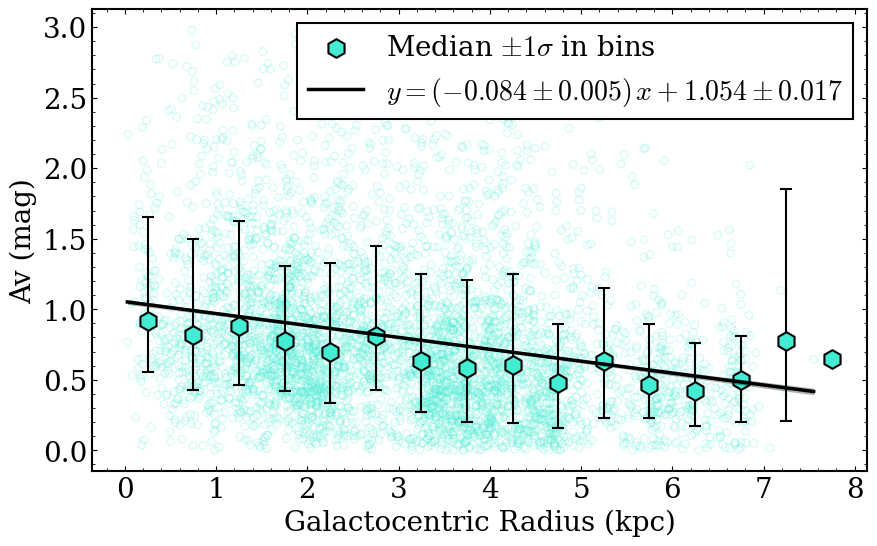

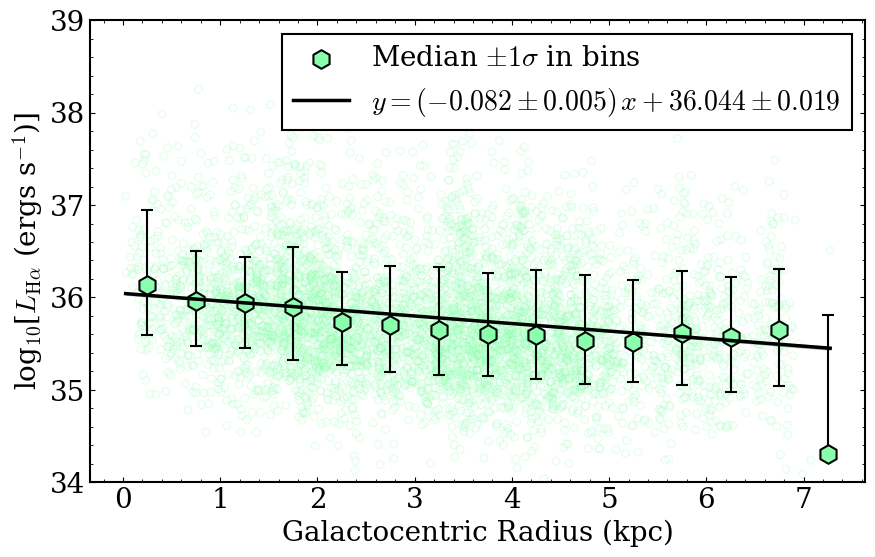

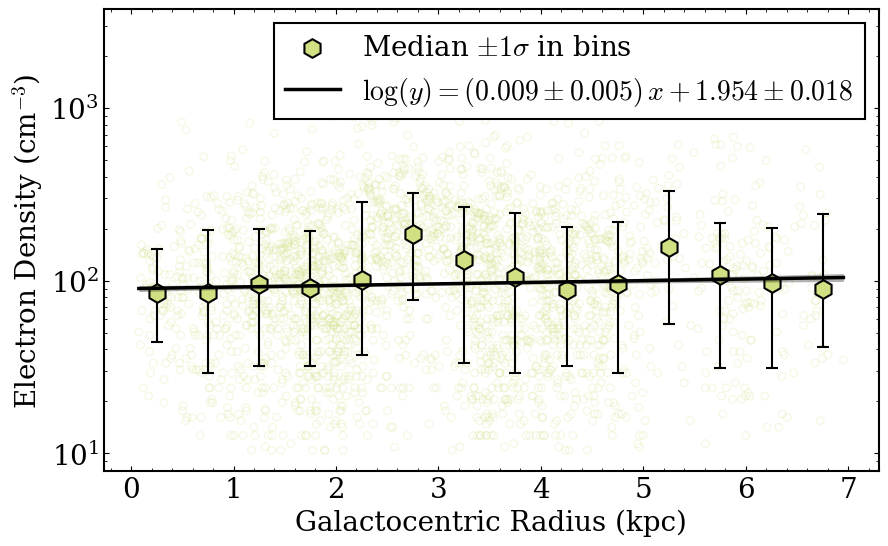

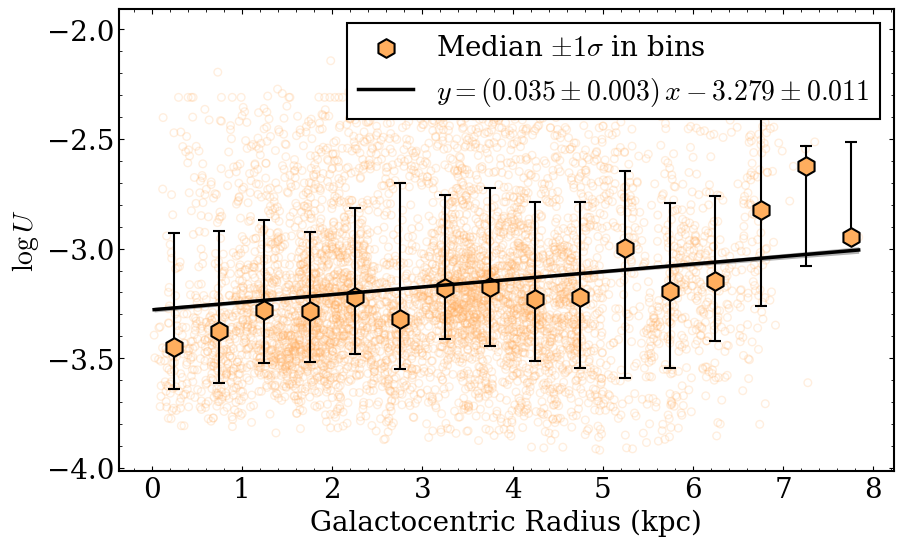

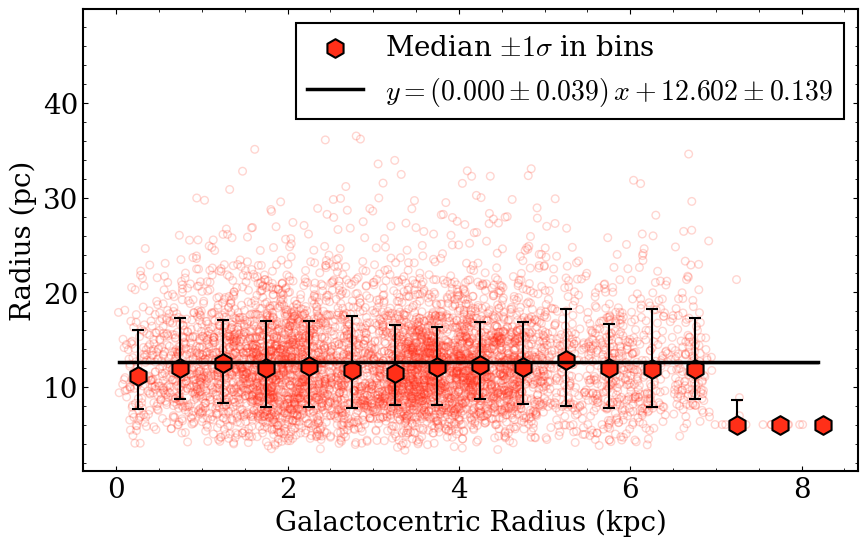

In [30]:
"""
AV
"""
mask = (
    np.isfinite(cat['sum_A_V']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['sum_A_V'] > 0) &
    (cat['sum_A_V'] < 3)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='sum_A_V',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['sum_A_V'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'Av (mag)',
    fit_bins=False,
    alpha = 0.2,
    fit_name='radialAv',
    savepath=str(paper_plot_path('M33_HII_Av_vs_Rgal.png', subdir='radial_gradients'))
)

"""
Ha Luminosity
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['L_Ha_sum_dered'] < 1e40) &
    (cat['L_Ha_sum_dered'] > 1e34)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='log_L_Ha_sum_dered',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['L_Ha_sum_dered'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'log$_{10}$[$L_{\rm H\alpha}$ (ergs s$^{-1}$)]',
    ylim=(34, 39),
    # yscale='log',
    alpha=0.2,
    fit_bins=False,
    fit_logy_points=False,
    fit_logy_bins=False,
    fit_name='radialLHa',
    savepath=str(paper_plot_path('M33_HII_L_Ha_sum_dered_vs_Rgal.png', subdir='radial_gradients'))
)
"""
ne
"""
mask = (
    np.isfinite(cat['ne_SII_cm3']) &
    np.isfinite(cat['R_gal_kpc']) &
    cat['ne_SII_reliable'].fillna(False) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['ne_SII_cm3'] > 10)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='ne_SII_cm3',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    # ylim=(0, 1000),
    yscale='log',
    alpha=0.2,
    fit_bins=False,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_name='radialNe',
    savepath=str(paper_plot_path('M33_HII_ne_SII_cm3_vs_Rgal.png', subdir='radial_gradients'))
)

"""
Ionization parameter
"""

mask = (
    np.isfinite(cat['logU_KK04']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['logU_KK04'] < -2) &
    (cat['logU_KK04'] > -4)
)
results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='logU_KK04',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['logU_KK04'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'$\log U$',
    # ylim=(-4, -2),
    yscale='linear',
    alpha=0.2,
    fit_bins=False,
    fit_name='radialLogU',
    savepath=str(paper_plot_path('M33_HII_log_U_KK04_vs_Rgal.png', subdir='radial_gradients'))
)

"""
Radius
"""

mask = (
    np.isfinite(cat['radius_areaeq_pc']) &
    np.isfinite(cat['R_gal_kpc'])
)
results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='radius_areaeq_pc',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=color_dic['radius_areaeq_pc'],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'Radius (pc)',
    # ylim=(-4, -2),
    fit_bins=False,
    yscale='linear',
    alpha=0.2,
    fit_name='radialRadius',
    savepath=str(paper_plot_path('M33_HII_radius_areaeq_pc_vs_Rgal.png', subdir='radial_gradients'))
)


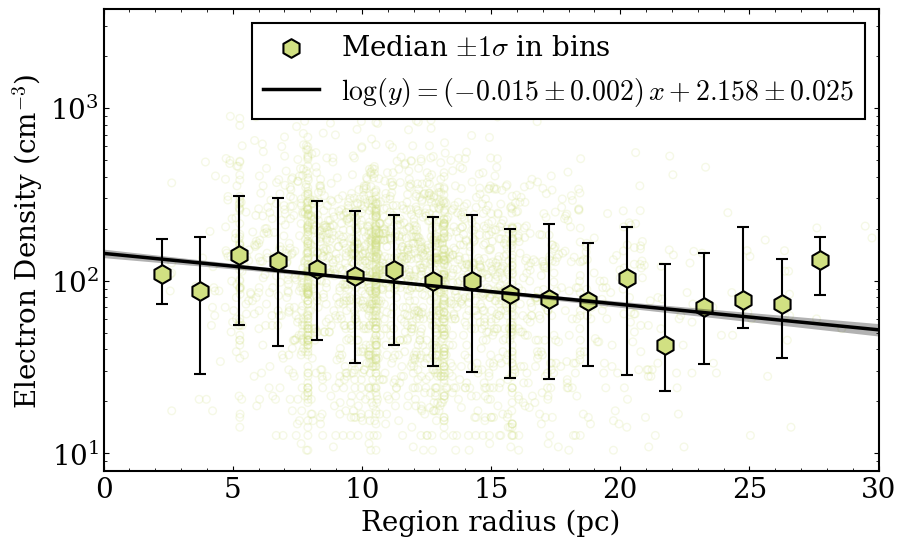

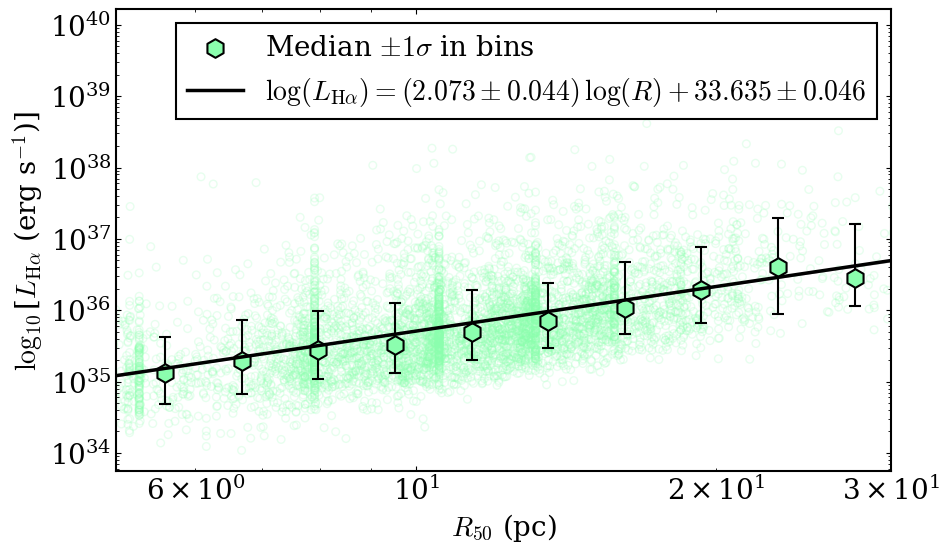

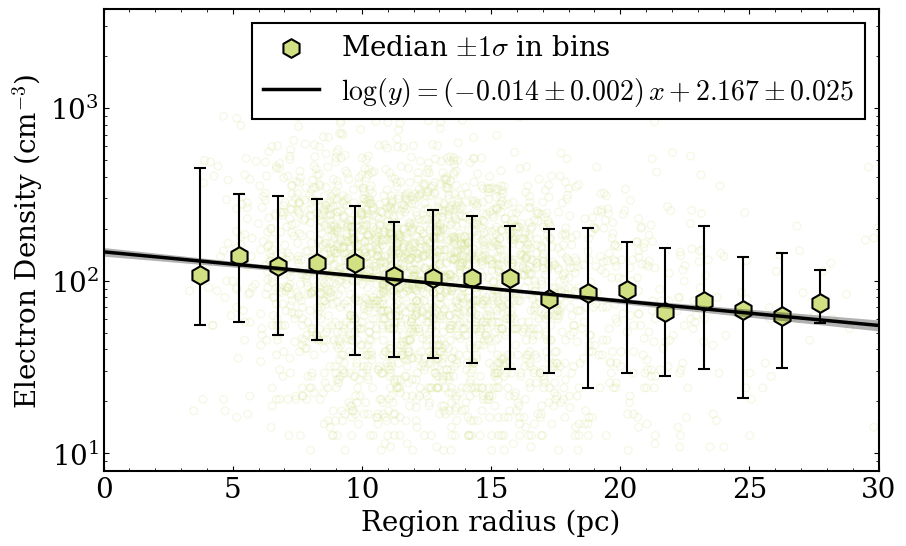

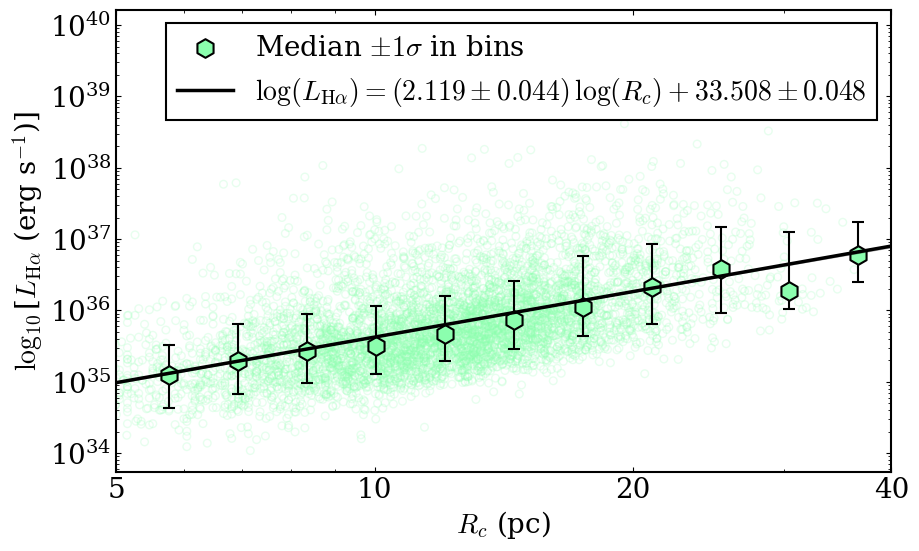

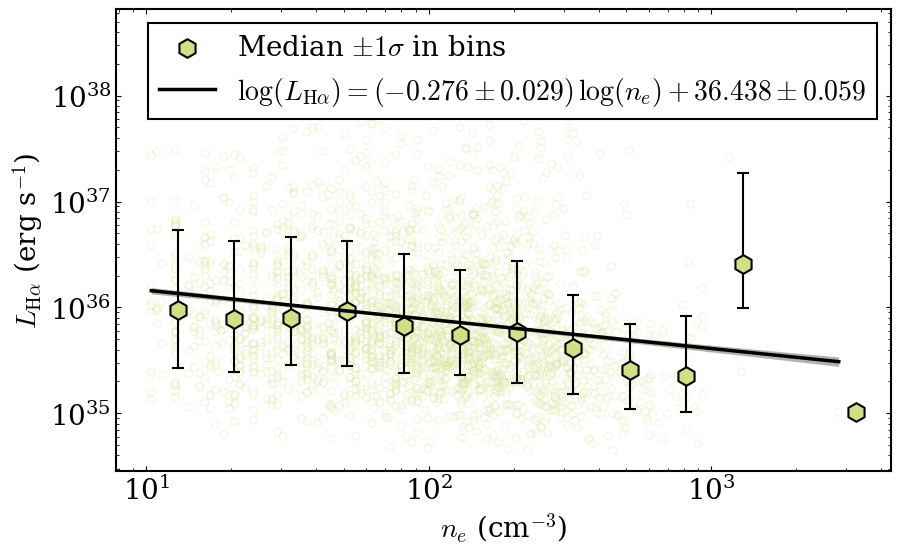

In [31]:
"""
ne
"""
mask = (
    np.isfinite(cat['ne_SII_cm3']) &
    np.isfinite(cat['R_gal_kpc']) &
    cat['ne_SII_reliable'].fillna(False) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['ne_SII_cm3'] > 10)
)
results = plot_radial_gradient(
    cat=cat,
    xcol='radius_p50_pc',
    ycol='ne_SII_cm3',
    mask=mask,
    bins=np.arange(0, 30, 1.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Region radius (pc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    # ylim=(0, 1000),
    yscale='log',
    xlim=(0, 30),
    alpha=0.2,
    fit_bins=False,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_name='scalingR50Ne',
    savepath=str(paper_plot_path('M33_HII_ne_SII_cm3_vs_r50.png', subdir='scaling_relations'))
)

"""
Luminosity vs size
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['radius_p50_pc']) &
    (cat['radius_p50_pc'] > 0) &
    (cat['L_Ha_sum_dered'] > 1e34) &
    (cat['L_Ha_sum_dered'] < 1e40)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='radius_p50_pc',
    ycol='L_Ha_sum_dered',
    mask=mask,
    bins=np.geomspace(3, 30, 14),
    color=color_dic['L_Ha_sum_dered'],
    xlabel=r'$R_{50}$ (pc)',
    ylabel=r'$\log_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
    # ylim=(0, 1000),
    xlim=(5, 30),
    xscale='log',
    yscale='log',
    fit_bins=False,
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_logx_points=True,
    fit_logx_bins=True,
    fit_equation_x=r'R',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_name='scalingR50LHa',
    savepath=str(paper_plot_path('M33_HII_L_Ha_sum_dered_vs_r50.png', subdir='scaling_relations'))
)

"""
ne
"""
mask = (
    np.isfinite(cat['ne_SII_cm3']) &
    np.isfinite(cat['R_gal_kpc']) &
    cat['ne_SII_reliable'].fillna(False) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['ne_SII_cm3'] > 10)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='radius_areaeq_pc',
    ycol='ne_SII_cm3',
    mask=mask,
    bins=np.arange(0, 30, 1.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Region radius (pc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    # ylim=(0, 1000),
    yscale='log',
    xlim=(0, 30),
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_bins=False,
    fit_name='scalingAreaNe',
    savepath=str(paper_plot_path('M33_HII_ne_SII_cm3_vs_areaeq.png', subdir='scaling_relations'))
)

"""
Luminosity vs size
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['radius_areaeq_pc']) &
    (cat['radius_areaeq_pc'] > 0) &
    (cat['L_Ha_sum_dered'] > 1e34) &
    (cat['L_Ha_sum_dered'] < 1e40)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='radius_areaeq_pc',
    ycol='L_Ha_sum_dered',
    mask=mask,
    bins=np.geomspace(3, 40, 15),
    color=color_dic['L_Ha_sum_dered'],
    xlabel=r'$R_c$ (pc)',
    ylabel=r'$\log_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
    # ylim=(0, 1000),
    xlim=(5, 40),
    xscale='log',
    x_major_ticks=(5, 10, 20, 40),
    x_tick_plain=True,
    yscale='log',
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_logx_points=True,
    fit_logx_bins=True,
    fit_equation_x=r'R_c',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_bins=False,
    fit_name='scalingAreaLHa',
    savepath=str(paper_plot_path('M33_HII_L_Ha_sum_dered_vs_areaeq.png', subdir='scaling_relations'))
)


"""
Luminosity vs electron density
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['ne_SII_cm3']) &
    cat['ne_SII_reliable'].fillna(False) &
    (cat['ne_SII_cm3'] > 10) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['L_Ha_sum_dered'] > 1e34) &
    (cat['L_Ha_sum_dered'] < 1e40)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='ne_SII_cm3',
    ycol='L_Ha_sum_dered',
    mask=mask,
    bins=np.logspace(1, 4, 16),
    color=color_dic['ne_SII_cm3'],
    xlabel=r'$n_e$ (cm$^{-3}$)',
    ylabel=r'$L_{\rm H\alpha}$ (erg s$^{-1}$)',
    xscale='log',
    yscale='log',
    fit_bins=False,
    alpha=0.2,
    fit_logx_points=True,
    fit_logy_points=True,
    fit_equation_x=r'n_e',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_name='scalingNeLHa',
    savepath=str(paper_plot_path('M33_HII_L_Ha_sum_dered_vs_ne_SII_cm3.png', subdir='scaling_relations'))
)


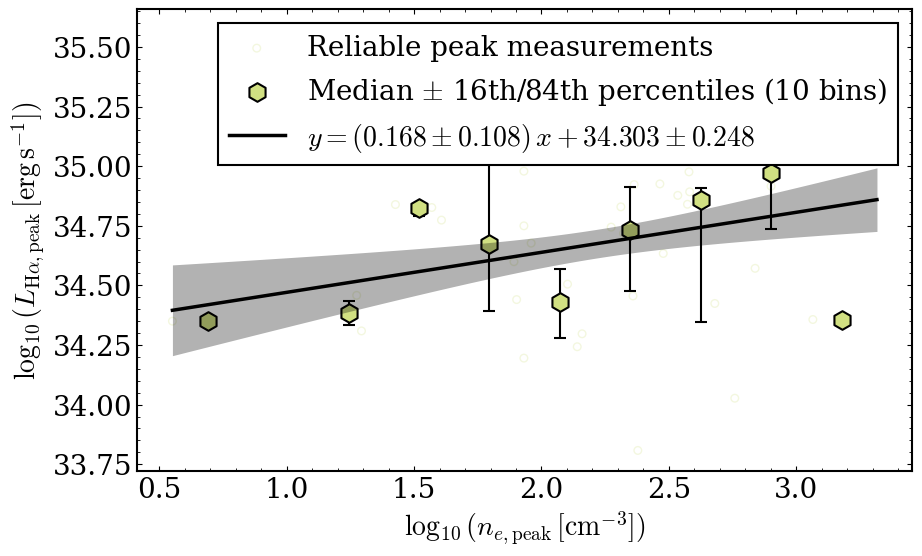

In [32]:
"""
Peak Halpha luminosity vs peak electron density
"""
peak_relation = cat.copy()
peak_relation["log_ne_SII_peak_cm3"] = np.log10(peak_relation["ne_SII_peak_cm3"])

mask = (
    np.isfinite(peak_relation["log_ne_SII_peak_cm3"]) &
    np.isfinite(peak_relation["log_L_Ha_peak_dered"]) &
    peak_relation["ne_SII_peak_reliable"].fillna(False) &
    (peak_relation["ne_SII_peak_cm3"] > 0) &
    (peak_relation["L_Ha_peak_dered"] > 0)
)

if mask.sum() < 2:
    raise ValueError("Need at least two reliable peak-density measurements for this plot.")

x_peak = peak_relation.loc[mask, "log_ne_SII_peak_cm3"].to_numpy()
peak_density_bins = np.linspace(np.nanmin(x_peak), np.nanmax(x_peak), 11)

peak_luminosity_density_results = plot_radial_gradient(
    cat=peak_relation,
    xcol="log_ne_SII_peak_cm3",
    ycol="log_L_Ha_peak_dered",
    mask=mask,
    bins=peak_density_bins,
    color=color_dic.get("ne_SII_cm3", "C6"),
    xlabel=r"$\log_{10}(n_{e,\rm peak}\,[{\rm cm}^{-3}])$",
    ylabel=r"$\log_{10}(L_{{\rm H}\alpha,\rm peak}\,[{\rm erg\,s}^{-1}])$",
    scatter_label="Reliable peak measurements",
    summary_label=r"Median $\pm$ 16th/84th percentiles (10 bins)",
    alpha=0.25,
    fit_points=True,
    fit_bins=False,
    fit_logy_points=False,
    fit_logy_bins=False,
    fit_name="scalingPeakLHaNe",
    savepath=str(paper_plot_path(
        "M33_HII_peak_Ha_luminosity_vs_peak_ne.png",
        subdir="scaling_relations",
    )),
)

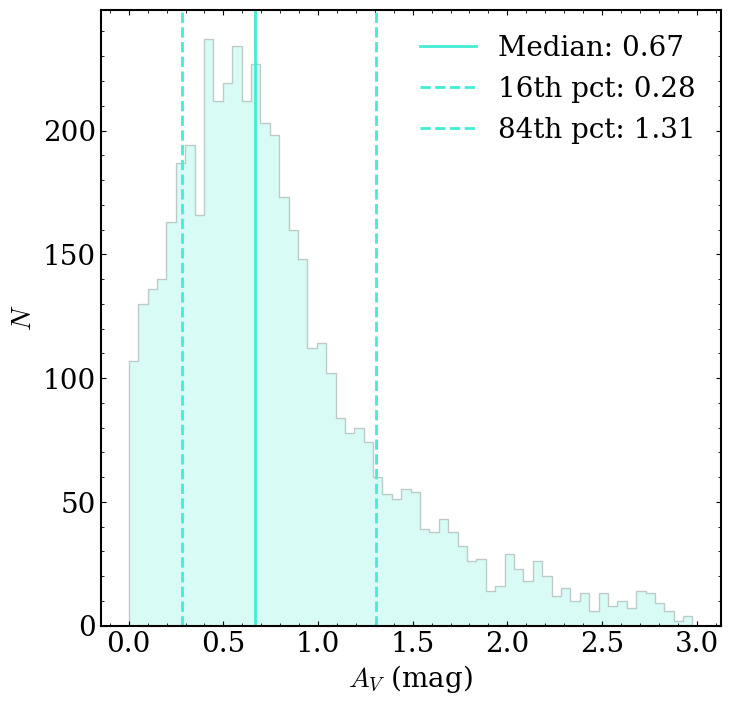

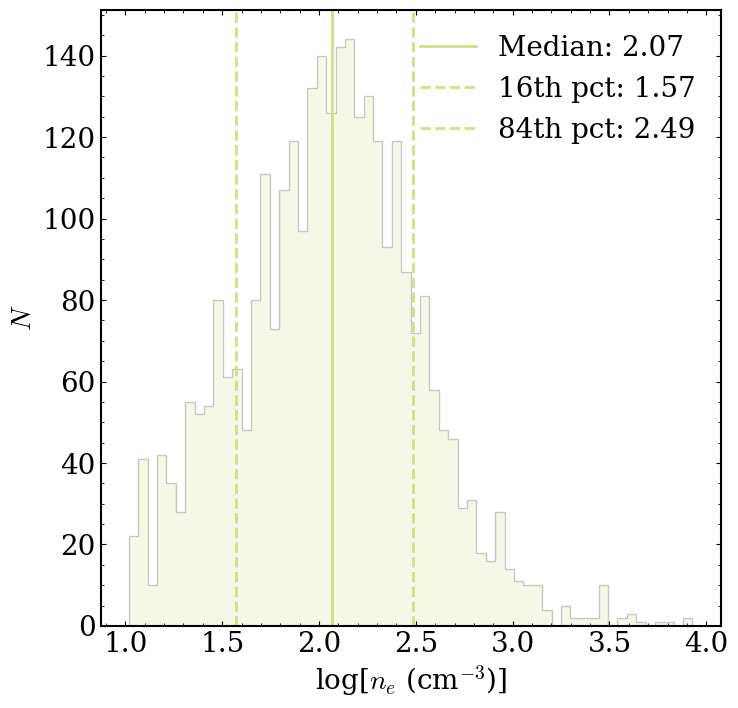

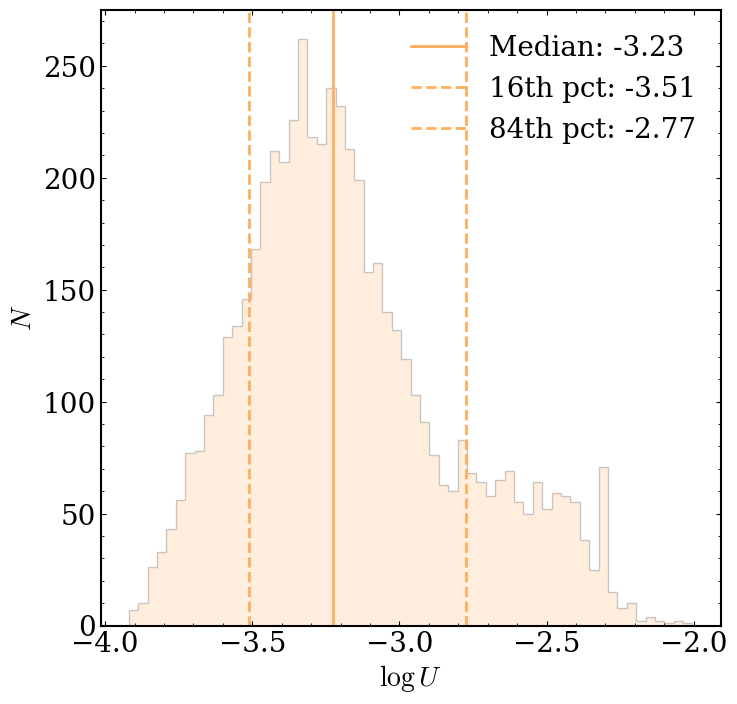

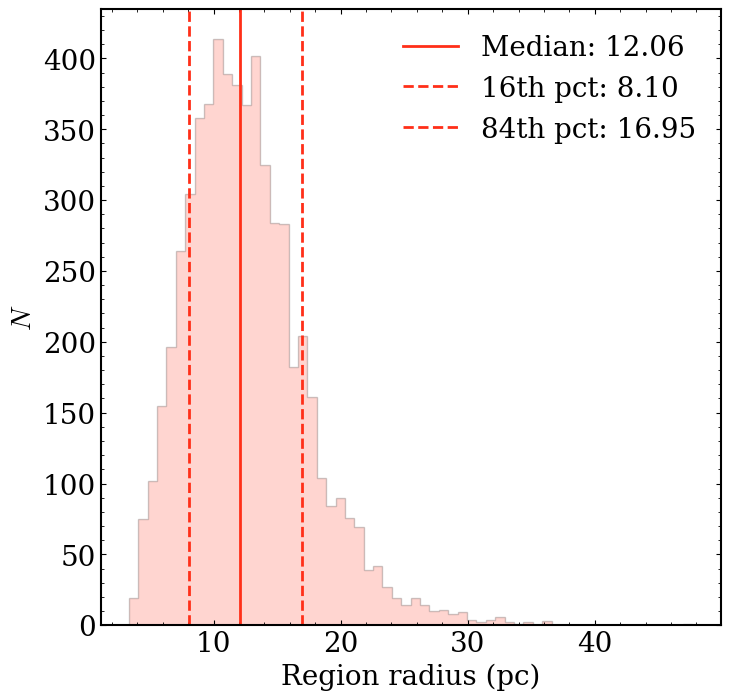

In [33]:
# make a histogram plot of each parameter, showing the median and 16th/84th percentiles
def plot_histogram_with_percentiles(
    cat,
    col,
    mask=None,
    bins=30,
    color='C0',
    xlabel=None,
    ylabel='$N$',
    title=None,
    savepath=None,
    show=True,
    figsize=(8, 8),
    log = False,
):
    data = np.asarray(cat[col])

    if mask is None:
        mask = np.isfinite(data)
    else:
        mask = np.asarray(mask) & np.isfinite(data)

    if log:
        data = np.log10(data[mask])
    else:
        data = data[mask]
        
    if param =='sum_A_V':
        data = data[(data > 0) & (data < 3)]

    if param == 'ne_SII_cm3':
        #log it
        data = data[(data > 10) & (data < 10000)]
        data = np.log10(data)
        
    
    
    median = np.median(data)
    p16 = np.percentile(data, 16)
    p84 = np.percentile(data, 84)
    
    

    plt.figure(figsize=figsize)
    plt.hist(data, bins=bins, color=color, alpha = 0.2, edgecolor='k', histtype='stepfilled', linewidth=1)
    plt.axvline(median, color=color, linestyle='-', lw = 2, label=f'Median: {median:.2f}')
    plt.axvline(p16, color=color, linestyle='--', lw = 2, label=f'16th pct: {p16:.2f}')
    plt.axvline(p84, color=color, linestyle='--', lw = 2, label=f'84th pct: {p84:.2f}')
    plt.xlabel(xlabel if xlabel else col)
    plt.ylabel(ylabel)
    plt.legend(frameon=False)

    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')

    if show:
        plt.show()
    else:
        plt.close()
        
params_to_histogram = [
    'sum_A_V',
    'ne_SII_cm3',
    'logU_KK04',
    'radius_areaeq_pc',
]

xlabels = [
    r'$A_V$ (mag)',
    r'log[$n_e$ (cm$^{-3}$)]',
    r'$\log U$',
    r'Region radius (pc)',
]


for param in params_to_histogram:
    mask = np.isfinite(cat[param])
    plot_histogram_with_percentiles(
        cat=cat,
        col=param,
        mask=mask,
        bins=60,
        color=color_dic.get(param, 'C0'),
        xlabel=xlabels[params_to_histogram.index(param)],
        title=f'Histogram of {param}',
        savepath=str(paper_plot_path(f'M33_HII_histogram_{param}.png', subdir='histograms'))
    )


In [34]:
for col in cat.columns:
    print(col)

region_id
npix_region
npix_dig_annulus
dig_annulus_inner_px
dig_annulus_width_px
dig_annulus_outer_px
dig_annulus_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_local_median
Halpha_dig_method
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
Halpha_dig_model_sum
Halpha_dig_subtracted_sum
Halpha_dig_fraction_raw
Halpha_dig_background_smooth_sigma_px
Halpha_dig_max_subtraction_fraction
F_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_local_median
Hbeta_dig_method
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
Hbeta_dig_model_sum
Hbeta_dig_subtracted_sum
Hbeta_dig_fraction_raw
Hbeta_dig_background_smooth_sigma_px
Hbeta_dig_max_subtraction_fraction
F_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_local_median
[OIII]5007_dig_method
[OIII]5007_dig_mad
[OIII]5007_

In [35]:
#number of regions with Ha luminosity above 1e38.6 erg/s
n_high_luminosity = np.sum(cat['L_Ha_sum_dered'] > 10**38.6)
print(f'Number of regions with L_Ha_sum_dered > 1e38.6 erg/s: {n_high_luminosity}')


Number of regions with L_Ha_sum_dered > 1e38.6 erg/s: 8


In [36]:
# Star-forming, high-SNR-only versions of key catalog plots.
# Uses the same all-lines SNR > 3 criterion as \nregionssnrthree.

def all_lines_snr_mask(df, snr_cut=3.0):
    snr_cols = [
        'SNR_Halpha_sum',
        'SNR_Hbeta_sum',
        'SNR_[OIII]5007_sum',
        'SNR_[SII]6716_sum',
        'SNR_[NII]6583_sum',
    ]
    missing = [col for col in snr_cols if col not in df.columns]
    if missing:
        raise KeyError(f'Missing SNR columns required for star-forming-only plots: {missing}')
    mask = np.ones(len(df), dtype=bool)
    for col in snr_cols:
        mask &= pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float) > snr_cut
    return mask


starforming_snrthree_mask = selected_star_forming_snr_mask(cat, snr_cut=3.0)
cat_starforming_snrthree = cat.loc[starforming_snrthree_mask].copy().reset_index(drop=True)
print(f'Selected star-forming regions with S/N > 3 in all required lines: {len(cat_starforming_snrthree)}')
if 'summarize_logu_pressure_quality_counts' in globals():
    logu_pressure_quality_counts = summarize_logu_pressure_quality_counts(
        cat_starforming_snrthree,
        label='star-forming S/N>3 sample',
    )

# The all-catalog fits were accumulated by the preceding plot cells.
# From here onward, collect the same fit names for the star-forming SNR>3 subset.
all_catalog_radial_gradient_fit_results = dict(radial_gradient_fit_results)
radial_gradient_fit_results = {}


def sf_plot_path(filename, subdir=None):
    sf_subdir = 'star_forming_only' if subdir is None else f'star_forming_only/{subdir}'
    return paper_plot_path(filename, subdir=sf_subdir)


# Region-property histograms for the star-forming, high-SNR subset.
for param, xlabel in zip(params_to_histogram, xlabels):
    mask = np.isfinite(cat_starforming_snrthree[param])
    plot_histogram_with_percentiles(
        cat=cat_starforming_snrthree,
        col=param,
        mask=mask,
        bins=60,
        color=color_dic.get(param, 'C0'),
        xlabel=xlabel,
        title=f'Star-forming, SNR>3 histogram of {param}',
        savepath=str(sf_plot_path(f'M33_HII_histogram_{param}.png', subdir='histograms')),
        show=False,
    )


# Radial gradients for the star-forming, high-SNR subset.
sf_radial_specs = [
    dict(
        filename='M33_HII_Av_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='sum_A_V',
        mask=(
            np.isfinite(cat_starforming_snrthree['sum_A_V']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['sum_A_V'] > 0) &
            (cat_starforming_snrthree['sum_A_V'] < 3)
        ),
        color=color_dic['sum_A_V'],
        ylabel=r'$A_V$ (mag)',
        fit_bins=False,
        alpha=0.2,
        fit_name='radialAv',
    ),
    dict(
        filename='M33_HII_L_Ha_sum_dered_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='log_L_Ha_sum_dered',
        mask=(
            np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40) &
            (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34)
        ),
        color=color_dic['L_Ha_sum_dered'],
        ylabel=r'$\log_{10}[L_{\rm H\alpha}\ ({\rm erg\ s}^{-1})]$',
        fit_bins=False,
        fit_logy_points=False,
        fit_logy_bins=False,
        alpha=0.2,
        fit_name='radialLHa',
    ),
    dict(
        filename='M33_HII_ne_SII_cm3_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='ne_SII_cm3',
        mask=(
            np.isfinite(cat_starforming_snrthree['ne_SII_cm3']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            cat_starforming_snrthree['ne_SII_reliable'].fillna(False) &
            (cat_starforming_snrthree['ne_SII_cm3'] < 10000) &
            (cat_starforming_snrthree['ne_SII_cm3'] > 10)
        ),
        color=color_dic['ne_SII_cm3'],
        ylabel=r'$n_e$ (cm$^{-3}$)',
        yscale='log',
        fit_bins=False,
        fit_logy_points=True,
        fit_logy_bins=True,
        alpha=0.2,
        fit_name='radialNe',
    ),
    dict(
        filename='M33_HII_log_U_KK04_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='logU_KK04',
        mask=(
            np.isfinite(cat_starforming_snrthree['logU_KK04']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['logU_KK04'] < -2) &
            (cat_starforming_snrthree['logU_KK04'] > -4)
        ),
        color=color_dic['logU_KK04'],
        ylabel=r'$\log[U]$',
        yscale='linear',
        fit_bins=False,
        alpha=0.2,
        fit_name='radialLogU',
    ),
    dict(
        filename='M33_HII_radius_areaeq_pc_vs_Rgal.png',
        xcol='R_gal_kpc', ycol='radius_areaeq_pc',
        mask=(
            np.isfinite(cat_starforming_snrthree['radius_areaeq_pc']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc'])
        ),
        color=color_dic['radius_areaeq_pc'],
        ylabel=r'Radius (pc)',
        yscale='linear',
        fit_bins=False,
        alpha=0.2,
        fit_name='radialRadius',
    ),
]

for spec in sf_radial_specs:
    spec = spec.copy()
    filename = spec.pop('filename')
    plot_radial_gradient(
        cat=cat_starforming_snrthree,
        bins=np.arange(0, 20, 0.5),
        xlabel='Galactocentric Radius (kpc)',
        savepath=str(sf_plot_path(filename, subdir='radial_gradients')),
        show=False,
        **spec,
    )


# Combined radial-gradient figure for the star-forming, high-SNR subset.
sf_combined_radial_gradient_specs = [
    dict(
        ycol='sum_A_V',
        mask=(
            np.isfinite(cat_starforming_snrthree['sum_A_V']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['sum_A_V'] > 0) &
            (cat_starforming_snrthree['sum_A_V'] < 3) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['sum_A_V'],
        ylabel=r'$A_V$ (mag)',
        err_col='sum_A_V_err',
        slope_units=r'mag kpc$^{-1}$',
    ),
    dict(
        ycol='log_L_Ha_sum_dered',
        mask=(
            np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40) &
            (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['L_Ha_sum_dered'],
        ylabel=r'$\log_{10}[L_{\rm H\alpha}\ ({\rm erg\ s}^{-1})]$',
        ylim=(34, 39),
        err_from_fractional_cols=('F_Halpha_sum_dered', 'F_Halpha_e_sum_dered'),
        slope_units=r'dex kpc$^{-1}$',
    ),
    dict(
        ycol='ne_SII_cm3',
        mask=(
            np.isfinite(cat_starforming_snrthree['ne_SII_cm3']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            cat_starforming_snrthree['ne_SII_reliable'].fillna(False) &
            (cat_starforming_snrthree['ne_SII_cm3'] < 10000) &
            (cat_starforming_snrthree['ne_SII_cm3'] > 10) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['ne_SII_cm3'],
        ylabel=r'$n_e$ (cm$^{-3}$)',
        yscale='log',
        fit_logy_points=True,
        asymmetric_err_cols=('ne_SII_cm3_mc_minus', 'ne_SII_cm3_mc_plus'),
        slope_units=r'dex kpc$^{-1}$',
    ),
    dict(
        ycol='logU_KK04',
        mask=(
            np.isfinite(cat_starforming_snrthree['logU_KK04']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['logU_KK04'] < -2) &
            (cat_starforming_snrthree['logU_KK04'] > -4) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['logU_KK04'],
        ylabel=r'$\log[U]$',
        err_col='logU_KK04_e',
        slope_units=r'dex kpc$^{-1}$',
    ),
    dict(
        ycol='log_P_thermal_SII_over_k',
        mask=(
            np.isfinite(cat_starforming_snrthree['log_P_thermal_SII_over_k']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            cat_starforming_snrthree.get('P_thermal_SII_reliable', pd.Series(True, index=cat_starforming_snrthree.index)).fillna(False) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['log_P_thermal_SII_over_k'],
        ylabel=r'$\log_{10}[P/k\ ({\rm K\ cm}^{-3})]$',
        slope_units=r'dex kpc$^{-1}$',
    ),
    dict(
        ycol='radius_areaeq_pc',
        mask=(
            np.isfinite(cat_starforming_snrthree['radius_areaeq_pc']) &
            np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
            (cat_starforming_snrthree['R_gal_kpc'] <= 8)
        ),
        color=color_dic['radius_areaeq_pc'],
        ylabel=r'Radius (pc)',
        slope_units=r'pc kpc$^{-1}$',
    ),
]

sf_combined_radial_gradient_fig, sf_combined_radial_gradient_axes, sf_combined_radial_gradient_hist_axes = plot_combined_radial_gradients_with_histograms(
    cat_starforming_snrthree,
    sf_combined_radial_gradient_specs,
    xcol='R_gal_kpc',
    bins=np.arange(0, 8.5, 0.5),
    xlim=(0, 8),
    figsize=(13.5, 15.2),
    savepath=str(sf_plot_path('M33_HII_radial_gradients_multipanel_with_histograms.png', subdir='radial_gradients')),
    show=False,
)
save_for_paper(
    sf_plot_path('M33_HII_radial_gradients_multipanel_with_histograms.png', subdir='radial_gradients'),
    'M33_radial_gradients_histogram.png',
)


# Luminosity-size relations for the star-forming, high-SNR subset.
sf_ne_size_mask = (
    np.isfinite(cat_starforming_snrthree['ne_SII_cm3']) &
    np.isfinite(cat_starforming_snrthree['R_gal_kpc']) &
    cat_starforming_snrthree['ne_SII_reliable'].fillna(False) &
    (cat_starforming_snrthree['ne_SII_cm3'] < 10000) &
    (cat_starforming_snrthree['ne_SII_cm3'] > 10)
)
plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='radius_p50_pc',
    ycol='ne_SII_cm3',
    mask=sf_ne_size_mask,
    bins=np.arange(0, 30, 1.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Region radius (pc)',
    ylabel=r'$n_e$ (cm$^{-3}$)',
    yscale='log',
    xlim=(0, 30),
    alpha=0.2,
    fit_bins=False,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_name='scalingR50Ne',
    savepath=str(sf_plot_path('M33_HII_ne_SII_cm3_vs_r50.png', subdir='scaling_relations')),
    show=False,
)

sf_lha_r50_mask = (
    np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
    np.isfinite(cat_starforming_snrthree['radius_p50_pc']) &
    (cat_starforming_snrthree['radius_p50_pc'] > 0) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40)
)
plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='radius_p50_pc',
    ycol='L_Ha_sum_dered',
    mask=sf_lha_r50_mask,
    bins=np.geomspace(3, 30, 14),
    color=color_dic['L_Ha_sum_dered'],
    xlabel=r'$R_{50}$ (pc)',
    ylabel=r'$\log_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
    xscale='log',
    yscale='log',
    xlim=(3, 30),
    fit_bins=False,
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_logx_points=True,
    fit_logx_bins=True,
    fit_equation_x=r'R',
    fit_equation_y=r'L_{\rm H\alpha}',
    err_from_fractional_cols=('F_Halpha_sum_dered', 'F_Halpha_e_sum_dered'),
    fit_name='scalingR50LHa',
    savepath=str(sf_plot_path('M33_HII_L_Ha_sum_dered_vs_r50.png', subdir='scaling_relations')),
    show=False,
)

plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='radius_areaeq_pc',
    ycol='ne_SII_cm3',
    mask=sf_ne_size_mask,
    bins=np.arange(0, 30, 1.5),
    color=color_dic['ne_SII_cm3'],
    xlabel='Region radius (pc)',
    ylabel=r'$n_e$ (cm$^{-3}$)',
    yscale='log',
    xlim=(0, 30),
    alpha=0.2,
    fit_logy_points=True,
    fit_logy_bins=True,
    fit_bins=False,
    fit_name='scalingAreaNe',
    savepath=str(sf_plot_path('M33_HII_ne_SII_cm3_vs_areaeq.png', subdir='scaling_relations')),
    show=False,
)

cat_starforming_snrthree['log_radius_areaeq_pc'] = np.log10(cat_starforming_snrthree['radius_areaeq_pc'])
# Fit logL versus logR with the luminosity measurement error and an
# intrinsic-scatter term added in quadrature. The intrinsic term prevents
# tiny formal flux errors from over-constraining the relation.

sf_lha_area_mask = (
    np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
    np.isfinite(cat_starforming_snrthree['radius_areaeq_pc']) &
    (cat_starforming_snrthree['radius_areaeq_pc'] > 0) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40)
)
plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='log_radius_areaeq_pc',
    ycol='log_L_Ha_sum_dered',
    mask=sf_lha_area_mask,
    bins=np.linspace(np.log10(3), np.log10(40), 15),
    color=color_dic['L_Ha_sum_dered'],
    xlabel=r'$\log_{10}(R_c\ [{\rm pc}])$',
    ylabel=r'$\log_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]',
    xscale='linear',
    yscale='linear',
    xlim=(np.log10(3), np.log10(40)),
    alpha=0.2,
    fit_logy_points=False,
    fit_logy_bins=False,
    fit_logx_points=False,
    fit_logx_bins=False,
    fit_equation_x=r'\log R_c',
    fit_equation_y=r'\log L_{\rm H\alpha}',
    err_from_fractional_cols=('F_Halpha_sum_dered', 'F_Halpha_e_sum_dered'),
    fit_intrinsic_scatter=True,
    fit_bins=False,
    fit_name='scalingAreaLHa',
    savepath=str(sf_plot_path('M33_HII_L_Ha_sum_dered_vs_areaeq.png', subdir='scaling_relations')),
    show=False,
)
save_for_paper(
    sf_plot_path('M33_HII_L_Ha_sum_dered_vs_areaeq.png', subdir='scaling_relations'),
    'M33_L_R.png',
)

# Peak Halpha luminosity vs peak electron density for the star-forming, high-SNR subset.
sf_peak_relation = cat_starforming_snrthree.copy()
sf_peak_relation['log_ne_SII_peak_cm3'] = np.log10(sf_peak_relation['ne_SII_peak_cm3'])
sf_peak_mask = (
    np.isfinite(sf_peak_relation['log_ne_SII_peak_cm3']) &
    np.isfinite(sf_peak_relation['log_L_Ha_peak_dered']) &
    sf_peak_relation['ne_SII_peak_reliable'].fillna(False) &
    (sf_peak_relation['ne_SII_peak_cm3'] > 0) &
    (sf_peak_relation['L_Ha_peak_dered'] > 0)
)
if sf_peak_mask.sum() >= 2:
    sf_x_peak = sf_peak_relation.loc[sf_peak_mask, 'log_ne_SII_peak_cm3'].to_numpy()
    sf_peak_density_bins = np.linspace(np.nanmin(sf_x_peak), np.nanmax(sf_x_peak), 11)
    plot_radial_gradient(
        cat=sf_peak_relation,
        xcol='log_ne_SII_peak_cm3',
        ycol='log_L_Ha_peak_dered',
        mask=sf_peak_mask,
        bins=sf_peak_density_bins,
        color=color_dic.get('ne_SII_cm3', 'C6'),
        xlabel=r'$\log_{10}(n_{e,\rm peak}\,[{\rm cm}^{-3}])$',
        ylabel=r'$\log_{10}(L_{{\rm H}\alpha,\rm peak}\,[{\rm erg\,s}^{-1}])$',
        scatter_label='Reliable peak measurements',
        summary_label=r'Median $\pm$ 16th/84th percentiles (10 bins)',
        alpha=0.25,
        fit_points=True,
        fit_bins=False,
        fit_logy_points=False,
        fit_logy_bins=False,
        fit_name='scalingPeakLHaNe',
        savepath=str(sf_plot_path('M33_HII_peak_Ha_luminosity_vs_peak_ne.png', subdir='scaling_relations')),
        show=False,
    )
else:
    print('Skipping star-forming peak luminosity-density fit: fewer than two reliable points.')


Selected star-forming regions with S/N > 3 in all required lines: 4578
Saved paper draft figure: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/PAPER_PLOTS_DRAFT1/M33_radial_gradients_histogram.png
Saved paper draft figure: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/PAPER_PLOTS_DRAFT1/M33_L_R.png


In [37]:

# --- helper: parse "Paper (Year)" out of your existing label strings ---
_paper_re = re.compile(r"\(([^()]+?\d{4})\)\s*$")  # grabs content in last "(...)" that ends with a year


def extract_paper_id(label: str) -> str:
    """
    Returns something stable like:
      'Kobulnicky & Kewley 2004'
      'Dopita et al. 2016'
    Falls back to full label if it can't parse.
    """
    m = _paper_re.search(label)
    return m.group(1).strip() if m else str(label).strip()


METALLICITY_COLUMN_INFO = {
    'Z_12logOH': ('KK04 iterative', 'R23/O32'),
    'Z_N2_Brazzini2024': ('Brazzini et al. 2024', 'N2'),
    'Z_O3N2_Brazzini2024': ('Brazzini et al. 2024', 'O3N2'),
    'Z_N2S2Halpha_Brazzini2024': ('Brazzini et al. 2024', r'N2S2H$\alpha$'),
    'Z_R3_Brazzini2024': ('Brazzini et al. 2024', 'R3'),
    'Z_R23_Maiolino2008': ('Maiolino et al. 2008', 'R23'),
    'Z_N2_Maiolino2008': ('Maiolino et al. 2008', 'N2'),
    'Z_R23_Curti2017': ('Curti et al. 2017', 'R23'),
    'Z_R3_Curti2017': ('Curti et al. 2017', 'R3'),
    'Z_N2_Curti2017': ('Curti et al. 2017', 'N2'),
    'Z_O3N2_Curti2017': ('Curti et al. 2017', 'O3N2'),
    'Z_R_Pilyugin2016_highN2': ('Pilyugin et al. 2016 high N2', 'R'),
    'Z_R_Pilyugin2016_lowN2': ('Pilyugin et al. 2016 low N2', 'R'),
    'Z_S_Pilyugin2016_highN2': ('Pilyugin et al. 2016 high N2', 'S'),
    'Z_S_Pilyugin2016_lowN2': ('Pilyugin et al. 2016 low N2', 'S'),
    'Z_R23_KK2004': ('Kobulnicky & Kewley 2004', 'R23'),
    'Z_NII_KD2002': ('Kewley & Dopita 2002', 'NII'),
    'Z_D2016': ('Dopita et al. 2016', r'N2S2$\alpha$'),
    'Z_O3N2_M2013': ('Marino et al. 2013', 'O3N2'),
    'Z_N2_M2013': ('Marino et al. 2013', 'N2'),
    'Z_C2001': ('Charlot & Longhetti 2001', 'CL01'),
    'Z_N2_PP2004': ('Pettini \\& Pagel 2004', 'N2'),
    'Z_O3N2_PP2004': ('Pettini \\& Pagel 2004', 'O3N2'),
    'Z_N2_Brown2016': ('Brown et al. 2016', 'N2'),
    'Z_O3N2_Brown2016': ('Brown et al. 2016', 'O3N2'),
    'Z_N2O2_Brown2016': ('Brown et al. 2016', 'N2O2'),
    'Z_N2O2_KD2002': ('Kewley & Dopita 2002', 'N2O2'),
}


def _infer_metallicity_column_info(col):
    stem = col.removeprefix('Z_')
    parts = stem.split('_')
    if len(parts) == 1:
        return (parts[0], parts[0])
    indicator = parts[0]
    reference = ' '.join(parts[1:])
    return (reference, indicator)


def build_metallicity_calibrations(df, include_all=True):
    """Build the calibration registry for every saved metallicity column in the catalog."""
    nan_series = lambda: pd.Series(np.nan, index=df.index)
    cols = [
        col for col in df.columns
        if col.startswith('Z_') and not col.endswith('_e') and f'{col}_e' in df.columns
    ]
    if not include_all:
        cols = [col for col in METALLICITY_COLUMN_INFO if col in df.columns]
    ordered = [col for col in METALLICITY_COLUMN_INFO if col in cols]
    ordered += sorted(col for col in cols if col not in METALLICITY_COLUMN_INFO)
    calibrations = []
    for col in ordered:
        label, line_group = METALLICITY_COLUMN_INFO.get(col, _infer_metallicity_column_info(col))
        calibrations.append((df[col], df.get(f'{col}_e', nan_series()), label, line_group, col))
    return calibrations


# --- unified calibration registry ---
# Each entry: (data_array, error_array, label, line_group, column_name)
calibrations = build_metallicity_calibrations(cat)


In [38]:
from itertools import cycle

def build_style_map(calibrations):
    paper_ids = []
    for item in calibrations:
        label = item[2]
        pid = extract_paper_id(label)
        if pid not in paper_ids:
            paper_ids.append(pid)
    print(len(paper_ids), "unique papers found.")
    cmap = plt.get_cmap('rainbow')
    colors = cmap(np.linspace(0, 1, 8))
    marker_cycle = cycle(['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', '8'])

    style_map = {}
    for i, pid in enumerate(paper_ids):
        style_map[pid] = {
            "color": colors[i % len(colors)],
            "marker": next(marker_cycle),
        }
    return style_map

style_map = build_style_map(calibrations)


13 unique papers found.


In [39]:
for col in cat.columns:
    print(col)

region_id
npix_region
npix_dig_annulus
dig_annulus_inner_px
dig_annulus_width_px
dig_annulus_outer_px
dig_annulus_source
F_Halpha_sum_nodig
F_Halpha_e_sum_nodig
SNR_Halpha_sum_nodig
Halpha_dig_median
Halpha_dig_local_median
Halpha_dig_method
Halpha_dig_mad
Halpha_dig_clip_upper
Halpha_dig_npix
Halpha_dig_npix_used
Halpha_dig_model_sum
Halpha_dig_subtracted_sum
Halpha_dig_fraction_raw
Halpha_dig_background_smooth_sigma_px
Halpha_dig_max_subtraction_fraction
F_Halpha_sum_digsub
F_Hbeta_sum_nodig
F_Hbeta_e_sum_nodig
SNR_Hbeta_sum_nodig
Hbeta_dig_median
Hbeta_dig_local_median
Hbeta_dig_method
Hbeta_dig_mad
Hbeta_dig_clip_upper
Hbeta_dig_npix
Hbeta_dig_npix_used
Hbeta_dig_model_sum
Hbeta_dig_subtracted_sum
Hbeta_dig_fraction_raw
Hbeta_dig_background_smooth_sigma_px
Hbeta_dig_max_subtraction_fraction
F_Hbeta_sum_digsub
F_[OIII]5007_sum_nodig
F_[OIII]5007_e_sum_nodig
SNR_[OIII]5007_sum_nodig
[OIII]5007_dig_median
[OIII]5007_dig_local_median
[OIII]5007_dig_method
[OIII]5007_dig_mad
[OIII]5007_

In [40]:
# print(np.nanmean(cat['Z_O3N2_PP2004_e']))
# print(np.nanmean(cat['Z_O3N2_Brown2016_e']))
# print(np.nanmean(cat['Z_N2O2_Brown2016_e']))


In [41]:
def fit_line_and_plot(
    x, y, label, *,
    yerr=None,
    do_plot=True,
    alpha=0.1,
    s=30,
    color=None,
    marker='o',
    shade_alpha=0.25,
    outline_lw=5,
    line_lw=3,
    bins=None,
    plot_bins=True,
    bin_min_count=1,
    bin_stat='median',
    bin_percentiles=(16, 84),
    bin_marker='h',
    bin_s=180,
    bin_edgecolor='k',
    bin_lw=1.5,
    capsize=4,
    capthick=1.5,
    fit_all_points=True,
    fit_binned=False,
    fit_range=None,
    fit_binned_range=None,
    fit_logy_points=False,
    fit_logy_bins=False,
    log_base=10,
    scatter_hollow=True,
    show_band=True,
    show_point_errors=False,
    legend=True,
    legend_loc='upper right',
    legend_frame=True,
):
    import numpy as np
    import matplotlib.pyplot as plt

    x = np.asarray(x, float)
    y = np.asarray(y, float)
    if yerr is None:
        yerr = np.full_like(y, np.nan, dtype=float)
    else:
        yerr = np.asarray(yerr, float)

    def _apply_log(arr, log_base=10):
        if log_base == 10:
            return np.log10(arr)
        elif log_base in ['e', np.e]:
            return np.log(arr)
        raise ValueError("log_base must be 10 or 'e'")

    def _transform_yerr(yf, yerrf, fit_logy=False, log_base=10):
        if not fit_logy:
            return yerrf
        with np.errstate(divide='ignore', invalid='ignore'):
            if log_base == 10:
                return yerrf / (np.log(10.0) * yf)
            return yerrf / yf

    def _fit_linear(xf, yf, yerrf=None, fit_logy=False, log_base=10):
        xf = np.asarray(xf, float)
        yf = np.asarray(yf, float)
        if yerrf is None:
            yerrf = np.full_like(yf, np.nan, dtype=float)
        else:
            yerrf = np.asarray(yerrf, float)

        ok = np.isfinite(xf) & np.isfinite(yf)
        xf = xf[ok]
        yf = yf[ok]
        yerrf = yerrf[ok]

        if fit_logy:
            pos = yf > 0
            xf = xf[pos]
            yerrf = yerrf[pos]
            yf = yf[pos]
            if len(yf) < 2:
                return np.nan, np.nan, xf, yf, yerrf
            yerrf = _transform_yerr(yf, yerrf, fit_logy=True, log_base=log_base)
            yf = _apply_log(yf, log_base=log_base)

        if len(xf) < 2:
            return np.nan, np.nan, xf, yf, yerrf

        good_err = np.isfinite(yerrf) & (yerrf > 0)
        fit_x = xf[good_err] if good_err.sum() >= 2 else xf
        fit_y = yf[good_err] if good_err.sum() >= 2 else yf
        sigma = yerrf[good_err] if good_err.sum() >= 2 else None
        p0 = [0.0, float(np.nanmedian(fit_y))]
        popt, _ = curve_fit(
            lambda xx, m, b: m * xx + b,
            fit_x,
            fit_y,
            p0=p0,
            sigma=sigma,
            absolute_sigma=sigma is not None,
            maxfev=10000,
        )
        m, b = popt
        return m, b, xf, yf, yerrf

    def _eval_fit(m, b, xgrid, fit_logy=False, log_base=10):
        if fit_logy:
            y_model = m * xgrid + b
            if log_base == 10:
                return 10**y_model
            elif log_base in ['e', np.e]:
                return np.exp(y_model)
        return m * xgrid + b

    def _fit_label(m, b, which='points', fit_logy=False, log_base=10, weighted=False):
        suffix = "weighted" if weighted else which
        if fit_logy:
            if log_base == 10:
                return fr'$\log(y) = {m:.2f}x {b:+.2f}$ ({suffix})'
            return fr'$\ln(y) = {m:.2f}x {b:+.2f}$ ({suffix})'
        return fr'$y = {m:.2f}x {b:+.2f}$ ({suffix})'

    msk = np.isfinite(x) & np.isfinite(y)
    if msk.sum() < 2:
        if do_plot:
            plt.scatter(x, y, alpha=alpha, s=s, color=color)
        return {
            'point_fit': (np.nan, np.nan),
            'binned_fit': (np.nan, np.nan),
            'bin_centers': None,
            'bin_values': None,
            'bin_yerr_low': None,
            'bin_yerr_high': None,
            'bin_counts': None,
        }

    xf = x[msk]
    yf = y[msk]
    yef = yerr[msk]

    bin_centers = None
    bin_values = None
    bin_yerr_low = None
    bin_yerr_high = None
    bin_counts = None
    binned_fit = (np.nan, np.nan)

    if bins is not None and plot_bins:
        bins = np.asarray(bins, float)
        bin_centers_ = 0.5 * (bins[:-1] + bins[1:])
        vals, lo, hi, cnt = [], [], [], []
        for i in range(len(bins) - 1):
            in_bin = (xf >= bins[i]) & (xf < bins[i + 1])
            nbin = np.sum(in_bin)
            cnt.append(nbin)
            if nbin >= bin_min_count:
                yb = yf[in_bin]
                yeb = yef[in_bin]
                if bin_stat == 'median':
                    y0 = np.median(yb)
                else:
                    raise ValueError("Currently only bin_stat='median' is supported.")
                p_lo, p_hi = np.percentile(yb, bin_percentiles)
                base_lo = y0 - p_lo
                base_hi = p_hi - y0
                finite_yeb = yeb[np.isfinite(yeb) & (yeb > 0)]
                med_err = np.median(finite_yeb) if finite_yeb.size else 0.0
                vals.append(y0)
                lo.append(np.sqrt(base_lo**2 + med_err**2))
                hi.append(np.sqrt(base_hi**2 + med_err**2))
            else:
                vals.append(np.nan)
                lo.append(np.nan)
                hi.append(np.nan)
        bin_centers = np.asarray(bin_centers_)
        bin_values = np.asarray(vals)
        bin_yerr_low = np.asarray(lo)
        bin_yerr_high = np.asarray(hi)
        bin_counts = np.asarray(cnt)

    if do_plot and show_point_errors:
        valid_err = np.isfinite(yef) & (yef > 0)
        if np.any(valid_err):
            plt.errorbar(xf[valid_err], yf[valid_err], yerr=yef[valid_err], fmt='none', ecolor=color, alpha=max(alpha, 0.15), elinewidth=0.8, capsize=0, zorder=0)

    if do_plot:
        scatter_kwargs = dict(alpha=alpha, s=s, marker=marker, zorder=1)
        if scatter_hollow:
            scatter_kwargs.update(facecolors='none', edgecolors=color, linewidths=1.0)
        else:
            scatter_kwargs.update(c=color, edgecolors=color, linewidths=0.1)
        plt.scatter(xf, yf, **scatter_kwargs)

    point_fit = (np.nan, np.nan)
    if fit_all_points:
        xfit_data = xf.copy()
        yfit_data = yf.copy()
        yerr_data = yef.copy()
        if fit_range is not None:
            xmin, xmax = fit_range
            keep = (xfit_data >= xmin) & (xfit_data <= xmax)
            xfit_data = xfit_data[keep]
            yfit_data = yfit_data[keep]
            yerr_data = yerr_data[keep]
        m, b, xfit_use, yfit_use, yerr_use = _fit_linear(xfit_data, yfit_data, yerr_data, fit_logy=fit_logy_points, log_base=log_base)
        point_fit = (m, b)
        if do_plot and np.isfinite(m) and np.isfinite(b):
            xline = np.linspace(np.nanmin(xfit_data if len(xfit_data) else xf), np.nanmax(xfit_data if len(xfit_data) else xf), 300)
            yline = _eval_fit(m, b, xline, fit_logy=fit_logy_points, log_base=log_base)
            if show_band and (not fit_logy_points) and len(xfit_use) > 2:
                n = len(xfit_use)
                xbar = np.mean(xfit_use)
                yfit_pts = m * xfit_use + b
                s_err = np.sqrt(np.sum((yfit_use - yfit_pts) ** 2) / (n - 2))
                Sxx = np.sum((xfit_use - xbar) ** 2)
                if Sxx > 0:
                    y_err = s_err * np.sqrt(1 / n + (xline - xbar) ** 2 / Sxx)
                    plt.fill_between(xline, yline - y_err, yline + y_err, color=color, alpha=shade_alpha, zorder=2)
            plt.plot(xline, yline, color='black', linewidth=outline_lw, linestyle='-', zorder=3)
            weighted = np.isfinite(yerr_use).sum() >= 2
            plt.plot(xline, yline, color=color, linewidth=line_lw, linestyle='-', label=_fit_label(m, b, which='points', fit_logy=fit_logy_points, log_base=log_base, weighted=weighted), zorder=4)

    if do_plot and (bin_centers is not None):
        valid_bins = np.isfinite(bin_centers) & np.isfinite(bin_values) & np.isfinite(bin_yerr_low) & np.isfinite(bin_yerr_high)
        if np.any(valid_bins):
            plt.errorbar(bin_centers[valid_bins], bin_values[valid_bins], yerr=[bin_yerr_low[valid_bins], bin_yerr_high[valid_bins]], fmt='none', ecolor='k', elinewidth=1.5, capsize=capsize, capthick=capthick, zorder=5)
            plt.scatter(bin_centers[valid_bins], bin_values[valid_bins], s=bin_s, marker=bin_marker, facecolors=color, edgecolors=bin_edgecolor, linewidths=bin_lw, zorder=6, label=f'{label} bins')

    if fit_binned and (bin_centers is not None) and (bin_values is not None):
        valid_bins = np.isfinite(bin_centers) & np.isfinite(bin_values)
        xb = bin_centers[valid_bins]
        yb = bin_values[valid_bins]
        yeb = 0.5 * (bin_yerr_low[valid_bins] + bin_yerr_high[valid_bins]) if bin_yerr_low is not None else np.full_like(yb, np.nan)
        if fit_binned_range is not None:
            xmin, xmax = fit_binned_range
            keep = (xb >= xmin) & (xb <= xmax)
            xb = xb[keep]
            yb = yb[keep]
            yeb = yeb[keep]
        mb, bb, xb_use, yb_use, yeb_use = _fit_linear(xb, yb, yeb, fit_logy=fit_logy_bins, log_base=log_base)
        binned_fit = (mb, bb)
        if do_plot and np.isfinite(mb) and np.isfinite(bb):
            xline_b = np.linspace(np.nanmin(xb if len(xb) else bin_centers[valid_bins]), np.nanmax(xb if len(xb) else bin_centers[valid_bins]), 300)
            yline_b = _eval_fit(mb, bb, xline_b, fit_logy=fit_logy_bins, log_base=log_base)
            weighted = np.isfinite(yeb_use).sum() >= 2
            plt.plot(xline_b, yline_b, color='k', linestyle='--', linewidth=2.5, label=_fit_label(mb, bb, which='bins', fit_logy=fit_logy_bins, log_base=log_base, weighted=weighted), zorder=7)

    if do_plot and legend:
        leg = plt.legend(loc=legend_loc, frameon=legend_frame, framealpha=1.0, edgecolor='k')
        if leg is not None:
            leg.get_frame().set_linewidth(1.5)

    return {
        'point_fit': point_fit,
        'binned_fit': binned_fit,
        'bin_centers': bin_centers,
        'bin_values': bin_values,
        'bin_yerr_low': bin_yerr_low,
        'bin_yerr_high': bin_yerr_high,
        'bin_counts': bin_counts,
    }


In [42]:
# Literature M33 gradients overplotted on metallicity calibration panels.
literature_gradients = [
    dict(label='Rosolowsky+2008', m=-0.027, b=8.36, ls='-'),
    dict(label='Magrini+2010', m=-0.044, b=8.447, ls='--'),
    dict(label='Rogers+2022', m=-0.037, b=8.59, ls='-.'),
]

PAPER_METALLICITY_SELECTION = [
    'Z_O3N2_M2013',
    'Z_N2S2Halpha_Brazzini2024',
    'Z_N2_M2013',
    'Z_R3_Brazzini2024',
    'Z_N2O2_Brown2016',
]


def _calibration_col(item):
    return item[4] if len(item) > 4 else None


def _select_calibrations(calibrations, selected_columns=None):
    if selected_columns is None:
        return list(calibrations)
    selected = []
    wanted = list(selected_columns)
    for col in wanted:
        match = [item for item in calibrations if _calibration_col(item) == col]
        if match:
            selected.append(match[0])
        else:
            print(f'Warning: requested metallicity calibration column not found: {col}')
    return selected


def _metallicity_fit_with_covariance(x, y, yerr=None):
    fit = _fit_result_from_curve_fit(
        x,
        y,
        yerr,
        include_intrinsic_scatter=True,
    )
    if fit is None:
        return np.nan, np.nan, np.nan, np.nan
    return fit.slope, fit.intercept, fit.stderr, fit.intercept_stderr


def _plot_metallicity_slope_error_band(ax, xgrid, slope, intercept, slope_err):
    if not np.isfinite(slope_err):
        return
    pivot = np.nanmedian(xgrid)
    y_pivot = slope * pivot + intercept
    low = (slope - slope_err) * (xgrid - pivot) + y_pivot
    high = (slope + slope_err) * (xgrid - pivot) + y_pivot
    ax.fill_between(xgrid, low, high, color='k', alpha=0.3, linewidth=0, zorder=4)


def _format_math_slope(slope, slope_err, units):
    if np.isfinite(slope_err):
        return rf'$m = {slope:.3f} \pm {slope_err:.3f}$ {units}'
    return rf'$m = {slope:.3f}$ {units}'


def _fit_result_dict(slope, intercept, slope_err, intercept_err, n_points):
    return {
        'slope': float(slope),
        'intercept': float(intercept),
        'slope_stderr': float(slope_err),
        'intercept_stderr': float(intercept_err),
        'n_points': int(n_points),
    }


def _store_metallicity_fit_result(store, prefix, slope, intercept, slope_err, intercept_err, n_points):
    if np.isfinite(slope) and np.isfinite(intercept):
        store[prefix] = _fit_result_dict(slope, intercept, slope_err, intercept_err, n_points)


def add_named_fit_results(values, formats, fit_results, prefix='metallicity', fmt='.4f'):
    for name, fit in fit_results.items():
        add_fit_values(values, formats, fit, f'{prefix}{name}', fmt=fmt)


def _metallicity_binned_stats(x, y, yerr, bins, min_count=5):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    yerr = np.asarray(yerr, dtype=float)
    centers = 0.5 * (bins[:-1] + bins[1:])
    med = np.full(len(centers), np.nan)
    lo = np.full(len(centers), np.nan)
    hi = np.full(len(centers), np.nan)
    counts = np.zeros(len(centers), dtype=int)

    for i in range(len(centers)):
        in_bin = np.isfinite(x) & np.isfinite(y) & (x >= bins[i]) & (x < bins[i + 1])
        counts[i] = int(in_bin.sum())
        if counts[i] < min_count:
            continue
        yb = y[in_bin]
        yeb = yerr[in_bin]
        y0 = np.nanmedian(yb)
        p16 = np.nanpercentile(yb, 16)
        p84 = np.nanpercentile(yb, 84)
        finite_err = yeb[np.isfinite(yeb) & (yeb > 0)]
        med_err = np.nanmedian(finite_err) if finite_err.size else 0.0
        med[i] = y0
        lo[i] = np.sqrt((y0 - p16) ** 2 + med_err ** 2)
        hi[i] = np.sqrt((p84 - y0) ** 2 + med_err ** 2)
    return centers, med, lo, hi, counts


def _average_metallicity_error(yerr):
    yerr = np.asarray(yerr, dtype=float)
    good = yerr[np.isfinite(yerr) & (yerr > 0)]
    return float(np.nanmedian(good)) if len(good) else np.nan


def _calibration_display_name(label, line_group):
    clean = _clean_calibration_label(label) if '_clean_calibration_label' in globals() else str(label).replace('\\&', '&')
    return f'{line_group}: {clean}'


def _metallicity_color_map(calibrations):
    cmap = plt.get_cmap('rainbow')
    # Use only the blue-purple portion of rainbow, kept separate from the green-red property palette.
    colors = cmap(np.linspace(0.02, 0.30, max(len(calibrations), 2)))
    return {_calibration_col(item) or f'{item[3]}_{item[2]}': colors[i] for i, item in enumerate(calibrations)}


def plot_metallicity_calibration_multipanel(
    calibrations,
    style_map,
    R_gal,
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_calibrations_multipanel.png',
    fit_range=(0, 8),
    bins=None,
    ylim=(8, 9),
    selected_columns=None,
    show_histograms=True,
    show=True,
):
    """Plot one wide stacked metallicity-gradient panel per calibration with side histograms."""
    mpl.rcParams['text.usetex'] = False
    if bins is None:
        bins = np.arange(fit_range[0], fit_range[1] + 0.5, 0.5)

    selected_calibrations = _select_calibrations(calibrations, selected_columns)
    if not selected_calibrations:
        raise RuntimeError('No metallicity calibrations were selected for plotting.')

    x = np.asarray(R_gal, dtype=float)
    xgrid = np.linspace(fit_range[0], fit_range[1], 300)
    available = []
    for item in selected_calibrations:
        arr, err, label, grp = item[:4]
        col = _calibration_col(item)
        y = np.asarray(arr, dtype=float)
        yerr = np.asarray(err, dtype=float) if err is not None else np.full_like(y, np.nan, dtype=float)
        mask = np.isfinite(x) & np.isfinite(y) & (x >= fit_range[0]) & (x <= fit_range[1])
        if mask.sum() < 2:
            continue
        available.append((y, yerr, label, grp, col, mask))

    if not available:
        raise RuntimeError('No metallicity calibrations have enough finite data to plot.')

    if selected_columns is None:
        group_order = ['R23/O32', 'R23', 'R', 'S', 'O3N2', r'N2S2H$\alpha$', 'N2', 'R3', 'N2O2', 'NII', 'CL01']
        group_rank = {grp: i for i, grp in enumerate(group_order)}
        available.sort(key=lambda item: (group_rank.get(item[3], 99), item[2]))

    color_by_col = _metallicity_color_map([(None, None, label, grp, col) for _, _, label, grp, col, _ in available])
    fit_results = {}

    fig_height = max(3.5 * len(available), 9.5)
    fig = plt.figure(figsize=(13.8, fig_height))
    gs = fig.add_gridspec(
        nrows=len(available), ncols=2,
        width_ratios=[5.6, 1.08],
        hspace=0.06, wspace=0.025,
    )
    main_axes = []
    hist_axes = []

    for i, (y, yerr, label, grp, col, mask) in enumerate(available):
        ax = fig.add_subplot(gs[i, 0], sharex=main_axes[0] if main_axes else None, sharey=main_axes[0] if main_axes else None)
        hax = fig.add_subplot(gs[i, 1], sharey=ax)
        main_axes.append(ax)
        hist_axes.append(hax)

        color = color_by_col[col]
        pid = extract_paper_id(label)
        marker = style_map.get(pid, {}).get('marker', 'o')

        ax.scatter(
            x[mask], y[mask],
            s=11, alpha=0.14, facecolors='none', edgecolors=color,
            linewidths=0.5, marker=marker, zorder=1,
        )

        centers, med, lo, hi, counts = _metallicity_binned_stats(x[mask], y[mask], yerr[mask], bins, min_count=5)
        valid = np.isfinite(med)
        ax.errorbar(
            centers[valid], med[valid],
            yerr=[lo[valid], hi[valid]],
            fmt='none', ecolor='k', elinewidth=1.0, capsize=2.5, capthick=1.0,
            zorder=3,
        )
        ax.scatter(
            centers[valid], med[valid],
            s=44, marker='D', facecolors=color, edgecolors='k', linewidths=0.75,
            zorder=4,
        )

        slope, intercept, slope_err, intercept_err = _metallicity_fit_with_covariance(x[mask], y[mask], yerr[mask])
        _store_metallicity_fit_result(fit_results, col or grp, slope, intercept, slope_err, intercept_err, int(mask.sum()))
        if np.isfinite(slope) and np.isfinite(intercept):
            _plot_metallicity_slope_error_band(ax, xgrid, slope, intercept, slope_err)
            ax.plot(xgrid, slope * xgrid + intercept, color=color, lw=2.4, zorder=5)

        for lit in literature_gradients:
            ax.plot(
                xgrid, lit['b'] + lit['m'] * xgrid,
                color='k', linestyle=lit['ls'], linewidth=1.05, alpha=0.75,
                zorder=2,
            )

        slope_text = _format_math_slope(slope, slope_err, r'dex kpc$^{-1}$')
        ax.text(
            0.02, 0.91,
            f'{_calibration_display_name(label, grp)}\n{slope_text}',
            transform=ax.transAxes,
            ha='left', va='top', fontsize=12.5,
            bbox=dict(boxstyle='round,pad=0.25', facecolor='white', edgecolor='none', alpha=0.72),
            zorder=8,
        )

        avg_err = _average_metallicity_error(yerr[mask])
        if np.isfinite(avg_err):
            xerr_pt = fit_range[1] - 0.45
            yerr_pt = ylim[1] - 0.16
            ax.errorbar(
                [xerr_pt], [yerr_pt], yerr=[[avg_err], [avg_err]],
                fmt='none', ecolor=color, elinewidth=1.1,
                capsize=3.0, capthick=1.1, zorder=8,
            )
            ax.text(
                0.92, 0.80, r'$\tilde{\sigma}$=' + f'{avg_err:.2g}',
                transform=ax.transAxes, ha='right', va='center', fontsize=10.5, color=color,
                bbox=dict(boxstyle='round,pad=0.16', facecolor='white', edgecolor='none', alpha=0.65),
                zorder=8,
            )

        data = y[mask]
        data = data[np.isfinite(data)]
        if show_histograms and len(data):
            hax.hist(data, bins=np.linspace(ylim[0], ylim[1], 34), orientation='horizontal', color=color, alpha=0.24, edgecolor='k', linewidth=0.45)
            median = np.nanmedian(data)
            p16 = np.nanpercentile(data, 16)
            p84 = np.nanpercentile(data, 84)
            handles = [
                hax.axhline(p16, color=color, linestyle='--', lw=1.1, label=f'16th {p16:.2f}'),
                hax.axhline(median, color=color, linestyle='-', lw=1.5, label=f'50th {median:.2f}'),
                hax.axhline(p84, color=color, linestyle='--', lw=1.1, label=f'84th {p84:.2f}'),
            ]
            hax.legend(handles=handles, loc='upper right', frameon=False, fontsize=7.2, handlelength=1.25, borderpad=0.15, labelspacing=0.12)
        hax.set_xlabel('$N$', fontsize=9.5)
        hax.tick_params(axis='x', labelsize=8.5)
        hax.tick_params(axis='y', labelleft=False, labelright=False)
        hax.set_ylim(*ylim)
        hax.minorticks_on()

        ax.set_xlim(*fit_range)
        ax.set_ylim(*ylim)
        ax.minorticks_on()
        ax.tick_params(axis='both', labelsize=10.5)
        ax.set_ylabel(r'$12 + \log[{\rm O/H}]$', fontsize=12)
        if i < len(available) - 1:
            ax.tick_params(labelbottom=False)

    main_axes[-1].set_xlabel('Galactocentric Radius (kpc)', fontsize=13)

    literature_handles = [
        mpl.lines.Line2D([], [], color='k', linestyle=lit['ls'], linewidth=1.4, label=lit['label'])
        for lit in literature_gradients
    ]
    fig.legend(
        handles=literature_handles,
        loc='upper center', bbox_to_anchor=(0.5, 0.93),
        ncol=3,
        frameon=False, fontsize=11.5,
    )
    fig.subplots_adjust(top=0.955 if len(available) > 8 else 0.9)

    outpath = paper_plot_path(filename, subdir=save_subdir)
    fig.savefig(outpath, dpi=300, bbox_inches='tight')
    if show:
        plt.show()
    else:
        plt.close(fig)
    return outpath, main_axes, hist_axes, fit_results


# Backwards-compatible wrapper name; now writes one stacked multi-panel figure per catalog subset.
def plot_calibration_panel(line_group, calibrations, style_map, R_gal, save_subdir='metallicity_calibrations', filename_prefix='', show=True):
    return plot_metallicity_calibration_multipanel(
        calibrations,
        style_map,
        R_gal,
        save_subdir=save_subdir,
        filename=f'{filename_prefix}M33_metallicity_calibrations_multipanel.png',
        show=show,
    )


def _bool_quality_column(df, col, default=False):
    if col not in df.columns:
        return pd.Series(default, index=df.index, dtype=bool).to_numpy(dtype=bool)
    values = df[col]
    if values.dtype == bool:
        return values.fillna(default).to_numpy(dtype=bool)
    normalized = values.astype(str).str.strip().str.lower()
    return normalized.isin(['true', '1', 'yes']).to_numpy(dtype=bool)


def metallicity_logu_pressure_quality_masks(
    df,
    *,
    logu_min_converged_fraction=0.8,
    logu_max_err=0.3,
):
    """Return quality masks for the logU and pressure axes in the metallicity grid."""
    logu = pd.to_numeric(df.get('logU_KK04', pd.Series(np.nan, index=df.index)), errors='coerce')
    logu_err_col = 'logU_KK04_e' if 'logU_KK04_e' in df.columns else 'logU_KK04_err'
    logu_err = pd.to_numeric(df.get(logu_err_col, pd.Series(np.nan, index=df.index)), errors='coerce')
    conv_frac = pd.to_numeric(df.get('logU_KK04_converged_fraction', pd.Series(np.nan, index=df.index)), errors='coerce')
    logu_ok_flag = df.get('logU_flag', pd.Series('ok', index=df.index)).astype(str).str.strip().str.lower().eq('ok')
    logu_quality = (
        np.isfinite(logu)
        & (logu > -4)
        & (logu < -2)
        & logu_ok_flag.to_numpy(dtype=bool)
        & np.isfinite(conv_frac)
        & (conv_frac >= logu_min_converged_fraction)
        & np.isfinite(logu_err)
        & (logu_err <= logu_max_err)
    )

    pressure = pd.to_numeric(df.get('log_P_thermal_SII_over_k', pd.Series(np.nan, index=df.index)), errors='coerce')
    pressure_reliable = _bool_quality_column(df, 'P_thermal_SII_reliable', default=False)
    pressure_upper_limit = _bool_quality_column(df, 'P_thermal_SII_is_upper_limit', default=False)
    ratio_well_constrained = _bool_quality_column(df, 'ne_SII_ratio_well_constrained', default=False)
    pressure_quality = (
        np.isfinite(pressure)
        & pressure_reliable
        & (~pressure_upper_limit)
        & ratio_well_constrained
    )

    return {
        'logU': logu_quality,
        'pressure': pressure_quality,
        'logu_err_col': logu_err_col,
    }


def summarize_logu_pressure_quality_counts(df, label='catalog'):
    """Print and return counts for density/pressure and logU quality flags."""
    masks = metallicity_logu_pressure_quality_masks(df)
    logu = pd.to_numeric(df.get('logU_KK04', pd.Series(np.nan, index=df.index)), errors='coerce')
    pressure = pd.to_numeric(df.get('log_P_thermal_SII_over_k', pd.Series(np.nan, index=df.index)), errors='coerce')
    ne = pd.to_numeric(df.get('ne_SII_cm3', pd.Series(np.nan, index=df.index)), errors='coerce')

    pressure_upper_limit = _bool_quality_column(df, 'P_thermal_SII_is_upper_limit', default=False)
    pressure_reliable = _bool_quality_column(df, 'P_thermal_SII_reliable', default=False)
    ratio_well_constrained = _bool_quality_column(df, 'ne_SII_ratio_well_constrained', default=False)
    ne_upper_limit = _bool_quality_column(df, 'ne_SII_is_upper_limit', default=False)
    ne_reliable = _bool_quality_column(df, 'ne_SII_reliable', default=False)

    counts = {
        'label': label,
        'n_rows': int(len(df)),
        'n_logU_finite': int(np.isfinite(logu).sum()),
        'n_logU_quality': int(masks['logU'].sum()),
        'n_logU_rejected_by_quality': int((np.isfinite(logu) & ~masks['logU']).sum()),
        'n_density_finite': int(np.isfinite(ne).sum()),
        'n_density_properly_constrained': int((np.isfinite(ne) & ne_reliable & ~ne_upper_limit & ratio_well_constrained).sum()),
        'n_density_upper_limits': int(ne_upper_limit.sum()),
        'n_pressure_finite': int(np.isfinite(pressure).sum()),
        'n_pressure_properly_constrained': int((np.isfinite(pressure) & pressure_reliable & ~pressure_upper_limit & ratio_well_constrained).sum()),
        'n_pressure_upper_limits': int(pressure_upper_limit.sum()),
    }
    print(
        f"{label}: logU quality {counts['n_logU_quality']} / {counts['n_logU_finite']} finite; "
        f"density properly constrained {counts['n_density_properly_constrained']} / {counts['n_density_finite']} finite; "
        f"density upper limits {counts['n_density_upper_limits']}; "
        f"pressure properly constrained {counts['n_pressure_properly_constrained']} / {counts['n_pressure_finite']} finite; "
        f"pressure upper limits {counts['n_pressure_upper_limits']}"
    )
    return counts


def plot_metallicity_vs_ionization_pressure_grid(
    df,
    calibrations,
    style_map,
    selected_columns=None,
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_vs_logU_pressure_grid.png',
    show=True,
    apply_quality_flags=True,
    logu_min_converged_fraction=0.8,
    logu_max_err=0.3,
):
    """Plot metallicity calibrations versus logU and log(P/k) in a two-column grid.

    If apply_quality_flags is True, logU points require logU_flag == 'ok',
    Monte Carlo convergence fraction >= logu_min_converged_fraction, and
    logU_KK04_e/logU_KK04_err <= logu_max_err. Pressure points require a
    reliable [S II] density, not an upper limit, and a well-constrained [S II]
    ratio. Points failing the relevant axis cut are omitted.
    """
    mpl.rcParams['text.usetex'] = False
    selected_calibrations = _select_calibrations(calibrations, selected_columns)
    selected_calibrations = [item for item in selected_calibrations if _calibration_col(item) in df.columns]
    if not selected_calibrations:
        raise RuntimeError('No metallicity calibrations were selected for the logU/pressure grid.')

    quality = metallicity_logu_pressure_quality_masks(
        df,
        logu_min_converged_fraction=logu_min_converged_fraction,
        logu_max_err=logu_max_err,
    )
    quality_counts = summarize_logu_pressure_quality_counts(df, label='metallicity logU/pressure grid sample')

    # Match the purple-blue colour assignment used by the metallicity radial-gradient panels.
    color_by_col = _metallicity_color_map(selected_calibrations)
    fit_results = {}

    x_specs = [
        ('logU_KK04', r'$\log[U]$', 'logU'),
        ('log_P_thermal_SII_over_k', r'$\log_{10}[P/k\ ({\rm K\,cm}^{-3})]$', 'pressure'),
    ]
    nrows = len(selected_calibrations)
    fig, axes = plt.subplots(nrows, 2, figsize=(13.5, max(3 * nrows, 6.0)), sharex='col', sharey=True)
    axes = np.atleast_2d(axes)

    for row, item in enumerate(selected_calibrations):
        y_arr, y_err, label, grp = item[:4]
        col = _calibration_col(item)
        display = _calibration_display_name(label, grp)
        color = color_by_col.get(col, 'C0')
        y = pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float)
        for j, (xcol, xlabel, quality_key) in enumerate(x_specs):
            ax = axes[row, j]
            if xcol not in df.columns:
                ax.text(0.5, 0.5, f'Missing {xcol}', transform=ax.transAxes, ha='center', va='center')
                ax.set_axis_off()
                continue
            x = pd.to_numeric(df[xcol], errors='coerce').to_numpy(dtype=float)
            finite_mask = np.isfinite(x) & np.isfinite(y) & (y >= 8.0) & (y <= 9.0)
            if apply_quality_flags:
                axis_quality = quality[quality_key]
                mask = finite_mask & axis_quality
            else:
                mask = finite_mask
            ax.scatter(x[mask], y[mask], s=9, alpha=0.18, color=color, edgecolors='none', zorder=1)
            if mask.sum() >= 3:
                yerr_arr = np.asarray(y_err, dtype=float) if y_err is not None else np.full_like(y, np.nan, dtype=float)
                slope, intercept, slope_err, intercept_err = _metallicity_fit_with_covariance(x[mask], y[mask], yerr_arr[mask])
                _store_metallicity_fit_result(fit_results, f'{col}_{xcol}', slope, intercept, slope_err, intercept_err, int(mask.sum()))
                xgrid = np.linspace(np.nanmin(x[mask]), np.nanmax(x[mask]), 200)
                if np.isfinite(slope) and np.isfinite(intercept):
                    _plot_metallicity_slope_error_band(ax, xgrid, slope, intercept, slope_err)
                    ax.plot(
                        xgrid, slope * xgrid + intercept, color='k', lw=2.0,
                        label=_format_math_slope(slope, slope_err, r'dex'),
                    )
                    ax.legend(frameon=False, fontsize=10, loc='upper right')
            ax.set_ylim(8, 9)
            ax.minorticks_on()
            if row == nrows - 1:
                ax.set_xlabel(xlabel)
            if j == 0:
                ax.set_ylabel(r'$12+\log[{\rm O/H}]$')
                ax.text(0.02, 0.93, display, transform=ax.transAxes, ha='left', va='top', fontsize=11,
                        bbox=dict(facecolor='white', alpha=0.70, edgecolor='none', pad=2))

    # if apply_quality_flags:
    #     note = (
    #         f"Quality cuts: logU conv. fraction >= {logu_min_converged_fraction:.1f}, "
    #         f"sigma_logU <= {logu_max_err:.1f}; pressure uses reliable, non-upper-limit, "
    #         "well-constrained [S II] densities."
    #     )
    #     fig.text(0.5, 0.006, note, ha='center', va='bottom', fontsize=9)
    fig.tight_layout(rect=(0, 0.025, 1, 1) if apply_quality_flags else None)
    outpath = paper_plot_path(filename, subdir=save_subdir)
    fig.savefig(outpath, dpi=300, bbox_inches='tight')
    if show:
        plt.show()
    else:
        plt.close(fig)
    fit_results['quality_counts'] = quality_counts
    return outpath, axes, fit_results


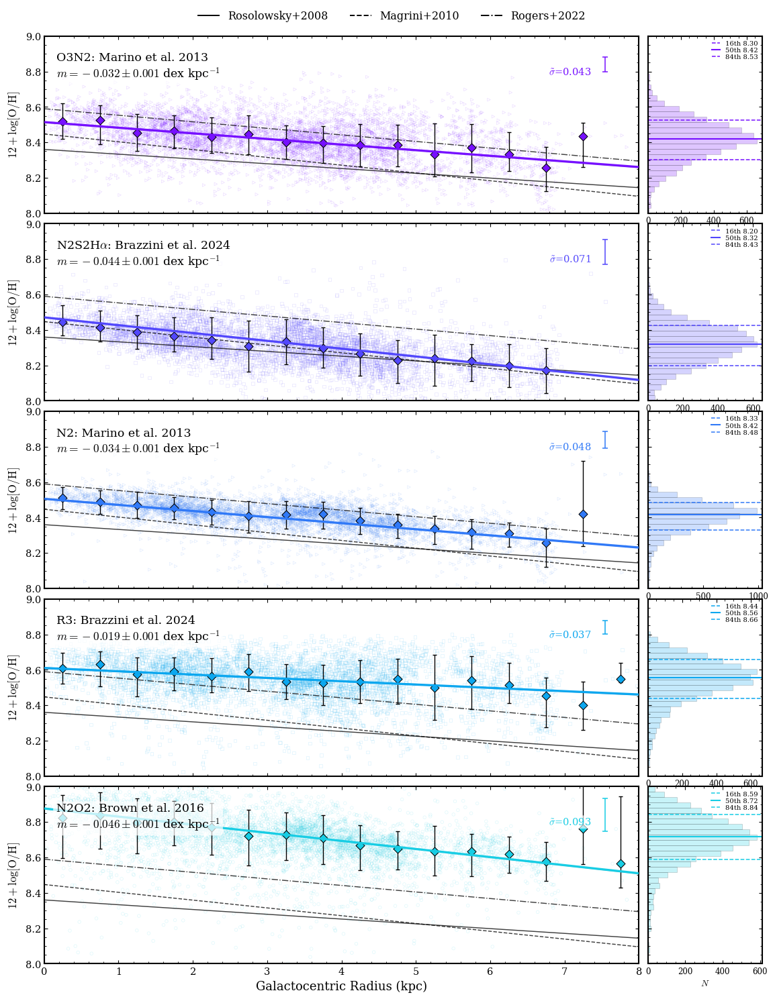

Wrote paper metallicity gradient multipanel: PAPER_PLOTS/summed_map/dig_subtracted/metallicity_calibrations/M33_metallicity_calibrations_paper_multipanel.png
Updated compatibility metallicity multipanel alias: PAPER_PLOTS/summed_map/dig_subtracted/metallicity_calibrations/M33_metallicity_calibrations_multipanel.png
Note: legacy per-indicator metallicity PNGs in this folder are not regenerated by the new multipanel code.
metallicity logU/pressure grid sample: logU quality 3462 / 5609 finite; density properly constrained 1171 / 3227 finite; density upper limits 3559; pressure properly constrained 1171 / 3227 finite; pressure upper limits 3559


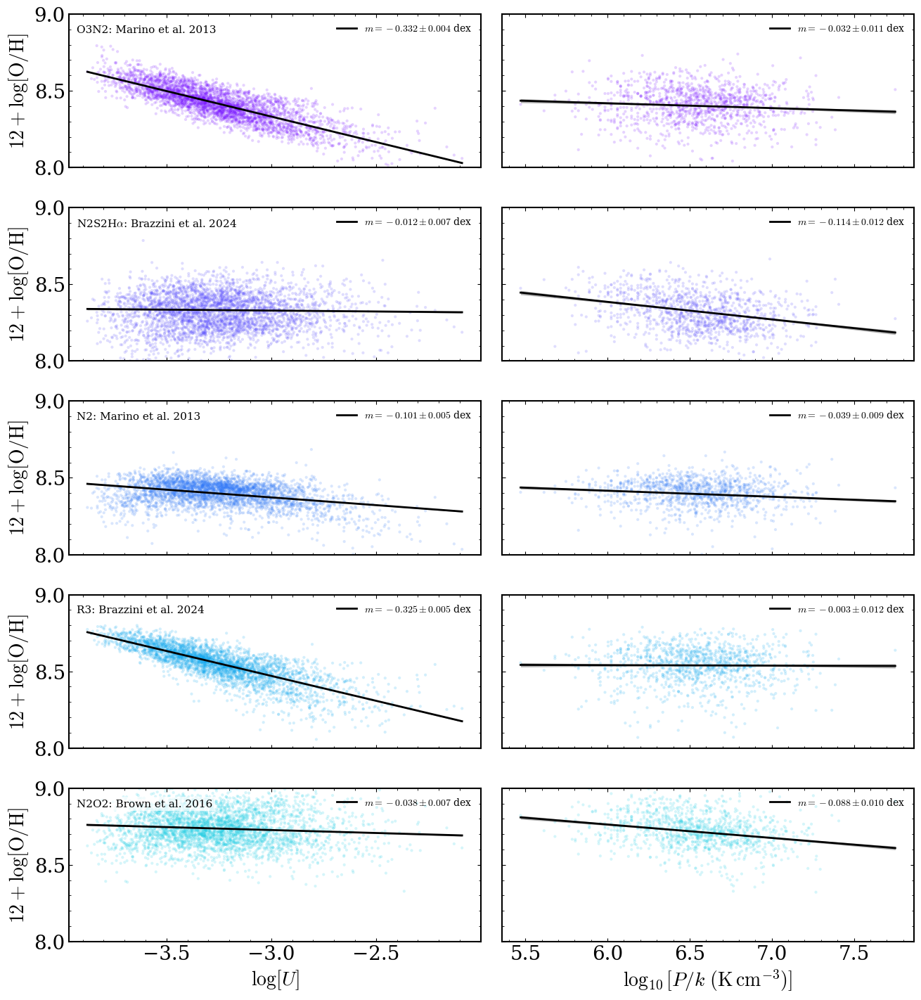

Wrote metallicity versus logU/pressure grid: PAPER_PLOTS/summed_map/dig_subtracted/metallicity_calibrations/M33_metallicity_vs_logU_pressure_grid.png


In [43]:
# metallicity_all_multipanel_path, metallicity_all_multipanel_axes, metallicity_all_multipanel_hist_axes, metallicity_all_multipanel_fit_results = plot_metallicity_calibration_multipanel(
#     calibrations,
#     style_map,
#     cat['R_gal_kpc'],
#     save_subdir='metallicity_calibrations',
#     filename='M33_metallicity_calibrations_all_indicators_multipanel.png',
# )
# print(f'Wrote all-indicator metallicity gradient multipanel: {metallicity_all_multipanel_path}')
# save_for_paper(
#     metallicity_all_multipanel_path,
#     'M33_metallicity_calibrations_all_indicators_multipanel.png',
# )

metallicity_paper_multipanel_path, metallicity_paper_multipanel_axes, metallicity_paper_multipanel_hist_axes, metallicity_paper_multipanel_fit_results = plot_metallicity_calibration_multipanel(
    calibrations,
    style_map,
    cat['R_gal_kpc'],
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_calibrations_paper_multipanel.png',
    selected_columns=PAPER_METALLICITY_SELECTION,
)
print(f'Wrote paper metallicity gradient multipanel: {metallicity_paper_multipanel_path}')

metallicity_multipanel_alias_path = paper_plot_path(
    'M33_metallicity_calibrations_multipanel.png',
    subdir='metallicity_calibrations',
)
shutil.copyfile(metallicity_paper_multipanel_path, metallicity_multipanel_alias_path)
print(f'Updated compatibility metallicity multipanel alias: {metallicity_multipanel_alias_path}')
print('Note: legacy per-indicator metallicity PNGs in this folder are not regenerated by the new multipanel code.')


metallicity_logu_pressure_grid_path, _, metallicity_logu_pressure_fit_results = plot_metallicity_vs_ionization_pressure_grid(
    cat,
    calibrations,
    style_map,
    selected_columns=PAPER_METALLICITY_SELECTION,
    save_subdir='metallicity_calibrations',
    filename='M33_metallicity_vs_logU_pressure_grid.png',
)
print(f'Wrote metallicity versus logU/pressure grid: {metallicity_logu_pressure_grid_path}')


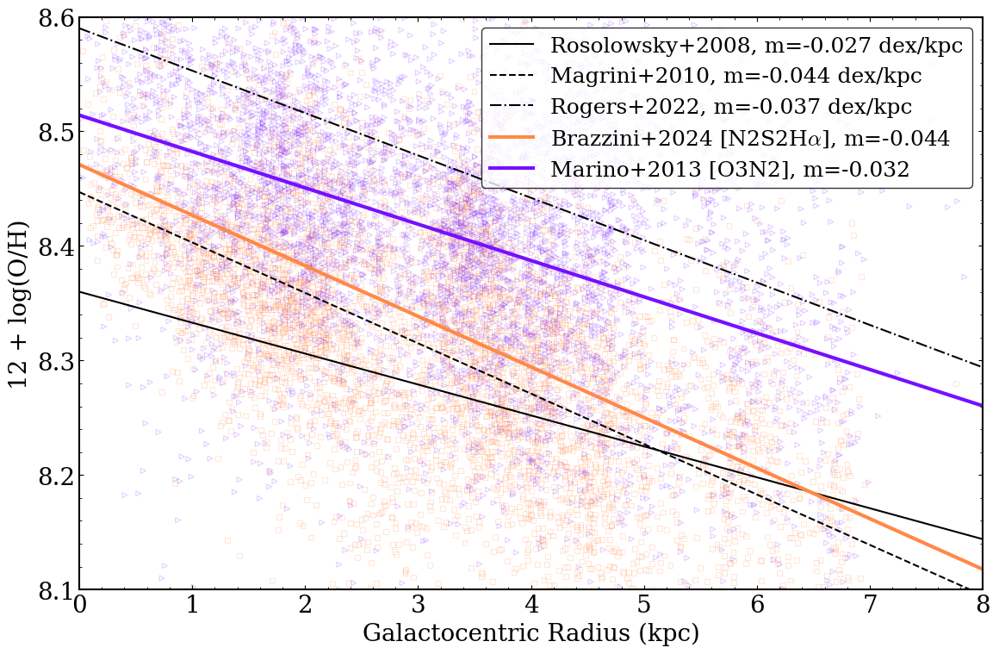

Selected calibrations for presentation panel:
  clean_label    line_group   slope  intercept  n_points  rms_to_ref_mean  rms_to_closest_ref
Brazzini+2024 N2S2H$\alpha$ -0.0442     8.4710      5694           0.0332              0.0234
  Marino+2013          O3N2 -0.0317     8.5141      5659           0.0663              0.0561


In [44]:
# Presentation-only panel: compare selected calibrations to literature M33 gradients.

def _clean_calibration_label(label):
    return label.replace(' et al. ', '+').replace('\\&', '&')


def _metallicity_linear_fit_with_errors(x, y, yerr=None):
    """Fit a straight line with measurement errors plus intrinsic scatter."""
    fit = _fit_result_from_curve_fit(
        x,
        y,
        yerr,
        include_intrinsic_scatter=True,
    )
    if fit is None:
        return np.nan, np.nan, np.nan, np.nan
    return fit.slope, fit.intercept, fit.stderr, fit.intercept_stderr


def summarize_calibration_matches(calibrations, R_gal, fit_range=(0, 8), min_points=30):
    x = np.asarray(R_gal, dtype=float)
    xgrid = np.linspace(fit_range[0], fit_range[1], 300)
    ref_stack = np.vstack([g['b'] + g['m'] * xgrid for g in literature_gradients])
    ref_mean = np.nanmean(ref_stack, axis=0)
    rows = []

    for item in calibrations:
        arr, err, label, grp = item[:4]
        y = np.asarray(arr, dtype=float)
        yerr = np.asarray(err, dtype=float) if err is not None else np.full_like(y, np.nan, dtype=float)
        mask = np.isfinite(x) & np.isfinite(y) & (x >= fit_range[0]) & (x <= fit_range[1])
        if mask.sum() < min_points:
            continue

        m, b, m_err, b_err = _metallicity_linear_fit_with_errors(x[mask], y[mask], yerr[mask])
        if not (np.isfinite(m) and np.isfinite(b)):
            continue

        model = m * xgrid + b
        rms_to_ref_mean = np.sqrt(np.mean((model - ref_mean) ** 2))
        rms_to_closest_ref = min(
            np.sqrt(np.mean((model - (g['b'] + g['m'] * xgrid)) ** 2))
            for g in literature_gradients
        )

        y_fit_sample = y[mask]
        rows.append(dict(
            label=label,
            clean_label=_clean_calibration_label(label),
            line_group=grp,
            column_name=item[4] if len(item) > 4 else None,
            slope=m,
            slope_stderr=m_err,
            intercept=b,
            intercept_stderr=b_err,
            mean_oh=float(np.nanmean(y_fit_sample)),
            std_oh=float(np.nanstd(y_fit_sample, ddof=1)) if np.isfinite(y_fit_sample).sum() > 1 else np.nan,
            n_points=int(mask.sum()),
            rms_to_ref_mean=rms_to_ref_mean,
            rms_to_closest_ref=rms_to_closest_ref,
        ))

    return pd.DataFrame(rows).sort_values(['line_group', 'clean_label']).reset_index(drop=True)


def plot_m33_metallicity_presentation_panel(calibrations, style_map, R_gal, fit_range=(0, 8), save_subdir='presentation', filename='M33_metallicity_gradient_presentation_panel.png', show=True):
    summary = summarize_calibration_matches(calibrations, R_gal, fit_range=fit_range, min_points=30)
    selected_specs = [
        ('Brazzini et al. 2024', r'N2S2H$\alpha$', r'Brazzini+2024 [N2S2H$\alpha$]'),
        ('Marino et al. 2013', 'O3N2', 'Marino+2013 [O3N2]'),
    ]
    presentation_colors = {
        ('Brazzini et al. 2024', r'N2S2H$\alpha$'): plt.cm.rainbow(0.82),
        ('Marino et al. 2013', 'O3N2'): plt.cm.rainbow(0.02),
    }
    selected_rows = []
    for label, grp, plot_label in selected_specs:
        match = summary.loc[(summary['label'] == label) & (summary['line_group'] == grp)].copy()
        if match.empty:
            continue
        match['plot_label'] = plot_label
        selected_rows.append(match.iloc[[0]])
    if not selected_rows:
        raise RuntimeError('None of the requested presentation calibrations were available in the current catalog.')
    selected = pd.concat(selected_rows, ignore_index=True)

    x = np.asarray(R_gal, dtype=float)
    xgrid = np.linspace(fit_range[0], fit_range[1], 300)
    fig, ax = plt.subplots(figsize=(12, 8))

    for g in literature_gradients:
        ax.plot(xgrid, g['b'] + g['m'] * xgrid, color='k', 
                linestyle=g['ls'], linewidth=1.5, label=f"{g['label']}, m={g['m']:.3f} dex/kpc")

    selected_keys = {(row.label, row.line_group) for row in selected.itertuples(index=False)}
    for item in calibrations:
        arr, err, label, grp = item[:4]
        if (label, grp) not in selected_keys:
            continue

        row = selected.loc[(selected['label'] == label) & (selected['line_group'] == grp)].iloc[0]
        pid = extract_paper_id(label)
        st = style_map[pid]
        plot_color = presentation_colors.get((label, grp), st['color'])
        y = np.asarray(arr, dtype=float)
        mask = np.isfinite(x) & np.isfinite(y) & (x >= fit_range[0]) & (x <= fit_range[1])
        if mask.sum() == 0:
            continue

        ax.scatter(
            x[mask], y[mask],
            s=18, alpha=0.2,
            facecolors='none', edgecolors=plot_color, marker=st['marker'], linewidths=0.8,
        )
        ax.plot(
            xgrid, row['slope'] * xgrid + row['intercept'],
            color=plot_color, linewidth=3.0,
            label=f"{row['plot_label']}, m={row['slope']:.3f}",
        )

    ax.set_xlabel('Galactocentric Radius (kpc)')
    ax.set_ylabel('12 + log(O/H)')
    ax.set_xlim(fit_range)
    ax.set_ylim(8.1, 8.6)
    ax.minorticks_on()
    ax.legend(fontsize=18, loc='upper right', frameon=True, edgecolor='black', facecolor='white')
    # ax.set_title('M33 metallicity gradients: literature vs selected calibrations')
    fig.tight_layout()
    fig.savefig(
        paper_plot_path(filename, subdir=save_subdir),
        dpi=300,
        bbox_inches='tight'
    )
    if show:
        plt.show()
    else:
        plt.close(fig)

    display_cols = ['clean_label', 'line_group', 'slope', 'intercept', 'n_points', 'rms_to_ref_mean', 'rms_to_closest_ref']
    print('Selected calibrations for presentation panel:')
    print(selected[display_cols].round({'slope': 4, 'intercept': 4, 'rms_to_ref_mean': 4, 'rms_to_closest_ref': 4}).to_string(index=False))
    return selected, summary


presentation_selected, presentation_summary = plot_m33_metallicity_presentation_panel(
    calibrations,
    style_map,
    cat['R_gal_kpc'],
    fit_range=(0, 8),
)

In [45]:
def _latex_escape_table_value(value):
    text = str(value)
    replacements = {
        '\\': r'\textbackslash{}',
        '&': r'\&',
        '%': r'\%',
        '$': r'\$',
        '#': r'\#',
        '_': r'\_',
        '{': r'\{',
        '}': r'\}',
    }
    for old, new in replacements.items():
        text = text.replace(old, new)
    return text


METALLICITY_GRADIENT_TABLE_ROWS = [
    ('N2', 'Brazzini+2024', r'\citet{Brazzini_2024}'),
    ('N2', 'Brown+2016', r'\citet{Brown_2016}'),
    ('N2', 'Curti+2017', r'\citet{Curti_2017}'),
    ('N2', 'Maiolino+2008', r'\citet{Maiolino_2008}'),
    ('N2', 'Marino+2013', r'\citet{Marino_2013}'),
    ('N2', 'Pettini & Pagel 2004', r'\citet{Pettini_2004}'),
    ('N2O2', 'Brown+2016', r'\citet{Brown_2016}'),
    (r'N2S2H$\alpha$', 'Brazzini+2024', r'\citet{Brazzini_2024}'),
    (r'N2S2H$\alpha$', 'Dopita+2016', r'\citet{Dopita_2016}'),
    ('O3N2', 'Brazzini+2024', r'\citet{Brazzini_2024}'),
    ('O3N2', 'Brown+2016', r'\citet{Brown_2016}'),
    ('O3N2', 'Curti+2017', r'\citet{Curti_2017}'),
    ('O3N2', 'Marino+2013', r'\citet{Marino_2013}'),
    ('O3N2', 'Pettini & Pagel 2004', r'\citet{Pettini_2004}'),
    ('R', 'Pilyugin+2016 high N2', r'\citet{Pilyugin_2016}'),
    ('R23', 'Curti+2017', r'\citet{Curti_2017}'),
    ('R23', 'Maiolino+2008', r'\citet{Maiolino_2008}'),
    ('R3', 'Brazzini+2024', r'\citet{Brazzini_2024}'),
    ('R3', 'Curti+2017', r'\citet{Curti_2017}'),
    ('S', 'Pilyugin+2016 high N2', r'\citet{Pilyugin_2016}'),
]


def _filter_metallicity_gradient_table(summary):
    rows = []
    for spec in METALLICITY_GRADIENT_TABLE_ROWS:
        indicator, reference, label = spec[:3]
        display_reference = spec[2] if len(spec) > 2 else reference
        match = summary.loc[(summary['line_group'] == indicator) & (summary['clean_label'] == reference)].copy()
        if match.empty:
            print(f'Warning: requested metallicity table row not found: {indicator}, {reference}')
            continue
        row = match.iloc[0].copy()
        row['Indicator'] = indicator
        row['Reference'] = display_reference
        rows.append(row)
    if not rows:
        raise RuntimeError('None of the requested metallicity calibrations were available for the slope table.')
    table = pd.DataFrame(rows).reset_index(drop=True)
    return table[['Indicator', 'Reference', 'slope', 'slope_stderr', 'mean_oh', 'std_oh']].rename(columns={
        'slope': 'Slope',
        'slope_stderr': 'Slope error',
        'mean_oh': 'Mean O/H',
        'std_oh': 'Std. O/H',
    })


def write_metallicity_gradient_table(summary, filename='metallicity_gradient_slopes.tex'):
    table = _filter_metallicity_gradient_table(summary)

    lines = [
        r'\begin{table*}',
        r'\centering',
        r'\caption{Metallicity radial-gradient slopes for the selected calibrations. Slopes are fit over $0<R_{\rm gal}<8$ kpc and have units of dex kpc$^{-1}$. Mean O/H and standard deviations are computed from the same fitted samples.}',
        r'\label{tab:metallicity_gradient_slopes}',
        r'\begin{tabular}{llrrrr}',
        r'\hline',
        r'Indicator & Reference & Slope & Slope error & Mean O/H & Std. O/H \\',
        r'\hline',
    ]
    last_indicator = None
    for _, row in table.iterrows():
        indicator_value = row['Indicator']
        indicator =indicator_value
        reference =row['Reference']
        if last_indicator is not None and indicator_value != last_indicator:
            lines.append(r'\hline')
        slope_value = row['Slope']
        slope_err_value = row['Slope error']
        mean_value = row['Mean O/H']
        std_value = row['Std. O/H']
        slope = f'${slope_value:.4f}$' if np.isfinite(slope_value) else r'\nodata'
        slope_err = f'${slope_err_value:.4f}$' if np.isfinite(slope_err_value) else r'\nodata'
        mean_oh = f'${mean_value:.3f}$' if np.isfinite(mean_value) else r'\nodata'
        std_oh = f'${std_value:.3f}$' if np.isfinite(std_value) else r'\nodata'
        lines.append(f'{indicator} & {reference} & {slope} & {slope_err} & {mean_oh} & {std_oh} ' + r'\\')
        last_indicator = indicator_value
    lines.extend([
        r'\hline',
        r'\end{tabular}',
        r'\end{table*}',
        '',
    ])

    table_path = paper_plot_path(filename, subdir='tables')
    table_path.write_text('\n'.join(lines), encoding='utf-8')
    csv_path = paper_plot_path(filename.replace('.tex', '.csv'), subdir='tables')
    table.to_csv(csv_path, index=False)
    print(f'Wrote metallicity gradient slope table: {table_path}')
    print(f'Wrote metallicity gradient slope CSV: {csv_path}')
    return table_path, csv_path, table

metallicity_gradient_table_path, metallicity_gradient_csv_path, metallicity_gradient_table = write_metallicity_gradient_table(presentation_summary)


Wrote metallicity gradient slope table: PAPER_PLOTS/summed_map/dig_subtracted/tables/metallicity_gradient_slopes.tex
Wrote metallicity gradient slope CSV: PAPER_PLOTS/summed_map/dig_subtracted/tables/metallicity_gradient_slopes.csv


In [46]:
# Star-forming, high-SNR-only metallicity calibration plots.
if 'all_lines_snr_mask' not in globals():
    def all_lines_snr_mask(df, snr_cut=3.0):
        snr_cols = [
            'SNR_Halpha_sum',
            'SNR_Hbeta_sum',
            'SNR_[OIII]5007_sum',
            'SNR_[SII]6716_sum',
            'SNR_[NII]6583_sum',
        ]
        missing = [col for col in snr_cols if col not in df.columns]
        if missing:
            raise KeyError(f'Missing SNR columns required for star-forming-only plots: {missing}')
        mask = np.ones(len(df), dtype=bool)
        for col in snr_cols:
            mask &= pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float) > snr_cut
        return mask

if 'cat_starforming_snrthree' not in globals():
    starforming_snrthree_mask = selected_star_forming_snr_mask(cat, snr_cut=3.0)
    cat_starforming_snrthree = cat.loc[starforming_snrthree_mask].copy().reset_index(drop=True)

sf_calibrations = build_metallicity_calibrations(cat_starforming_snrthree)
sf_style_map = build_style_map(sf_calibrations)

sf_metallicity_all_multipanel_path, sf_metallicity_all_multipanel_axes, sf_metallicity_all_multipanel_hist_axes, sf_metallicity_all_multipanel_fit_results = plot_metallicity_calibration_multipanel(
    sf_calibrations,
    sf_style_map,
    cat_starforming_snrthree['R_gal_kpc'],
    save_subdir='star_forming_only/metallicity_calibrations',
    filename='M33_metallicity_calibrations_all_indicators_multipanel.png',
    show=False,
)
print(f'Wrote star-forming all-indicator metallicity gradient multipanel: {sf_metallicity_all_multipanel_path}')

sf_metallicity_paper_multipanel_path, sf_metallicity_paper_multipanel_axes, sf_metallicity_paper_multipanel_hist_axes, sf_metallicity_paper_multipanel_fit_results = plot_metallicity_calibration_multipanel(
    sf_calibrations,
    sf_style_map,
    cat_starforming_snrthree['R_gal_kpc'],
    save_subdir='star_forming_only/metallicity_calibrations',
    filename='M33_metallicity_calibrations_paper_multipanel.png',
    selected_columns=PAPER_METALLICITY_SELECTION,
    show=False,
)
print(f'Wrote star-forming paper metallicity gradient multipanel: {sf_metallicity_paper_multipanel_path}')
save_for_paper(
    sf_metallicity_paper_multipanel_path,
    'M33_metallicity_gradients_selected.png',
)

sf_metallicity_multipanel_alias_path = sf_plot_path(
    'M33_metallicity_calibrations_multipanel.png',
    subdir='metallicity_calibrations',
)
shutil.copyfile(sf_metallicity_paper_multipanel_path, sf_metallicity_multipanel_alias_path)
print(f'Updated star-forming compatibility metallicity multipanel alias: {sf_metallicity_multipanel_alias_path}')
print('Note: legacy per-indicator metallicity PNGs in this folder are not regenerated by the new multipanel code.')

sf_presentation_selected, sf_presentation_summary = plot_m33_metallicity_presentation_panel(
    sf_calibrations,
    sf_style_map,
    cat_starforming_snrthree['R_gal_kpc'],
    fit_range=(0, 8),
    save_subdir='star_forming_only/presentation',
    filename='M33_metallicity_gradient_presentation_panel.png',
    show=False,
)


sf_metallicity_logu_pressure_grid_path, _, sf_metallicity_logu_pressure_fit_results = plot_metallicity_vs_ionization_pressure_grid(
    cat_starforming_snrthree,
    sf_calibrations,
    sf_style_map,
    selected_columns=PAPER_METALLICITY_SELECTION,
    save_subdir='star_forming_only/metallicity_calibrations',
    filename='M33_metallicity_vs_logU_pressure_grid.png',
    show=False,
)
print(f'Wrote star-forming metallicity versus logU/pressure grid: {sf_metallicity_logu_pressure_grid_path}')
save_for_paper(
    sf_metallicity_logu_pressure_grid_path,
    'M33_metallicity_vs_logU_pressure_grid.png',
)

# Add metallicity-gradient and metallicity-vs-logU/pressure fit values to
# the same catalog_numbers file as the radial/scaling/luminosity fits.
add_named_fit_results(values, formats, metallicity_paper_multipanel_fit_results, prefix='metallicityGradientAll')
add_named_fit_results(values, formats, metallicity_logu_pressure_fit_results, prefix='metallicityVsAll')
add_named_fit_results(values, formats, sf_metallicity_paper_multipanel_fit_results, prefix='metallicityGradient')
add_named_fit_results(values, formats, sf_metallicity_logu_pressure_fit_results, prefix='metallicityVs')
write_number_command_files(
    values,
    formats,
    message='Rewrote number commands with metallicity and logU/pressure slope fits included',
)


13 unique papers found.
Wrote star-forming all-indicator metallicity gradient multipanel: PAPER_PLOTS/summed_map/dig_subtracted/star_forming_only/metallicity_calibrations/M33_metallicity_calibrations_all_indicators_multipanel.png
Wrote star-forming paper metallicity gradient multipanel: PAPER_PLOTS/summed_map/dig_subtracted/star_forming_only/metallicity_calibrations/M33_metallicity_calibrations_paper_multipanel.png
Saved paper draft figure: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/PAPER_PLOTS_DRAFT1/M33_metallicity_gradients_selected.png
Updated star-forming compatibility metallicity multipanel alias: PAPER_PLOTS/summed_map/dig_subtracted/star_forming_only/metallicity_calibrations/M33_metallicity_calibrations_multipanel.png
Note: legacy per-indicator metallicity PNGs in this folder are not regenerated by the new multipanel code.
Selected calibrations for presentation panel:
  clean_label    line_group   slope  intercept  n_points  rms_to_ref_mean  rms_to_closest_ref
Brazzini+2024

(PosixPath('PAPER_PLOTS/summed_map/dig_subtracted/catalog_numbers.tex'),
 PosixPath('PAPER_PLOTS/summed_map/dig_subtracted/paper_numbers.tex'))

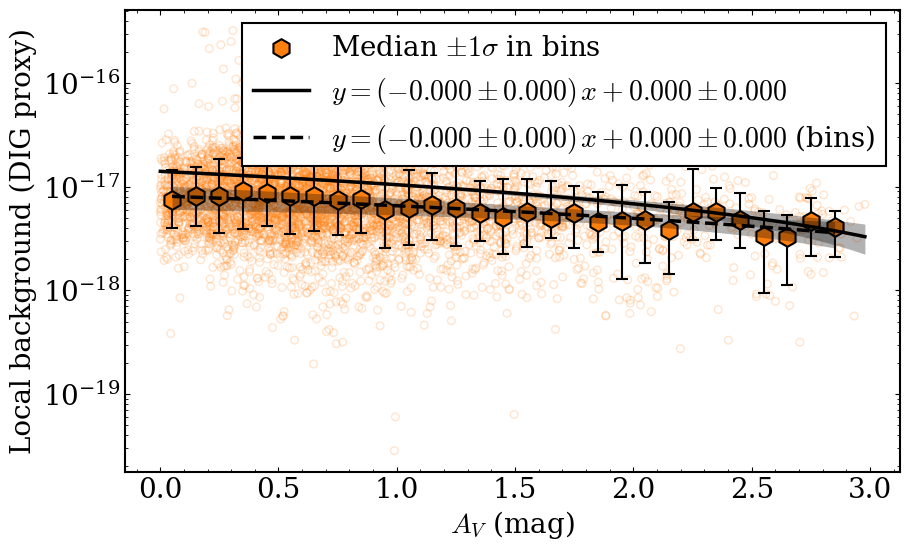

{'bin_centers': array([0.05, 0.15, 0.25, 0.35, 0.45, 0.55, 0.65, 0.75, 0.85, 0.95, 1.05,
        1.15, 1.25, 1.35, 1.45, 1.55, 1.65, 1.75, 1.85, 1.95, 2.05, 2.15,
        2.25, 2.35, 2.45, 2.55, 2.65, 2.75, 2.85]),
 'medians': array([7.39771985e-18, 8.21095966e-18, 8.16193348e-18, 8.99484227e-18,
        8.75465616e-18, 8.07903654e-18, 8.13583243e-18, 7.46427617e-18,
        7.59011001e-18, 5.95460339e-18, 6.26643474e-18, 6.61020092e-18,
        6.21481945e-18, 5.54961657e-18, 5.15216282e-18, 5.69136725e-18,
        5.00373658e-18, 5.51403045e-18, 4.55161878e-18, 4.69239555e-18,
        4.77635161e-18, 3.79766409e-18, 5.66171892e-18, 5.66071478e-18,
        4.73412585e-18, 3.31014603e-18, 3.26599178e-18, 4.69110146e-18,
        4.04441492e-18]),
 'lower_errs': array([3.98415240e-18, 4.20101283e-18, 3.53470964e-18, 3.91107137e-18,
        4.20958096e-18, 3.49441429e-18, 3.73112747e-18, 3.40111495e-18,
        3.53442329e-18, 2.57230177e-18, 2.75443683e-18, 3.08523911e-18,
        2.6728

In [47]:
# plot DIG level vs Av
sel = (cat['sum_A_V'] < 3) & (cat['sum_A_V'] > 0) & np.isfinite(cat['sum_A_V']) & np.isfinite(cat['bg_local'])
# plt.scatter(cat['sum_A_V'][sel], cat['bg_local'][sel], alpha=0.2, s=10, color='C1')
# plt.yscale('log')

plot_radial_gradient(
    cat=cat,
    xcol='sum_A_V',
    ycol='bg_local',
    mask=sel,
    bins=np.arange(0, 3, 0.1),
    color='C1',
    xlabel=r'$A_V$ (mag)',
    ylabel='Local background (DIG proxy)',
    yscale='log',
    alpha=0.2,
    savepath=str(paper_plot_path('M33_HII_bg_local_vs_Av.png', subdir='dig_diagnostics'))
)


In [48]:
# Multi-panel cutout plot for one example region with configurable line-ratio / line-map panels.

INTRINSIC_HA_HB_MAP = 2.86
R_V_MAP = 3.1


def ccm89_k_lambda_map(wave_angstrom, R_V=3.1):
    wave_micron = wave_angstrom * 1e-4
    x = 1.0 / wave_micron
    y = x - 1.82
    a = (
        1
        + 0.17699 * y
        - 0.50447 * y**2
        - 0.02427 * y**3
        + 0.72085 * y**4
        + 0.01979 * y**5
        - 0.77530 * y**6
        + 0.32999 * y**7
    )
    b = (
        1.41338 * y
        + 2.28305 * y**2
        + 1.07233 * y**3
        - 5.38434 * y**4
        - 0.62251 * y**5
        + 5.30260 * y**6
        - 2.09002 * y**7
    )
    return a * R_V + b


LINE_WAVELENGTHS_REGION = {
    'Hbflux': 4861.0,
    'OIII4959flux': 4959.0,
    'OIII5007flux': 5007.0,
    'Haflux': 6563.0,
    'NII6548flux': 6548.0,
    'NII6584flux': 6584.0,
    'NII6583flux': 6584.0,
    'SII6716flux': 6716.0,
    'SII6731flux': 6731.0,
    'OII3727flux': 3727.0,
}


def _normalize_region_identifier(field, region_id):
    field = str(field)
    if isinstance(region_id, str):
        rid = region_id.strip()
        if '_' in rid:
            region_label = int(rid.split('_')[-1])
            return rid, region_label
        region_label = int(float(rid))
        return f"{field}_{region_label:04d}", region_label
    region_label = int(region_id)
    return f"{field}_{region_label:04d}", region_label



def _sum_maps_from_spec(field, line_names, maps_dir, scale=1e-17, cache=None):
    if isinstance(line_names, (str, bytes)):
        line_names = [line_names]
    else:
        line_names = list(line_names)

    arrays = []
    for line_name in line_names:
        key = (field, line_name, scale)
        if cache is not None and key in cache:
            data = cache[key]
        else:
            map_path = Path(maps_dir) / f"M33-{field}" / f"M33{field}-{line_name}.fits"
            if not map_path.exists():
                raise FileNotFoundError(f"Missing map for {field} {line_name}: {map_path}")
            data = fits.getdata(map_path).astype(float)
            data = np.where(np.isfinite(data), data / scale, np.nan)
            if cache is not None:
                cache[key] = data
        arrays.append(data)

    return np.nansum(np.stack(arrays, axis=0), axis=0)



def _compute_ebv_map(field, maps_dir, cache=None, intrinsic_ha_hb=INTRINSIC_HA_HB_MAP, R_V=R_V_MAP):
    cache_key = ('EBV', field, intrinsic_ha_hb, R_V)
    if cache is not None and cache_key in cache:
        return cache[cache_key]

    ha = _sum_maps_from_spec(field, 'Haflux', maps_dir=maps_dir, cache=cache)
    hb = _sum_maps_from_spec(field, 'Hbflux', maps_dir=maps_dir, cache=cache)

    k_ha = ccm89_k_lambda_map(6563.0, R_V=R_V)
    k_hb = ccm89_k_lambda_map(4861.0, R_V=R_V)
    delta_k = k_hb - k_ha

    with np.errstate(divide='ignore', invalid='ignore'):
        ratio = ha / hb
        ebv = (2.5 / delta_k) * np.log10(ratio / intrinsic_ha_hb)

    good = np.isfinite(ha) & np.isfinite(hb) & (ha > 0) & (hb > 0)
    ebv = np.where(good, ebv, np.nan)
    ebv = np.where(np.isfinite(ebv), np.clip(ebv, 0, None), np.nan)

    if cache is not None:
        cache[cache_key] = ebv
    return ebv



def _deredden_single_line_map(field, line_name, maps_dir, cache=None, scale=1e-17, intrinsic_ha_hb=INTRINSIC_HA_HB_MAP, R_V=R_V_MAP):
    wave = LINE_WAVELENGTHS_REGION.get(line_name)
    if wave is None:
        raise KeyError(f"No wavelength mapping configured for line {line_name}")

    flux_map = _sum_maps_from_spec(field, line_name, maps_dir=maps_dir, scale=scale, cache=cache)
    ebv_map = _compute_ebv_map(field, maps_dir=maps_dir, cache=cache, intrinsic_ha_hb=intrinsic_ha_hb, R_V=R_V)
    k_line = ccm89_k_lambda_map(wave, R_V=R_V)
    correction = 10.0 ** (0.4 * ebv_map * k_line)

    with np.errstate(invalid='ignore'):
        flux_map_dered = flux_map * correction
    flux_map_dered = np.where(np.isfinite(flux_map), flux_map_dered, np.nan)
    return flux_map_dered



def _sum_dereddened_maps(field, line_names, maps_dir, cache=None, scale=1e-17, intrinsic_ha_hb=INTRINSIC_HA_HB_MAP, R_V=R_V_MAP):
    if isinstance(line_names, (str, bytes)):
        line_names = [line_names]
    else:
        line_names = list(line_names)

    arrays = [
        _deredden_single_line_map(
            field,
            line_name,
            maps_dir=maps_dir,
            cache=cache,
            scale=scale,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )
        for line_name in line_names
    ]
    return np.nansum(np.stack(arrays, axis=0), axis=0)



def _build_flux_map(field, line_names, maps_dir, cache=None, scale=1e-17, deredden=False, intrinsic_ha_hb=INTRINSIC_HA_HB_MAP, R_V=R_V_MAP):
    if deredden:
        return _sum_dereddened_maps(
            field,
            line_names,
            maps_dir=maps_dir,
            cache=cache,
            scale=scale,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )
    return _sum_maps_from_spec(field, line_names, maps_dir=maps_dir, scale=scale, cache=cache)



def _make_region_panel_map(field, panel_spec, maps_dir, cache=None):
    kind = panel_spec.get('kind', 'ratio').lower()
    use_deredden = panel_spec.get('deredden', False)
    intrinsic_ha_hb = panel_spec.get('intrinsic_ha_hb', INTRINSIC_HA_HB_MAP)
    R_V = panel_spec.get('R_V', R_V_MAP)

    if kind == 'ratio':
        numerator = _build_flux_map(
            field,
            panel_spec['numerator_lines'],
            maps_dir=maps_dir,
            scale=panel_spec.get('numerator_scale', 1e-17),
            cache=cache,
            deredden=use_deredden,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )
        denominator = _build_flux_map(
            field,
            panel_spec['denominator_lines'],
            maps_dir=maps_dir,
            scale=panel_spec.get('denominator_scale', 1e-17),
            cache=cache,
            deredden=use_deredden,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )

        min_num = panel_spec.get('min_num')
        min_den = panel_spec.get('min_den')
        if min_num is not None:
            numerator = np.where(numerator >= min_num, numerator, np.nan)
        if min_den is not None:
            denominator = np.where(denominator >= min_den, denominator, np.nan)

        with np.errstate(divide='ignore', invalid='ignore'):
            image = numerator / denominator
        image = np.where(np.isfinite(image), image, np.nan)

        if panel_spec.get('log10', True):
            image = np.where(image > 0, image, np.nan)
            with np.errstate(divide='ignore', invalid='ignore'):
                image = np.log10(image)

    elif kind == 'line':
        image = _build_flux_map(
            field,
            panel_spec['lines'],
            maps_dir=maps_dir,
            scale=panel_spec.get('flux_scale', 1e-17),
            cache=cache,
            deredden=use_deredden,
            intrinsic_ha_hb=intrinsic_ha_hb,
            R_V=R_V,
        )
        min_flux = panel_spec.get('min_flux')
        if min_flux is not None:
            image = np.where(image >= min_flux, image, np.nan)
        if panel_spec.get('log10', False):
            image = np.where(image > 0, image, np.nan)
            with np.errstate(divide='ignore', invalid='ignore'):
                image = np.log10(image)
    else:
        raise ValueError(f"Unsupported panel kind: {kind}")

    finite_clip = panel_spec.get('finite_clip')
    if finite_clip is not None:
        lo, hi = finite_clip
        image = np.where((image >= lo) & (image <= hi), image, np.nan)

    return image



def plot_region_multipanel_maps(
    field,
    region_id,
    panel_specs,
    *,
    maps_dir='../M33-Maps-Calibrated',
    zoi_dir='ZOI_maps/ZOI_map_100pc',
    boundary_dir='Boundary_maps/Boundary_map_100pc',
    boundary_metrics_pattern='Boundary_metrics_{field}.csv',
    zoi_pattern='ZoI_map_{field}.fits',
    boundary_pattern='Boundary_map_{field}.fits',
    ncols=3,
    half_size=None,
    pad_px=5,
    peak_marker_kwargs=None,
    zoi_contour_kwargs=None,
    boundary_contour_kwargs=None,
    show_colorbars=False,
    output_path=None,
    dpi=300,
    suptitle=None,
):
    region_name, region_label = _normalize_region_identifier(field, region_id)

    metrics_path = Path(boundary_dir) / boundary_metrics_pattern.format(field=field)
    if not metrics_path.exists():
        raise FileNotFoundError(f"Missing boundary metrics file: {metrics_path}")
    metrics_df = pd.read_csv(metrics_path)
    reg = metrics_df.loc[metrics_df['region_id'].astype(str) == region_name]
    if len(reg) != 1:
        raise ValueError(f"Could not find unique region {region_name} in {metrics_path}")
    reg = reg.iloc[0]

    cx = float(reg['center_x_px'])
    cy = float(reg['center_y_px'])
    contour_label = int(reg.get('zoi_center_label', region_label))

    zoi_path = Path(zoi_dir) / zoi_pattern.format(field=field)
    boundary_path = Path(boundary_dir) / boundary_pattern.format(field=field)
    if not zoi_path.exists():
        raise FileNotFoundError(f"Missing ZoI map: {zoi_path}")
    if not boundary_path.exists():
        raise FileNotFoundError(f"Missing boundary map: {boundary_path}")

    zoi_map = fits.getdata(zoi_path)
    boundary_map = fits.getdata(boundary_path)

    zoi_mask = np.asarray(zoi_map == contour_label)
    boundary_mask = np.asarray(boundary_map == contour_label)
    if not np.any(zoi_mask):
        raise ValueError(f"Region {region_name} has no ZoI pixels in {zoi_path}")
    if not np.any(boundary_mask):
        raise ValueError(f"Region {region_name} has no boundary pixels in {boundary_path}")

    if half_size is None:
        radius_guess = reg.get('radius_p84_px_after_carve', np.nan)
        if not np.isfinite(radius_guess):
            radius_guess = reg.get('radius_p84_px', np.nan)
        if not np.isfinite(radius_guess):
            radius_guess = reg.get('radius_areaeq_px_after_carve', np.nan)
        if not np.isfinite(radius_guess):
            radius_guess = 35.0
        half_size = int(np.ceil(max(60, 2.25 * float(radius_guess))))

    shape = zoi_mask.shape
    x0 = max(0, int(np.floor(cx - half_size - pad_px)))
    x1 = min(shape[1], int(np.ceil(cx + half_size + pad_px + 1)))
    y0 = max(0, int(np.floor(cy - half_size - pad_px)))
    y1 = min(shape[0], int(np.ceil(cy + half_size + pad_px + 1)))

    peak_x = cx - x0
    peak_y = cy - y0

    if peak_marker_kwargs is None:
        peak_marker_kwargs = dict(marker='+', s=70, linewidths=1.8, color='k')
    if zoi_contour_kwargs is None:
        zoi_contour_kwargs = dict(colors='k', linewidths=1.2, linestyles='--')
    if boundary_contour_kwargs is None:
        boundary_contour_kwargs = dict(colors='black', linewidths=2.5)

    map_cache = {}
    n_panels = len(panel_specs)
    ncols = min(max(1, ncols), n_panels)
    nrows = int(np.ceil(n_panels / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.0 * ncols, 5.0 * nrows), squeeze=False)
    axes_flat = axes.ravel()

    for ax, spec in zip(axes_flat, panel_specs):
        panel_image = _make_region_panel_map(field, spec, maps_dir=maps_dir, cache=map_cache)
        cutout = panel_image[y0:y1, x0:x1]
        zoi_cutout = zoi_mask[y0:y1, x0:x1]
        boundary_cutout = boundary_mask[y0:y1, x0:x1]

        im = ax.imshow(
            cutout,
            origin='lower',
            cmap=spec.get('cmap', 'viridis'),
            vmin=spec.get('vmin'),
            vmax=spec.get('vmax'),
        )
        # ax.contour(zoi_cutout.astype(float), levels=[0.5], origin='lower', **zoi_contour_kwargs)
        ax.contour(boundary_cutout.astype(float), levels=[0.5], origin='lower', **boundary_contour_kwargs)
        ax.scatter([peak_x], [peak_y], **peak_marker_kwargs)

        # ax.set_title(spec.get('label', ''))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal')

        if show_colorbars:
            cbar = fig.colorbar(im, ax=ax, fraction=0.048, pad=0.0, orientation = 'horizontal')
            if spec.get('colorbar_label'):
                cbar.set_label(spec['colorbar_label'], fontsize = 15)

    for ax in axes_flat[n_panels:]:
        ax.axis('off')

    # if suptitle is None:
    #     suptitle = f"{region_name}: line-ratio and line-map cutouts"
    # fig.suptitle(suptitle, y=0.995)
    fig.tight_layout()

    if output_path is not None:
        output_path = Path(output_path)
        output_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(output_path, dpi=dpi, bbox_inches='tight')

    plt.close()
    return fig, axes


def _estimate_region_pixel_scale_pc(reg):
    candidate_pairs = [
        ('radius_areaeq_pc_after_carve', 'radius_areaeq_px_after_carve'),
        ('radius_p84_pc', 'radius_p84_px'),
        ('radius_areaeq_pc', 'radius_areaeq_px'),
        ('radius_p50_pc', 'radius_p50_px'),
        ('radius_p16_pc', 'radius_p16_px'),
    ]
    for pc_col, px_col in candidate_pairs:
        pc_val = reg.get(pc_col, np.nan)
        px_val = reg.get(px_col, np.nan)
        if np.isfinite(pc_val) and np.isfinite(px_val) and float(px_val) > 0:
            return float(pc_val) / float(px_val)
    raise ValueError('Could not infer a pc-per-pixel scale for this region from the boundary metrics table.')


def _make_panel_value_norm(values, panel_spec):
    finite = np.asarray(values, dtype=float)
    finite = finite[np.isfinite(finite)]
    if finite.size == 0:
        return mpl.colors.Normalize(vmin=0.0, vmax=1.0)

    vmin = panel_spec.get('vmin')
    vmax = panel_spec.get('vmax')
    if vmin is None:
        vmin = float(np.nanpercentile(finite, 5))
    if vmax is None:
        vmax = float(np.nanpercentile(finite, 95))
    if not np.isfinite(vmin):
        vmin = float(np.nanmin(finite))
    if not np.isfinite(vmax):
        vmax = float(np.nanmax(finite))
    if vmax <= vmin:
        vmax = vmin + 1e-6
    return mpl.colors.Normalize(vmin=vmin, vmax=vmax)


def plot_region_multipanel_radial_profiles(
    field,
    region_id,
    panel_specs,
    *,
    maps_dir='../M33-Maps-Calibrated',
    zoi_dir='ZOI_maps/ZOI_map_100pc',
    boundary_dir='Boundary_maps/Boundary_map_100pc',
    boundary_metrics_pattern='Boundary_metrics_{field}.csv',
    zoi_pattern='ZoI_map_{field}.fits',
    boundary_pattern='Boundary_map_{field}.fits',
    ncols=3,
    radial_bin_size_pc=None,
    min_points_per_bin=4,
    scatter_size=14,
    scatter_alpha=0.75,
    median_line_kwargs=None,
    show_colorbars=True,
    output_path=None,
    dpi=300,
    suptitle=None,
):
    region_name, region_label = _normalize_region_identifier(field, region_id)

    metrics_path = Path(boundary_dir) / boundary_metrics_pattern.format(field=field)
    if not metrics_path.exists():
        raise FileNotFoundError(f'Missing boundary metrics file: {metrics_path}')
    metrics_df = pd.read_csv(metrics_path)
    reg = metrics_df.loc[metrics_df['region_id'].astype(str) == region_name]
    if len(reg) != 1:
        raise ValueError(f'Could not find unique region {region_name} in {metrics_path}')
    reg = reg.iloc[0]

    cx = float(reg['center_x_px'])
    cy = float(reg['center_y_px'])
    contour_label = int(reg.get('zoi_center_label', region_label))
    pc_per_px = _estimate_region_pixel_scale_pc(reg)
    equal_area_radius_pc = reg.get('radius_areaeq_pc_after_carve', np.nan)
    if not np.isfinite(equal_area_radius_pc):
        equal_area_radius_pc = reg.get('radius_areaeq_pc', np.nan)

    zoi_path = Path(zoi_dir) / zoi_pattern.format(field=field)
    boundary_path = Path(boundary_dir) / boundary_pattern.format(field=field)
    if not zoi_path.exists():
        raise FileNotFoundError(f'Missing ZoI map: {zoi_path}')
    if not boundary_path.exists():
        raise FileNotFoundError(f'Missing boundary map: {boundary_path}')

    zoi_map = fits.getdata(zoi_path)
    boundary_map = fits.getdata(boundary_path)
    zoi_mask = np.asarray(zoi_map == contour_label)
    boundary_mask = np.asarray(boundary_map == contour_label)
    if not np.any(zoi_mask):
        raise ValueError(f'Region {region_name} has no ZoI pixels in {zoi_path}')
    if not np.any(boundary_mask):
        raise ValueError(f'Region {region_name} has no boundary pixels in {boundary_path}')

    yy, xx = np.indices(boundary_mask.shape, dtype=float)
    radius_pc_map = np.hypot(xx - cx, yy - cy) * pc_per_px

    if median_line_kwargs is None:
        median_line_kwargs = dict(color='k', linewidth=2.0)

    map_cache = {}
    n_panels = len(panel_specs)
    ncols = min(max(1, ncols), n_panels)
    nrows = int(np.ceil(n_panels / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.2 * ncols, 4.6 * nrows), squeeze=False)
    axes_flat = axes.ravel()

    for ax, spec in zip(axes_flat, panel_specs):
        panel_image = _make_region_panel_map(field, spec, maps_dir=maps_dir, cache=map_cache)
        valid = boundary_mask & np.isfinite(panel_image) & np.isfinite(radius_pc_map)

        if not np.any(valid):
            ax.text(0.5, 0.5, 'No finite values\nin boundary', ha='center', va='center', transform=ax.transAxes)
            ax.set_xlabel('Distance from peak (pc)')
            ax.set_ylabel(spec.get('colorbar_label', 'Value'))
            ax.grid(alpha=0.2, linewidth=0.6)
            continue

        radii_pc = radius_pc_map[valid].astype(float)
        values = panel_image[valid].astype(float)
        order = np.argsort(radii_pc)
        radii_pc = radii_pc[order]
        values = values[order]

        cmap_obj = plt.get_cmap(spec.get('cmap', 'viridis'))
        norm = _make_panel_value_norm(values, spec)
        scat = ax.scatter(
            radii_pc,
            values,
            c=values,
            cmap=cmap_obj,
            norm=norm,
            s=scatter_size,
            alpha=scatter_alpha,
            linewidths=0,
            rasterized=True,
        )

        rmax_pc = float(np.nanmax(radii_pc))
        if radial_bin_size_pc is None:
            n_bins = int(np.clip(np.sqrt(values.size), 12, 40))
            if rmax_pc <= 0:
                bin_edges = np.array([0.0, 1.0])
            else:
                bin_edges = np.linspace(0.0, rmax_pc, n_bins + 1)
        else:
            step_pc = max(float(radial_bin_size_pc), np.finfo(float).eps)
            upper_pc = max(rmax_pc, step_pc)
            bin_edges = np.arange(0.0, upper_pc + step_pc, step_pc)
            if bin_edges.size < 2:
                bin_edges = np.array([0.0, upper_pc])

        bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
        bin_index = np.clip(np.digitize(radii_pc, bin_edges) - 1, 0, len(bin_centers) - 1)
        medians = np.full(len(bin_centers), np.nan)
        counts = np.zeros(len(bin_centers), dtype=int)
        for idx in range(len(bin_centers)):
            in_bin = values[bin_index == idx]
            counts[idx] = in_bin.size
            if in_bin.size:
                medians[idx] = np.nanmedian(in_bin)
        good_bins = (counts >= int(min_points_per_bin)) & np.isfinite(medians)
        if np.any(good_bins):
            ax.plot(bin_centers[good_bins], medians[good_bins], **median_line_kwargs)

        x_upper = max(float(bin_edges[-1]), rmax_pc)
        if np.isfinite(equal_area_radius_pc):
            x_upper = max(x_upper, float(equal_area_radius_pc))
        ax.set_xlim(0.0, x_upper)
        y_lower = float(np.nanmin(values))
        y_upper = float(np.nanmax(values))
        if spec.get('vmin') is not None:
            y_lower = min(y_lower, float(spec['vmin']))
        if spec.get('vmax') is not None:
            y_upper = max(y_upper, float(spec['vmax']))
        if y_upper <= y_lower:
            y_pad = max(1e-6, 0.05 * max(abs(y_lower), 1.0))
        else:
            y_pad = 0.05 * (y_upper - y_lower)
        ax.set_ylim(y_lower - y_pad, y_upper + y_pad)
        if np.isfinite(equal_area_radius_pc):
            ax.axvline(float(equal_area_radius_pc), color='0.25', linestyle='--', linewidth=1.5)
        ax.set_xlabel('Distance from peak (pc)')
        ax.set_ylabel(spec.get('colorbar_label', 'Value'))
        ax.grid(alpha=0.2, linewidth=0.6)

        if show_colorbars:
            cbar = fig.colorbar(scat, ax=ax, fraction=0.048, pad=0.0, orientation='horizontal')
            if spec.get('colorbar_label'):
                cbar.set_label(spec['colorbar_label'], fontsize=15)

    for ax in axes_flat[n_panels:]:
        ax.axis('off')

    if suptitle is not None:
        fig.suptitle(suptitle, y=0.995)
    fig.tight_layout()

    if output_path is not None:
        output_path = Path(output_path)
        output_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(output_path, dpi=dpi, bbox_inches='tight')

    plt.close()
    return fig, axes

dered = True
DEFAULT_REGION_RATIO_PANEL_SPECS = [
    dict(
        kind='ratio',
        numerator_lines='OIII5007flux',
        denominator_lines='OII3727flux',
        colorbar_label=r'log([O III]/[O II])',
        cmap='BrBG_r',
        log10=True,
        deredden=dered,
        vmin=-1,
        vmax=0.5,
        min_den=1e-3,
    ),
    dict(
        kind='ratio',
        numerator_lines='OIII5007flux',
        denominator_lines=['SII6716flux', 'SII6731flux'],
        colorbar_label=r'log([O III]/[S II])',
        cmap='PiYG_r',
        log10=True,
        deredden=dered,
        vmin=-1,
        vmax=1,
        min_den=1e-3,
    ),
    dict(
        kind='ratio',
        numerator_lines='Haflux',
        denominator_lines='Hbflux',
        colorbar_label=r'H$\alpha$/H$\beta$',
        cmap='coolwarm',
        log10=False,
        deredden=False,
        vmin=2,
        vmax=5,
        min_den=1e-3,
    ),
    dict(
        kind='ratio',
        numerator_lines='OIII5007flux',
        denominator_lines='Hbflux',
        colorbar_label=r'log([O III]/H$\beta$)',
        cmap='bwr_r',
        log10=True,
        deredden=dered,
        vmin=-1,
        vmax=1,
        min_den=1e-3,
    ),
    dict(
        kind='ratio',
        numerator_lines=['SII6716flux', 'SII6731flux'],
        denominator_lines='Haflux',
        colorbar_label=r'log([S II]/H$\alpha$)',
        cmap='PuOr',
        log10=True,
        deredden=dered,
        vmin=-1.5,
        vmax=0.8,
        min_den=1e-3,
    ),
    
    dict(
        kind='ratio',
        numerator_lines='NII6584flux',
        denominator_lines='Haflux',
        colorbar_label=r'log(N II]/H$\alpha$)',
        cmap='PRGn',
        log10=True,
        deredden=dered,
        vmin=-1.5,
        vmax=0,
        min_den=1e-3,
    ),
    
    dict(
        kind='ratio',
        numerator_lines='SII6716flux',
        denominator_lines='SII6731flux',
        colorbar_label=r'[S II] 6716/[S II] 6731',
        cmap='plasma',
        log10=False,
        deredden=dered,
        vmin=1,
        vmax=1.45,
        min_den=1e-3,
    ),
]

DEFAULT_REGION_LINE_PANEL_SPECS = [
    # dict(kind='line', lines='OIII5007flux', label=r'log([O III] 5007 flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
    dict(kind='line', lines='Haflux', colorbar_label=r'log(H$\alpha$/$10^{-17}$erg s$^{-1}$cm$^{-2}$)', cmap='rainbow', log10=True, vmin=-1, vmax=2, deredden=False),
    # dict(kind='line', lines='Hbflux', label=r'log(H$\beta$ flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
    # dict(kind='line', lines='NII6584flux', label=r'log([N II] 6584 flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
    # dict(kind='line', lines='OII3727flux', label=r'log([O II] 3727 flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
    # dict(kind='line', lines=['SII6716flux', 'SII6731flux'], label=r'log([S II] 6716, 6731 flux), dered.', cmap='rainbow', log10=True, deredden=True, vmin=-1, vmax=2, min_flux=1e-3),
]


In [49]:
# Example figure: region NW_0824, matching the notebook 5 example region.
#
# By default these panels use Balmer-decrement dereddened flux maps for all panels
# except the observed Halpha/Hbeta panel.
# To add more panels, append specs from DEFAULT_REGION_LINE_PANEL_SPECS or add your own dict.
# Example:
region_panel_specs = list(DEFAULT_REGION_LINE_PANEL_SPECS)+ list(DEFAULT_REGION_RATIO_PANEL_SPECS)
# region_panel_specs.append(dict(
#     kind='ratio',
#     numerator_lines='NII6584flux',
#     denominator_lines='Haflux',
#     label=r'log([N II] 6584 / H$\alpha$), dered.',
#     cmap='coolwarm',
#     log10=True,
#     deredden=True,
#     vmin=-2,
#     vmax=0,
#     min_den=1e-3,
# ))

# region_panel_specs = list(DEFAULT_REGION_RATIO_PANEL_SPECS)

# ids = [100,200,300,400,500,600, 824]
ids = [850]
# ids = np.arange(840, 860)

for id in ids:
    # try:
    id = str(id)
    while len(id)<4:
        id='0'+id
    
    fig_profile, axes_profile = plot_region_multipanel_radial_profiles(
        field='NW',
        region_id=f'NW_{id}',
        panel_specs=region_panel_specs,
        ncols=4,
        output_path=str(paper_plot_path(f'NW_0{id}_region_ratio_radial_profiles_dered.png', subdir='region_profiles')),
        suptitle=None,
        show_colorbars=True,
    )
    print(id, ' sucess')
    # except:
    #     print(id, 'fail')


0850  sucess


In [50]:
str(paper_plot_path(f'NW_0{id}_region_ratio_radial_profiles_dered.png', subdir='region_profiles')),

('PAPER_PLOTS/summed_map/dig_subtracted/region_profiles/NW_00850_region_ratio_radial_profiles_dered.png',)

In [51]:
# Create final CSV catalog with emission-region properties and an AAS-style column description table.
# The CSV expands every available emission line; the TeX description table uses <line>
# placeholder rows for those repeated line-flux columns and lists the actual lines in the caption.

import re


def _first_existing_column(df, candidates):
    for col in candidates:
        if col in df.columns:
            return col
    return None


def _series_from(df, col, index=None, default=np.nan):
    if index is None:
        index = df.index
    if col is None or col not in df.columns:
        return pd.Series(default, index=index)
    return df[col]


def _load_no_dig_catalog_for_final_table(reference_cat):
    if 'cat_nodig' in globals():
        out = cat_nodig.copy()
    else:
        out, _ = load_available_flux_catalog(catalog_method, 'no_dig', primary_only=primary_only)
    if primary_only and 'primary' in out.columns:
        out = out.loc[out['primary'].fillna(True)].copy()
    if 'region_id' in out.columns:
        out = out.drop_duplicates('region_id').set_index('region_id')
        return out.reindex(reference_cat['region_id']).reset_index(drop=True)
    return out.reindex(reference_cat.index).reset_index(drop=True)


def _ordered_available_lines(df):
    lines = []
    for col in df.columns:
        match = re.fullmatch(r'F_(.+)_sum(?:_nodig|_digsub)?', col)
        if not match:
            continue
        line = match.group(1)
        if line.endswith('_e'):
            continue
        if line not in lines:
            lines.append(line)
    preferred = ['Halpha', 'Hbeta', '[OIII]5007', '[NII]6583', '[SII]6716', '[SII]6731', '[OII]3727']
    ordered = [line for line in preferred if line in lines]
    ordered.extend([line for line in lines if line not in ordered])
    return ordered


def _clean_column_label(text):
    return str(text).replace('[', '').replace(']', '').replace('_', '')


def _latex_escape_text(text, preserve_citations=True):
    text = str(text)
    protected = []

    if preserve_citations:
        def _protect(match):
            protected.append(match.group(0))
            return f'@@CITE{len(protected) - 1}@@'

        text = re.sub(r'\\citet\{[^}]+\}', _protect, text)

    replacements = {
        '&': r'\&',
        '%': r'\%',
        '#': r'\#',
        '_': r'\_',
        '<': r'$<$',
        '>': r'$>$',
    }
    text = ''.join(replacements.get(char, char) for char in text)

    for idx, citation in enumerate(protected):
        text = text.replace(f'@@CITE{idx}@@', citation)
    return text


def _reference_to_citet(reference):
    reference = str(reference)
    citation_map = {
        'Brazzini': r'\citet{Brazzini_2024}',
        'Brown': r'\citet{Brown_2016}',
        'Curti': r'\citet{Curti_2017}',
        'Dopita': r'\citet{Dopita_2016}',
        'Kobulnicky': r'\citet{Kobulnicky_2004}',
        'Maiolino': r'\citet{Maiolino_2008}',
        'Marino': r'\citet{Marino_2013}',
        'Pettini': r'\citet{Pettini_2004}',
        'Pilyugin': r'\citet{Pilyugin_2016}',
    }
    for key, citation in citation_map.items():
        if key in reference:
            return citation
    return reference


def _add_column(out, descriptions, label, values, units, description):
    out[label] = values
    descriptions.append({
        'label': label,
        'units': units,
        'description': description,
        'columns': [label],
    })


def _add_description_row(descriptions, label, units, description, columns):
    descriptions.append({
        'label': label,
        'units': units,
        'description': description,
        'columns': list(columns),
    })


def _format_column_numbers(columns, table_columns):
    positions = sorted(table_columns.get_loc(col) + 1 for col in columns if col in table_columns)
    if not positions:
        return r'\nodata'
    ranges = []
    start = prev = positions[0]
    for pos in positions[1:]:
        if pos == prev + 1:
            prev = pos
            continue
        ranges.append(f'{start}' if start == prev else f'{start}-{prev}')
        start = prev = pos
    ranges.append(f'{start}' if start == prev else f'{start}-{prev}')
    return ', '.join(ranges)


def _selected_metallicity_columns_for_final_table(calibrations):
    rows = []
    requested = globals().get('METALLICITY_GRADIENT_TABLE_ROWS', [])
    for spec in requested:
        indicator, reference = spec[:2]
        citation = spec[2] if len(spec) > 2 else _reference_to_citet(reference)
        for item in calibrations:
            arr, err, label, grp = item[:4]
            col = item[4] if len(item) > 4 else None
            if col is None:
                continue
            clean = _clean_calibration_label(label) if '_clean_calibration_label' in globals() else str(label)
            if grp == indicator and clean == reference:
                rows.append((col, f'{indicator} {citation}'))
                break
    # Keep the user-requested table order while avoiding duplicate calibrations.
    seen = set()
    unique = []
    for col, desc in rows:
        if col in seen:
            continue
        seen.add(col)
        unique.append((col, desc))
    return unique


final_region_cat = cat.copy()
if primary_only and 'primary' in final_region_cat.columns:
    final_region_cat = final_region_cat.loc[final_region_cat['primary'].fillna(True)].copy().reset_index(drop=True)
no_dig_for_table = _load_no_dig_catalog_for_final_table(final_region_cat)

final_table = pd.DataFrame(index=final_region_cat.index)
description_rows = []

_add_column(final_table, description_rows, 'ID', _series_from(final_region_cat, 'region_id'), r'\nodata', 'Emission-region identifier.')
_add_column(final_table, description_rows, 'Field', _series_from(final_region_cat, 'field'), r'\nodata', 'M33 SITELLE field containing the region.')
_add_column(final_table, description_rows, 'RA_deg', _series_from(final_region_cat, 'RA_deg'), 'deg', 'Right ascension of the region center in decimal degrees (J2000).')
_add_column(final_table, description_rows, 'Dec_deg', _series_from(final_region_cat, 'Dec_deg'), 'deg', 'Declination of the region center in decimal degrees (J2000).')
_add_column(final_table, description_rows, 'N_spaxels', _series_from(final_region_cat, 'npix_region'), 'spaxels', 'Number of spaxels assigned to the emission-region boundary.')
_add_column(final_table, description_rows, 'R_c_pc', _series_from(final_region_cat, 'radius_areaeq_pc'), 'pc', 'Circularized equal-area radius from the domain/boundary code.')
_add_column(final_table, description_rows, 'R_16_pc', _series_from(final_region_cat, 'radius_p16_pc'), 'pc', '16th-percentile boundary radius from the domain/boundary code.')
_add_column(final_table, description_rows, 'R_50_pc', _series_from(final_region_cat, 'radius_p50_pc'), 'pc', 'Median boundary radius from the domain/boundary code.')
_add_column(final_table, description_rows, 'R_84_pc', _series_from(final_region_cat, 'radius_p84_pc'), 'pc', '84th-percentile boundary radius from the domain/boundary code.')

available_lines = _ordered_available_lines(final_region_cat)
line_column_labels = []
line_column_descriptions = [
    r'raw integrated flux before extinction correction and DIG/background subtraction',
    r'extinction-corrected integrated flux before DIG/background subtraction',
    r'extinction-corrected integrated flux after DIG/background subtraction',
    r'one-sigma uncertainty on the final extinction-corrected, DIG/background-subtracted integrated flux',
    r'signal-to-noise ratio for the final integrated flux',
]

for line in available_lines:
    prefix = line
    raw_col = _first_existing_column(no_dig_for_table, [f'F_{line}_sum_nodig', f'F_{line}_sum'])
    dered_col = _first_existing_column(no_dig_for_table, [
        f'F_{line}_sum_dered_nodig',
        f'F_{line}_sum_nodig_dered',
        f'F_{line}_sum_dered',
    ])
    bgsub_col = _first_existing_column(final_region_cat, [
        f'F_{line}_sum_dered_digsub',
        f'F_{line}_sum_digsub_dered',
        f'F_{line}_sum_dered',
        f'F_{line}_sum_digsub',
        f'F_{line}_sum',
    ])
    # Errors and S/N are intentionally the observed/no-DIG values.
    err_col = _first_existing_column(final_region_cat, [
        f'F_{line}_e_sum_nodig',
        f'F_{line}_e_sum',
        f'F_{line}_sum_err',
    ])
    snr_col = _first_existing_column(final_region_cat, [
        f'SNR_{line}_sum_nodig',
        f'SNR_{line}_sum',
    ])
    line_labels = [
        f'{prefix}_flux_raw',
        f'{prefix}_flux_dered',
        f'{prefix}_flux_bgsub',
        f'{prefix}_flux_err',
        f'{prefix}_SNR',
    ]
    final_table[line_labels[0]] = _series_from(no_dig_for_table, raw_col, index=final_region_cat.index)
    final_table[line_labels[1]] = _series_from(no_dig_for_table, dered_col, index=final_region_cat.index)
    final_table[line_labels[2]] = _series_from(final_region_cat, bgsub_col, index=final_region_cat.index)
    final_table[line_labels[3]] = _series_from(final_region_cat, err_col, index=final_region_cat.index)
    final_table[line_labels[4]] = _series_from(final_region_cat, snr_col, index=final_region_cat.index)
    line_column_labels.extend(line_labels)

_add_description_row(
    description_rows,
    '<line>_flux_*; <line>_SNR',
    r'\nodata',
    (
        'Repeated emission-line flux and SNR columns. For each available line, the CSV includes ' +
        '; '.join(line_column_descriptions) +
        '. Flux columns have units erg s$^{-1}$ cm$^{-2}$, while SNR columns are dimensionless.'
    ),
    line_column_labels,
)

_add_column(final_table, description_rows, 'A_V_mag', _series_from(final_region_cat, 'sum_A_V'), 'mag', r'Visual extinction inferred from the Balmer decrement.')
_add_column(final_table, description_rows, 'E_BV_mag', _series_from(final_region_cat, 'sum_E_BV'), 'mag', r'Color excess inferred from the Balmer decrement.')
_add_column(final_table, description_rows, 'BPT_class', _series_from(final_region_cat, 'BPT_class_sum_dered'), r'\nodata', 'BPT classification from extinction-corrected integrated line ratios.')
_add_column(final_table, description_rows, 'L_Halpha_raw', _series_from(no_dig_for_table, 'L_Ha_sum', index=final_region_cat.index), r'erg s$^{-1}$', 'Observed Halpha luminosity before extinction correction and DIG/background subtraction.')
_add_column(final_table, description_rows, 'L_Halpha_dered', _series_from(no_dig_for_table, 'L_Ha_sum_dered', index=final_region_cat.index), r'erg s$^{-1}$', 'Extinction-corrected Halpha luminosity before DIG/background subtraction.')
_add_column(final_table, description_rows, 'L_Halpha_bgsub', _series_from(final_region_cat, 'L_Ha_sum_dered'), r'erg s$^{-1}$', 'Extinction-corrected Halpha luminosity after DIG/background subtraction.')
_add_column(final_table, description_rows, 'has_WR', _series_from(final_region_cat, 'has_wr_in_boundary'), r'\nodata', 'Boolean flag for whether the region boundary contains a cataloged WR star.')
_add_column(final_table, description_rows, 'has_SNR', _series_from(final_region_cat, 'has_snr_in_boundary'), r'\nodata', 'Boolean flag for whether the region boundary contains a cataloged supernova remnant.')
_add_column(final_table, description_rows, 'has_PN', _series_from(final_region_cat, 'has_pn_in_boundary'), r'\nodata', 'Boolean flag for whether the region boundary contains a cataloged planetary nebula.')
_add_column(final_table, description_rows, 'primary', _series_from(final_region_cat, 'primary'), r'\nodata', 'Boolean flag indicating the primary retained region where field overlaps create duplicate detections.')
_add_column(final_table, description_rows, 'v_helio_mean_kms', _series_from(final_region_cat, 'v_helio_mean_kms'), r'km s$^{-1}$', 'Mean heliocentric velocity across finite spaxels inside the emission-region boundary.')
_add_column(final_table, description_rows, 'v_helio_mean_err_kms', _series_from(final_region_cat, 'v_helio_mean_err_kms'), r'km s$^{-1}$', 'Propagated one-sigma uncertainty on the mean heliocentric velocity.')
_add_column(final_table, description_rows, 'sigma_mean_kms', _series_from(final_region_cat, 'sigma_mean_kms'), r'km s$^{-1}$', 'Mean velocity dispersion from the sigma map across finite spaxels inside the emission-region boundary.')
_add_column(final_table, description_rows, 'sigma_mean_err_kms', _series_from(final_region_cat, 'sigma_mean_err_kms'), r'km s$^{-1}$', 'Propagated one-sigma uncertainty on the mean velocity dispersion.')
_add_column(final_table, description_rows, 'n_kinematic_spaxels', _series_from(final_region_cat, 'n_kinematic_spaxels'), 'spaxels', 'Number of finite spaxels used for the region-averaged kinematic measurements.')
from m33_pipeline.reporting import logu_pressure_quality_masks as _catalog_quality_masks

_catalog_quality = _catalog_quality_masks(final_region_cat)
_density_quality_mask = pd.Series(_catalog_quality['density'], index=final_region_cat.index)
_pressure_quality_mask = pd.Series(_catalog_quality['pressure'], index=final_region_cat.index)
_logu_quality_mask = pd.Series(_catalog_quality['logU'], index=final_region_cat.index)

def _quality_filtered_series(df, col, quality_mask):
    values = _series_from(df, col, index=quality_mask.index).copy()
    return values.where(quality_mask, np.nan)

_add_column(final_table, description_rows, 'ne', _quality_filtered_series(final_region_cat, 'ne_SII_cm3', _density_quality_mask), r'cm$^{-3}$', 'Electron density from the [S II] 6716/6731 ratio; reported only for regions passing the density quality cut.')
_add_column(final_table, description_rows, 'ne_err_minus', _quality_filtered_series(final_region_cat, 'ne_SII_cm3_mc_minus', _density_quality_mask), r'cm$^{-3}$', 'Lower one-sigma Monte Carlo uncertainty on the electron density; reported only for regions passing the density quality cut.')
_add_column(final_table, description_rows, 'ne_err_plus', _quality_filtered_series(final_region_cat, 'ne_SII_cm3_mc_plus', _density_quality_mask), r'cm$^{-3}$', 'Upper one-sigma Monte Carlo uncertainty on the electron density; reported only for regions passing the density quality cut.')
_add_column(final_table, description_rows, 'Pthermal', _quality_filtered_series(final_region_cat, 'P_thermal_SII_over_k_K_cm3', _pressure_quality_mask), r'K cm$^{-3}$', r'Thermal pressure divided by Boltzmann constant from [S II] electron density; reported only for regions passing the pressure quality cut.')
_add_column(final_table, description_rows, 'Pthermal_err_minus', _quality_filtered_series(final_region_cat, 'P_thermal_SII_over_k_K_cm3_mc_minus', _pressure_quality_mask), r'K cm$^{-3}$', 'Lower one-sigma Monte Carlo uncertainty on thermal pressure divided by Boltzmann constant; reported only for regions passing the pressure quality cut.')
_add_column(final_table, description_rows, 'Pthermal_err_plus', _quality_filtered_series(final_region_cat, 'P_thermal_SII_over_k_K_cm3_mc_plus', _pressure_quality_mask), r'K cm$^{-3}$', 'Upper one-sigma Monte Carlo uncertainty on thermal pressure divided by Boltzmann constant; reported only for regions passing the pressure quality cut.')
_add_column(final_table, description_rows, 'logU_KK04', _quality_filtered_series(final_region_cat, 'logU_KK04', _logu_quality_mask), 'dex', r'Ionization parameter from the calibration of \citet{Kobulnicky_2004}; reported only for regions passing the logU quality cut.')
_add_column(final_table, description_rows, 'logU_KK04_err', _quality_filtered_series(final_region_cat, 'logU_KK04_e', _logu_quality_mask), 'dex', 'One-sigma uncertainty on the ionization parameter; reported only for regions passing the logU quality cut.')

metallicity_columns = _selected_metallicity_columns_for_final_table(build_metallicity_calibrations(final_region_cat) if 'build_metallicity_calibrations' in globals() else calibrations)
metallicity_value_labels = []
metallicity_error_labels = []
metallicity_descriptions = []
metallicity_error_series = {}
for col, desc in metallicity_columns:
    final_table[col] = _series_from(final_region_cat, col)
    err_col = f'{col}_e'
    metallicity_value_labels.append(col)
    metallicity_error_labels.append(err_col)
    metallicity_error_series[err_col] = _series_from(final_region_cat, err_col)
    metallicity_descriptions.append(f'{col} ({desc})')

for err_col in metallicity_error_labels:
    final_table[err_col] = metallicity_error_series[err_col]

metallicity_description_text = (
    'Oxygen abundance 12+log(O/H). Available calibration/reference columns: ' +
    '; '.join(metallicity_descriptions) +
    '.'
)
_add_description_row(
    description_rows,
    'Z_<calibration>_<ref>',
    'dex',
    metallicity_description_text,
    metallicity_value_labels,
)
_add_description_row(
    description_rows,
    'Z_err_<calibration>_<ref>',
    'dex',
    'One-sigma uncertainties corresponding to the metallicity columns. Available uncertainty columns: ' + '; '.join(metallicity_error_labels) + '.',
    metallicity_error_labels,
)

final_catalog_csv_path = paper_plot_path('M33_emission_region_properties.csv', subdir='tables')
final_description_tex_path = paper_plot_path('M33_emission_region_properties_columns.tex', subdir='tables')
final_table.to_csv(final_catalog_csv_path, index=False)

line_list_caption = ', '.join(available_lines)
catalog_name = _latex_escape_text(final_catalog_csv_path.name, preserve_citations=False)
caption = (
    r'Description of columns in the machine-readable emission-region property catalog. '
    r'The repeated line-flux columns use the placeholder $<$line$>$; '
    f'the CSV contains these columns for {_latex_escape_text(line_list_caption, preserve_citations=False)}.'
)
continued_caption = r'Description of columns in the machine-readable emission-region property catalog (continued).'
lines = [
    r'% Requires \usepackage{longtable}',
    r'\begingroup',
    r'\small',
    r'\begin{longtable}{r p{0.13\textwidth} p{0.23\textwidth} p{0.50\textwidth}}',
    rf'\caption{{{caption}\label{{tab:catalog_columns}}}}\\',
    r'\hline',
    r'Column number & Units & Label & Description \\',
    r'\hline',
    r'\endfirsthead',
    rf'\caption[]{{{continued_caption}}}\\',
    r'\hline',
    r'Column number & Units & Label & Description \\',
    r'\hline',
    r'\endhead',
    r'\hline',
    r'\multicolumn{4}{r}{Continued on next page}\\',
    r'\endfoot',
    r'\hline',
    r'\endlastfoot',
]
for row in description_rows:
    column_numbers = _format_column_numbers(row['columns'], final_table.columns)
    label_tex = _latex_escape_text(row['label'], preserve_citations=False)
    description_tex = _latex_escape_text(row['description'], preserve_citations=True)
    lines.append(f'{column_numbers} & {row["units"]} & {label_tex} & {description_tex} ' + r'\\')
lines.extend([
    r'\hline',
    # rf'\multicolumn{{4}}{{p{{0.93\textwidth}}}}{{\footnotesize The full CSV catalog is written to \texttt{{{catalog_name}}}. Fluxes are integrated over each emission-region boundary.}}\\',
    r'\end{longtable}',
    r'\endgroup',
    '',
])

final_description_tex_path.write_text('\n'.join(lines), encoding='utf-8')
print(f'Wrote final emission-region CSV catalog: {final_catalog_csv_path} ({len(final_table)} rows, {len(final_table.columns)} columns)')
print(f'Wrote final emission-region column description table: {final_description_tex_path}')
print(f'Available emission lines included in CSV: {line_list_caption}')



/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/2237651252.py:291: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  final_table[err_col] = metallicity_error_series[err_col]
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/2237651252.py:291: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  final_table[err_col] = metallicity_error_series[err_col]
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_9680/2237651252.py:291: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result

Wrote final emission-region CSV catalog: PAPER_PLOTS/summed_map/dig_subtracted/tables/M33_emission_region_properties.csv (5893 rows, 105 columns)
Wrote final emission-region column description table: PAPER_PLOTS/summed_map/dig_subtracted/tables/M33_emission_region_properties_columns.tex
Available emission lines included in CSV: Halpha, Hbeta, [OIII]5007, [NII]6583, [SII]6716, [SII]6731, [OII]3727


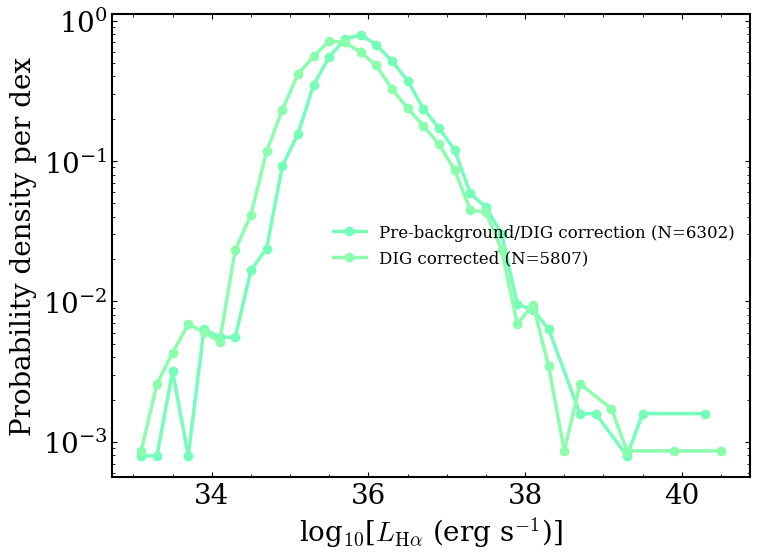

DIG comparison source, no_dig: CATALOGS/flux_catalogs/summed_map/no_dig/total_flux_catalog_combined.csv
DIG comparison source, dig_subtracted: CATALOGS/flux_catalogs/summed_map/dig_subtracted/total_flux_catalog_combined.csv


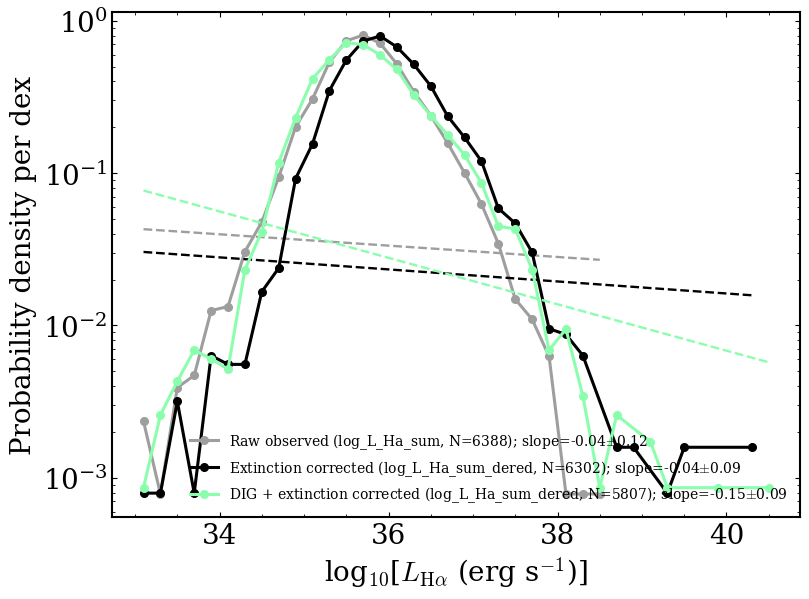

In [52]:
def luminosity_function_pdf_points(logL, bins):
    logL = np.asarray(logL, dtype=float)
    logL = logL[np.isfinite(logL)]
    if len(logL) == 0:
        return np.array([]), np.array([]), np.array([])
    counts, edges = np.histogram(logL, bins=bins)
    centers = 0.5 * (edges[:-1] + edges[1:])
    widths = np.diff(edges)
    pdf = counts / (np.sum(counts) * widths)
    detected = counts > 0
    return centers[detected], pdf[detected], counts[detected]

logL_bins = np.arange(33.0, 40.6, 0.2)
fig, ax = plt.subplots(figsize=(8, 6))

lf_specs = [
    (dig_before, lf_comparison_colors['pre_dig'], 'Pre-background/DIG correction'),
    (dig_after, lf_comparison_colors['dig_corrected'], 'DIG corrected'),
]

for logL_values, color, label in lf_specs:
    centers, pdf, counts = luminosity_function_pdf_points(logL_values, logL_bins)
    if len(centers) == 0:
        continue
    ax.plot(
        centers,
        pdf,
        marker='o',
        markersize=6,
        linewidth=2.5,
        color=color,
        label=f'{label} (N={len(logL_values)})',
    )

ax.set_xlabel(r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]')
ax.set_ylabel(r'Probability density per dex')
ax.set_yscale('log')
ax.minorticks_on()
ax.legend(frameon=False, fontsize=12)
fig.tight_layout()
fig.savefig(
    paper_plot_path(
        f'M33_HII_Halpha_luminosity_function_corrections_{catalog_method}.png',
        subdir='luminosity_functions'
    ),
    dpi=300,
    bbox_inches='tight'
)
plt.show()

print(f'DIG comparison source, no_dig: {nodig_source}')
print(f'DIG comparison source, dig_subtracted: {digsub_source}')


# Three-version luminosity function: raw observed, extinction corrected, and DIG+extinction corrected.
def _first_log_luminosity(df, candidates):
    for col in candidates:
        if col in df.columns:
            vals = pd.to_numeric(df[col], errors='coerce').to_numpy(dtype=float)
            if col.startswith('L_'):
                with np.errstate(divide='ignore', invalid='ignore'):
                    vals = np.log10(vals)
            return vals, col
    raise KeyError(f'None of these luminosity columns are present: {candidates}')


def _fit_lf_pdf_slope(logL_values, bins, min_points=4):
    centers, pdf, counts = luminosity_function_pdf_points(logL_values, bins)
    mask = np.isfinite(centers) & np.isfinite(pdf) & (pdf > 0) & (counts > 0)
    if mask.sum() < min_points:
        return centers, pdf, counts, None
    x_fit = centers[mask]
    y_fit = np.log10(pdf[mask])
    def _lf_linear_model(x, slope, intercept):
        return slope * x + intercept
    try:
        popt, pcov = curve_fit(
            _lf_linear_model,
            x_fit,
            y_fit,
            p0=(0.0, float(np.nanmedian(y_fit))),
            maxfev=10000,
        )
        perr = np.sqrt(np.diag(pcov)) if pcov is not None else [np.nan, np.nan]
        fit = SimpleNamespace(
            slope=float(popt[0]),
            intercept=float(popt[1]),
            stderr=float(perr[0]),
            intercept_stderr=float(perr[1]),
        )
    except Exception:
        fit = None
    return centers, pdf, counts, fit

lf_three_specs = []
raw_logL, raw_col = _first_log_luminosity(cat_nodig, ['log_L_Ha_sum', 'L_Ha_sum', 'log_L_Ha_observed', 'L_Ha_observed'])
ext_logL, ext_col = _first_log_luminosity(cat_nodig, ['log_L_Ha_sum_dered', 'L_Ha_sum_dered'])
final_logL, final_col = _first_log_luminosity(cat_digsub, ['log_L_Ha_sum_dered', 'L_Ha_sum_dered'])
lf_three_specs = [
    (raw_logL, '0.62', 'Raw observed', raw_col, 1),
    (ext_logL, 'black', 'Extinction corrected', ext_col, 2),
    (final_logL, color_dic['L_Ha_sum_dered'], 'DIG + extinction corrected', final_col, 3),
]

fig, ax = plt.subplots(figsize=(8.5, 6.4))
for logL_values, color, label, col, zorder in lf_three_specs:
    logL_values = np.asarray(logL_values, dtype=float)
    logL_values = logL_values[np.isfinite(logL_values)]
    centers, pdf, counts, fit = _fit_lf_pdf_slope(logL_values, logL_bins)
    if len(centers) == 0:
        continue
    fit_label = f'{label} ({col}, N={len(logL_values)})'
    if fit is not None:
        fit_label += rf'; slope={fit.slope:.2f}$\pm${fit.stderr:.2f}'
    ax.plot(centers, pdf, marker='o', markersize=5.5, linewidth=2.2, color=color, label=fit_label, zorder=zorder)
    if fit is not None:
        xfit = np.linspace(np.nanmin(centers), np.nanmax(centers), 200)
        yfit = 10 ** (fit.slope * xfit + fit.intercept)
        ax.plot(xfit, yfit, linestyle='--', linewidth=1.7, color=color, zorder=zorder)

ax.set_xlabel(r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]')
ax.set_ylabel(r'Probability density per dex')
ax.set_yscale('log')
ax.minorticks_on()
ax.legend(frameon=False, fontsize=10)
fig.tight_layout()
fig.savefig(
    paper_plot_path('M33_HII_Halpha_luminosity_function_raw_extcorr_digextcorr.png', subdir='luminosity_functions'),
    dpi=300,
    bbox_inches='tight',
)
plt.show()


Fast Santoro/Clauset fit
N total           = 5807
Best xmin         = 5.123e+36
Best alpha        = 2.0084
Best KS           = 0.0198
N above xmin      = 507
xmin uncertainty  = 1.661e+36
Candidates tested = 578
alpha uncertainty ~ 0.045


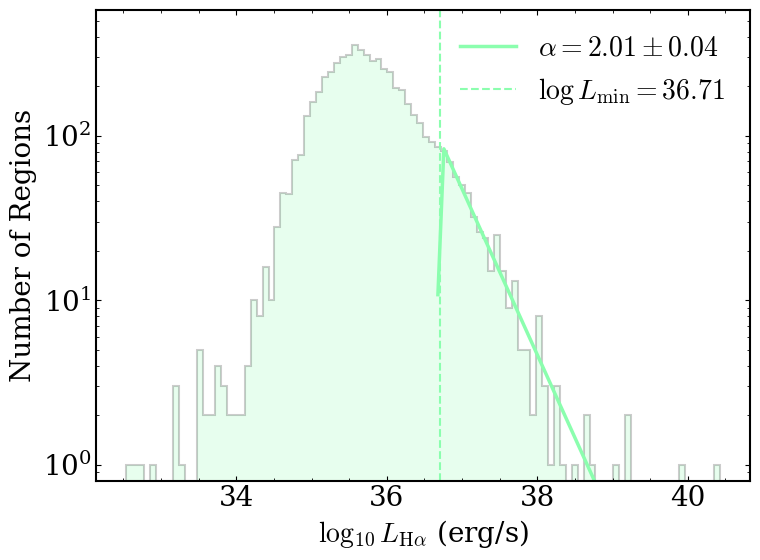

Wrote 400 auto-generated commands: PAPER_PLOTS/summed_map/dig_subtracted/catalog_numbers.tex
Wrote 400 auto-generated commands: PAPER_PLOTS/summed_map/dig_subtracted/paper_numbers.tex


(PosixPath('PAPER_PLOTS/summed_map/dig_subtracted/catalog_numbers.tex'),
 PosixPath('PAPER_PLOTS/summed_map/dig_subtracted/paper_numbers.tex'))

In [53]:
def empirical_cdf(sorted_x):
    n = len(sorted_x)
    return np.arange(1, n + 1) / n

def model_cdf_continuous_powerlaw(x, xmin, alpha):
    # valid for x >= xmin, alpha > 1
    return 1.0 - (x / xmin) ** (1.0 - alpha)

def ks_statistic_continuous_powerlaw(sorted_x, xmin, alpha):
    F_emp = empirical_cdf(sorted_x)
    F_model = model_cdf_continuous_powerlaw(sorted_x, xmin, alpha)
    return np.max(np.abs(F_emp - F_model))

def mle_alpha_continuous_powerlaw(x_tail, xmin):
    """
    Closed-form MLE for continuous power law:
        p(x) = (alpha-1) xmin^(alpha-1) x^(-alpha), x >= xmin
    """
    n = len(x_tail)
    s = np.sum(np.log(x_tail / xmin))
    if s <= 0:
        return np.nan
    return 1.0 + n / s

def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ------------------------------------------------------------
# Fast Santoro / Clauset fit
# ------------------------------------------------------------
def santoro_powerlaw_fit_fast(
    L,
    alpha_range=(1.0, 3.0),
    xmin_stride=1,
    min_tail_n=30,
    n_bootstrap=1000,
    random_seed=42,
    verbose=True
):
    """
    Santoro+2022 / Clauset+2009-style unbinned power-law fit:
    - candidate xmin from empirical points within median ± 1 sigma
    - alpha from the continuous-power-law MLE at each candidate xmin
    - choose best model by minimum KS
    - optional bootstrap for xmin uncertainty

    Parameters
    ----------
    L : array-like
        Linear luminosities.
    alpha_range : tuple
        Allowed range of alpha, e.g. (1.0, 3.0)
    xmin_stride : int
        Test every xmin_stride-th candidate xmin. Use 1 for the Santoro-style empirical-point search.
    min_tail_n : int
        Minimum number of points above xmin.
    n_bootstrap : int
        Number of bootstrap runs used for the xmin uncertainty.
    """
    rng = np.random.default_rng(random_seed)

    L = np.asarray(L, dtype=float)
    L = L[np.isfinite(L)]
    L = L[L > 0]
    L = np.sort(L)

    if len(L) < min_tail_n:
        raise ValueError("Not enough positive luminosities.")

    alpha_min, alpha_max = alpha_range

    # search window for xmin
    med = np.median(L)
    sig = np.std(L, ddof=1)
    xmin_lo = med - sig
    xmin_hi = med + sig

    xmin_candidates = np.unique(L[(L >= xmin_lo) & (L <= xmin_hi)])
    if len(xmin_candidates) == 0:
        raise ValueError("No xmin candidates found in median ± 1 sigma range.")

    # stride for speed
    xmin_candidates = xmin_candidates[::xmin_stride]

    best = None
    fit_rows = []

    # Because L is sorted, we can use searchsorted instead of repeated masking
    for xmin in xmin_candidates:
        i0 = np.searchsorted(L, xmin, side='left')
        x_tail = L[i0:]
        n_tail = len(x_tail)

        if n_tail < min_tail_n:
            continue

        alpha = mle_alpha_continuous_powerlaw(x_tail, xmin)
        if not np.isfinite(alpha):
            continue
        if not (alpha_min <= alpha <= alpha_max):
            continue

        ks = ks_statistic_continuous_powerlaw(x_tail, xmin, alpha)

        row = {
            "xmin": xmin,
            "alpha": alpha,
            "ks": ks,
            "n_tail": n_tail
        }
        fit_rows.append(row)

        if (best is None) or (ks < best["ks"]):
            best = row

    if best is None:
        raise ValueError("No valid fit found. Try decreasing xmin_stride or min_tail_n.")

    # --------------------------------------------------------
    # bootstrap xmin uncertainty
    # --------------------------------------------------------
    bootstrap_xmins = []
    bootstrap_alphas = []

    if n_bootstrap > 0:
        for _ in range(n_bootstrap):
            Lb = rng.choice(L, size=len(L), replace=True)
            Lb.sort()

            med_b = np.median(Lb)
            sig_b = np.std(Lb, ddof=1)
            xmin_lo_b = med_b - sig_b
            xmin_hi_b = med_b + sig_b

            xmin_candidates_b = np.unique(Lb[(Lb >= xmin_lo_b) & (Lb <= xmin_hi_b)])
            xmin_candidates_b = xmin_candidates_b[::xmin_stride]

            best_b = None
            for xmin_b in xmin_candidates_b:
                i0_b = np.searchsorted(Lb, xmin_b, side='left')
                x_tail_b = Lb[i0_b:]
                n_tail_b = len(x_tail_b)

                if n_tail_b < min_tail_n:
                    continue

                alpha_b = mle_alpha_continuous_powerlaw(x_tail_b, xmin_b)
                if not np.isfinite(alpha_b):
                    continue
                if not (alpha_min <= alpha_b <= alpha_max):
                    continue

                ks_b = ks_statistic_continuous_powerlaw(x_tail_b, xmin_b, alpha_b)

                if (best_b is None) or (ks_b < best_b["ks"]):
                    best_b = {"xmin": xmin_b, "alpha": alpha_b, "ks": ks_b}

            if best_b is not None:
                bootstrap_xmins.append(best_b["xmin"])
                bootstrap_alphas.append(best_b["alpha"])

    bootstrap_xmins = np.array(bootstrap_xmins)
    bootstrap_alphas = np.array(bootstrap_alphas)

    xmin_err = np.std(bootstrap_xmins, ddof=1) if len(bootstrap_xmins) > 1 else np.nan

    if verbose:
        print("Fast Santoro/Clauset fit")
        print(f"N total           = {len(L)}")
        print(f"Best xmin         = {best['xmin']:.3e}")
        print(f"Best alpha        = {best['alpha']:.4f}")
        print(f"Best KS           = {best['ks']:.4f}")
        print(f"N above xmin      = {best['n_tail']}")
        print(f"xmin uncertainty  = {xmin_err:.3e}")
        print(f"Candidates tested = {len(fit_rows)}")

    return {
        "L": L,
        "xmin_best": best["xmin"],
        "alpha_best": best["alpha"],
        "ks_best": best["ks"],
        "n_tail_best": best["n_tail"],
        "xmin_err": xmin_err,
        "bootstrap_xmins": bootstrap_xmins,
        "bootstrap_alphas": bootstrap_alphas,
        "fit_rows": fit_rows,
        "xmin_search_range": (xmin_lo, xmin_hi),
    }

# ------------------------------------------------------------
# Optional alpha uncertainty from likelihood curve at best xmin
# This part is cheap because it's only done once.
# ------------------------------------------------------------
def alpha_uncertainty_from_likelihood(
    L, xmin, alpha_best, alpha_range=(1.0, 3.0), n_alpha_grid=400
):
    x_tail = np.sort(L[L >= xmin])
    alpha_grid = np.linspace(alpha_range[0], alpha_range[1], n_alpha_grid)

    n = len(x_tail)
    sum_logx = np.sum(np.log(x_tail))
    log_xmin = np.log(xmin)

    # vectorized log-likelihood
    # logL = n*log(alpha-1) + n*(alpha-1)*log(xmin) - alpha*sum(log x)
    valid = alpha_grid > 1
    logL = np.full_like(alpha_grid, -np.inf, dtype=float)
    a = alpha_grid[valid]
    logL[valid] = n * np.log(a - 1.0) + n * (a - 1.0) * log_xmin - a * sum_logx

    rel_like = np.exp(logL - np.nanmax(logL))

    peak_mask = rel_like > 0.05
    x_fit = alpha_grid[peak_mask]
    y_fit = rel_like[peak_mask]

    if len(x_fit) < 5:
        x_fit = alpha_grid[valid]
        y_fit = rel_like[valid]

    p0 = [1.0, alpha_best, 0.1]
    bounds = ([0.0, alpha_range[0], 1e-4], [np.inf, alpha_range[1], 10.0])

    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=p0, bounds=bounds, maxfev=10000)
        sigma_alpha = popt[2]
    except Exception:
        w = rel_like[valid] / np.sum(rel_like[valid])
        mu = np.sum(w * alpha_grid[valid])
        sigma_alpha = np.sqrt(np.sum(w * (alpha_grid[valid] - mu)**2))
        popt = None

    return sigma_alpha, alpha_grid, rel_like, popt

# ------------------------------------------------------------
# Visualization: overplot unbinned fit on histogram
# ------------------------------------------------------------
def plot_histogram_with_unbinned_powerlaw_fit(results, bins=30, outfile=None):
    L = results["L"]
    xmin = results["xmin_best"]
    alpha = results["alpha_best"]

    logL = np.log10(L)
    counts, edges = np.histogram(logL, bins=bins)
    centers = 0.5 * (edges[:-1] + edges[1:])

    n_tail = np.sum(L >= xmin)
    L_edges = 10**edges

    model_counts = np.full_like(counts, np.nan, dtype=float)

    for i in range(len(counts)):
        L1 = L_edges[i]
        L2 = L_edges[i + 1]

        if L2 <= xmin:
            continue

        L1_eff = max(L1, xmin)
        prob = (xmin ** (alpha - 1.0)) * (L1_eff ** (1.0 - alpha) - L2 ** (1.0 - alpha))
        model_counts[i] = n_tail * prob

    plt.figure(figsize=(8, 6))
    plt.hist(logL, bins=bins, color=color_dic['L_Ha_sum_dered'], alpha = 0.2, edgecolor='k', histtype='stepfilled', linewidth=1.5)
    plt.plot(centers, model_counts, lw=2.5, color= color_dic['L_Ha_sum_dered'],
             label=fr'$\alpha={alpha:.2f} \pm {sigma_alpha:.2f}$')
    plt.axvline(np.log10(xmin), color=color_dic['L_Ha_sum_dered'], ls='--', lw=1.5,
                label=fr'$\log L_{{\min}}={np.log10(xmin):.2f}$')

    plt.xlabel(r'$\log_{10} L_{\mathrm{H}\alpha}$ (erg/s)')
    plt.ylabel('Number of Regions')
    plt.yscale('log')
    plt.minorticks_on()
    plt.legend(frameon=False)
    plt.ylim(0.8,)
    plt.tight_layout()

    if outfile is not None:
        plt.savefig(outfile, dpi=300, bbox_inches='tight')
    plt.show()

L = np.asarray(cat['L_Ha_sum_dered'], dtype=float)

luminosity_function_results = santoro_powerlaw_fit_fast(
    L,
    alpha_range=(0.0, 3.0),
    xmin_stride=10,   # bigger = faster
    min_tail_n=30,
    n_bootstrap=10,    # keep at 0 while testing
    verbose=True
)

sigma_alpha, alpha_grid, rel_like, gfit = alpha_uncertainty_from_likelihood(
    luminosity_function_results["L"],
    luminosity_function_results["xmin_best"],
    luminosity_function_results["alpha_best"],
    alpha_range=(1.0, 3.0),
    n_alpha_grid=400
)

print(f"alpha uncertainty ~ {sigma_alpha:.3f}")

plot_histogram_with_unbinned_powerlaw_fit(
    luminosity_function_results,
    bins=100,
    
    outfile=str(paper_plot_path('M33_HII_hist_with_fast_unbinned_powerlaw_fit.png', subdir='luminosity_function'))
)

# Finalize the auto-generated Overleaf numbers after the radial and luminosity fits.
for fit_name, fit_results in radial_gradient_fit_results.items():
    add_fit_values(values, formats, fit_results.get('point_fit_stats'), fit_name)
    add_fit_values(values, formats, fit_results.get('binned_fit_stats'), f'{fit_name}Bins')

values['luminosityFunctionAlpha'] = luminosity_function_results['alpha_best']
values['luminosityFunctionAlphaErr'] = sigma_alpha
values['luminosityFunctionSlope'] = -luminosity_function_results['alpha_best']
values['luminosityFunctionSlopeErr'] = sigma_alpha
values['luminosityFunctionLogLmin'] = np.log10(luminosity_function_results['xmin_best'])
values['luminosityFunctionKSDistance'] = luminosity_function_results['ks_best']
values['luminosityFunctionNTail'] = luminosity_function_results['n_tail_best']
if {'has_snr_in_boundary', 'has_wr_in_boundary'}.issubset(cat.columns):
    snr_hosts = cat['has_snr_in_boundary'].fillna(False).astype(bool)
    wr_hosts = cat['has_wr_in_boundary'].fillna(False).astype(bool)
    values['nRegionsContainingSNR'] = int(snr_hosts.sum())
    values['nRegionsContainingWR'] = int(wr_hosts.sum())
    values['nRegionsContainingSNRAndWR'] = int((snr_hosts & wr_hosts).sum())
    values['nRegionsContainingSNROrWR'] = int((snr_hosts | wr_hosts).sum())
if 'has_pn_in_boundary' in cat.columns:
    pn_hosts = cat['has_pn_in_boundary'].fillna(False).astype(bool)
    values['nRegionsContainingPN'] = int(pn_hosts.sum())
if 'n_pn_in_boundary' in cat.columns:
    values['nCrossMatchedPN'] = int(pd.to_numeric(cat['n_pn_in_boundary'], errors='coerce').fillna(0).sum())
formats.update({
    'luminosityFunctionAlpha': '.4f',
    'luminosityFunctionAlphaErr': '.4f',
    'luminosityFunctionSlope': '.4f',
    'luminosityFunctionSlopeErr': '.4f',
    'luminosityFunctionLogLmin': '.3f',
    'luminosityFunctionKSDistance': '.4f',
})

add_halpha_flux_partition_values(values, formats)
write_number_command_files(
    values,
    formats,
    message=f'Wrote {len(values)} auto-generated commands',
)

Fast Santoro/Clauset fit
N total           = 4578
Best xmin         = 6.598e+36
Best alpha        = 2.1258
Best KS           = 0.0320
N above xmin      = 341
xmin uncertainty  = 2.576e+36
Candidates tested = 4413
Star-forming SNR>3 alpha uncertainty ~ 0.061


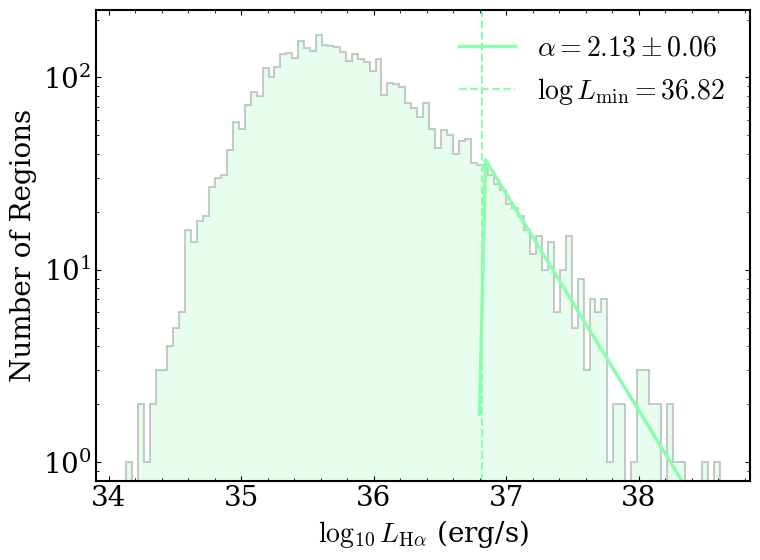

Rewrote number commands with unsuffixed fit commands from the star-forming SNR>3 sample and All-suffixed commands from the full catalog: PAPER_PLOTS/summed_map/dig_subtracted/catalog_numbers.tex
Rewrote number commands with unsuffixed fit commands from the star-forming SNR>3 sample and All-suffixed commands from the full catalog: PAPER_PLOTS/summed_map/dig_subtracted/paper_numbers.tex


{'bin_centers': array([  12.92446596,   20.48389812,   32.46479069,   51.45322575,
          81.54786722,  129.24465962,  204.8389812 ,  324.64790685,
         514.53225752,  815.47867224, 1292.44659623, 2048.38981199,
        3246.47906852, 5145.32257517, 8154.7867224 ]),
 'medians': array([9.40243001e+35, 7.75229786e+35, 8.29380307e+35, 1.02376905e+36,
        6.70170860e+35, 5.51935133e+35, 5.84410607e+35, 4.00027754e+35,
        2.56340761e+35, 2.21802782e+35, 1.40491552e+36,            nan,
                   nan,            nan,            nan]),
 'lower_errs': array([2.66438686e+35, 2.45774962e+35, 2.74307516e+35, 2.75221524e+35,
        2.38252472e+35, 2.32765320e+35, 1.95313164e+35, 1.53641620e+35,
        1.16046871e+35, 8.97591510e+34, 6.17718026e+35,            nan,
                   nan,            nan,            nan]),
 'upper_errs': array([5.41561009e+36, 4.47746087e+36, 4.76075161e+36, 5.06853170e+36,
        3.31962725e+36, 2.46427562e+36, 2.72823722e+36, 1.70236805e

In [54]:
# Luminosity function for the star-forming, high-SNR subset.
if 'luminosity_function_pdf_points' not in globals():
    def luminosity_function_pdf_points(logL, bins):
        logL = np.asarray(logL, dtype=float)
        logL = logL[np.isfinite(logL)]
        if len(logL) == 0:
            return np.array([]), np.array([]), np.array([])
        counts, edges = np.histogram(logL, bins=bins)
        centers = 0.5 * (edges[:-1] + edges[1:])
        widths = np.diff(edges)
        pdf = counts / (np.sum(counts) * widths)
        detected = counts > 0
        return centers[detected], pdf[detected], counts[detected]
if 'logL_bins' not in globals():
    logL_bins = np.arange(33.0, 40.6, 0.2)
sf_logL = pd.to_numeric(cat_starforming_snrthree['log_L_Ha_sum_dered'], errors='coerce').to_numpy(dtype=float)
sf_logL = sf_logL[np.isfinite(sf_logL)]
fig, ax = plt.subplots(figsize=(8, 6))
centers, pdf, counts = luminosity_function_pdf_points(sf_logL, logL_bins)
if len(centers) > 0:
    ax.plot(
        centers,
        pdf,
        marker='o',
        markersize=6,
        linewidth=2.5,
        color=color_dic['L_Ha_sum_dered'],
        label=f'Selected SF, S/N>3 (N={len(sf_logL)})',
    )
ax.set_xlabel(r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]')
ax.set_ylabel(r'Probability density per dex')
ax.set_yscale('log')
ax.minorticks_on()
ax.legend(frameon=False, fontsize=12)
fig.tight_layout()
fig.savefig(
    sf_plot_path('M33_HII_Halpha_luminosity_function_pdf.png', subdir='luminosity_functions'),
    dpi=300,
    bbox_inches='tight',
)
plt.close(fig)

sf_L = pd.to_numeric(cat_starforming_snrthree['L_Ha_sum_dered'], errors='coerce').to_numpy(dtype=float)
# Santoro+2022 / Clauset+2009 LF fit for the star-forming sample:
# test every empirical Lmin in median ±1 sigma, restrict alpha to 1-3,
# and bootstrap Lmin uncertainty with 1000 mock LFs.
sf_luminosity_function_results = santoro_powerlaw_fit_fast(
    sf_L,
    alpha_range=(1.0, 3.0),
    xmin_stride=1,
    min_tail_n=30,
    n_bootstrap=1000,
    verbose=True,
)
sf_sigma_alpha, sf_alpha_grid, sf_rel_like, sf_gfit = alpha_uncertainty_from_likelihood(
    sf_luminosity_function_results['L'],
    sf_luminosity_function_results['xmin_best'],
    sf_luminosity_function_results['alpha_best'],
    alpha_range=(1.0, 3.0),
    n_alpha_grid=400,
)
print(f'Star-forming SNR>3 alpha uncertainty ~ {sf_sigma_alpha:.3f}')

_sigma_alpha_full_catalog = sigma_alpha
try:
    sigma_alpha = sf_sigma_alpha
    plot_histogram_with_unbinned_powerlaw_fit(
        sf_luminosity_function_results,
        bins=100,
        outfile=str(sf_plot_path(
            'M33_HII_hist_with_fast_unbinned_powerlaw_fit.png',
            subdir='luminosity_function',
        )),
    )
finally:
    sigma_alpha = _sigma_alpha_full_catalog

# Rewrite the Overleaf numbers so unsuffixed fit commands refer to the
# star-forming SNR>3 sample, and all-catalog fit commands carry an All suffix.
def add_fit_values_with_suffix(values, formats, fit, prefix, suffix='All', fmt='.4f'):
    if not fit:
        return
    keys = {
        'slope': f'{prefix}Slope{suffix}',
        'intercept': f'{prefix}Intercept{suffix}',
        'slope_stderr': f'{prefix}SlopeErr{suffix}',
        'intercept_stderr': f'{prefix}InterceptErr{suffix}',
        'n_points': f'{prefix}N{suffix}',
    }
    for source, command in keys.items():
        if source not in fit:
            continue
        values[command] = fit[source]
        if source != 'n_points':
            formats[command] = fmt

for fit_name, fit_results in all_catalog_radial_gradient_fit_results.items():
    add_fit_values_with_suffix(values, formats, fit_results.get('point_fit_stats'), fit_name, suffix='All')
    add_fit_values_with_suffix(values, formats, fit_results.get('binned_fit_stats'), fit_name, suffix='BinsAll')

def clear_fit_values(values, formats, prefix):
    for suffix in ['Slope', 'Intercept', 'SlopeErr', 'InterceptErr', 'N']:
        values.pop(f'{prefix}{suffix}', None)
        formats.pop(f'{prefix}{suffix}', None)

for fit_name in all_catalog_radial_gradient_fit_results:
    clear_fit_values(values, formats, fit_name)
    clear_fit_values(values, formats, f'{fit_name}Bins')

for fit_name, fit_results in radial_gradient_fit_results.items():
    add_fit_values(values, formats, fit_results.get('point_fit_stats'), fit_name)
    add_fit_values(values, formats, fit_results.get('binned_fit_stats'), f'{fit_name}Bins')

# Preserve full-catalog luminosity-function values with an All suffix.
values['luminosityFunctionAlphaAll'] = luminosity_function_results['alpha_best']
values['luminosityFunctionAlphaErrAll'] = sigma_alpha
values['luminosityFunctionSlopeAll'] = -luminosity_function_results['alpha_best']
values['luminosityFunctionSlopeErrAll'] = sigma_alpha
values['luminosityFunctionLogLminAll'] = np.log10(luminosity_function_results['xmin_best'])
values['luminosityFunctionLogLminErrAll'] = luminosity_function_results['xmin_err'] / (luminosity_function_results['xmin_best'] * np.log(10.0))
values['luminosityFunctionKSDistanceAll'] = luminosity_function_results['ks_best']
values['luminosityFunctionNTailAll'] = luminosity_function_results['n_tail_best']

# Use the current unsuffixed luminosity-function names for the star-forming SNR>3 sample.
values['luminosityFunctionAlpha'] = sf_luminosity_function_results['alpha_best']
values['luminosityFunctionAlphaErr'] = sf_sigma_alpha
values['luminosityFunctionSlope'] = -sf_luminosity_function_results['alpha_best']
values['luminosityFunctionSlopeErr'] = sf_sigma_alpha
values['luminosityFunctionLogLmin'] = np.log10(sf_luminosity_function_results['xmin_best'])
values['luminosityFunctionLogLminErr'] = sf_luminosity_function_results['xmin_err'] / (sf_luminosity_function_results['xmin_best'] * np.log(10.0))
values['luminosityFunctionKSDistance'] = sf_luminosity_function_results['ks_best']
values['luminosityFunctionNTail'] = sf_luminosity_function_results['n_tail_best']

formats.update({
    'luminosityFunctionAlpha': '.4f',
    'luminosityFunctionAlphaErr': '.4f',
    'luminosityFunctionSlope': '.4f',
    'luminosityFunctionSlopeErr': '.4f',
    'luminosityFunctionLogLmin': '.3f',
    'luminosityFunctionLogLminErr': '.3f',
    'luminosityFunctionKSDistance': '.4f',
    'luminosityFunctionAlphaAll': '.4f',
    'luminosityFunctionAlphaErrAll': '.4f',
    'luminosityFunctionSlopeAll': '.4f',
    'luminosityFunctionSlopeErrAll': '.4f',
    'luminosityFunctionLogLminAll': '.3f',
    'luminosityFunctionLogLminErrAll': '.3f',
    'luminosityFunctionKSDistanceAll': '.4f',
})

add_halpha_flux_partition_values(values, formats)
write_number_command_files(
    values,
    formats,
    message=(
        'Rewrote number commands with unsuffixed fit commands from the '
        'star-forming SNR>3 sample and All-suffixed commands from the full catalog'
    ),
)


# Luminosity versus electron density for the star-forming, high-SNR subset.
sf_lha_ne_mask = (
    np.isfinite(cat_starforming_snrthree['L_Ha_sum_dered']) &
    np.isfinite(cat_starforming_snrthree['ne_SII_cm3']) &
    cat_starforming_snrthree['ne_SII_reliable'].fillna(False) &
    (cat_starforming_snrthree['ne_SII_cm3'] > 10) &
    (cat_starforming_snrthree['ne_SII_cm3'] < 10000) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] > 1e34) &
    (cat_starforming_snrthree['L_Ha_sum_dered'] < 1e40)
)
plot_radial_gradient(
    cat=cat_starforming_snrthree,
    xcol='ne_SII_cm3',
    ycol='L_Ha_sum_dered',
    mask=sf_lha_ne_mask,
    bins=np.logspace(1, 4, 16),
    color=color_dic['ne_SII_cm3'],
    xlabel=r'$n_e$ (cm$^{-3}$ )',
    ylabel=r'$L_{\rm H\alpha}$ (erg s$^{-1}$)',
    xscale='log',
    yscale='log',
    fit_bins=False,
    alpha=0.2,
    fit_logx_points=True,
    fit_logy_points=True,
    fit_equation_x=r'n_e',
    fit_equation_y=r'L_{\rm H\alpha}',
    fit_name='scalingNeLHa',
    savepath=str(sf_plot_path('M33_HII_L_Ha_sum_dered_vs_ne_SII_cm3.png', subdir='scaling_relations')),
    show=False,
)


In [55]:
# Empirical-PDF luminosity function comparison for star-forming, high-SNR regions.
# This keeps the default final-correction LF plot above unchanged.

def _starforming_lf_matched_catalog(source_df, reference_df=cat_starforming_snrthree):
    source_df = source_df.copy()
    if {'field', 'region_id'}.issubset(source_df.columns) and {'field', 'region_id'}.issubset(reference_df.columns):
        keys = reference_df[['field', 'region_id']].drop_duplicates()
        return source_df.merge(keys, on=['field', 'region_id'], how='inner')

    fallback_mask = selected_star_forming_snr_mask(source_df, snr_cut=3.0)
    return source_df.loc[fallback_mask].copy().reset_index(drop=True)


def _positive_luminosities(df, column):
    values = pd.to_numeric(df[column], errors='coerce').to_numpy(dtype=float)
    return values[np.isfinite(values) & (values > 0)]


def _powerlaw_pdf_per_dex(logL_grid, fit_results):
    alpha = fit_results['alpha_best']
    xmin = fit_results['xmin_best']
    n_total = len(fit_results['L'])
    n_tail = fit_results['n_tail_best']
    L_grid = 10.0 ** np.asarray(logL_grid, dtype=float)
    pdf = np.full_like(L_grid, np.nan, dtype=float)
    tail = L_grid >= xmin
    tail_fraction = n_tail / n_total
    pdf[tail] = (
        tail_fraction *
        np.log(10.0) *
        (alpha - 1.0) *
        (xmin ** (alpha - 1.0)) *
        (L_grid[tail] ** (1.0 - alpha))
    )
    return pdf


def _fit_starforming_lf_for_comparison(L, label):
    results = santoro_powerlaw_fit_fast(
        L,
        alpha_range=(1.0, 3.0),
        xmin_stride=1,
        min_tail_n=30,
        n_bootstrap=1000,
        verbose=False,
    )
    sigma_alpha, alpha_grid, rel_like, gfit = alpha_uncertainty_from_likelihood(
        results['L'],
        results['xmin_best'],
        results['alpha_best'],
        alpha_range=(1.0, 3.0),
        n_alpha_grid=400,
    )
    results['alpha_err'] = sigma_alpha
    results['label'] = label
    return results


cat_nodig_sf_lf = _starforming_lf_matched_catalog(cat_nodig)
cat_digsub_sf_lf = _starforming_lf_matched_catalog(cat_digsub)

sf_lf_comparison_specs = [
    dict(
        label='Before extinction and DIG correction',
        data=cat_nodig_sf_lf,
        luminosity_col='L_Ha_sum',
        color='0.55',
        marker='o',
        linestyle='-',
    ),
    dict(
        label='After extinction correction, before DIG correction',
        data=cat_nodig_sf_lf,
        luminosity_col='L_Ha_sum_dered',
        color='black',
        marker='s',
        linestyle='-',
    ),
    dict(
        label='After extinction and DIG correction',
        data=cat_digsub_sf_lf,
        luminosity_col='L_Ha_sum_dered',
        color=color_dic['L_Ha_sum_dered'],
        marker='^',
        linestyle='-',
    ),
]

fig, ax = plt.subplots(figsize=(9.2, 6.8))
comparison_fit_results = {}

for spec in sf_lf_comparison_specs:
    L_values = _positive_luminosities(spec['data'], spec['luminosity_col'])
    logL_values = np.log10(L_values)
    centers, pdf, counts = luminosity_function_pdf_points(logL_values, logL_bins)
    if len(centers) == 0:
        print(f"Skipping {spec['label']}: no finite luminosities")
        continue

    fit_results = _fit_starforming_lf_for_comparison(L_values, spec['label'])
    comparison_fit_results[spec['label']] = fit_results
    alpha = fit_results['alpha_best']
    alpha_err = fit_results['alpha_err']
    slope = -alpha
    log_lmin = np.log10(fit_results['xmin_best'])
    log_lmin_err = fit_results['xmin_err'] / (fit_results['xmin_best'] * np.log(10.0))

    label = (
        f"{spec['label']}\n"
        rf"$\alpha={alpha:.2f}\pm{alpha_err:.2f}$, slope$={slope:.2f}$, "
        rf"$\log L_{{\min}}={log_lmin:.2f}\pm{log_lmin_err:.2f}$"
    )
    ax.plot(
        centers,
        pdf,
        marker=spec['marker'],
        markersize=5.5,
        linewidth=2.0,
        linestyle=spec['linestyle'],
        color=spec['color'],
        label=label,
    )

    fit_logL = np.linspace(log_lmin, max(np.nanmax(centers), log_lmin + 0.2), 200)
    ax.plot(
        fit_logL,
        _powerlaw_pdf_per_dex(fit_logL, fit_results),
        color=spec['color'],
        linestyle='--',
        linewidth=1.8,
        alpha=0.9,
    )
    ax.axvline(
        log_lmin,
        color=spec['color'],
        linestyle=':',
        linewidth=1.8,
        alpha=0.9,
    )

ax.set_xlabel(r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]')
ax.set_ylabel('Empirical PDF per dex')
ax.set_yscale('log')
ax.minorticks_on()
ax.legend(frameon=False, fontsize=9.2, loc='best')
fig.tight_layout()
lf_correction_comparison_path = sf_plot_path(
    'M33_HII_Halpha_luminosity_function_correction_comparison_empirical_pdf.png',
    subdir='luminosity_functions',
)
fig.savefig(
    lf_correction_comparison_path,
    dpi=300,
    bbox_inches='tight',
)
save_for_paper(lf_correction_comparison_path, 'M33_LF_slopes.png')
plt.close(fig)


Saved paper draft figure: /Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/PAPER_PLOTS_DRAFT1/M33_LF_slopes.png


In [56]:
# Diagnostic LF split at log L_Halpha = 38.6 for final corrected star-forming regions.
# The high-luminosity side has very few regions in the current catalog, so the fit is guarded.

lf_split_logL = 38.6
lf_split_L = 10.0 ** lf_split_logL

if 'cat_digsub_sf_lf' not in globals():
    cat_digsub_sf_lf = _starforming_lf_matched_catalog(cat_digsub)

final_sf_L = _positive_luminosities(cat_digsub_sf_lf, 'L_Ha_sum_dered')
lf_split_samples = [
    dict(
        label=rf'$L_{{\rm H\alpha}} \leq 10^{{{lf_split_logL:.1f}}}$',
        L=final_sf_L[final_sf_L <= lf_split_L],
        color=color_dic['L_Ha_sum_dered'],
        marker='o',
    ),
    dict(
        label=rf'$L_{{\rm H\alpha}} > 10^{{{lf_split_logL:.1f}}}$',
        L=final_sf_L[final_sf_L > lf_split_L],
        color='forestgreen',
        marker='s',
    ),
]

fig, ax = plt.subplots(figsize=(8.8, 6.6))
lf_split_fit_results = {}
min_tail_n_split = 30

for sample in lf_split_samples:
    L_values = sample['L']
    logL_values = np.log10(L_values[np.isfinite(L_values) & (L_values > 0)])
    centers, pdf, counts = luminosity_function_pdf_points(logL_values, logL_bins)
    if len(centers) == 0:
        ax.plot([], [], color=sample['color'], marker=sample['marker'], label=f"{sample['label']} (N=0)")
        continue

    fit_results = None
    fit_label = f"{sample['label']} (N={len(logL_values)})"
    if len(L_values) >= min_tail_n_split:
        try:
            fit_results = santoro_powerlaw_fit_fast(
                L_values,
                alpha_range=(1.0, 3.0),
                xmin_stride=1,
                min_tail_n=min_tail_n_split,
                n_bootstrap=1000,
                verbose=False,
            )
            sigma_alpha, alpha_grid, rel_like, gfit = alpha_uncertainty_from_likelihood(
                fit_results['L'],
                fit_results['xmin_best'],
                fit_results['alpha_best'],
                alpha_range=(1.0, 3.0),
                n_alpha_grid=400,
            )
            fit_results['alpha_err'] = sigma_alpha
            lf_split_fit_results[sample['label']] = fit_results
            fit_label += rf"; $\alpha={fit_results['alpha_best']:.2f}\pm{sigma_alpha:.2f}$, slope$={-fit_results['alpha_best']:.2f}$"
        except ValueError as exc:
            fit_label += f"; Santoro fit unavailable ({exc})"
    else:
        fit_label += rf"; Santoro fit unavailable ($N<{min_tail_n_split}$)"

    ax.plot(
        centers,
        pdf,
        marker=sample['marker'],
        markersize=6,
        linewidth=2.2,
        color=sample['color'],
        label=fit_label,
    )

    if fit_results is not None:
        log_lmin = np.log10(fit_results['xmin_best'])
        fit_logL = np.linspace(log_lmin, max(np.nanmax(centers), log_lmin + 0.2), 200)
        ax.plot(
            fit_logL,
            _powerlaw_pdf_per_dex(fit_logL, fit_results),
            color=sample['color'],
            linestyle='--',
            linewidth=1.8,
            alpha=0.9,
        )
        ax.axvline(
            log_lmin,
            color=sample['color'],
            linestyle=':',
            linewidth=1.8,
            alpha=0.9,
        )

ax.axvline(lf_split_logL, color='0.25', linestyle='-', linewidth=1.4, alpha=0.8, label=rf'Split: $\log L_{{\rm H\alpha}}={lf_split_logL:.1f}$')
ax.set_xlabel(r'log$_{10}$[$L_{\rm H\alpha}$ (erg s$^{-1}$)]')
ax.set_ylabel('Empirical PDF per dex')
ax.set_yscale('log')
ax.minorticks_on()
ax.legend(frameon=False, fontsize=9.2, loc='best')
fig.tight_layout()
fig.savefig(
    sf_plot_path('M33_HII_Halpha_luminosity_function_final_corrected_split_logL38p6_empirical_pdf.png', subdir='luminosity_functions'),
    dpi=300,
    bbox_inches='tight',
)
plt.close(fig)

for sample in lf_split_samples:
    print(f"{sample['label']}: N={len(sample['L'])}")


$L_{\rm H\alpha} \leq 10^{38.6}$: N=4577
$L_{\rm H\alpha} > 10^{38.6}$: N=1
